# Documentation for Hydra Multi-Asset Verification Test
ACTION_LIST = [['test_add', 'test_q_for_r', 'test_r_for_r','test_r_for_q', 'test_remove']]



## Model Description

The methodology for the tests is to create two universes - one for Hydra and one for Uniswap - to subsequently be able to represent sequences of actions on each side. As the Hydra system is unique in its design and has no counterpart yet for approprate comparisons the role of the benchmark will be fulfilled by assembling several Uniswaps together in a way that everything that can be done in Hydra can be accordingly reproduced. This allows next to compare the implications on both systems and ultimately assess the quantitative and qualitative differences of results and impacts on the Hydra system and its agents. 

This approach necessitates the definition and specification of two models:
   - 1 Hydra Omnipool model with one instance that is defined in line with the [Hydra Mathematical Specification](https://hackmd.io/M7OeWimITKGVxBDHGQa6gQ?view)
   - 1 Uniswap model with several instances that each are responsible for a particular mechanism
        - which of 1 instance is used for liquidity provision in asset $R_i$: this is modeled as a Uniswap of $R_i$ and $Q$
        - which of 1 instance is used for liquidity provision in asset $R_j$: this is modeled as a Uniswap of $R_j$ and $Q$
        - which of 1 instance is used for swaps between assets $R_i$ and $R_j$: this is modeled as a Uniswap of $R_i$ and $R_j$
        
![](https://i.imgur.com/yb6Zh3T.png)
        
## Test cases

A variety of testcases can be explored with this model resulting from a combination of the following parameters
   
   - Event: Add Liquidity, Remove Liquidity, Swap Asset, Swap Asset for Base
   - Asset: $R_i$, $R_j$, $R_k$, $Q$
   - Multiple Action Type: Alternating, $i$ only, $j$ only
   - Composite Action Type: Alternating, Trade Bias
   - Enable Symmetric Liquidity: True, False
    
In addition to these settings also a fee structure can be imposed:

   - Fixed Fee

## Test agents

The model specifies a number of eight agents that each have their local balances, can interact with the system and are modeled to be responsible for **one action only**. This allows to track for each testcase how the balances will develop and to show independently which events will trigger changes to local and global states. Most importantly directly and indirectly affected variables can be easily identified.

Two dataframes of agents are initialized identically for both the Uniswap and the Hydra world and then work their way through on each side according to the testcase. Afterwards the effects on both sides can be compared.

![](https://i.imgur.com/r9IAJMr.png)



## Composite Action Tests

Besides being able to test all mechanisms individually also compositions of actions can be performed. This means selecting and combining two from the above testcases and letting the respective agents take the actions repeadetly. A composition action test therefore is defined as two actions which each can be a combination of *event* and *asset* selected from the list of testcases above, for example:
- Add liquidity in $R_i$ and Add liquidity in $R_j$
- Add liquidity in $R_i$ and Swap $R_i$ for $Q$
- Remove liquidity in $R_j$ and Swap $R_i$ for $Q$
- ...

In total there would be 28 composit pairs which can be derived from this decision tree:
selecting any one of the four primitive mechanisms of: **trade in/out** or **add/remove liquidity** of some given asset and then the subsequent action could be the three remaining mechanisms of the same asset or doing anyone of the four mechanisms in another asset.  

These basic combinations can be explored before further proceeding with
- trade sizes,
- trade frequencies,
- randomization,...



## Introduction to Uniswap
>Uniswap is an automated market maker for exchanging ERC20 tokens. Anyone can become a liquidity provider, and invest in the liquidity pool of an ERC20 token. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://uniswap.io/

There are basically eight ways (_mechanisms_) in which an agent can interact with an instance of Uniswap (https://github.com/Uniswap/uniswap-v1/blob/master/contracts/uniswap_exchange.vy):
1. `addLiquidity`: deposit ETH and tokens in the liquidity pool; mint UNI tokens - "shares" of that Uniswap instance - in exchange;
1. `removeLiquidity`: burn UNI tokens; withdraw a proportional amount of ETH and tokens in exchange;
1. `ethToTokenInput`: user specifies an exact amount of ETH they send; receives corresponding amount of tokens
1. `ethToTokenOutput`: user sends some ETH and specifies an exact amount of tokens they want to buy; Uniswap refunds ETH sent in excess
1. `tokenToEthInput`: user specifies an exact amount of tokens they send; receives corresponding amount of ETH
1. `tokenToEthOutput`: user specifies an exact amount of ETH they want to buy; Uniswap takes the corresponding amount of tokens from the user account
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" (effectively a `tokenToEthInput` in instance A combined with a `ethToTokenInput` in instance B)
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Uniswap takes the corresponding amount of "token A" from the user account (effectively a `ethToTokenOutput` in instance B combined with a `tokenToEthOutput` in instance A)

## Limitations and simplifications of this model
* When triggering mechanisms, Uniswap users may include conditions they would like to apply to the transaction. For example, they could define a minimum amount of UNI tokens they wish to receive as a result of adding liquidity to the pool; or the maximum number of tokens they are willing to pay for the amount of ETH requested in a `tokenToEthOutput` operation; or a deadline after which the transaction should not be processed. **This simplified model does not account for this kind conditioning.**

* The `ethToTokenOutput`, `tokenToEthOutput` mechanisms are not implemented. **All swaps are treated as of the "input defined" type.**

* The `tokenToToken` mechanism are not implemented, as they are merely a `tokenToEth` in the context of a single Uniswap instance.

* **User _behavior_ has not been modeled**. User _actions_ are derived from the history of events of the Uniswap instance being analyzed.

## Introduction to Hydra
>Hydra is an automated market maker that generalizes the concept of Uniswap and Balancer to a) an arbitrary number of dimensions and b) a variant weight distaribution of assets in the pool that changes in accordance with action sequences in the pool. Anyone can become a liquidity provider, and invest in the 'Omnipool'. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://hydradx.io/

There is a predefined set of (_mechanisms_) in which an agent can interact with an the Hydra Protocol :
1. `addLiquidity`: deposit a risk asset in the omnipool; mint HDX tokens - "shares" of this risk asset - in exchange;
1. `removeLiquidity`: burn HDX tokens; withdraw a proportional amount of the risk asset in exchange;
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" 
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Hydra takes the corresponding amount of "token A" from the user account 



## Model File structure

The folder **model** contains:

 - a file config.py: 

    This file configures the simulation experiments by setting the number of monte carlo runs, the number of timesteps for the simulation and the simulation parameters. It also aggregates the partial states and the initial state variables.
    
    The purpose of this file is to *configure and initialize* the experiment.
    
    
 - a file partial_state_update_block.py

    This file defines each partial state update block individually. This feature allows cadCAD to divide each simulation timestep into several 'blocks' where different state variables are mutated conditioned upon the policy input.
    
    In the current setting 
    - the first block maps the user action to the appropriate mechanism in the uniswap world
    - the second block maps the user action to the appropriate mechanism in the hydra world
    - the third block resolves the quantities of HDX and weights in the hydra world
    - the forth block calculates the metrics: the swap prices in the uniswap world and the pool prices in the hydra world

    This file corresponds to the system specification diagram, where each column is one partial state update block 
    
    The purpose of this file is to *define* the sequence and details of state updates for each simulation timestep. The relevant mechanisms are imported from the files in the **parts** folder
    
    
 - a file plot_utils.py

    This file defines all plot functions that can be called in the jupyter notebook to visualize the results. In general there are three types of plots:
    - plots related to the uniswap world (do not contain the word 'hydra')
    - plots related to the hydra world (contain the word 'hydra')
    - general plots applicable to both worlds (f.e Impermanent Loss)

    It also can be distinguished between plots related to global system variables and local agent variables:
    - global variables (do not contain the word 'agent')
    - local variables (contain the word 'agent')

    The purpose of this file is to *define* the way how particular properties can be plotted over time.
    

 - a file run.py

    This file *defines* the run and postprocessing methods and is used to execute the simulation run:
    - run() is used to execute the simulation and create a dataframe
    - postprocessing is used to extract relevant metrics from the simulation output in the dataframe

     The purpose of this file is to *execute* the simulation and *create* metrics.
     
     
 - a file state_variables.py

    This file *sets* the number of agents and *defines* the local (agent-level) state variables, *sets* the number of assets and *defines* the global (system-state) variables of the system, *computes* the prices of the assets and *defines* the initial state object
    - the agent states describe their holdings of assets that agents have contributed to the pool or still hold outside as well as their quantities of shares they received for their contribution
    - the global states describe the quantities of assets in the system
    - price variables are computed from the states both in the uniswap and hydra world
    - the initial state object consists of 
        - two agent dataframes, one for each world respectively
        - two sets of global variables, one for each world respectively
        - prices for each world (? is pool = prices ?)

    The purpose of this file is to *define* the global and local states of the system.
    
    
 - a file sys_params.py

    This file *contains* the system parameters and allows to select items from a list for them. Following parameters can be defined:
    - trade action type
    - liquidity action type
    - multiple asset action type
    - composite action type
    - liquidity add type (symmetry)

    In addition the following is set
    - initial values for assets 
    - hard coded fee value
    - choice of the system parameters from the list above
    

 - a folder **parts** which itself contains general files relevant for both instances, files related specifically to Uniswap and files related specifically to Hydra 
      - [action.py](model/parts/action.py)
       This is an action dictionary which drives the model. As there are no behavioral assumptions in the model yet, currently actions are prescribed actions in testing mode derived from events. However, action schema respects https://www.kaggle.com/markusbkoch/uniswap-ethdai-exchange as much as possible, allowing for future analysis against uniswap transaction datasets.
        This file contains a function called 'actionDecoder' which takes its inputs from the file sys_params.py and maps those encoded events to agent actions. At first an arbitrary action dictionary is defined which then is adapted according to the choices of system parameters. In particular relevant are the parameter definitions of the asset, the composite and whether there is a trade or liquidity event defined.
        
    - [uniswap.py](model/parts/uniswap.py)
     Reads in action output and directs the action to the appropriate Uniswap mechanism for each corresponding Uniswap instance. Currently there are two instances in place, namely the R_i<>Q pair and the R_j<>Q pair. Both instances have their respective requisite state variables: UNI_Qx, UNI_Rx, and UNI_Sx.

    - [utils.py](model/parts/utils.py)
    Computes the state update for each Uniswap state variable and outputs the updated global state variables.
        
     - [agent_utils.py](model/parts/agent_utils.py)
     Computes the corresponding agent local state for each Uniswap agent resolving their action and outputs the updates local state variables.

      -  [hydra.py](model/prts/hydra.py)
     Reads in action output and directs the action to the appropriate Hydra mechanism for each state variable: Q, Sq, and pool.
    
      - [hydra_utils.py](model/parts/hydra_utils.py)
     Computes the state update for each Hydra state variable

    -  [asset_utils.py](model/parts/asset_utils.py)
     Computes the state update for each Reserve Asset in a Hydra Omnipool

    -  [hydra_agent_utils_class.py](model/parts/hydra_agent_utils_class.py)
     Computes the corresponding agent local state for each Hydra agent resolving their action and outputs the updates local state variables.
     
     #### The interrelations between the files are shown here:
     
    ![](https://i.imgur.com/mNhfQE4.png)



# Testcase Definition

#### Simulation Settings
- There are 100 timesteps for each simulation run
- Each testcase has 100 MC runs with different randomized variables
- Block 1 randomizes starting liquidity balances (explained below in section 'Block 1')



#### Agent Activities - Action Sequence

There are two agents acting during the simulation. The trading agent performs "R-for-R" trades of equal size but varying direction over most simulation timesteps. The liquidity agent provides liquidity to the pool at timestep 10 and removes the liquidity from the pool at timestep 90.

##### Trading agent

- One Agent performs random "R-for-R" trades during the simulation. 
- The direction of the trade is a random coin flip for each timestep.
- The size of the trade is fixed at $1000$ for each timestep.
- The agent does not act at timestep 10 nor timestep 90.

##### Liquidity agent

- One Agent provides liquidity in Asset "i" to the pool 
- He provides the liquidity at timestep 10
- He removes the liquidity at timestep 90
- He does not act at other timesteps

#### Block 1:

| #   |   Run   | a  | $\mu_i$ |          $\sigma_i$          | $\mu_j$ |          $\sigma_j$          | $\mu$ | $\sigma$ | Total runs         |
| --- |:-------:|:-------:|:-------:|:----------------------------:|:-------:|:----------------------------:| ----- | -------- | ------------------ |
| 1   | 001-100 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 2   | 101-200 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 3   | 201-300 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 4   | 301-400 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$  | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 5   | 401-500 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 6   | 501-600 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |

All tests in block 1 are performed as 100 **MonteCarlo Experiments** with the following randomization:
- The initial balances of the liquidity pools are drawn randomly for each MC run from the same lognormal distribution with $\mu_i$ and $\mu_j$ fixed at $100000$
    - The underlying mean for the lognormal liquidity draw is $\log{100000}$
    - The underlying standard deviation for the lognormal liquidity draw is $\sqrt{\log{1 + \frac{2000^2}{100000^2}}}$
- The action sequence of the agents is randomized in that sense that:
    - For each individual MC run the sequence is identical for the Uniswap and Hydra side of the model. For each timestep of the simulation exactly the same event takes place on both sides.
    - For each individual MC run the trading directions are randomized for each timestep. Therefore the event sequence for each run will be different.
    - For all MC runs the trading amount is always equal to $1000$




# Testcase in this notebook


This notebook documents the results of the following experiment:
- Settings from Block 1 as outlined above
- Testcases **2**, **4** and **6**
- Sweep over three values for $a \in \{0.5, 1, 1.5 \}$ with a fixed $\mu$-to-$\sigma$-ratio of $50$.

The experiment result dataframe is saved into a pickle file and analyzed throughout this notebook.

## Run Model

The following command lines import all packages, experiments and run the model 

This is the execution of cadcad. This writes the config object, does the execution and returns the rdf - which is a data object that shows the rows and columns of results in a dataframe

Here is one additional option as well. The postprocessing causes the index of the results to be every forth because of the cadcad architecture where the partial state updates are the substeps. With this option selected we see only the end of each timestep - the last substep. Therefore only final results are shown. To get a line for each substep the postprocessing needs to be deactivated. 

In [1]:
from model.config_wrapper import ConfigWrapper

from model import run_wrapper
from cadCAD import configs

# parametric_experiment = ConfigWrapper()
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']
# parametric_experiment.get_config()

running file: config_wrapper.py
end of file: config_wrapper.py
running file: run_wrapper.py
end of file: run_wrapper.py


In [2]:
# import model as model


In [3]:
# parametric_experiment = ConfigWrapper(model)


In [4]:
# del configs[:]

# parametric_experiment.append()

In [5]:
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']

In [6]:
# Dependences
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Experiments
from model import run
from model.parts.utils import *
from model.plot_utils import *

pd.options.display.float_format = '{:.2f}'.format

%matplotlib inline

# df = run.run()
# rdf = run.postprocessing(df)
# rdf = df # debugging substeps
# pd.set_option("mode.chained_assignment", None)


running file: run.py
running file: state_variables.py
running file: initialize_liquidity.py
end of file: initialize_liquidity.py
running file: asset_utils.py
end of file: asset_utils.py
end of file: state_variables.py
running file: partial_state_update_block.py
end of file: action_list.py
end of file: partial_state_update_block.py
running file: sim_setup.py
end of file: sim_setup.py
[100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 10000

Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'mod

Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'mod

Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 

Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class

Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model

Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_stat

Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_stat

config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001,

Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 

Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_stat

Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state

Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_stat

Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state

Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state

Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_stat

Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class

Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_stat

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'mod

Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_stat

config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 

Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state

Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'mod

Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'mod

Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_stat

Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <

Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <

Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model

Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_stat

Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <

Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <

Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_stat

Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 

Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'mod

Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state

Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_stat

Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <

Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state

Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_stat

Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_stat

Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_stat

Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 

Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'mod

Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <

Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_stat

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'mod

Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model

Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 

In [7]:
(data, tensor_field, sessions) = run_wrapper.run(drop_midsteps=True)

experiments = data



                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 100
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 11, 22)
Execution Method: local_simulations
SimIDs   : [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 16, 16, 16, 16,

addliq - Sq delta Sq 4847.7511747645685
addliq - Sq delta S 4847.7511747645685
POOL ADD LIQUIDITY Timestep ===  10 delta W  4844.20787025214
 4636.3084556792455
addliq - Sq delta S addliq - Sq delta Sq 5028.84395155771
addliq - Sq delta S 5028.84395155771
POOL ADD LIQUIDITY Timestep ===  10 4636.3084556792455addliq - Sq delta Sq 4918.398843393211
addliq - Sq delta S 4918.39884339321
POOL ADD LIQUIDITY Timestep ===  10 delta W 
addliq - Sq delta Sq 4810.023947747838
addliq - Sq delta S 4810.023947747839
POOL ADD LIQUIDITY Timestep ===  10 delta W   addliq - Sq delta Sq 4916.26631031813delta W  5026.0745154047045
POOL ADD LIQUIDITY Timestep ===  10 delta W  4636.907794642818
addliq - Sq delta Sq
 4808.2812101647875622.03308944087
4762.727036588466
addliq - Sq delta S 4762.727036588467
POOL ADD LIQUIDITY Timestep ===  10 delta W  
4760.869470653428
addliq - Sq delta S 5622.03308944087
POOL ADD LIQUIDITY Timestep ===  10 delta W  5629.455604656794
154999.0154999.0
POOL REMOVE LIQUIDITY Tim

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5241.909315205772 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20351095615405135
POOL REMOVE LIQUIDITY share fraction of reserve = 0.303197657146112
POOL REMOVE LIQUIDITY weight fraction of pool = 0.303197657146112
154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  154999.0
POOL REMOVE LIQUIDITY Timestep ===  90154999.0 delta W  5486.168646164896 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20069213466531002
POOL REMOVE LIQUIDITY share fraction of reserve = 0.27580976330158946
POOL REMOVE LIQUIDITY weight fraction of pool = 0.27580976330158946

154999.05433.940092659146addliq - Sq delta Sq
154999.0
POOL REMOVE LIQUIDITY Timestep ===    delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19599811734383732
POOL REMOVE LIQUIDITY share fraction of reserve = 0.26820318480832217
POOL REMOVE LIQUIDITY weight fraction of pool = 0.26820318480832217
154999.0
90154999.0 delta W 4689.863464636642ad

154999.0
 delta S  90 4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.1998149543255194
POOL REMOVE LIQUIDITY share fraction of reserve = 0.28745112182246246
POOL REMOVE LIQUIDITY weight fraction of pool = 0.28745112182246246
154999.0 
delta W  154999.05232.175329384821 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20157562118965677
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2984627801943343
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2984627801943343
154999.0

POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta Sq 5057.939370132202
addliq - Sq delta S 5057.939370132202
POOL ADD LIQUIDITY Timestep ===  10 delta W  5056.317944401083
 addliq - Sq delta Sq154999.0 154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5131.236106320955 delta S addliq - Sq delta Sq5147.935220587728 4999


POOL REMOVE LIQUIDITY share fraction of pool = 0.20227666908992953 90
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31406712047893526
POOL REMOVE LIQUIDITY we

delta W 9010 POOL REMOVE LIQUIDITY Timestep === delta W   delta W   90 delta W  5444.381808323337 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.2016493731900765
POOL REMOVE LIQUIDITY share fraction of reserve = 0.28084209719188596
POOL REMOVE LIQUIDITY weight fraction of pool = 0.28084209719188596
154999.0
5098.735730082335  4445.680701221796
delta S 4994.965518236152  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.2008167381705871
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3128523693529212
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3128523693529212
154999.0
delta S  4999addliq - Sq delta Sq 4918.580404476676
addliq - Sq delta S 4918.580404476676
POOL ADD LIQUIDITY Timestep ===  10 delta W  4916.287507570467

addliq - Sq delta Sq 5037.728739127655
addliq - Sq delta S 5037.728739127654
POOL ADD LIQUIDITY Timestep ===  10 delta W  5034.642463328713
POOL REMOVE LIQUIDITY share fraction of pool = 0.2003726109287824
POOL REMOVE LIQUIDITY share fractio

POOL ADD LIQUIDITY Timestep ===  addliq - Sq delta Sq 
10 
POOL REMOVE LIQUIDITY share fraction of pool = 0.20072602156216246POOL REMOVE LIQUIDITY share fraction of pool = 0.19985225477802768
4707.82294974718delta W 
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29622067066762364
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29622067066762364
154999.0 POOL REMOVE LIQUIDITY share fraction of reserve = 0.31189647778020996

 5169.05459613594
addliq - Sq delta S 5169.05459613594
POOL ADD LIQUIDITY Timestep ===  10 delta W  4856.111606707993
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31189647778020996
5166.317408707471
154999.0
POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta Sq 
 5009.981434540856
addliq - Sq delta S 154999.090 addliq - Sq delta Sq
delta W 5009.981434540855addliq - Sq delta S154999.0POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5153.461758982874 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.2064296329385269 5058.223259525665 delta S 

addliq - Sq delta Sq 4481.938147577895
addliq - Sq delta S 4481.9381475778955
POOL ADD LIQUIDITY Timestep ===  10 delta W  4486.62071948641
154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5138.961530723106 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20419134996036142
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3198373189930019
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3198373189930019
154999.0
addliq - Sq delta Sq 4822.681734500934
addliq - Sq delta S 4822.681734500935
POOL ADD LIQUIDITY Timestep ===  10 delta W  4821.345504037202
154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5223.823531513993 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20138839362597605
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2991462659982128
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2991462659982128
154999.0
addliq - Sq delta Sqaddliq - Sq delta Sq 5172.302979907144
addliq - Sq delta S 5172.302979907145
POOL ADD LIQUIDITY Ti

addliq - Sq delta Sq499990POOL ADD LIQUIDITY Timestep === addliq - Sq delta Sq
 POOL REMOVE LIQUIDITY share fraction of pool = 0.20327090965054584 4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20457782169866856
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29750473908001135
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29750473908001135
154999.0
delta W  4695.343438508143
addliq - Sq delta S 4695.343438508142
POOL ADD LIQUIDITY Timestep ===  10 delta W  4695.650345715917
  
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30088013638842426
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30088013638842426
154999.0
154999.0addliq - Sq delta Sq  addliq - Sq delta Sq 4570.4967444899585
addliq - Sq delta S 4570.496744489958
POOL ADD LIQUIDITY Timestep ===  10 delta W  4572.152044752457
10 delta W  4845.532295757549
5110.080340986076
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5038.362218419849 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20023374

POOL REMOVE LIQUIDITY weight fraction of pool = 0.3082584771284778 delta W  POOL REMOVE LIQUIDITY Timestep === 5074.877176309732
154999.0
 delta S   4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.1977594262084469
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30461052911797
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30461052911797
154999.090
 delta W  5266.017438504682 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.2010641386463771
POOL REMOVE LIQUIDITY share fraction of reserve = 0.293506198544994
POOL REMOVE LIQUIDITY weight fraction of pool = 0.293506198544994
154999.0
154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5164.102238803628 delta S  154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5102.972390663839 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20263010917565002
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31946359231031723
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31946359231031723
154999.0

POOL REMOVE LIQUIDITY Timestep === 154999.0POOL REMOVE LIQUIDITY Timestep === delta W addliq - Sq delta Sq154999.0 4698.471272839959
addliq - Sq delta S   5146.614575885246addliq - Sq delta Sq
 904698.471272839959 90 
POOL REMOVE LIQUIDITY Timestep === delta S delta W   90 delta W  5133.124445770323 delta S  
 POOL REMOVE LIQUIDITY Timestep === 4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.2027512958234354
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3150913516572062
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3150913516572062
154999.0 POOL ADD LIQUIDITY Timestep === 4685.934792226586 delta W 90
10 
  154999.0  5195.237578110328
delta W 5033.31570199931addliq - Sq delta Sdelta W  4698.619407596804
POOL REMOVE LIQUIDITY Timestep ===  90 delta W   delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20250237785045805
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3326143046153275
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3326143046153275
154999

 10 delta W  4797.425254658163
 4829.641652741238
POOL ADD LIQUIDITY Timestep ===  10 delta W  4827.593318855792

4999154999.0
POOL REMOVE LIQUIDITY share fraction of pool = 0.1994459848594114
POOL REMOVE LIQUIDITY share fraction of reserve = 0.27805366786792896
POOL REMOVE LIQUIDITY weight fraction of pool = 0.27805366786792896
154999.0

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5240.8416078029395 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20163149011023904
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2978551031677111
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2978551031677111
154999.0addliq - Sq delta Sq
 5497.780266912581
addliq - Sq delta S 5497.78026691258
POOL ADD LIQUIDITY Timestep ===  10 delta W  5501.432014763327
addliq - Sq delta Sq 4930.003674214667addliq - Sq delta Sq
addliq - Sq delta S 5425.333539974799
addliq - Sq delta S 5425.333539974798
POOL ADD LIQUIDITY Timestep ===  10 delta W 154999.0 
4930.003674214667
POOL ADD LIQUIDITY T

154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5050.186102129319154999.0
POOL REMOVE LIQUIDITY Timestep ===  delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20467223553405842
POOL REMOVE LIQUIDITY share fraction of reserve = 0.33974212329428344
POOL REMOVE LIQUIDITY weight fraction of pool = 0.33974212329428344
154999.0 90 delta W  
5147.5423384706455 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19877944312066984
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29938263619791555
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29938263619791555
154999.0
addliq - Sq delta Sq 5157.036137570704
addliq - Sq delta S 5157.036137570703
POOL ADD LIQUIDITY Timestep ===  10 delta W  5154.60629865015
154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5071.080168466822 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19871180264094218
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30887716056982345
POOL REMOVE LIQUIDITY weight

POOL REMOVE LIQUIDITY share fraction of reserve = 0.34255916344332155
POOL REMOVE LIQUIDITY weight fraction of pool = 0.34255916344332155
154999.0
delta W 154999.0 5035.393456576288 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.2032169947973198
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3361446219133834
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3361446219133834
154999.0

addliq - Sq delta Sq 4744.282301496817
addliq - Sq delta S 4744.282301496817
POOL ADD LIQUIDITY Timestep ===  10 delta W  4744.117393707593
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5389.095518013324 154999.0delta S  
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5162.948402013774 delta S  4999
4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.2008280414695331
POOL REMOVE LIQUIDITY share fraction of pool = 0.20021324377109861POOL REMOVE LIQUIDITY share fraction of reserve = 0.30379274974411197addliq - Sq delta Sq 4841.748130222059
addliq - Sq delta S 4841.7481302220585
POOL

5004.977719152731 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20376776816854572
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3483176580717025
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3483176580717025
154999.0

 POOL REMOVE LIQUIDITY Timestep ===  90delta W   delta W  5352.411667916709 delta S  5289.344317770719
154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5046.9764877307454999 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19896280817546705
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31431838156326825
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31431838156326825
addliq - Sq delta SqPOOL REMOVE LIQUIDITY share fraction of pool = 0.19988352243677562
POOL REMOVE LIQUIDITY share fraction of reserve = 0.28285005420144455 
POOL REMOVE LIQUIDITY weight fraction of pool = 0.28285005420144455
154999.0

154999.04903.489888545862
addliq - Sq delta S 4903.489888545862

POOL ADD LIQUIDITY Timestep ===  10 delta W  4901.512

addliq - Sq delta SqPOOL REMOVE LIQUIDITY Timestep === addliq - Sq delta S  4997.243005753328
POOL ADD LIQUIDITY Timestep ===  4999 154999.0

5088.65230369801590POOL REMOVE LIQUIDITY share fraction of pool = 0.2056409820624187
 POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta S
10delta W  POOL REMOVE LIQUIDITY share fraction of reserve = 0.2845800692774077 90 delta W  delta W 154999.0   5088.652303698015
POOL ADD LIQUIDITY Timestep ===  10 delta W  
5245.242296108376 5183.475455471118154999.05087.195147318587
 POOL REMOVE LIQUIDITY weight fraction of pool = 0.28458006927740774993.928217468467

delta S 
delta S 
POOL REMOVE LIQUIDITY Timestep ===  POOL REMOVE LIQUIDITY Timestep ===  4999 499990 
POOL REMOVE LIQUIDITY share fraction of pool = 0.20273451557505637
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30761638732366525
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30761638732366525
154999.0
154999.0addliq - Sq delta Sq90 delta W  5008.217783530068  delta W   
154999.0

 
4999POOL ADD LIQUIDITY Timestep === POOL REMOVE LIQUIDITY share fraction of reserve = 0.277095548221179

POOL REMOVE LIQUIDITY weight fraction of pool = 0.277095548221179
154999.0POOL REMOVE LIQUIDITY share fraction of pool = 0.20034612797186724
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3066261546867634
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3066261546867634

154999.0 
10 delta W  5318.962965589534
addliq - Sq delta Sqaddliq - Sq delta Sqaddliq - Sq delta Sq   4983.9724129392634815.3675858994415085.069884737031addliq - Sq delta Sq 4938.417902927092
addliq - Sq delta S 4938.417902927092
POOL ADD LIQUIDITY Timestep ===  10 delta W  4934.782840610108



addliq - Sq delta S 5085.069884737031
POOL ADD LIQUIDITY Timestep ===  10 delta W  5080.186320928313
addliq - Sq delta Saddliq - Sq delta S 4815.367585899442154999.0 
4983.972412939264
POOL ADD LIQUIDITY Timestep ===  10 delta W  4980.505760972239

154999.0POOL ADD LIQUIDITY Timestep === POOL REMOVE LIQUIDITY Timeste

POOL REMOVE LIQUIDITY share fraction of reserve = 0.2829903490773635
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2829903490773635
154999.0
addliq - Sq delta Sq4399.874114249319
addliq - Sq delta S addliq - Sq delta Sq4399.874114249319 
154999.0 POOL ADD LIQUIDITY Timestep === 4710.651776960744
addliq - Sq delta S 4710.651776960744
POOL ADD LIQUIDITY Timestep ===  10 delta W  4710.700267807438
 10 delta W  4405.647590311323
4593.776612884525
POOL REMOVE LIQUIDITY Timestep === 
addliq - Sq delta S 154999.090  
4593.776612884524
POOL ADD LIQUIDITY Timestep ===  10 delta W  4593.959489855082delta W 
 5144.095526322212 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.201300411400849
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30815178922126363
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30815178922126363
154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5186.1462262154155 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.1976968972022320

154999.0addliq - Sq delta S 
addliq - Sq delta Sq4936.648617884804 4784.617121826887
addliq - Sq delta S 4784.617121826887
POOL ADD LIQUIDITY Timestep ===  10 delta W  4783.965448920055
154999.0154999.0

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5184.84423537905 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20292459705111945
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3085016796301675
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3085016796301675
154999.0
154999.0
154999.0


POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5210.096811596183addliq - Sq delta Sq POOL REMOVE LIQUIDITY Timestep ===  4380.894083300323addliq - Sq delta SqPOOL REMOVE LIQUIDITY Timestep === POOL ADD LIQUIDITY Timestep === delta S    10  90 delta W  5237.491081370145 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.2058175337513829
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31188311420443365
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31188311420443

delta W 4689.3888605615375addliq - Sq delta Sq
POOL ADD LIQUIDITY Timestep ===  10 delta W  4689.642280628178
  5260.696764562928 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.197358424026675924681.264121585201154999.0

addliq - Sq delta SPOOL REMOVE LIQUIDITY Timestep ===  
 90 delta W  5151.265077807674 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.1996332482297849
POOL REMOVE LIQUIDITY share fraction of reserve = 0.301289461797873
POOL REMOVE LIQUIDITY weight fraction of pool = 0.301289461797873
154999.0
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2831583138823365154999.04681.264121585201
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2831583138823365
154999.0

POOL REMOVE LIQUIDITY Timestep === 154999.0
POOL ADD LIQUIDITY Timestep === 
  90 10addliq - Sq delta Sqdelta W POOL REMOVE LIQUIDITY Timestep ===  90 delta W    5202.589485813743 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20014345081868062
POOL REMOVE LIQUIDITY

POOL REMOVE LIQUIDITY Timestep === 154999.0 90addliq - Sq delta S 5517.277466696937
POOL ADD LIQUIDITY Timestep ===  10 delta W  5521.926159640597
 
154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5084.075096863487 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.1994778030840116addliq - Sq delta Sq 4545.5258824546245
addliq - Sq delta S 4545.5258824546245
POOL ADD LIQUIDITY Timestep ===  10 delta W  4548.765137176577

delta W 154999.0 5132.186905823804 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.2014684199261659
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3107582217714926
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3107582217714926
154999.0POOL REMOVE LIQUIDITY share fraction of reserve = 0.31003038576197434

POOL REMOVE LIQUIDITY Timestep === 
 154999.0POOL REMOVE LIQUIDITY weight fraction of pool = 0.31003038576197434
154999.0
90 delta W  5234.154104236956 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.202715320

 POOL ADD LIQUIDITY Timestep === 
delta W   10 delta W  4418.276807448213
154999.0
addliq - Sq delta Sq 4795.307009745309
addliq - Sq delta S 4795.307009745309
POOL ADD LIQUIDITY Timestep ===  10 delta W  4793.9853890609065
5189.002495286689 delta S 154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5276.357832598691 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19791782547521145
POOL REMOVE LIQUIDITY share fraction of reserve = 0.28413675629375656
POOL REMOVE LIQUIDITY weight fraction of pool = 0.28413675629375656
154999.0
154999.0 4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19992880807522873
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29796949112038273
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29796949112038273

addliq - Sq delta Sq 4768.267977120642
addliq - Sq delta S 4768.267977120642
POOL ADD LIQUIDITY Timestep ===  10 delta W  4767.351865630427
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5253.76604014878addliq - Sq delta Sq 15

addliq - Sq delta S 4709.514659876349154999.04999
POOL REMOVE LIQUIDITY Timestep === 
POOL ADD LIQUIDITY Timestep ===  10  delta W  4708.780657252292

POOL REMOVE LIQUIDITY share fraction of pool = 0.1952963175585858790
 delta W  5213.271590678879 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.1999137232142251
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29518240583190414
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29518240583190414
POOL REMOVE LIQUIDITY share fraction of reserve = 0.285818571996971
154999.0
POOL REMOVE LIQUIDITY weight fraction of pool = 0.285818571996971
154999.0addliq - Sq delta Sq 4920.718790685152
addliq - Sq delta S 4920.718790685153
POOL ADD LIQUIDITY Timestep ===  10 delta W  4917.724748415263

154999.0154999.0

POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY Timestep ===   90154999.0
POOL REMOVE LIQUIDITY Timestep ===  90delta W   delta W 90 5264.875563841246 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.2

POOL REMOVE LIQUIDITY Timestep === 154999.05146.369556410653 delta W  5132.603779048354 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20201786531819999
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3115582928239399
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3115582928239399
154999.0

 addliq - Sq delta Sq90  delta S 4890.18780286218
addliq - Sq delta S 4890.187802862181
POOL ADD LIQUIDITY Timestep ===  10 delta W  4888.048871204524
 154999.0
POOL REMOVE LIQUIDITY Timestep === 4999 
POOL REMOVE LIQUIDITY share fraction of pool = 0.20349415302646232
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3158301826754584
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3158301826754584
154999.0addliq - Sq delta Sqdelta W  5095.796160630687 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.2008989098464877
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31401683166477096
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31401683166477096 90 delt

delta W delta S addliq - Sq delta Sqdelta W     4456.5116419398455
addliq - Sq delta S 4456.511641939846
POOL ADD LIQUIDITY Timestep ===  10 delta W  4461.761328157243
49995386.976621536674 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.1995735600006183
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2796602601620031
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2796602601620031
154999.0
 
4873.875120426389
delta W POOL REMOVE LIQUIDITY share fraction of pool = 0.19764296712748683
 4986.576223760769POOL REMOVE LIQUIDITY share fraction of reserve = 0.29682881402688166

POOL REMOVE LIQUIDITY weight fraction of pool = 0.29682881402688166
154999.0
addliq - Sq delta Sq 4435.424072181947154999.0
addliq - Sq delta S 4435.424072181947
POOL ADD LIQUIDITY Timestep ===  10 delta W  4440.9203492614815

addliq - Sq delta Sq 4941.520368566913POOL REMOVE LIQUIDITY Timestep === 
 90 delta W  5157.478418590689 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.197775

POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta Sq addliq - Sq delta Sq90addliq - Sq delta Sq5117.964753019144   4622.07377008971
 addliq - Sq delta S5163.041602876864delta W 4694.198177071592
 

addliq - Sq delta S5115.951222806304 delta S addliq - Sq delta S 4694.198177071593
POOL ADD LIQUIDITY Timestep ===  10  delta W  4695.025406447378
4622.07377008971 
POOL ADD LIQUIDITY Timestep ===  10 delta W  4622.714408891772
addliq - Sq delta Sqaddliq - Sq delta S4999   5117.964753019144
POOL ADD LIQUIDITY Timestep ===  10 delta W  5115.959428355785
4773.475738608338
addliq - Sq delta S5163.041602876864
POOL ADD LIQUIDITY Timestep ===  10 delta W  5162.320481716354
 
POOL REMOVE LIQUIDITY share fraction of pool = 0.20037093760738206
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30894889201762277
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30894889201762277
154999.0
4773.475738608338
POOL ADD LIQUIDITY Timestep ===  10 delta W  4772.226880645884
154999.0
POOL REMOVE LIQUIDIT

addliq - Sq delta Sq 4936.507748812463
addliq - Sq delta S 4936.5077488124625
POOL ADD LIQUIDITY Timestep ===  10 delta W  4934.54309991115
154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5198.645323449107 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20073645436659218
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29972654500506457
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29972654500506457
154999.0154999.0

154999.0POOL REMOVE LIQUIDITY Timestep === 
POOL REMOVE LIQUIDITY Timestep ===   9090154999.0 154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5219.610817338332 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.2022138603062617
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3020818421882652
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3020818421882652
154999.0

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5063.342621378274 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.2039287004080384
POOL RE

154999.0
delta S 154999.0154999.0 
addliq - Sq delta Sqaddliq - Sq delta Sq 
POOL REMOVE LIQUIDITY Timestep === 49994760.377866981508

 addliq - Sq delta SPOOL REMOVE LIQUIDITY Timestep ===  4867.45198221443
addliq - Sq delta S 4867.451982214429
POOL ADD LIQUIDITY Timestep ===  90 delta W  5345.512830212205 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.200692969455457
POOL REMOVE LIQUIDITY share fraction of reserve = 0.28544067997235484
POOL REMOVE LIQUIDITY weight fraction of pool = 0.28544067997235484
154999.0
10 delta W  154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5017.320744184354 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20459660217581588
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3496308613247585
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3496308613247585
154999.0 POOL REMOVE LIQUIDITY share fraction of pool = 0.19905344556868373 
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2828211296709472
POOL REMOVE LIQ

addliq - Sq delta Sq
154999.0 154999.05272.517982919522
addliq - Sq delta S 5272.517982919522
POOL ADD LIQUIDITY Timestep ===  10 delta W  5271.323345666249
154999.0
POOL REMOVE LIQUIDITY Timestep ===  

90 delta W  5066.728322133077 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.201962228248176
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32371545478081637
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32371545478081637
154999.0
addliq - Sq delta Sq 5207.498383444263
addliq - Sq delta S 5207.498383444263
POOL ADD LIQUIDITY Timestep ===  10 delta W  5205.57927597183
addliq - Sq delta Sq 4423.42796850104
addliq - Sq delta S 4423.42796850104
POOL ADD LIQUIDITY Timestep ===  10 delta W  4428.4110911108855
addliq - Sq delta Sq 4924.920825032726
addliq - Sq delta S 4924.920825032726
POOL ADD LIQUIDITY Timestep ===  10 delta W  4923.395491976478
addliq - Sq delta Sq 5006.668460712484
addliq - Sq delta S 5006.668460712484
POOL ADD LIQUIDITY Timestep ===  10 delta W  

154999.0POOL REMOVE LIQUIDITY weight fraction of pool = 0.29189920497854893154999.0
154999.0

POOL REMOVE LIQUIDITY Timestep === 
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5206.64264849097 154999.0delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.2002023005557709
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2967999276942374
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2967999276942374
154999.0
 90
154999.0 addliq - Sq delta Sq 4909.229435154077
delta W  5151.679302856363 addliq - Sq delta S
delta S  4909.229435154077
POOL ADD LIQUIDITY Timestep ===  10 delta W  4906.066487454628
POOL REMOVE LIQUIDITY Timestep ===  4999
 addliq - Sq delta Sqaddliq - Sq delta Sq 4714.0819349907415
154999.0addliq - Sq delta S 4714.0819349907415
POOL ADD LIQUIDITY Timestep ===  10 delta W  4713.522132113623
 90 delta W  5069.227829290859 delta S  49995363.075585342078POOL REMOVE LIQUIDITY share fraction of pool = 0.2041930731060744
POOL REMOVE LIQUIDITY share fraction of rese

154999.0154999.0
POOL REMOVE LIQUIDITY weight fraction of pool = 0.27756344470026484

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5080.999582527699 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20368915162931822
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32869900085840587
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32869900085840587
154999.0 154999.0
delta W  5493.981945529582 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19612592884398491
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2651884234120324
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2651884234120324
154999.0
addliq - Sq delta Sq 4752.2980674756145
154999.0addliq - Sq delta Sqaddliq - Sq delta Sqaddliq - Sq delta S 4752.2980674756145
POOL ADD LIQUIDITY Timestep ===  10 delta W  4752.139369671468
 4929.857686082203
addliq - Sq delta S 4929.857686082203
POOL ADD LIQUIDITY Timestep === 
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5063.461669170218 addliq - Sq 

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5243.306608316687 delta S 154999.0 154999.04999 5520.959978825834
addliq - Sq delta S 
154999.0

POOL REMOVE LIQUIDITY share fraction of pool = 0.2014108959534582
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29642025549264434
5520.959978825834
POOL ADD LIQUIDITY Timestep ===  10 POOL REMOVE LIQUIDITY weight fraction of pool = 0.29642025549264434

POOL REMOVE LIQUIDITY Timestep === 154999.0 delta W 
POOL REMOVE LIQUIDITY Timestep === 90  90 delta W  5113.78104446035 delta S  49995525.43436928893
154999.0
POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5096.339822863317 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.2032099971198856
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3235877968567526
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3235877968567526
154999.0 
 delta W  5347.619870732241 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20345084388339912



POOL REMOVE LIQUIDITY weight fraction of pool = 0.2954667250072375
154999.0

addliq - Sq delta SqPOOL REMOVE LIQUIDITY Timestep ===  90 delta W  5217.739979328684 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20093418389040685
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2980517028891395
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2980517028891395
154999.0
 4406.277307944949
addliq - Sq delta S 4406.277307944949
POOL ADD LIQUIDITY Timestep ===  10 delta W  4412.861213738098
addliq - Sq delta Sq 4564.80184508998
addliq - Sq delta Sqaddliq - Sq delta Sq 4398.137363275286addliq - Sq delta S 
addliq - Sq delta S 4398.137363275287
POOL ADD LIQUIDITY Timestep ===  10 delta W  4404.792770153645
4712.428622982176addliq - Sq delta S
addliq - Sq delta S 4712.428622982176
POOL ADD LIQUIDITY Timestep ===  10 delta W  4711.477967487959
154999.0  4863.69548173973

4564.801845089981154999.0POOL REMOVE LIQUIDITY Timestep === 
 
POOL REMOVE LIQUIDITY Timestep === POOL ADD

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5235.924663206469 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20294923206654233
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30214322413064926
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30214322413064926
154999.0
154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 addliq - Sq delta Sqdelta W  5290.155925263298 addliq - Sq delta Sqdelta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19749805815205534
POOL REMOVE LIQUIDITY share fraction of reserve = 0.28146320935879554
POOL REMOVE LIQUIDITY weight fraction of pool = 0.28146320935879554
154999.0
 5061.503958906959 4923.503232172061
addliq - Sq delta S 4923.503232172061
POOL ADD LIQUIDITY Timestep ===  10 delta W  4921.264756037197
154999.0
addliq - Sq delta S
POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta Sq 90 delta W  5290.2492156315175 addliq - Sq delta Sq 4915.543469939947  addliq - Sq delta Sq5061.503958906959
addliq - Sq delta Sdelta S 4747

addliq - Sq delta Sq154999.0 
POOL REMOVE LIQUIDITY Timestep ===  90 
4942.027706788824
delta W POOL REMOVE LIQUIDITY share fraction of pool = 0.2040197279848164 addliq - Sq delta Sq 5197.459124664722
addliq - Sq delta S 5197.459124664723
POOL ADD LIQUIDITY Timestep ===  10 delta W  5196.772805365882

POOL REMOVE LIQUIDITY share fraction of reserve = 0.32085287018305264
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32085287018305264
5061.631745289332154999.0
 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20364806349151227
POOL REMOVE LIQUIDITY share fraction of reserve = 0.33219538699309376
POOL REMOVE LIQUIDITY weight fraction of pool = 0.33219538699309376
154999.0
addliq - Sq delta S 4942.027706788825
POOL ADD LIQUIDITY Timestep ===  10 delta W  4939.082289435846
154999.0
POOL REMOVE LIQUIDITY Timestep ===  addliq - Sq delta Sq90 5036.095287218648 
delta W  5158.607033175607 addliq - Sq delta S 5036.095287218648
delta S  4999
POOL REMOVE LIQUIDITY share fraction 

addliq - Sq delta Sq154999.0 5088.892224826184

POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta S 5088.892224826185154999.0
POOL ADD LIQUIDITY Timestep ===  10 delta W  5084.643969571565
154999.0

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5098.151039082165 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20076065389910344
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31256298225065404
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31256298225065404
154999.0 
90 delta W  5124.262265851119 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20388467660101658
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3212072268438241
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3212072268438241
154999.0
154999.0
addliq - Sq delta Sq 4820.358427403992
addliq - Sq delta S 4820.358427403992
POOL ADD LIQUIDITY Timestep ===  10 delta W  4818.687611007978
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5116.940516501505 delta S  4999
POOL REMOVE LIQUID

POOL ADD LIQUIDITY Timestep === POOL ADD LIQUIDITY Timestep ===  addliq - Sq delta S10 10 delta W  4682.067459279134
 4787.344733956497
POOL ADD LIQUIDITY Timestep ===  10 delta W  4785.802154639673
 delta W  4845.486492811537
addliq - Sq delta Sq154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5252.4903216662715 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.1948924508839116
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2775644025736696
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2775644025736696
154999.0
 4893.899938060202
addliq - Sq delta S 4893.899938060201
POOL ADD LIQUIDITY Timestep ===  10 delta W  4891.2742782085525
addliq - Sq delta Sq 5162.650984872966154999.0154999.0

POOL REMOVE LIQUIDITY Timestep === 
 addliq - Sq delta S POOL REMOVE LIQUIDITY Timestep === 905162.650984872966 delta W  
 5023.047418224404 POOL ADD LIQUIDITY Timestep ===  10 delta W  5159.780054282888154999.0delta S 
 POOL REMOVE LIQUIDITY Timestep === 
154999.0
POOL REMO

addliq - Sq delta SqPOOL REMOVE LIQUIDITY share fraction of pool = 0.1975953109959925 addliq - Sq delta Sq
4672.42414393278POOL REMOVE LIQUIDITY share fraction of reserve = 0.2931918485328888POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5130.468968532413 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19819539460313676
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2994418635823357
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2994418635823357
154999.0

addliq - Sq delta S 4672.42414393278
POOL ADD LIQUIDITY Timestep ===  10 delta W  4672.507211008226
 
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2931918485328888
154999.0
5315.315758665157addliq - Sq delta Sq
154999.0
POOL REMOVE LIQUIDITY Timestep ===  154999.0 addliq - Sq delta S 5315.315758665157
POOL ADD LIQUIDITY Timestep ===  10 delta W  5316.209926146361
5376.904603877591
addliq - Sq delta S 5376.904603877591
POOL ADD LIQUIDITY Timestep ===  10 delta W  5377.530359781155
154999.090 addliq - Sq del

 90 delta W  5177.0531893926POOL REMOVE LIQUIDITY Timestep ===  90 delta W  delta W  154999.0
154999.0delta S 5212.546594579959 addliq - Sq delta Sq  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19794367428663404
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2935519354936117
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2935519354936117
154999.0
delta S 5286.60562096608 delta S  POOL REMOVE LIQUIDITY Timestep === 4999 
 499990
 POOL REMOVE LIQUIDITY share fraction of pool = 0.20256785311020034
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2962386190704033
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2962386190704033
154999.04919.018639142282POOL REMOVE LIQUIDITY Timestep ===  90 delta W   
154999.0POOL REMOVE LIQUIDITY share fraction of pool = 0.20266826459323833
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30411236607897185
5176.5552450714085
delta W  5312.277711549734 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20071682778884753

154999.0addliq - Sq delta Sq
 4354.614289052816
addliq - Sq delta S 4354.614289052815
POOL ADD LIQUIDITY Timestep ===  10 delta W  4362.726335901893
addliq - Sq delta Sq 4984.377063335301
addliq - Sq delta S 4984.377063335301
POOL ADD LIQUIDITY Timestep ===  10 delta W  4980.930566260557
addliq - Sq delta Sq 4409.753849638894
addliq - Sq delta S 4409.753849638894
POOL ADD LIQUIDITY Timestep ===  10 delta W  4416.189549041487
154999.0154999.0

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5212.477888126709 delta S  154999.0
POOL REMOVE LIQUIDITY Timestep === 154999.04999POOL REMOVE LIQUIDITY Timestep === 
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5205.1367002424095 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20328498921053595
POOL REMOVE LIQUIDITY share fraction of reserve = 0.307365014651577
POOL REMOVE LIQUIDITY weight fraction of pool = 0.307365014651577
154999.0
 90 delta W  5347.6302318437865 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.

  4993.792471371583 delta S  5167.0720442601734999 154999.0
delta S 
POOL REMOVE LIQUIDITY share fraction of pool = 0.19814328177876742
 4999addliq - Sq delta Sq 5070.43796056576
addliq - Sq delta S 5070.43796056576
POOL ADD LIQUIDITY Timestep ===  10 delta W  5067.310839645185POOL REMOVE LIQUIDITY share fraction of reserve = 0.3207913831810756

POOL REMOVE LIQUIDITY share fraction of pool = 0.19745789904980546
POOL REMOVE LIQUIDITY share fraction of reserve = 0.292842204306626
POOL REMOVE LIQUIDITY weight fraction of pool = 0.292842204306626
154999.0POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5312.19242711615 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19792395761429488
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2811340282105746
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2811340282105746
154999.0


POOL REMOVE LIQUIDITY weight fraction of pool = 0.3207913831810756
154999.0addliq - Sq delta Sq
addliq - Sq delta Sq 4658.301493243915 5080.3142461917

addliq - Sq delta Sq 4869.335265407578
addliq - Sq delta S154999.0
POOL REMOVE LIQUIDITY Timestep ===  4869.335265407578
POOL ADD LIQUIDITY Timestep ===  10 delta W  4866.771082918209
 90 delta W  5327.695978012271 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20211430524202523
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2907891378972661
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2907891378972661
154999.0
154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5045.282640366891 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.1980952722669104
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3112014481532831
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3112014481532831
154999.0
154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5092.2661792299805 delta S  4999154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5139.960074691844 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20133206026324868
POOL REMOVE LI

154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5144.277489312108addliq - Sq delta Sq  5362.420247434245
addliq - Sq delta S 5362.4202474342455
POOL ADD LIQUIDITY Timestep ===  10 delta W  5362.938363973511
delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19789257994672702
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2963767642356195
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2963767642356195
154999.0
154999.0
154999.0POOL REMOVE LIQUIDITY Timestep === 
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5370.928125245223154999.0 90  delta W  5115.36284603387 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20042648450292255
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3094922939931898
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3094922939931898
delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19847406035964915
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2780753730559042
POOL REMOVE LIQUIDITY weight fract

POOL REMOVE LIQUIDITY Timestep ===   5488.420804413333

 90 delta W  5094.590359870165 delta S  154999.0 90 delta W  5258.9537473529845 delta S  
POOL REMOVE LIQUIDITY Timestep === 154999.0 499990delta W 90  4999
  
4966.752681748998POOL REMOVE LIQUIDITY share fraction of pool = 0.20492639590800193delta S 
POOL REMOVE LIQUIDITY share fraction of pool = 0.19981294057467736delta W 
delta W    
 POOL REMOVE LIQUIDITY share fraction of reserve = 0.33123992544386277POOL REMOVE LIQUIDITY share fraction of reserve = 0.2905922578689293
POOL REMOVE LIQUIDITY weight fraction of pool = 0.33123992544386277

5116.8986567148254999154999.0POOL REMOVE LIQUIDITY weight fraction of pool = 0.2905922578689293 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19747026956988917
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2988651605197361
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2988651605197361
154999.0delta S 
5212.904895507075 


POOL REMOVE LIQUIDITY share fraction of pool =

154999.0
addliq - Sq delta Sqaddliq - Sq delta Sq POOL REMOVE LIQUIDITY Timestep ===  5111.689985683432
addliq - Sq delta S 5111.6899856834325
POOL ADD LIQUIDITY Timestep ===  104816.00724002355 
delta W   addliq - Sq delta S 4816.0072400235495
5109.474234243537
POOL ADD LIQUIDITY Timestep ===  9010 addliq - Sq delta Sq delta W  delta W  4813.956112842841addliq - Sq delta Sq 4479.941257627441 5196.143775273294
addliq - Sq delta S 4479.941257627441
 5093.2289253120025

addliq - Sq delta S 5093.2289253120025
POOL ADD LIQUIDITY Timestep ===  10 POOL ADD LIQUIDITY Timestep ===  delta W  delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20047099208490865
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29934417975784844
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29934417975784844
154999.0154999.0105091.727191595764 delta W  4484.910830787657


POOL REMOVE LIQUIDITY Timestep === 
154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5233.123299623649 delta S  4999 9

POOL ADD LIQUIDITY Timestep ===  10 delta W  4501.011093425428
 5015.251340574986
addliq - Sq delta S 5015.251340574985
POOL ADD LIQUIDITY Timestep ===  10 delta W  5013.2791771523625
154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5472.284245836958 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19814139254990265
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2709789912043658
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2709789912043658
154999.0
addliq - Sq delta Sq 5196.501520399541
addliq - Sq delta S154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5321.480008104155 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19591555066330504
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2749882485692693
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2749882485692693
154999.0 addliq - Sq delta Sq5196.501520399541 

154999.04959.991978638212POOL ADD LIQUIDITY Timestep ===  10 delta W  5193.922679490832


addliq - Sq delta SPOOL RE

POOL ADD LIQUIDITY Timestep ===  10 delta W  5051.171647689572
154999.0154999.0

154999.0POOL REMOVE LIQUIDITY Timestep === 
POOL REMOVE LIQUIDITY Timestep ===   154999.090154999.090
POOL REMOVE LIQUIDITY Timestep ===  154999.0  delta W delta W 154999.0
POOL REMOVE LIQUIDITY Timestep ===  154999.0 
 90POOL REMOVE LIQUIDITY Timestep === 5016.70705870251190
POOL REMOVE LIQUIDITY Timestep === 
    POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY Timestep === 90delta S 5358.65297631115delta W delta W   90 delta W  5301.854408054658 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20016893518138093
POOL REMOVE LIQUIDITY share fraction of reserve = 0.28769781827139035
POOL REMOVE LIQUIDITY weight fraction of pool = 0.28769781827139035
154999.0      
90delta W 5493.87511103634390 delta W  5290.7915716912585 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19884445265755438
POOL REMOVE LIQUIDITY share fraction of reserve = 0.28501565598782763
POOL REMOVE LIQ

154999.0
delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.2007482018008567
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30244861592472166
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30244861592472166
154999.0addliq - Sq delta Sq 4921.237788945069
addliq - Sq delta S 4921.23778894507
POOL ADD LIQUIDITY Timestep ===  10 delta W  4918.7903882913615

addliq - Sq delta Sqaddliq - Sq delta Sq 4945.709883370294
addliq - Sq delta S  addliq - Sq delta Sq 4777.8712926096705
addliq - Sq delta S 4777.87129260967
POOL ADD LIQUIDITY Timestep ===  10 delta W  4776.364315335251
4945.709883370294
POOL ADD LIQUIDITY Timestep ===  10 delta W  4943.85080487561
4749.899201798646
addliq - Sq delta S 4749.899201798646
154999.0
POOL REMOVE LIQUIDITY Timestep === POOL ADD LIQUIDITY Timestep ===  10 delta W  4748.620421158883
154999.0 90 delta W  5344.516649083482 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20003102949869553
POOL REMOVE LIQUIDITY share fraction of r

 4778.619423968608
4901.527049526676
addliq - Sq delta S 4901.527049526675
POOL ADD LIQUIDITY Timestep ===  10 delta W  4900.155068833957addliq - Sq delta Sq
 4873.998770350349
addliq - Sq delta S 4873.998770350348
POOL ADD LIQUIDITY Timestep ===  10 delta W  4872.444161225067
154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5309.207364779964 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19583886126798397
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2755350352022638
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2755350352022638
154999.0
154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5304.125795723528 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20399612682577847
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2982555958522682
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2982555958522682
154999.0
154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5182.83170714799 delta S  4999
POOL REMOVE LIQUIDITY share frac

addliq - Sq delta SqPOOL REMOVE LIQUIDITY share fraction of pool = 0.19892474778025088 5473.036642825377
addliq - Sq delta S 5473.036642825377
POOL ADD LIQUIDITY Timestep ===  10 delta W  5475.333392767217

POOL REMOVE LIQUIDITY share fraction of reserve = 0.30510250626029456
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30510250626029456
154999.0
addliq - Sq delta Sq 4988.293799819843
addliq - Sq delta S 4988.293799819842
POOL ADD LIQUIDITY Timestep ===  10 delta W  4986.070697822827
addliq - Sq delta Sq 154999.04391.6311435841835
addliq - Sq delta S 4391.6311435841835
POOL ADD LIQUIDITY Timestep ===  10 delta W  4398.200499555947

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5374.609488215182 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19727652357811148
POOL REMOVE LIQUIDITY share fraction of reserve = 0.27463618633437675
POOL REMOVE LIQUIDITY weight fraction of pool = 0.27463618633437675
154999.0
154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5013

 5037.401539059729


POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5044.684388380513 delta S  4999
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5173.575485271341 delta S  4918.143789241294999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20143269527936214
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30425088150057245
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30425088150057245
154999.0
POOL REMOVE LIQUIDITY share fraction of pool = 0.2008557004929621addliq - Sq delta S 
5037.401539059729
POOL ADD LIQUIDITY Timestep ===  10 delta W  5033.51510874112
addliq - Sq delta SqPOOL ADD LIQUIDITY Timestep ===  10 delta W  4915.533877497453

POOL REMOVE LIQUIDITY share fraction of reserve = 0.3232746954160539
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3232746954160539
154999.0
154999.0 
154999.0addliq - Sq delta Sq 5224.715817239531
addliq - Sq delta S 5224.715817239531
POOL ADD LIQUIDITY Timestep ===  10 delta W  5222.3569679483035
5149.863757776814
POOL REMOVE LIQUI


delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20187384274733397
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2934246559611911
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2934246559611911
154999.0addliq - Sq delta Sq
 4710.25079874062
addliq - Sq delta S 4710.25079874062
POOL ADD LIQUIDITY Timestep ===  10 delta W  4710.72391916272
154999.0
154999.0addliq - Sq delta Sq 4852.014211299969
addliq - Sq delta S 4852.014211299969
POOL ADD LIQUIDITY Timestep ===  10 delta W  
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5041.888064495836 delta S  4999POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta Sq 4569.398301138544
addliq - Sq delta S 4569.398301138544
POOL ADD LIQUIDITY Timestep ===  10 delta W  4850.30044796113 

90POOL REMOVE LIQUIDITY share fraction of pool = 0.200214733812566244572.509999836029

POOL REMOVE LIQUIDITY share fraction of reserve = 0.3200557556486554
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3200557556486554
154999.0 delta W  

154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5266.7688654685235 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20123550913489213
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29433054505926687
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29433054505926687
154999.0
addliq - Sq delta Sqaddliq - Sq delta Sq 5139.977841605139
addliq - Sq delta S 5139.977841605139
POOL ADD LIQUIDITY Timestep ===  10 delta W  5135.061696479759
 5129.057370008673
addliq - Sq delta S 5129.057370008673
POOL ADD LIQUIDITY Timestep ===  10 delta W  5127.285518593251
addliq - Sq delta Sq 5583.257346509551
addliq - Sq delta S 5583.257346509551
POOL ADD LIQUIDITY Timestep ===  10 delta W  5590.422325482676
154999.0
POOL REMOVE LIQUIDITY Timestep ===  154999.0
POOL REMOVE LIQUIDITY Timestep === 90154999.0 
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5082.525021155046 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.2038199915153068
POOL REMOVE LIQUIDITY share f

154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5325.21500274155 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19685788035977347
POOL REMOVE LIQUIDITY share fraction of reserve = 0.277343794162748
POOL REMOVE LIQUIDITY weight fraction of pool = 0.277343794162748
154999.0
addliq - Sq delta Sq 5710.7925927910355
addliq - Sq delta S 5710.792592791037
POOL ADD LIQUIDITY Timestep ===  10 delta W  5720.287840589034
154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5162.71604593945 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20417998367327114
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3159675138088202
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3159675138088202
154999.0
154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5212.6992066585335 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19443196789668993
POOL REMOVE LIQUIDITY share fraction of reserve = 0.27947622572309394
POOL REMOVE LIQUIDITY weight fract

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5216.458295672242 delta S  4999
addliq - Sq delta Sqaddliq - Sq delta Sq 4806.43224629346
addliq - Sq delta S 4806.43224629346
POOL ADD LIQUIDITY Timestep ===  10 delta W  4804.236751917934
 POOL REMOVE LIQUIDITY share fraction of pool = 0.20022403193499264 
154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5092.029871670213 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.2018287033124418
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3183031531224782
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3183031531224782
154999.0
90
5617.1445472908745POOL REMOVE LIQUIDITY share fraction of reserve = 0.2963321460385057

addliq - Sq delta SqPOOL REMOVE LIQUIDITY weight fraction of pool = 0.2963321460385057 addliq - Sq delta S 5617.1445472908745
POOL ADD LIQUIDITY Timestep ===  10 delta W  5623.448256321048
154999.0
 delta W 
addliq - Sq delta Sq 4855.148229555292POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5200.561

POOL REMOVE LIQUIDITY share fraction of pool = 0.19556602929608713
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31033754571200306
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31033754571200306
154999.0addliq - Sq delta Sqaddliq - Sq delta Sq delta S POOL ADD LIQUIDITY Timestep ===     10 delta W  5691.231187705798
5134.653818134337
addliq - Sq delta S 5134.653818134337
POOL ADD LIQUIDITY Timestep ===  10 delta W  5133.237650328499

4983.8840623369644999154999.0
POOL REMOVE LIQUIDITY Timestep === 5261.799028870895
POOL REMOVE LIQUIDITY share fraction of pool = 0.20112242989124776 90 delta W  5164.31920726633 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20406001427054782
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3153498712937843
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3153498712937843
154999.0
addliq - Sq delta Sq
POOL REMOVE LIQUIDITY share fraction of reserve = 0.28487459129580406
POOL REMOVE LIQUIDITY weight fraction of pool = 0.284874

90154999.0addliq - Sq delta Sq POOL REMOVE LIQUIDITY Timestep ===   
delta W 
POOL REMOVE LIQUIDITY Timestep === 4623.517276289123 addliq - Sq delta Sq90 delta W  5078.813866600963 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20095914665841932
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3168004843189059
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3168004843189059
154999.0
addliq - Sq delta Sq
5195.737191428589 delta S  90 delta W  5220.117166161737 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19775640834841274
POOL REMOVE LIQUIDITY share fraction of reserve = 0.28867324234560904
POOL REMOVE LIQUIDITY weight fraction of pool = 0.28867324234560904
154999.0   addliq - Sq delta S4791.8143357875435402.9169241818914999
POOL REMOVE LIQUIDITY share fraction of pool = 0.1995714915039696
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29594835852636847
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29594835852636847
154999.0
 

addliq - Sq

 154999.0addliq - Sq delta Sq5019.1264343611265
  5272.8954897083335010.341671574908addliq - Sq delta Sq154999.0 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20299064435506972
POOL REMOVE LIQUIDITY share fraction of reserve = 0.34149057765707913
POOL REMOVE LIQUIDITY weight fraction of pool = 0.34149057765707913
154999.0 delta S  delta S 


delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20327015135537824
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29716217816074375
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29716217816074375
154999.0  POOL REMOVE LIQUIDITY Timestep === 4707.225997423665
addliq - Sq delta S 4707.225997423665
POOL ADD LIQUIDITY Timestep ===   90 delta W  5050.385081465997 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.2022240651936289
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32792476531158515
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32792476531158515
154999.010 delta W  addliq - Sq delta

154999.0
154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5008.6102140807425 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.2018983385626443
POOL REMOVE LIQUIDITY share fraction of reserve = 0.33612765908019543
POOL REMOVE LIQUIDITY weight fraction of pool = 0.33612765908019543
154999.0
addliq - Sq delta Sq 5201.099347224841
addliq - Sq delta S154999.0 5201.09934722484
POOL ADD LIQUIDITY Timestep ===  10 delta W  5198.709724905119

POOL REMOVE LIQUIDITY Timestep === 154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5256.602908253872 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19836436224955767
POOL REMOVE LIQUIDITY share fraction of reserve = 0.28652678012962024
POOL REMOVE LIQUIDITY weight fraction of pool = 0.28652678012962024
154999.0 
90 delta W  5263.98177541884 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20242806395726926
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2977475665248894
POOL REMOVE LIQUIDITY 

In [8]:
import pickle
filename = 'experiment' + '_block2_RforR_sigma500_sweepA_' + '20210527' + '.pkl'
with open(filename, 'wb') as f:
  pickle.dump(experiments, f)

# Results dataframe analysis

### Excerpt from the results (head & tail)

In [9]:
experiments.head()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
0,0,200000.00,100000.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,0,0,1,0,0
1,4,200000.00,100000.00,10000.00,200000.00,100000.00,10000,101000.00,99013.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1179,0,0,1,4,1
2,8,200000.00,100000.00,10000.00,200000.00,100000.00,10000,99816.00,100192.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1281,0,0,1,4,2
3,12,200000.00,100000.00,10000.00,200000.00,100000.00,10000,101097.00,98927.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1542,0,0,1,4,3
4,16,200000.00,100000.00,10000.00,200000.00,100000.00,10000,102639.00,97446.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1527,0,0,1,4,4


In [10]:
experiments.tail()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
111095,441083,200015.00,100007.00,10000.00,200000.00,100000.00,10000,92271.00,108751.00,10000000000.00,...,20202.10,m r_i_out r_i_in h q_i ...,1020209934722.48,j,616,99,10,11,4,96
111096,441087,200015.00,100007.00,10000.00,200000.00,100000.00,10000,91753.00,109367.00,10000000000.00,...,20202.10,m r_i_out r_i_in h q_i ...,1020209934722.48,j,377,99,10,11,4,97
111097,441091,200015.00,100007.00,10000.00,200000.00,100000.00,10000,91439.00,109744.00,10000000000.00,...,20202.10,m r_i_out r_i_in h q_i ...,1020209934722.48,j,1333,99,10,11,4,98
111098,441095,200015.00,100007.00,10000.00,200000.00,100000.00,10000,90345.00,111077.00,10000000000.00,...,20202.10,m r_i_out r_i_in h q_i ...,1020209934722.48,j,573,99,10,11,4,99
111099,441099,200015.00,100007.00,10000.00,200000.00,100000.00,10000,89883.00,111650.00,10000000000.00,...,20202.10,m r_i_out r_i_in h q_i ...,1020209934722.48,j,2007,99,10,11,4,100


### How many rows has the dataframe? 
There should be:
- number of Montecarlos runs (=100), times
- number of parameter values for `a` (=3), times
- number of simulation timesteps for each run (=100)

In [11]:
len(experiments)

111100

In [12]:
experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
len(experiments)

111100

### Which columns does the dataframe have?

In [13]:
experiments.columns

Index(['index', 'UNI_Qi', 'UNI_Ri', 'UNI_Si', 'UNI_Qj', 'UNI_Rj', 'UNI_Sj',
       'UNI_ij', 'UNI_ji', 'UNI_Sij', 'uni_agents', 'UNI_P_RQi', 'UNI_P_RQj',
       'UNI_P_ij', 'pool', 'Q', 'H', 'Wq', 'Sq', 'hydra_agents', 'C',
       'asset_random_choice', 'trade_random_size', 'simulation', 'subset',
       'run', 'substep', 'timestep'],
      dtype='object')

### What are the entries for...?
- simulation
- subset
- run
- substep
- timestep

In [14]:
uniquesim = experiments.simulation.unique()
uniquesim.sort()
uniquesim

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
      dtype=int64)

In [15]:
experiments.subset.unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10], dtype=int64)

In [16]:
experiments.run.unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11], dtype=int64)

In [17]:
experiments.substep.unique()

array([0, 4], dtype=int64)

In [18]:
uniquetimestep = experiments.timestep.unique()
uniquetimestep.sort()
uniquetimestep

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100], dtype=int64)

### How to access results for individual MonteCarlo runs?

- Choose the subset from $\{0,1,2\}$ ... for different values for `a`
- Choose the simulation from $\{0,\dots,99\}$ ... for the distinct simulation run

In [19]:
experiment1 = experiments[experiments.subset == 2]
experiment1 = experiment1[experiment1.simulation == 99]
experiment2 = experiment1.sort_values(by=['timestep'], ascending=True)
experiment2

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
30007,437491,200000.00,100000.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,99,2,3,0,0
30004,437495,200000.00,100000.00,10000.00,200000.00,100000.00,10000,101000.00,99013.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,904,99,2,3,4,1
30003,437499,200000.00,100000.00,10000.00,200000.00,100000.00,10000,100089.00,99917.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,886,99,2,3,4,2
30002,437503,200000.00,100000.00,10000.00,200000.00,100000.00,10000,100975.00,99043.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,801,99,2,3,4,3
30001,437507,200000.00,100000.00,10000.00,200000.00,100000.00,10000,101776.00,98266.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,552,99,2,3,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30117,437875,200015.00,100007.00,10000.00,200000.00,100000.00,10000,102811.00,97565.00,10000000000.00,...,19508.37,m r_i_out r_i_in h q_i ...,950837291591.68,i,257,99,2,3,4,96
30115,437879,200015.00,100007.00,10000.00,200000.00,100000.00,10000,103068.00,97323.00,10000000000.00,...,19508.37,m r_i_out r_i_in h q_i ...,950837291591.68,j,625,99,2,3,4,97
30114,437883,200015.00,100007.00,10000.00,200000.00,100000.00,10000,102413.00,97948.00,10000000000.00,...,19508.37,m r_i_out r_i_in h q_i ...,950837291591.68,j,1105,99,2,3,4,98
30008,437887,200015.00,100007.00,10000.00,200000.00,100000.00,10000,101274.00,99053.00,10000000000.00,...,19508.37,m r_i_out r_i_in h q_i ...,950837291591.68,j,1444,99,2,3,4,99


### What are the entries for the variables?
- UNI_Ri
- 'UNI_Qi'
- 'UNI_Ri',
- 'UNI_Si',
- 'UNI_Qj',
- 'UNI_Rj',
- 'UNI_Sj',
- 'UNI_ij',
- 'UNI_ji',
- 'UNI_Sij'

In [20]:
experiments.UNI_Ri.unique()

array([100000., 100007., 150000.])

In [21]:
starting_Ri = experiments[experiments.timestep == 0]
starting_Ri = starting_Ri['UNI_Ri']
starting_Ri.reset_index(drop=True)
starting_Ri.unique()

array([100000.])

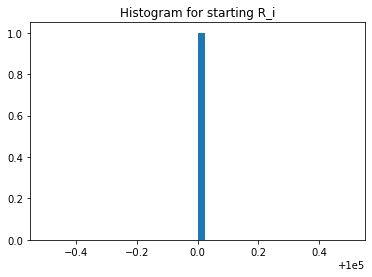

In [22]:
import matplotlib.pyplot as plt
a = starting_Ri.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_i")
plt.show()

In [23]:
experiments.UNI_Qi.unique()

array([200000., 200015., 300001.])

In [24]:
experiments.UNI_Si.unique()

array([10000., 14999.])

In [25]:
experiments.UNI_Qj.unique()

array([200000.])

In [26]:
experiments.UNI_Rj.unique()

array([100000.])

In [27]:
starting_Rj = experiments[experiments.timestep == 0]
starting_Rj = starting_Rj['UNI_Rj']
starting_Rj.reset_index(drop=True)
starting_Rj.unique()

array([100000.])

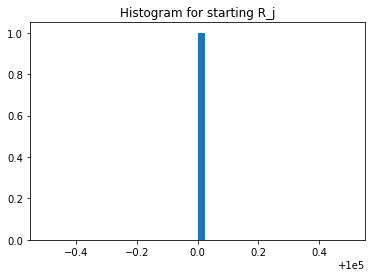

In [28]:
a = starting_Rj.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_j")
plt.show()

In [29]:
experiments.UNI_Sj.unique()

array([10000], dtype=int64)

In [30]:
experiments.UNI_ij.unique()

array([100000., 109947., 109329., ..., 113391., 111784.,  91799.])

In [31]:
experiments.UNI_ji.unique()

array([100000.,  91241.,  91759., ...,  89392., 109255., 111650.])

In [32]:
experiments.UNI_Sij.unique()

array([1.e+10])

In [33]:
def get_M(k, v):
    if k == 'sim_config':
        k, v = 'M', v['M']
    return k, v

config_ids = [
    dict(
        get_M(k, v) for k, v in config.__dict__.items() if k in ['simulation_id', 'run_id', 'sim_config', 'subset_id']
    ) for config in configs
]

# Agent sequences

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


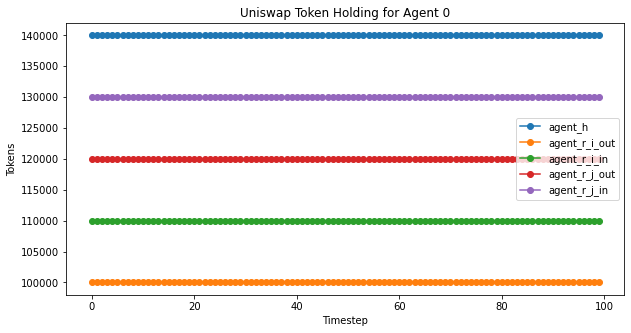

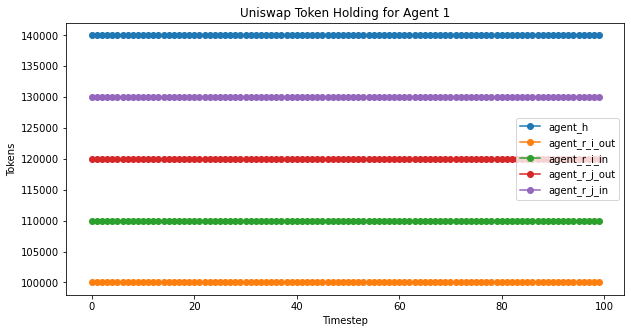

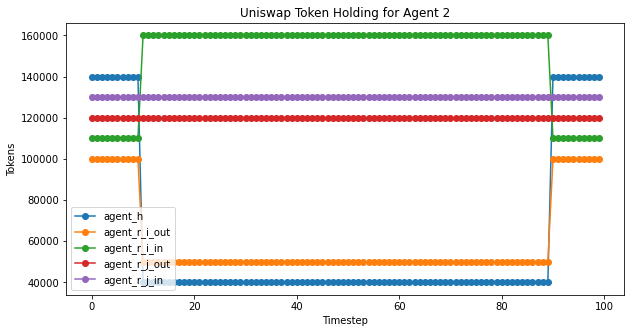

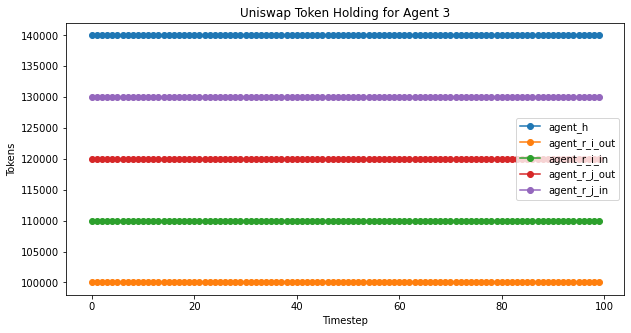

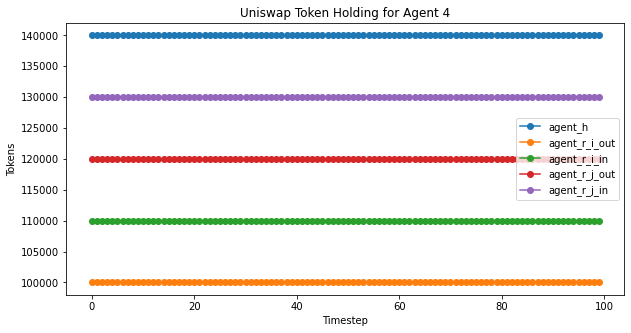

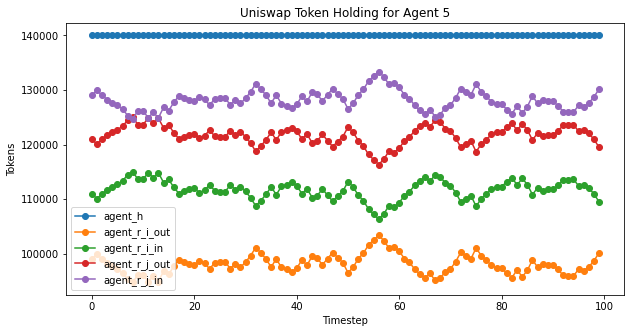

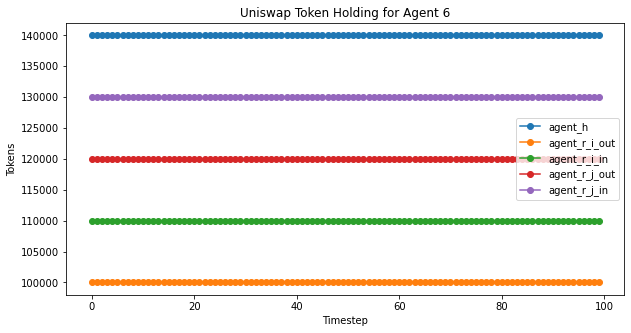

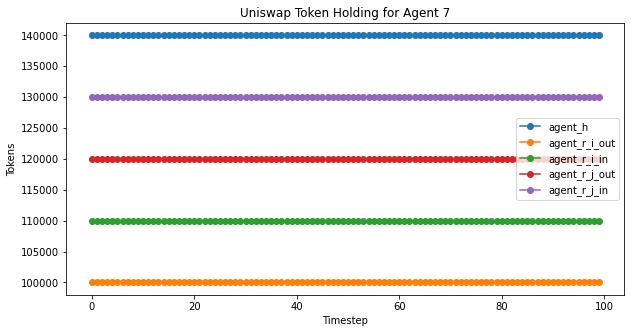

In [34]:
agent_plot(experiment2,'Uniswap Token Holding for Agent ', 100) #,4,'j')

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


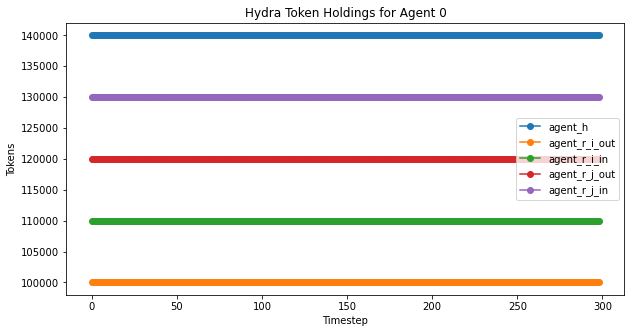

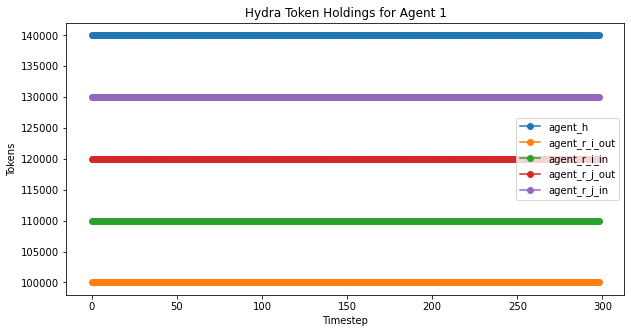

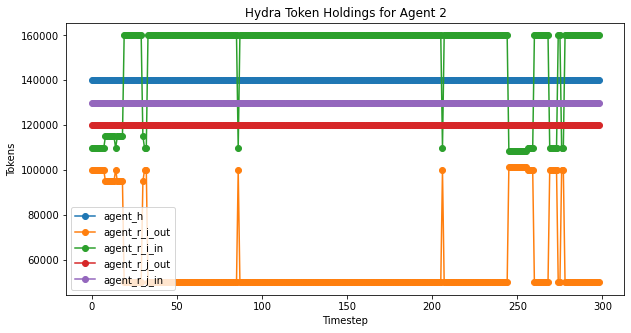

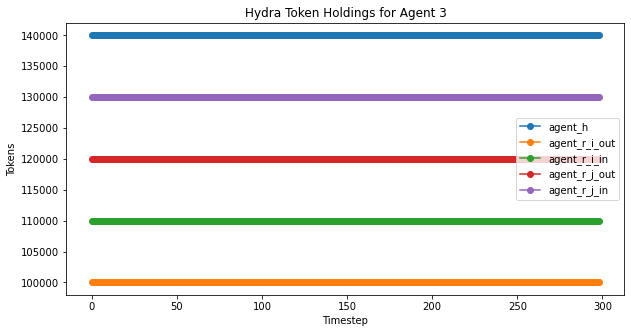

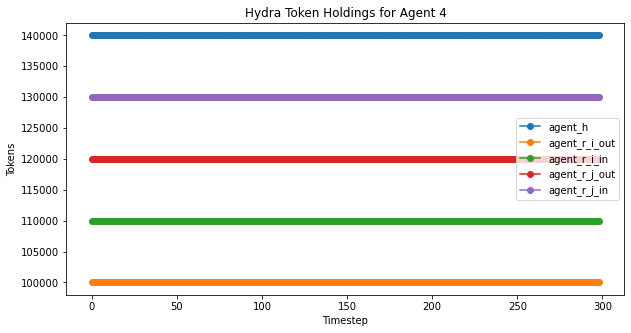

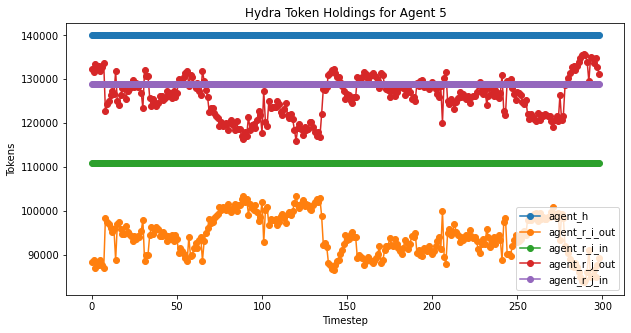

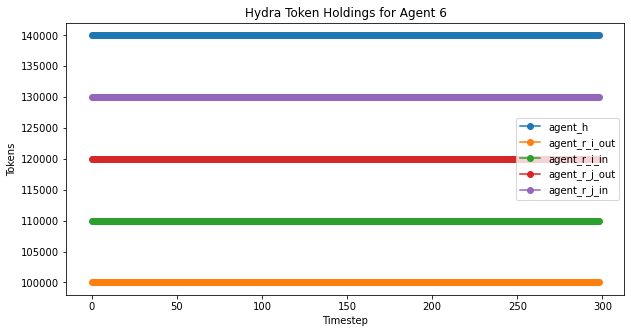

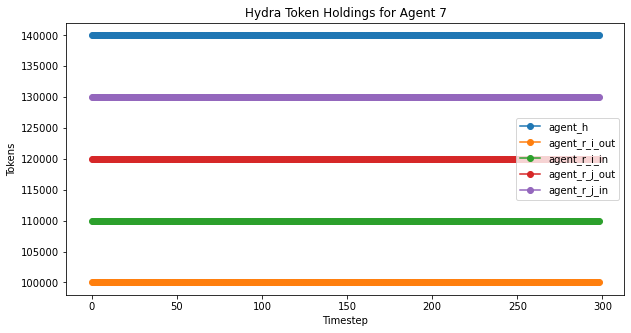

In [35]:
hydra_agent_plot(experiments,'Hydra Token Holdings for Agent ', 299)

# Liquidity dynamics

Movement of the Uniswap variables

- 'UNI_Ri', 'UNI_Qi', 'UNI_Si'
- 'UNI_Rj', 'UNI_Qj', 'UNI_Sj'
- 'UNI_ij', 'UNI_ji', 'UNI_Sij'

## Uniswap -- Ri-Q instance

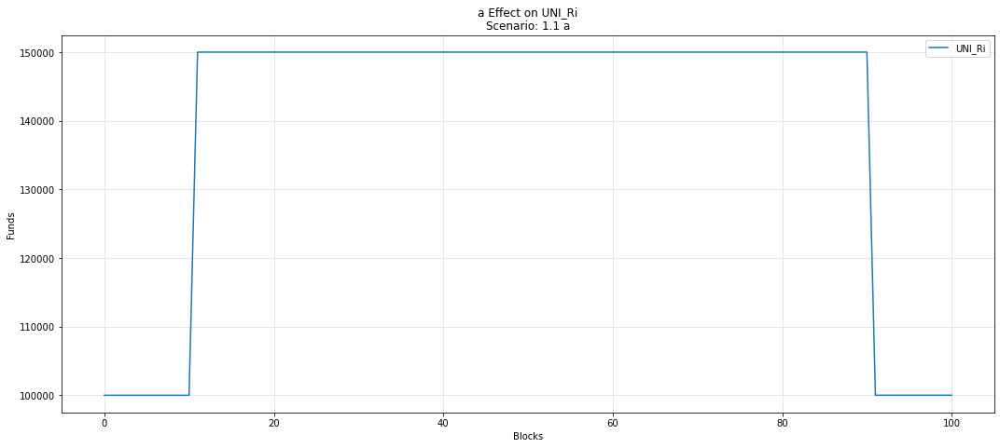

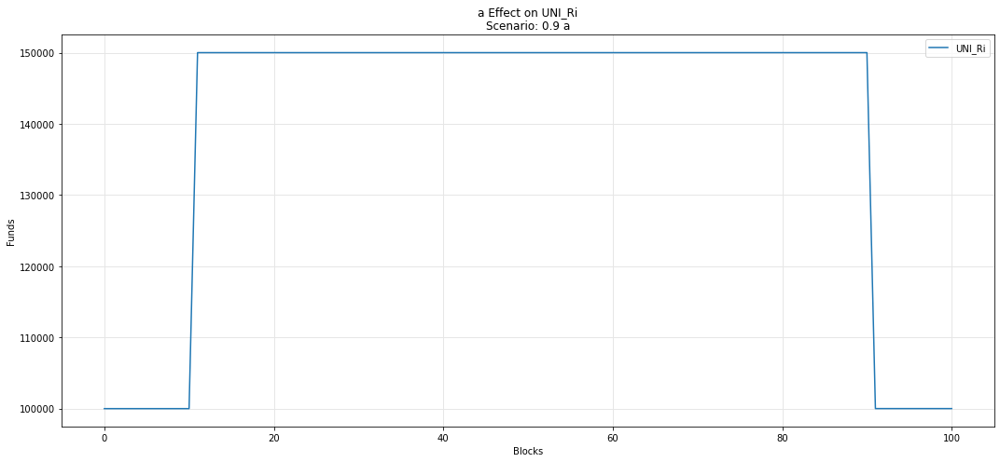

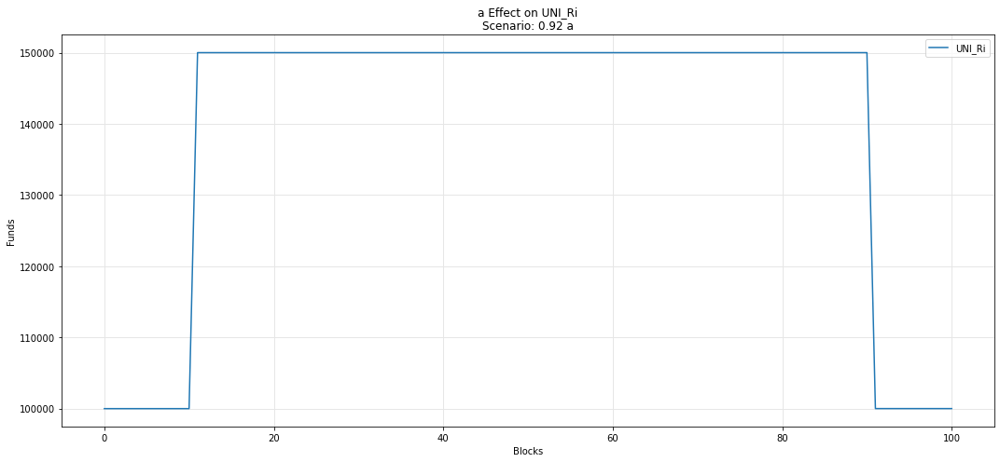

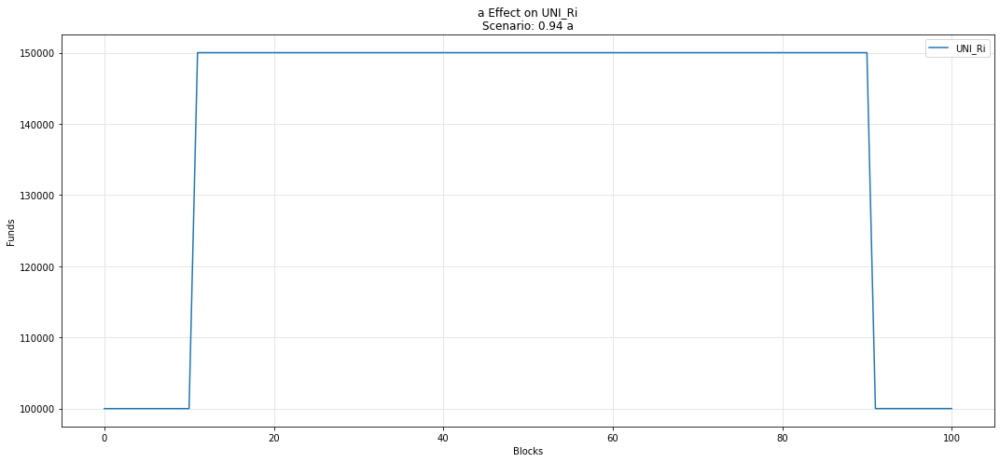

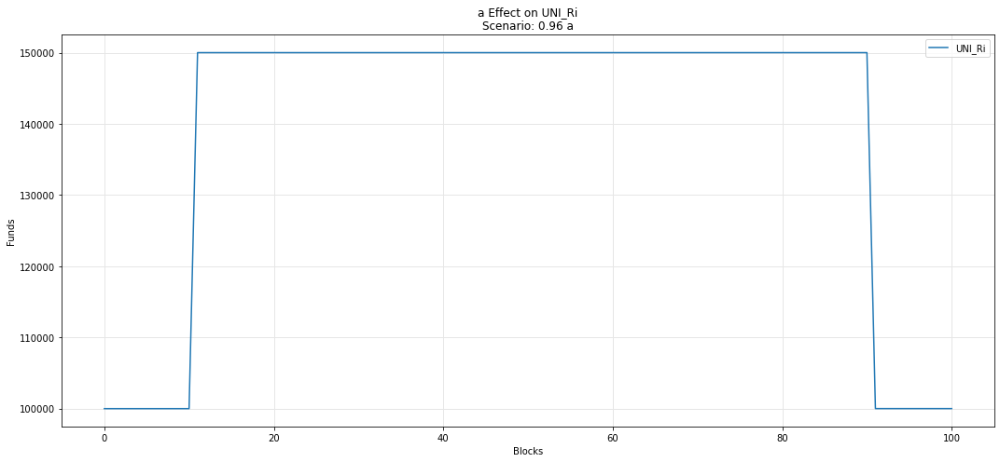

...

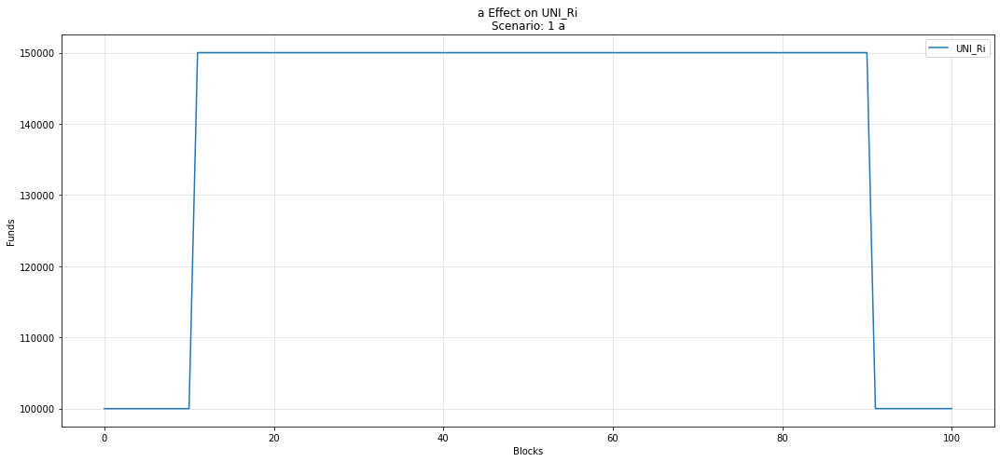

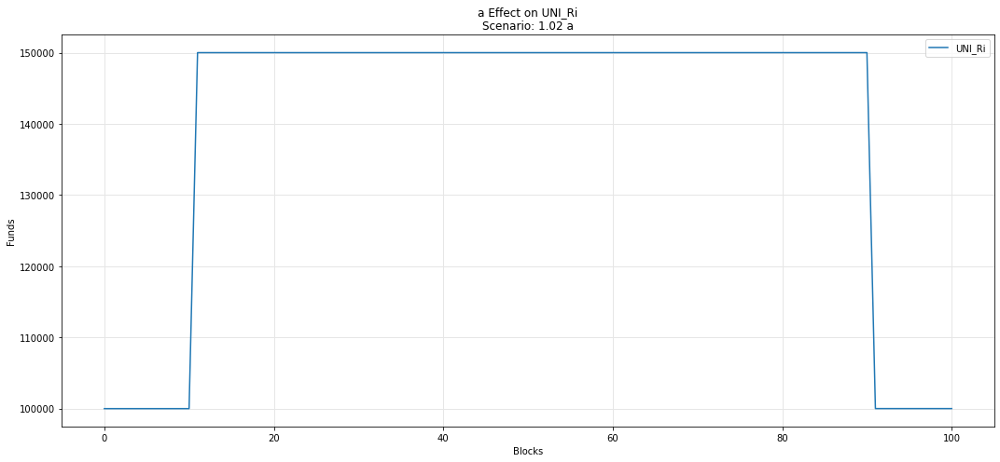

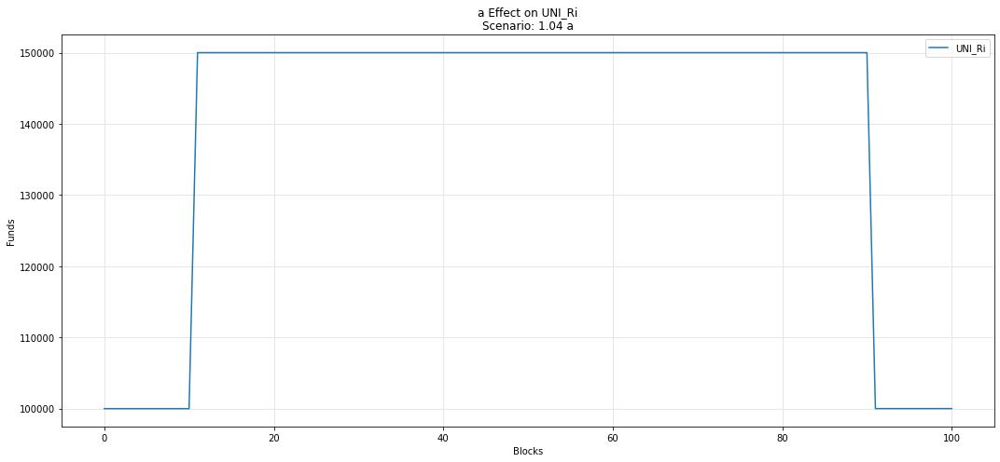

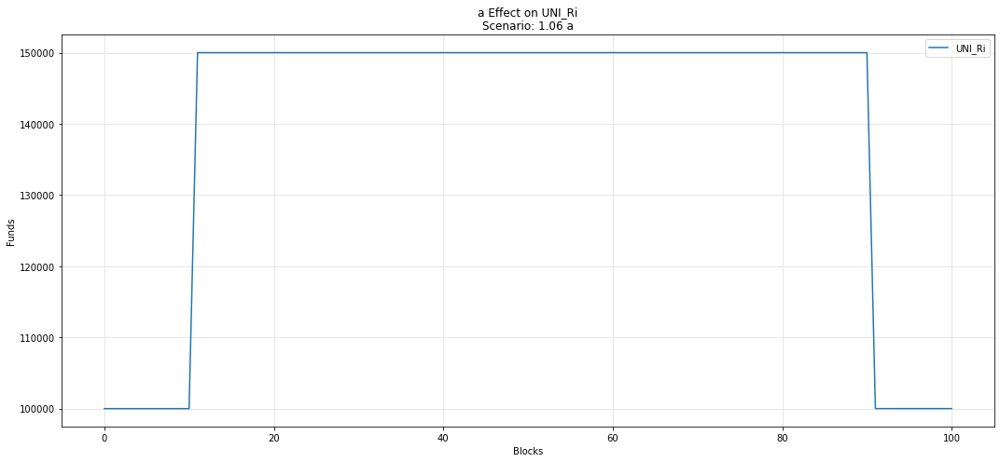

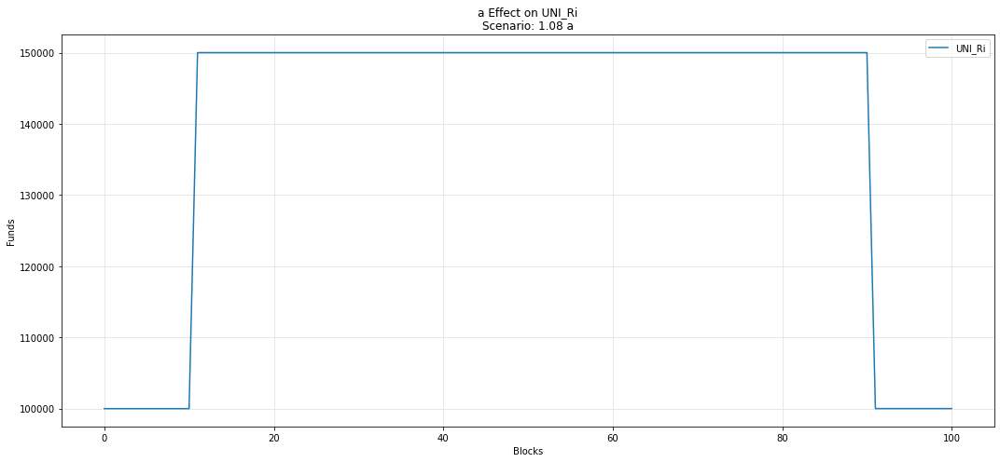

In [36]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Ri')

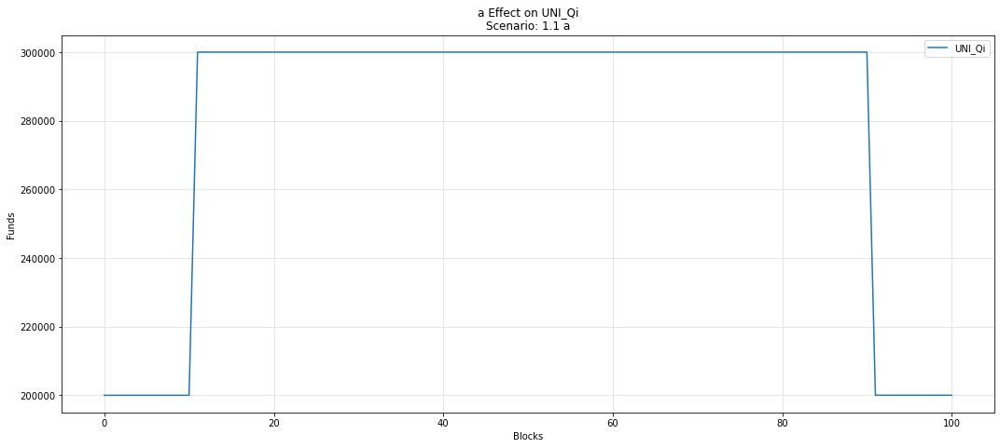

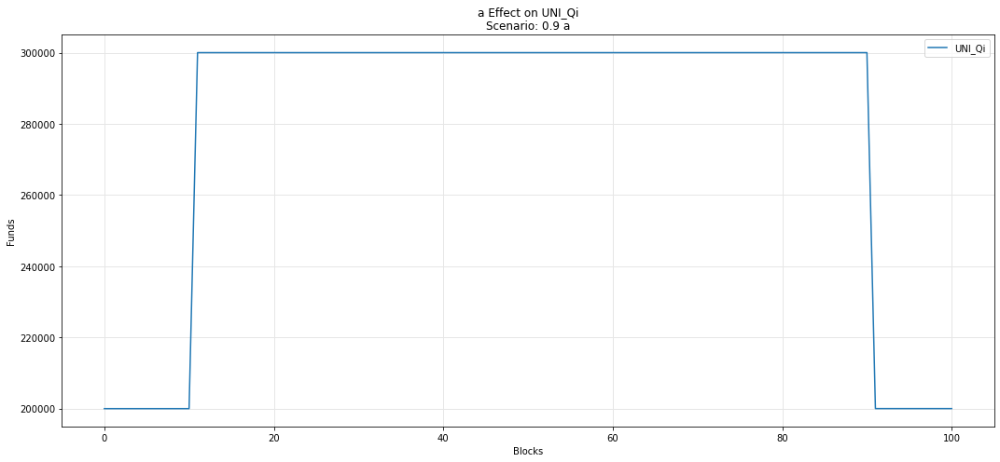

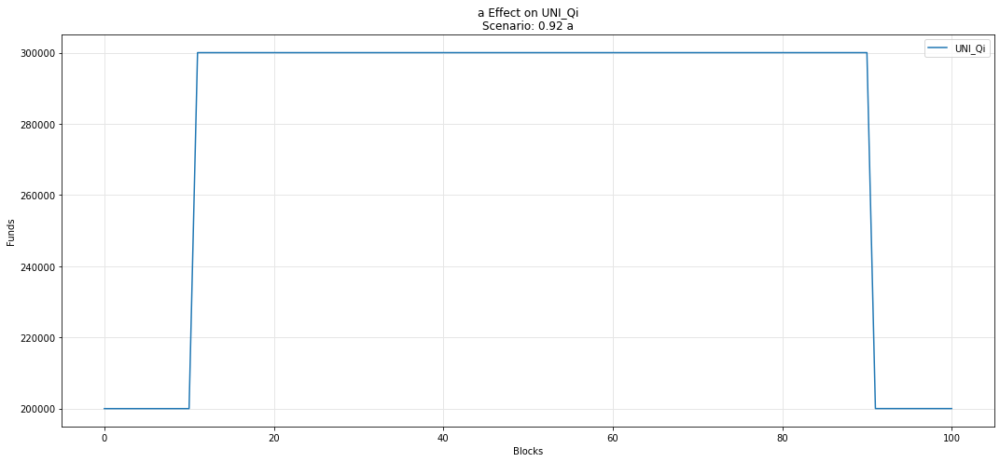

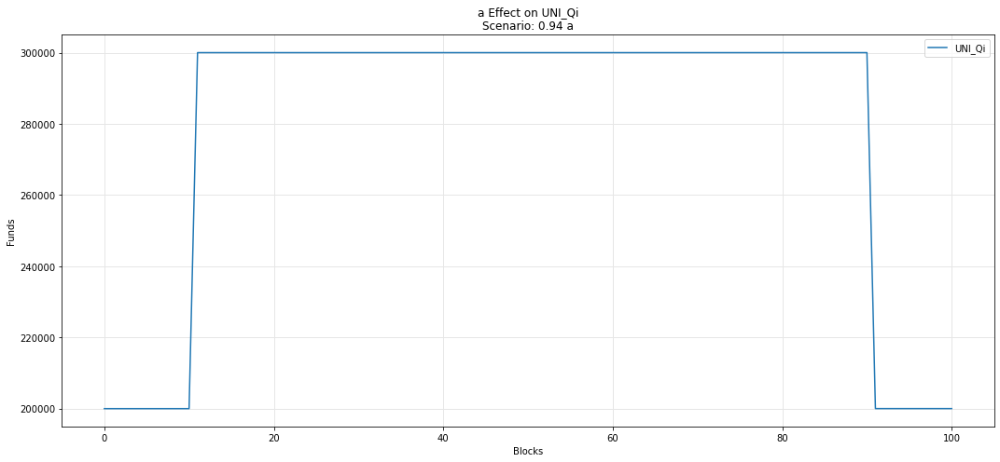

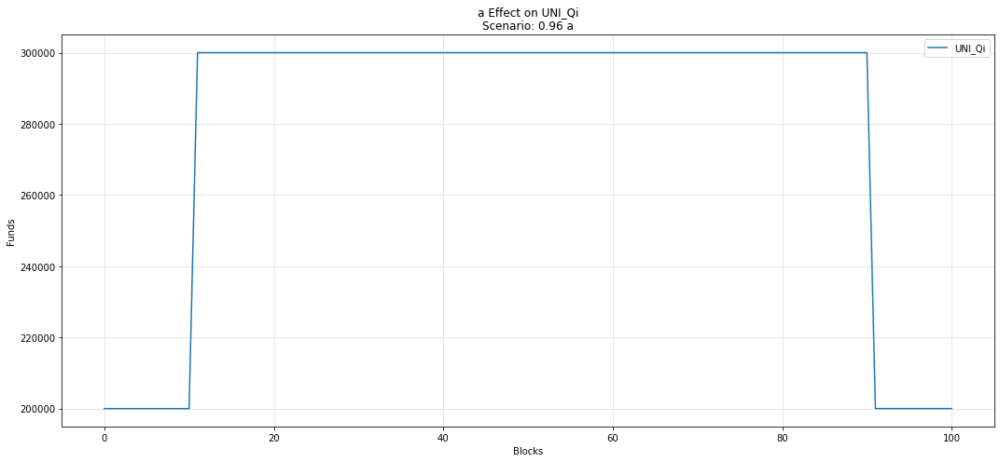

...

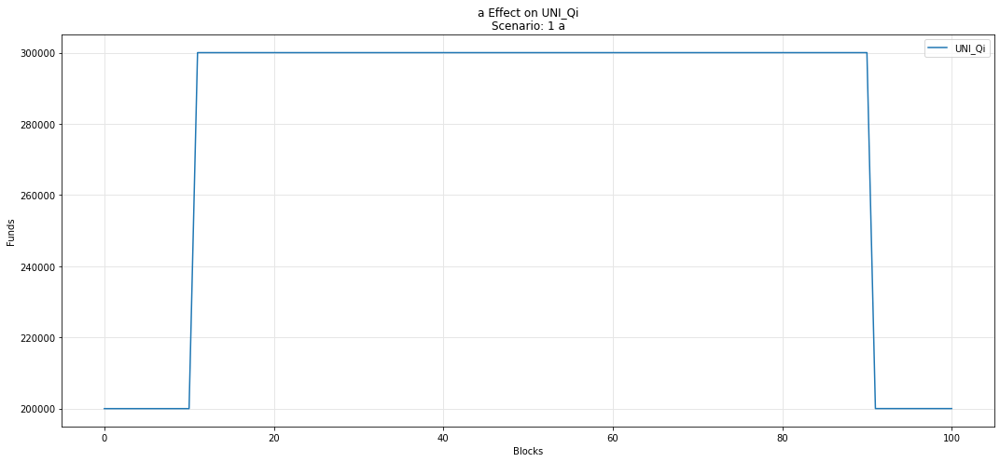

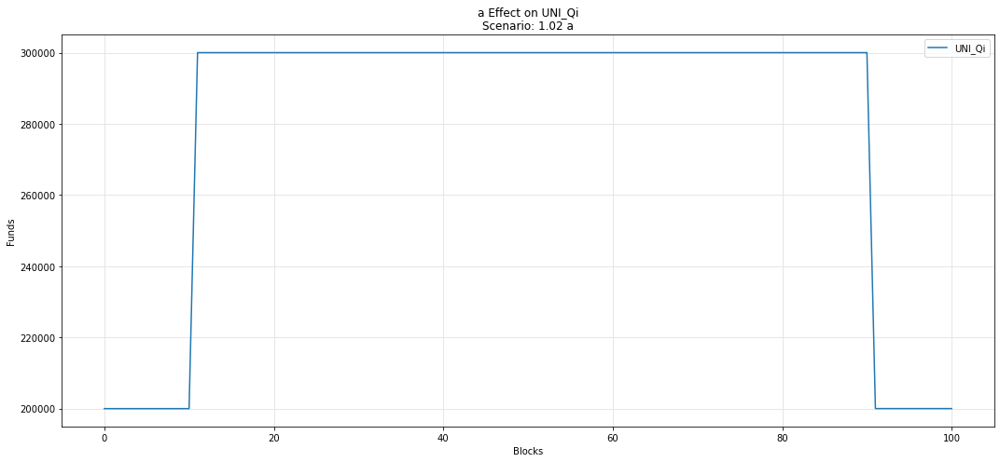

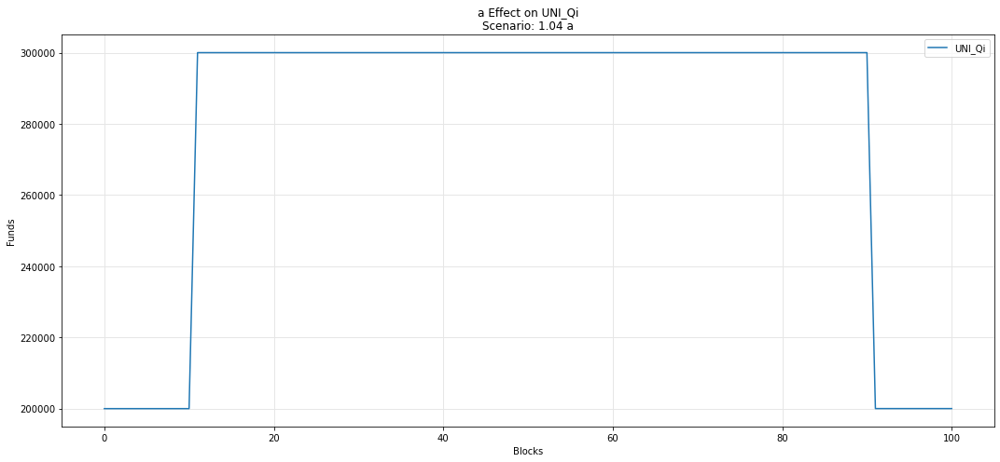

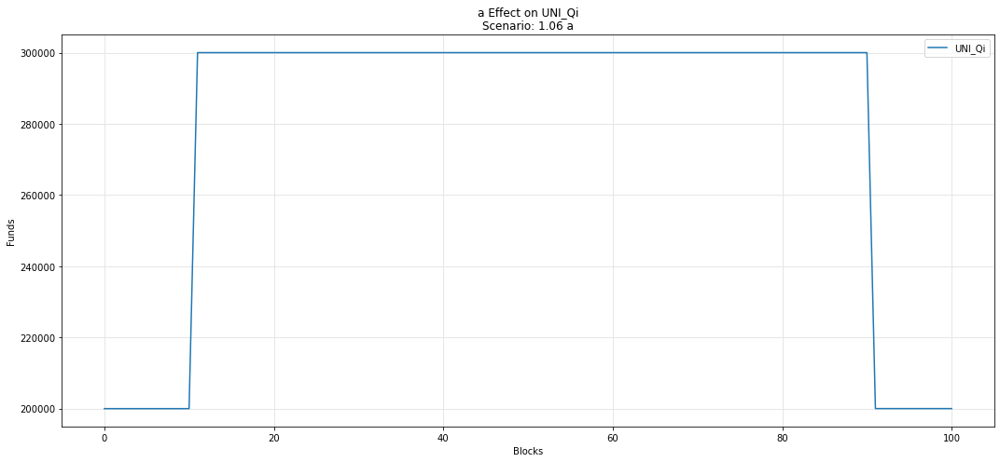

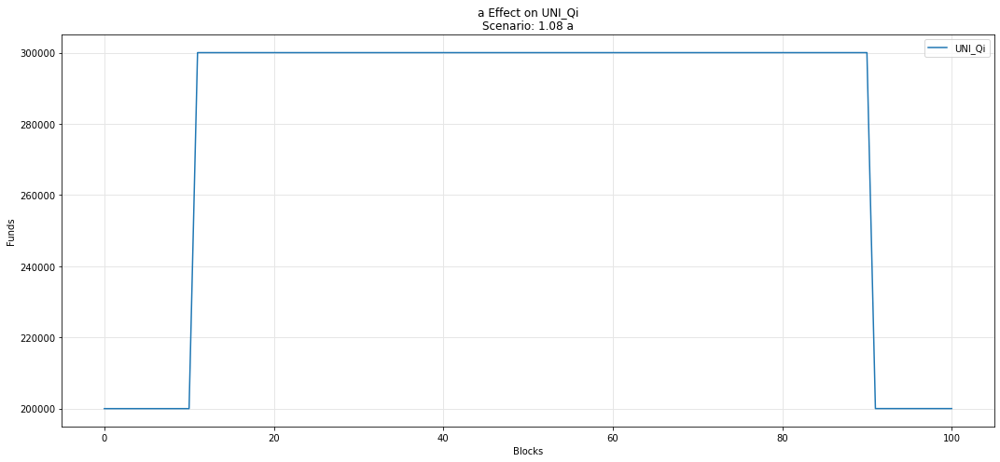

In [37]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qi')

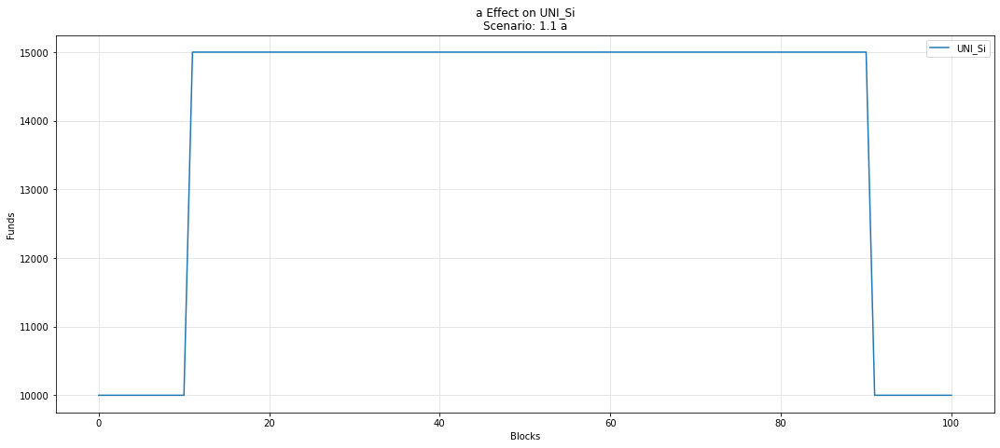

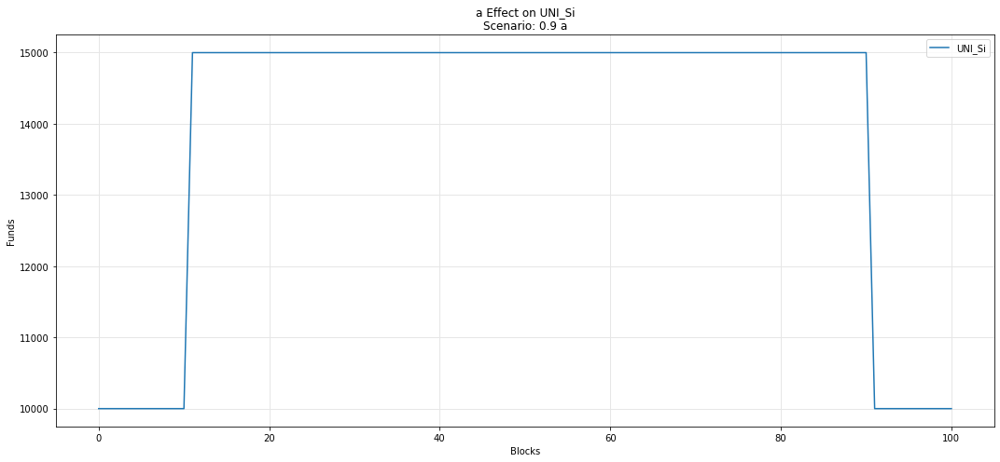

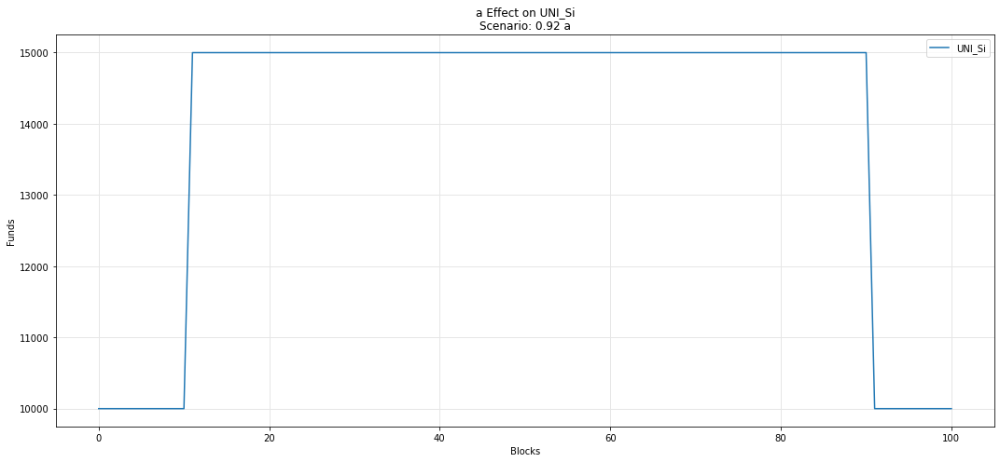

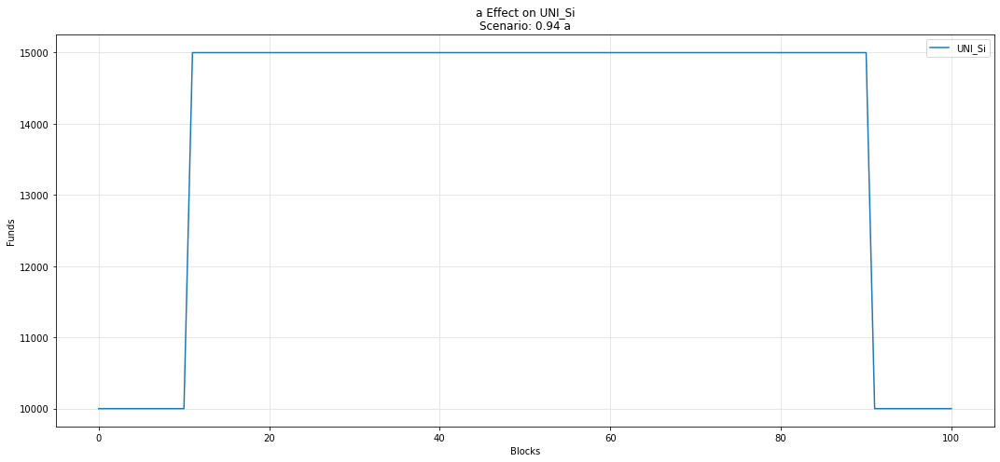

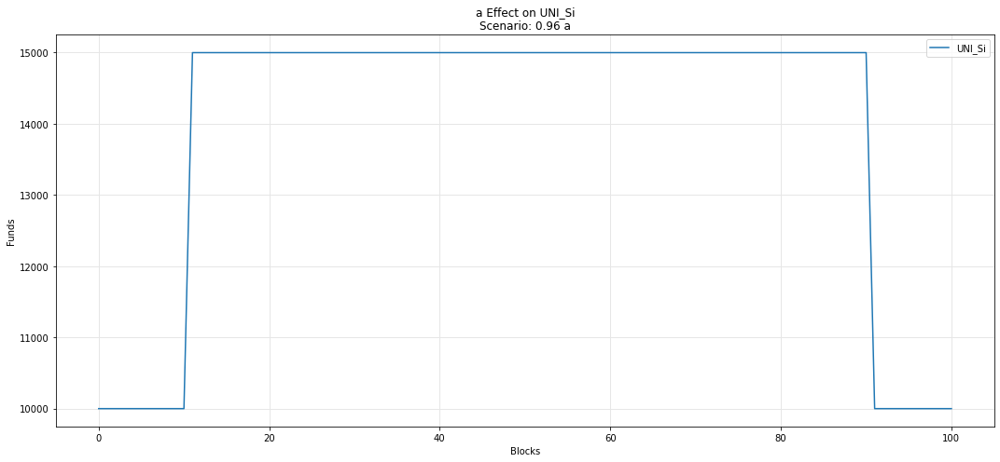

...

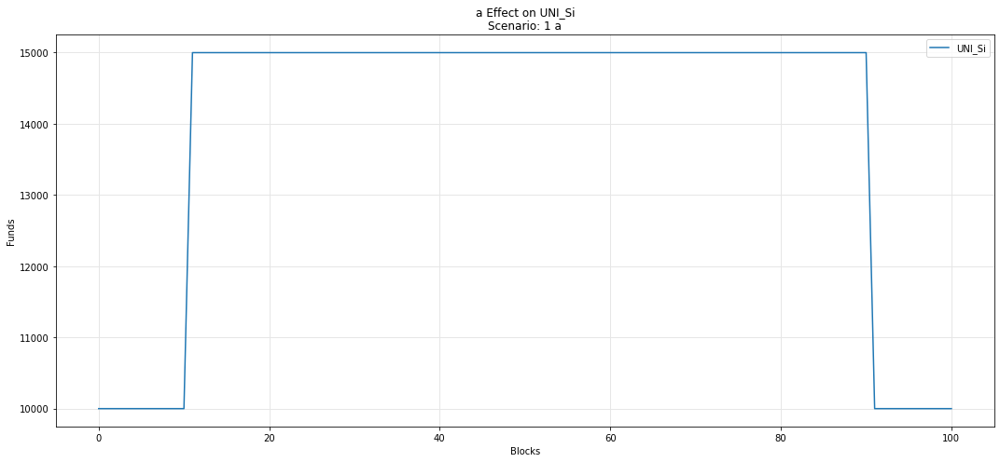

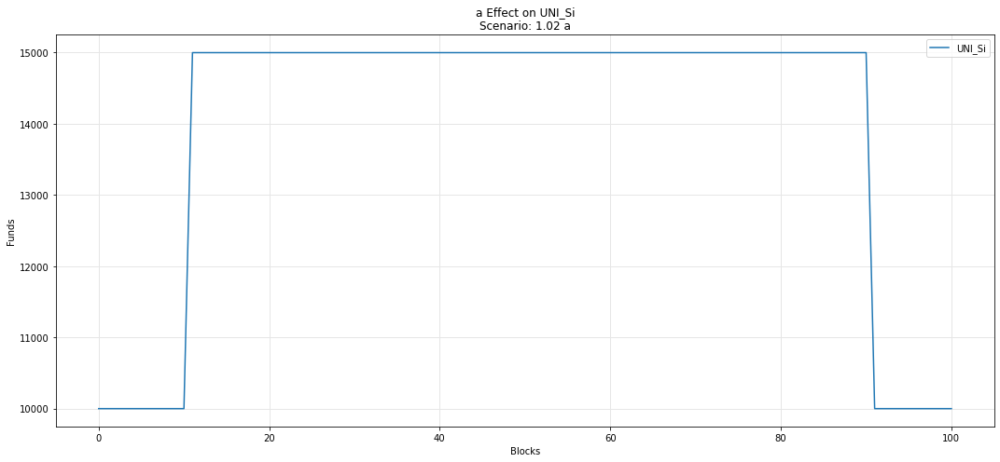

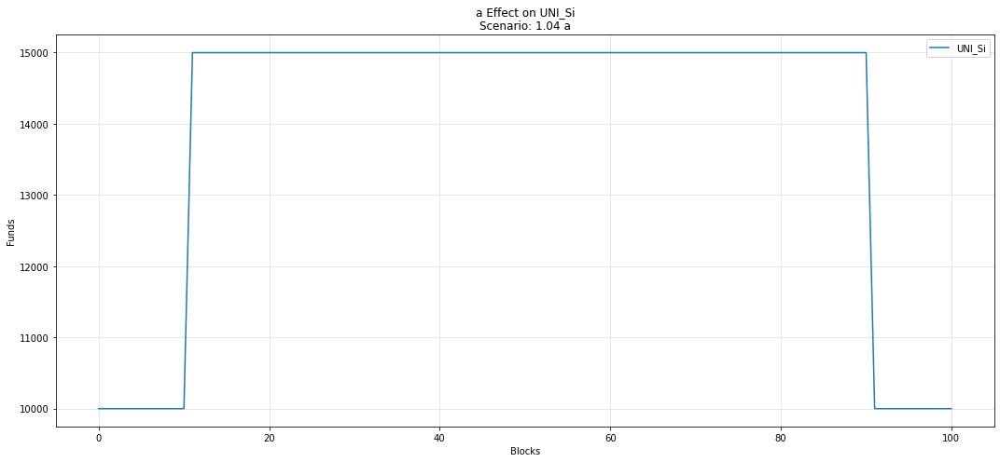

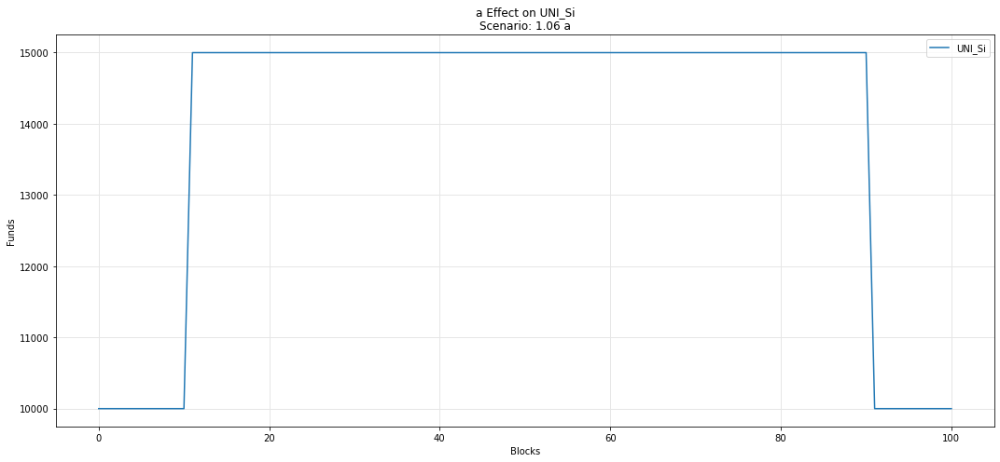

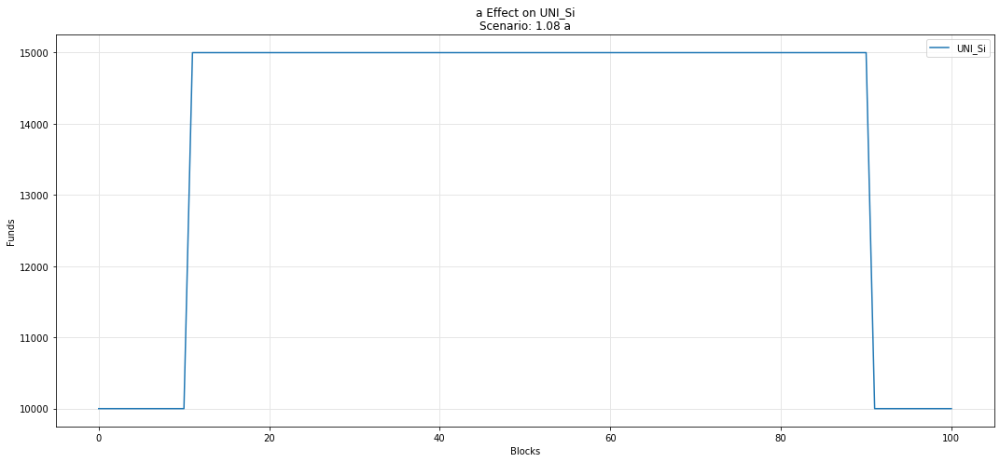

In [38]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Si')

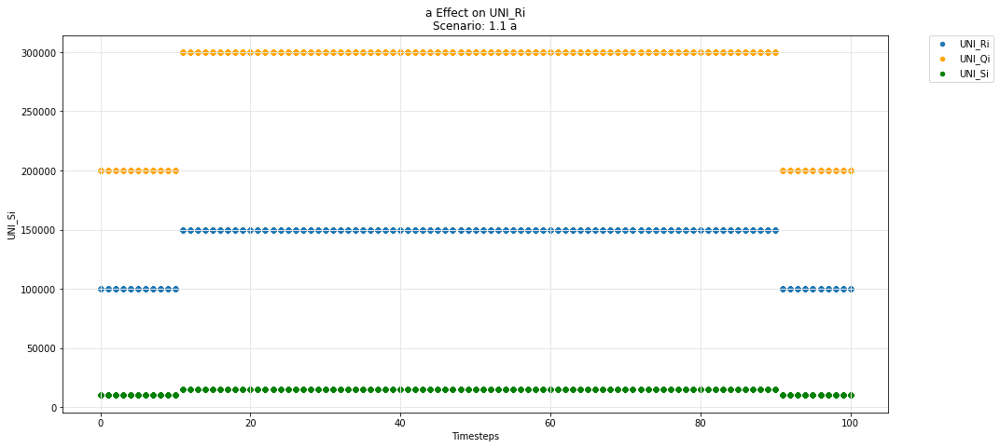

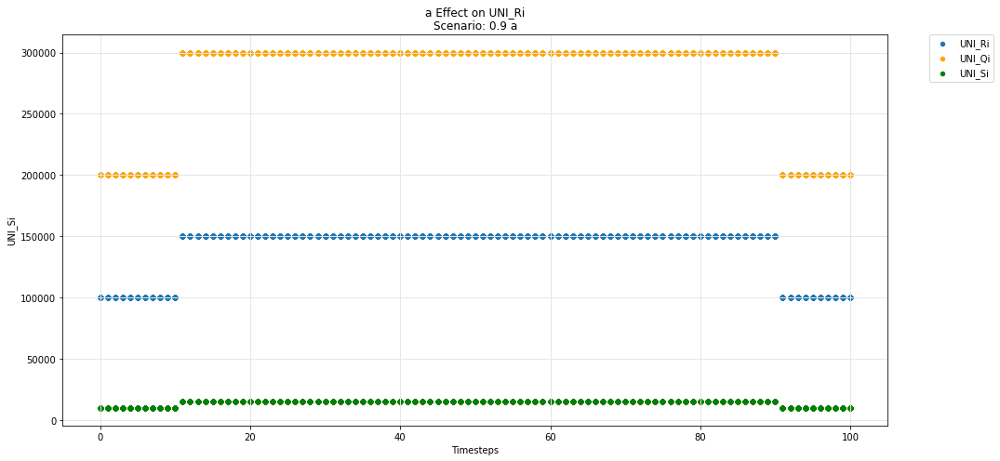

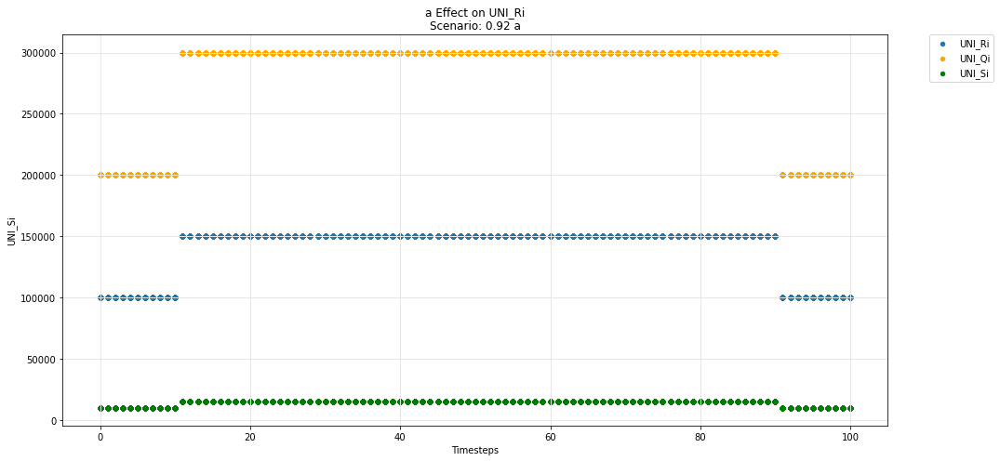

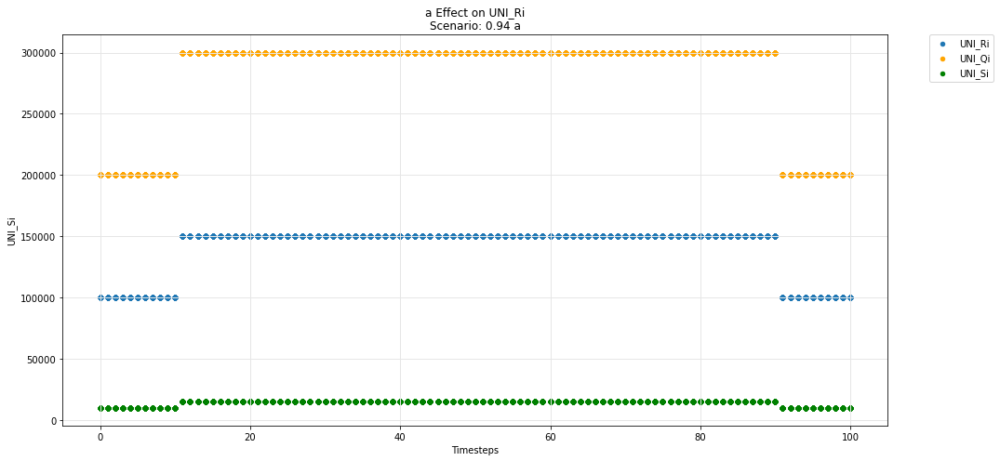

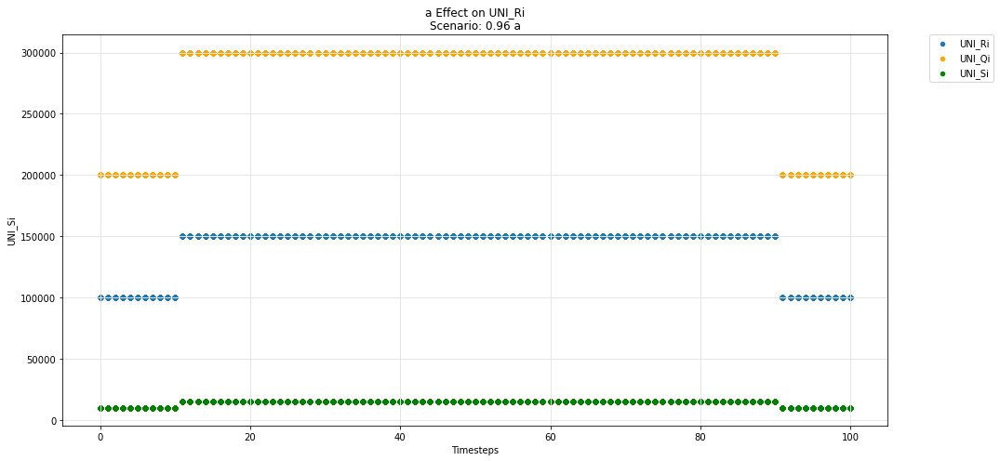

...

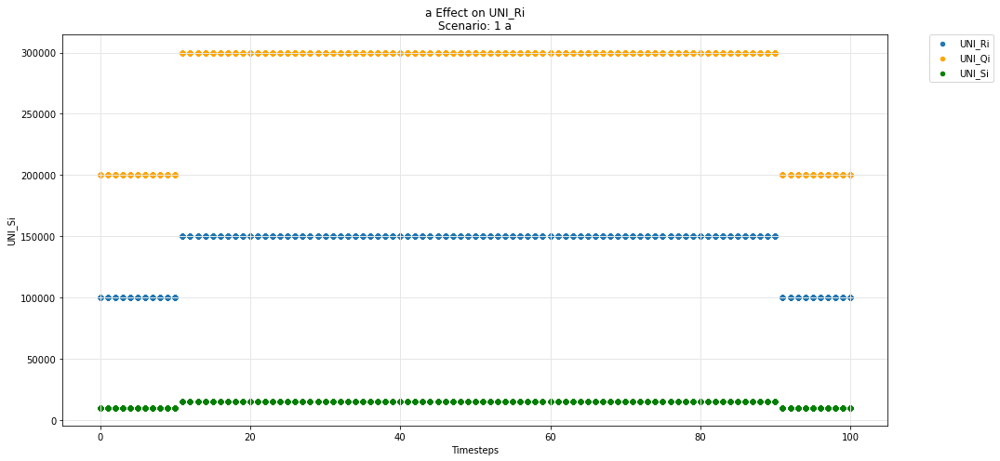

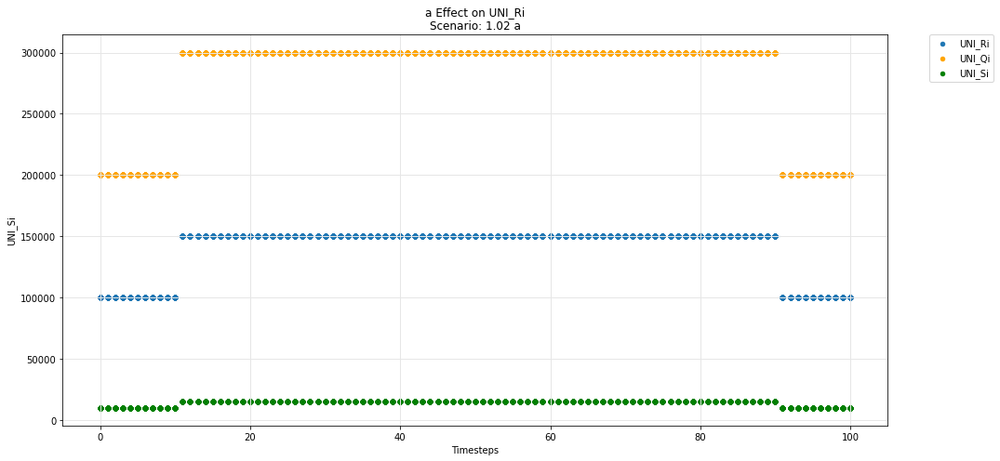

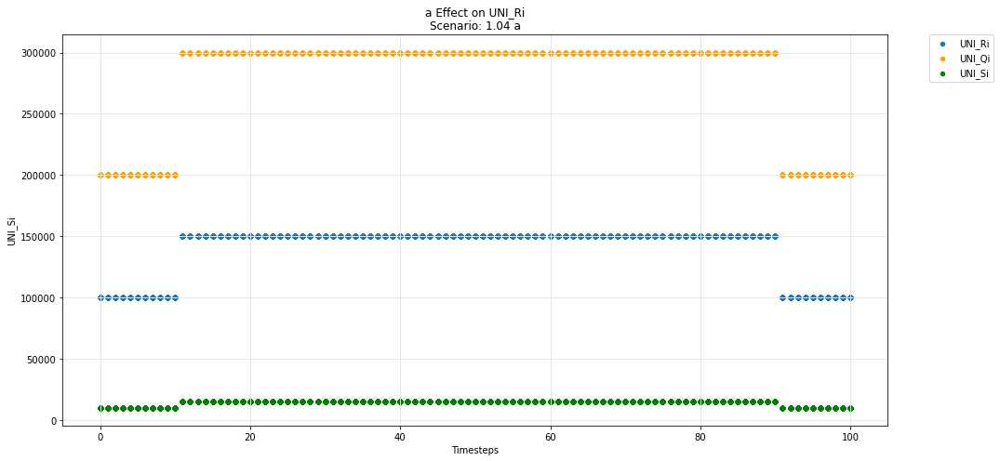

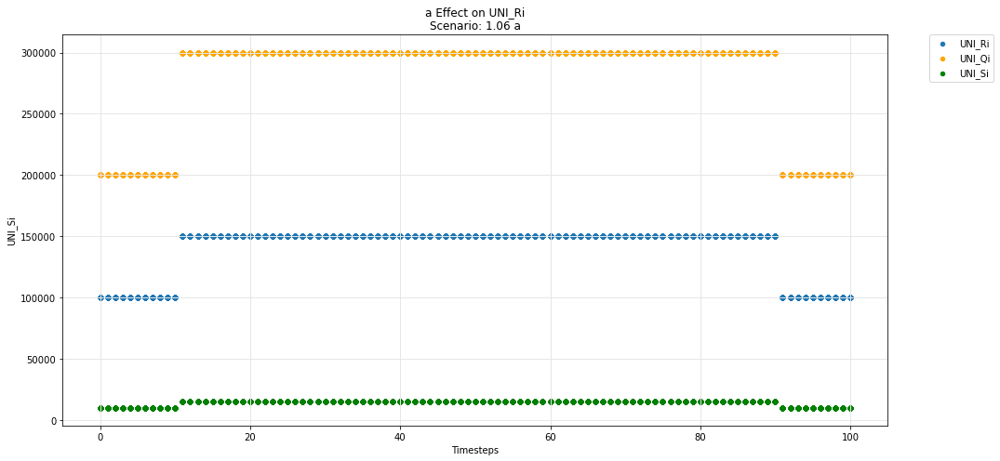

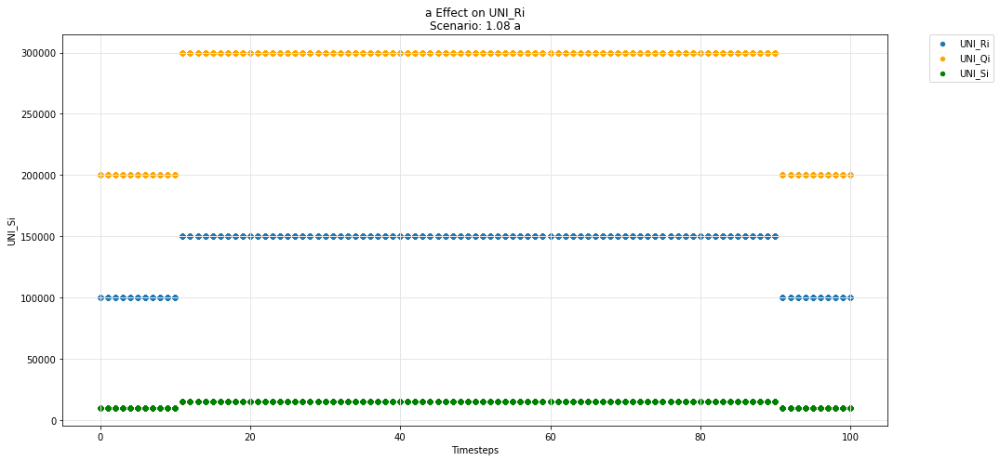

In [39]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Ri', 'UNI_Qi', 'UNI_Si')

## Uniswap -- Rj-Q instance

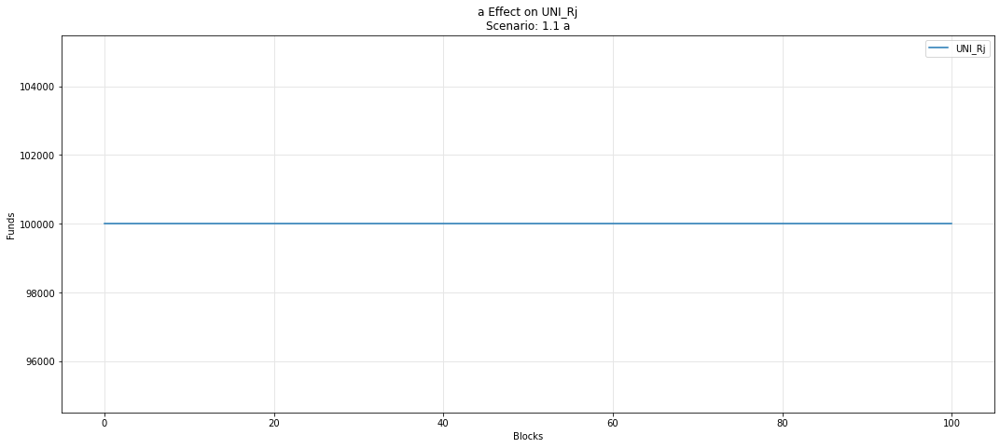

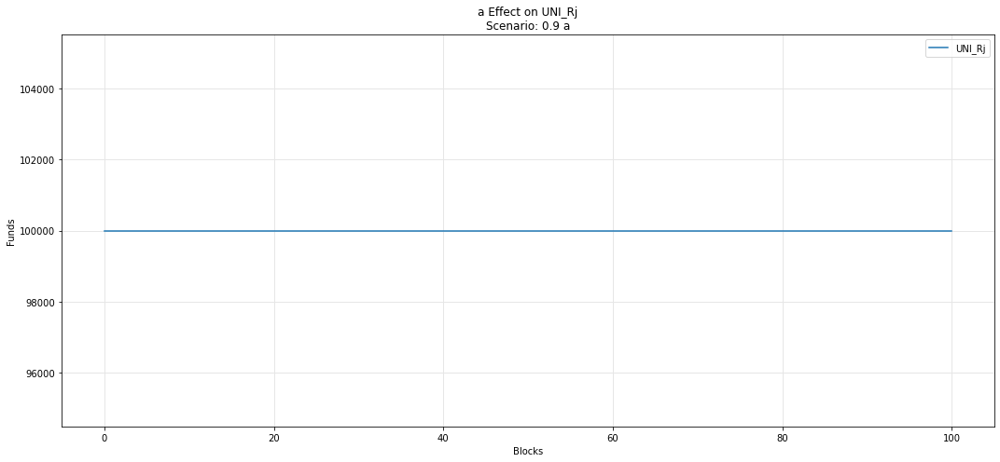

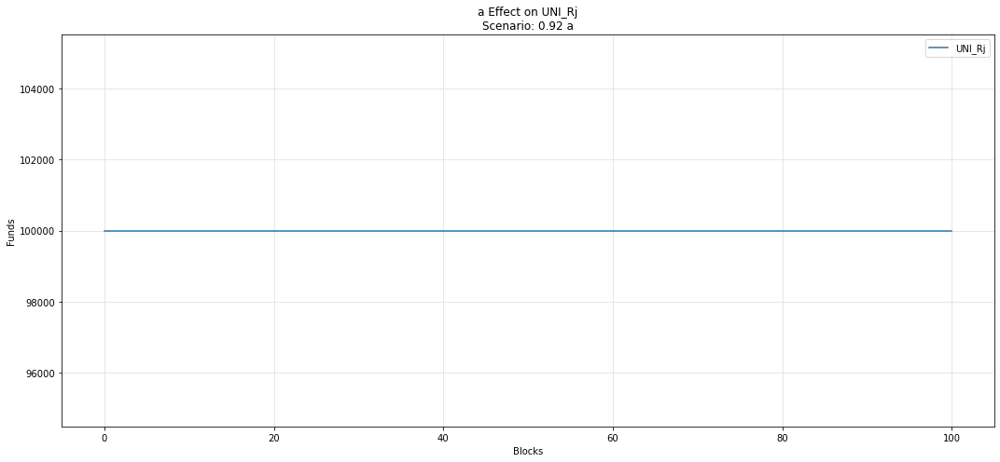

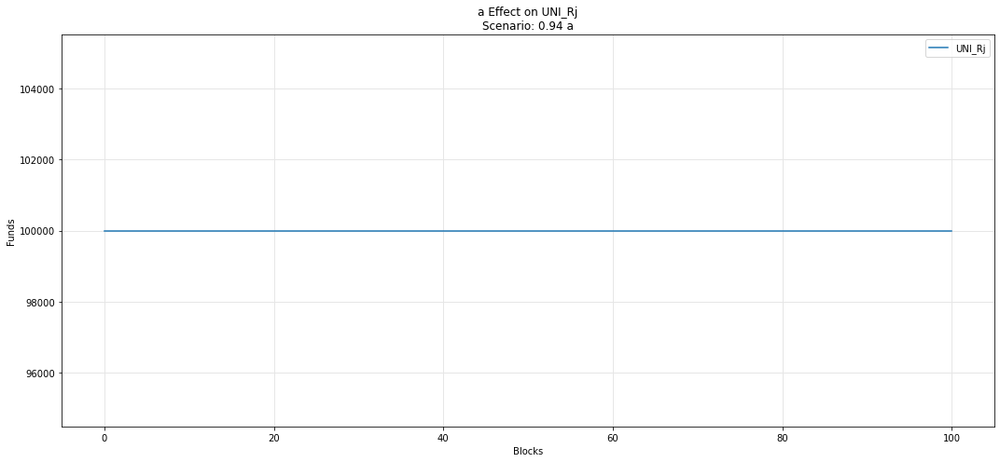

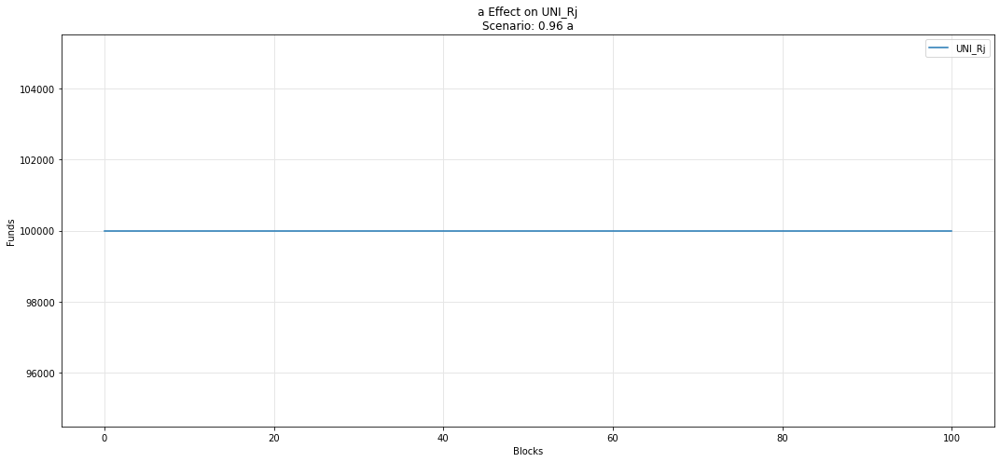

...

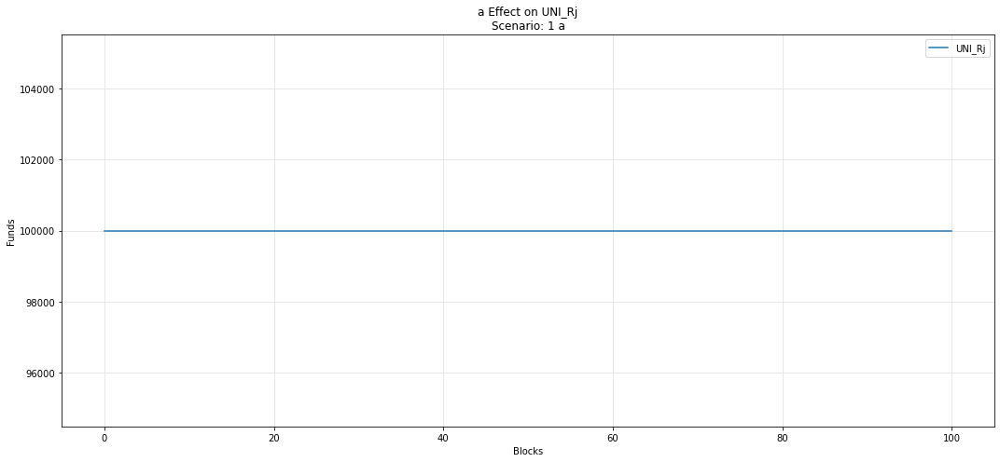

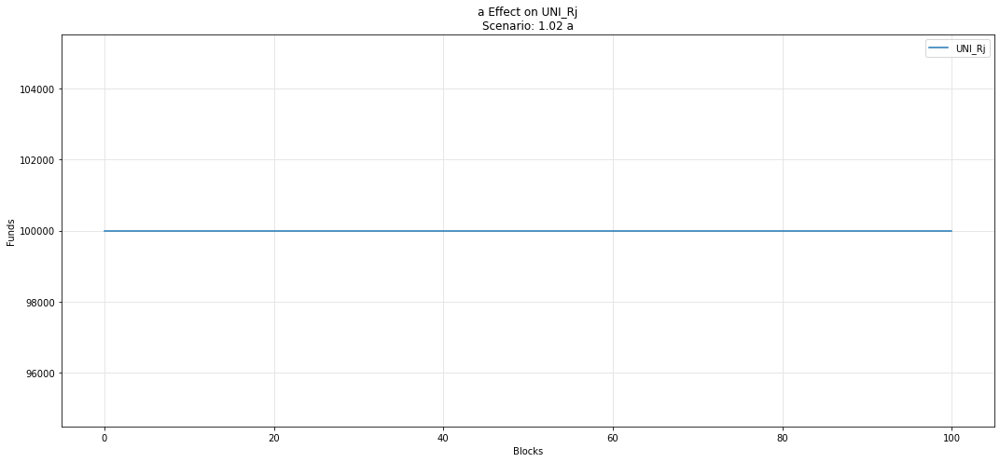

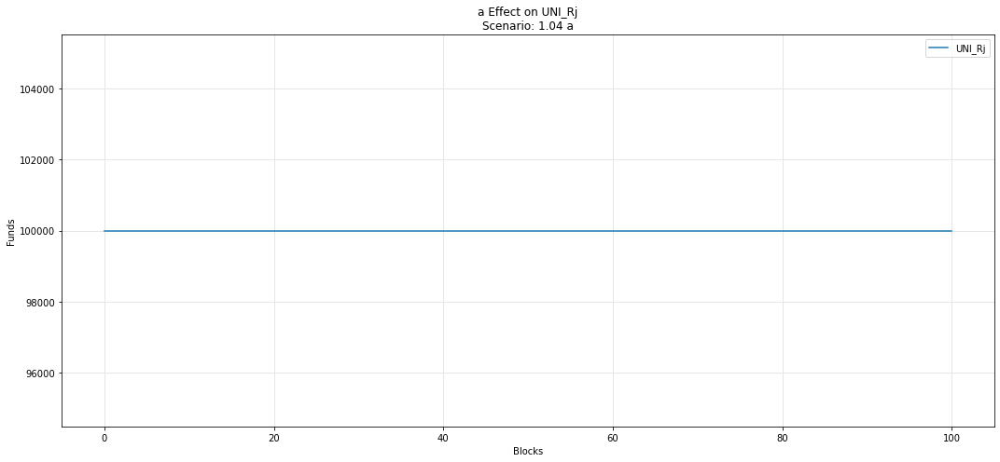

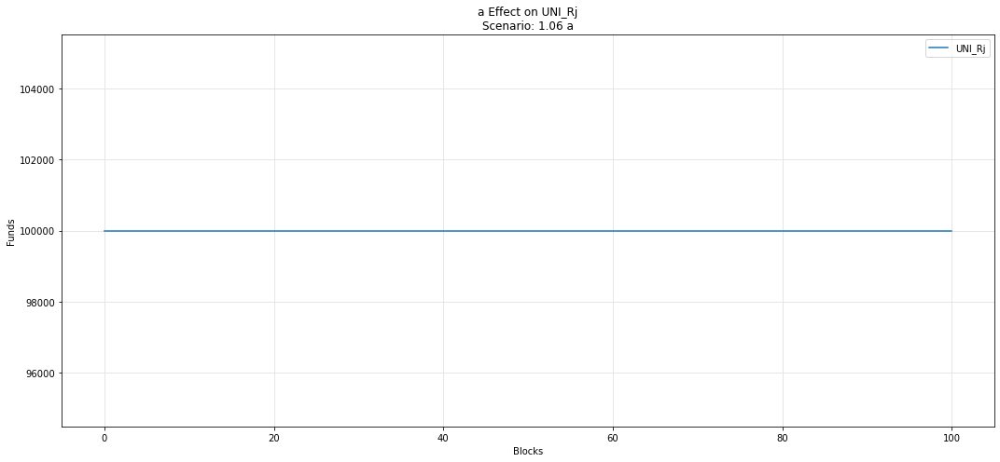

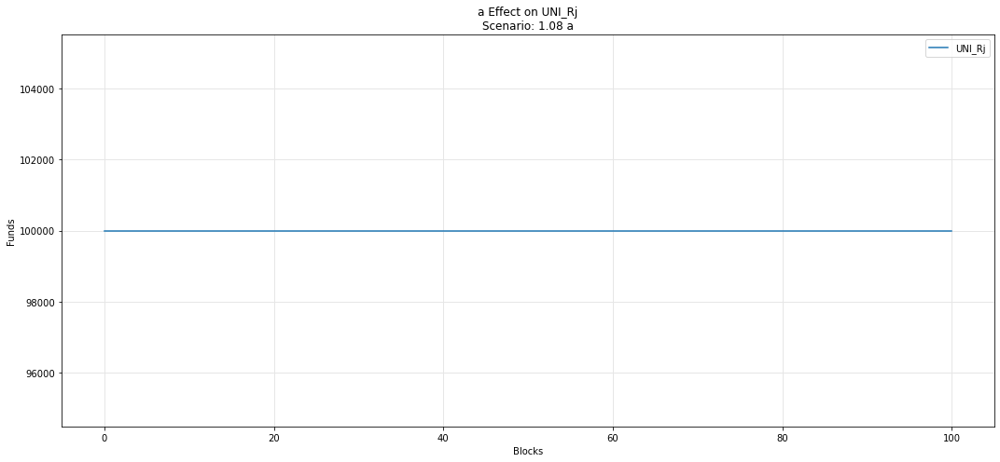

In [40]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Rj')

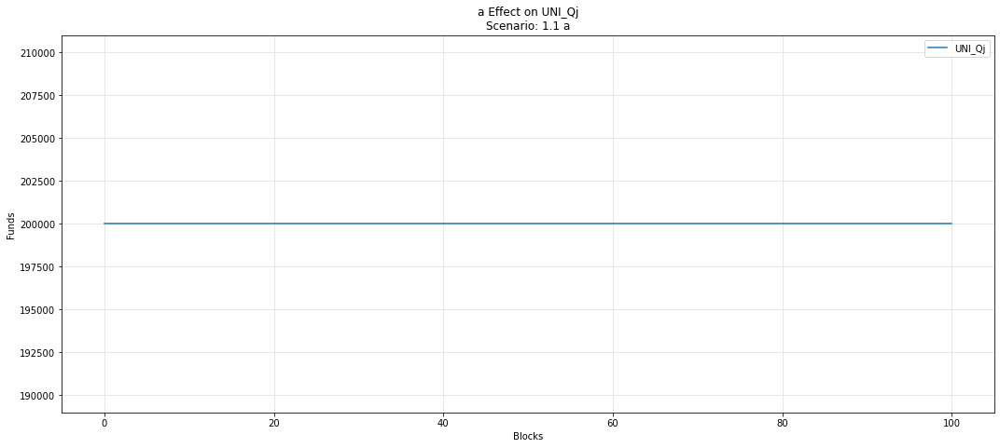

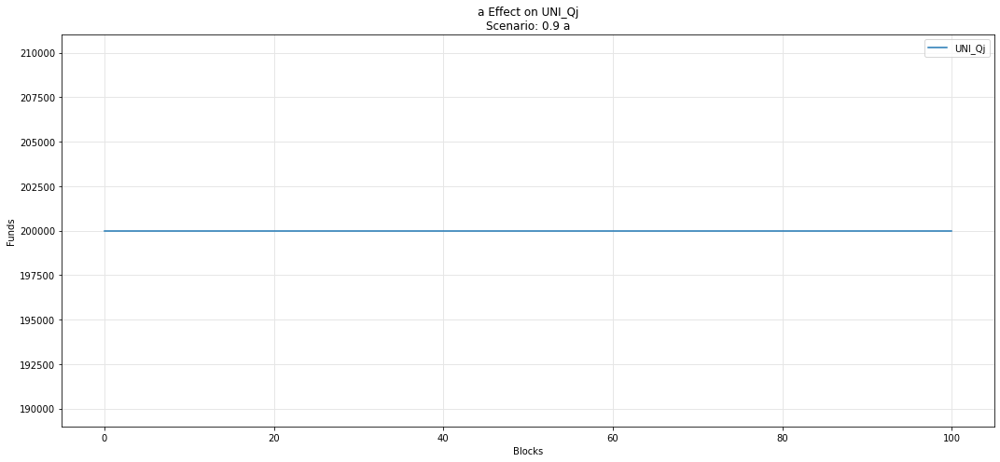

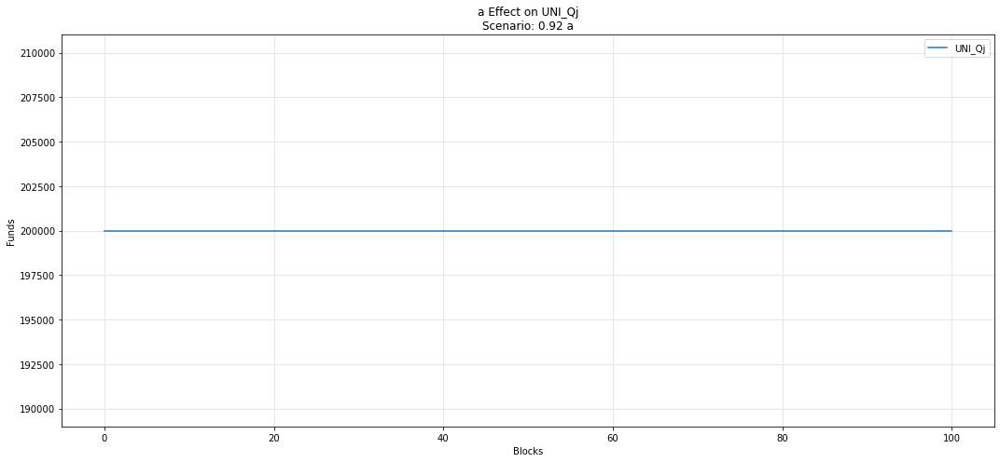

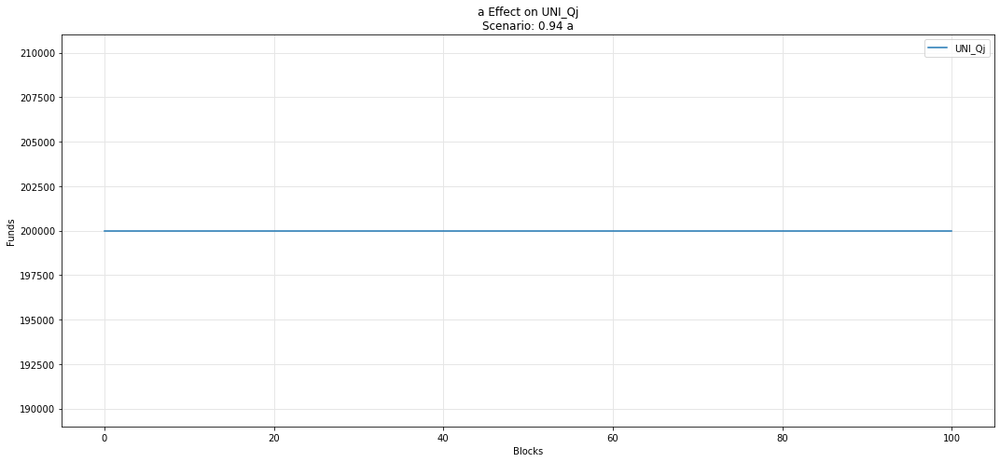

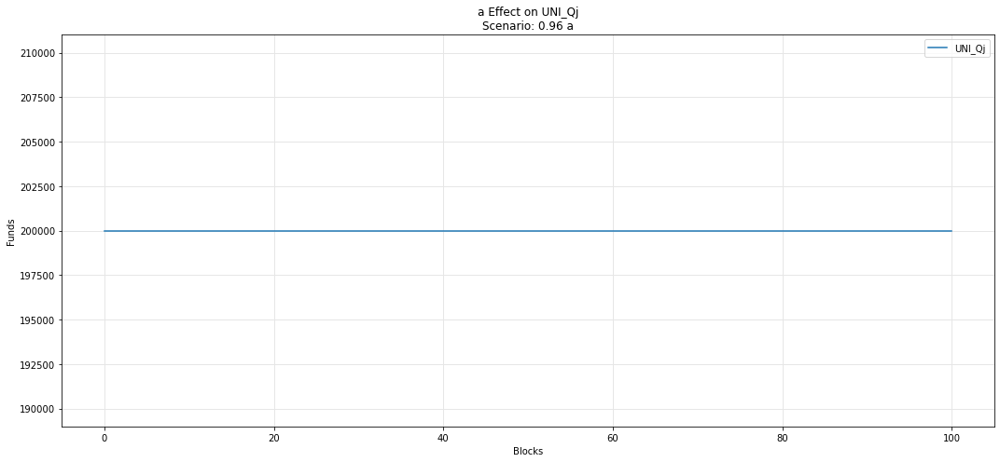

...

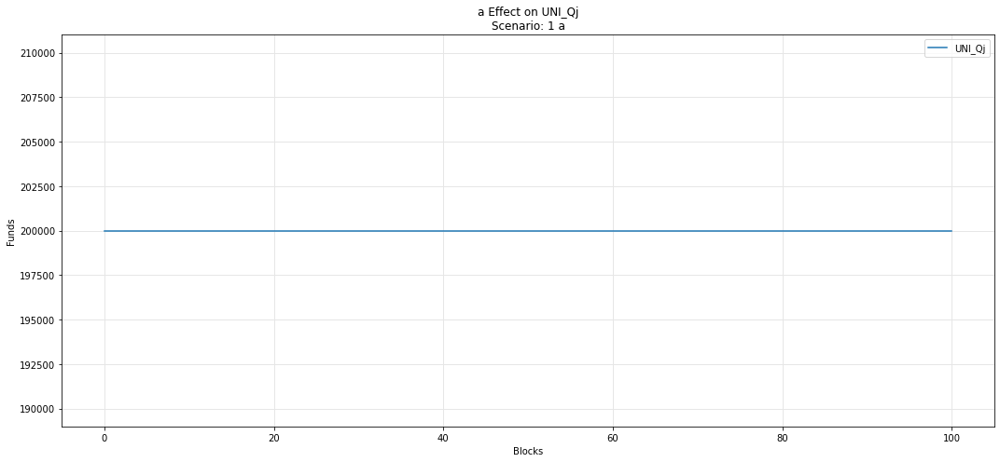

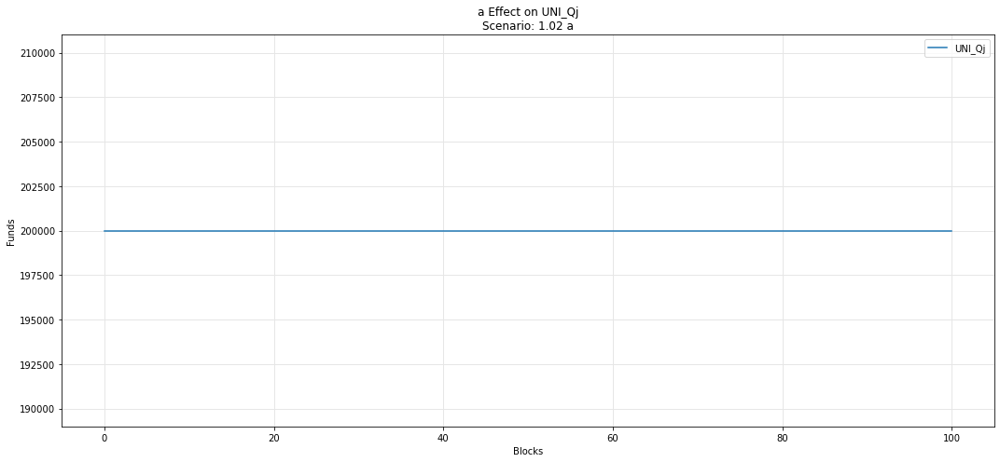

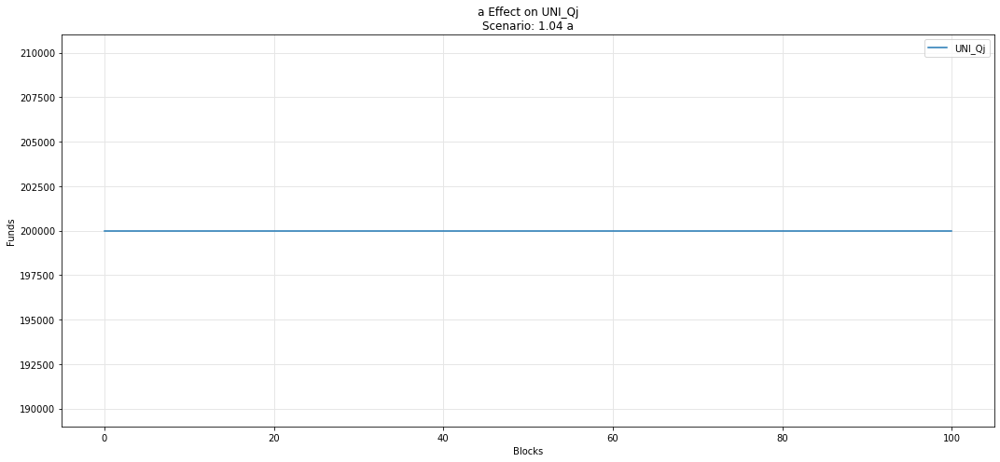

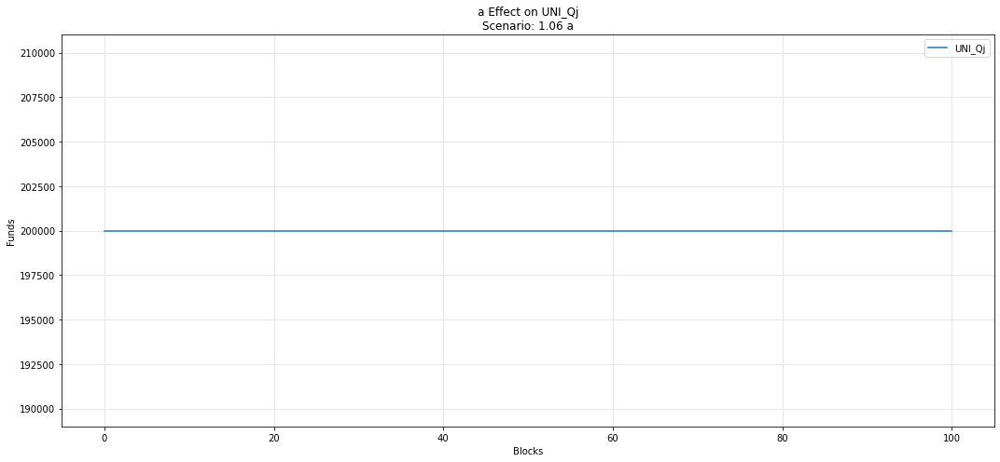

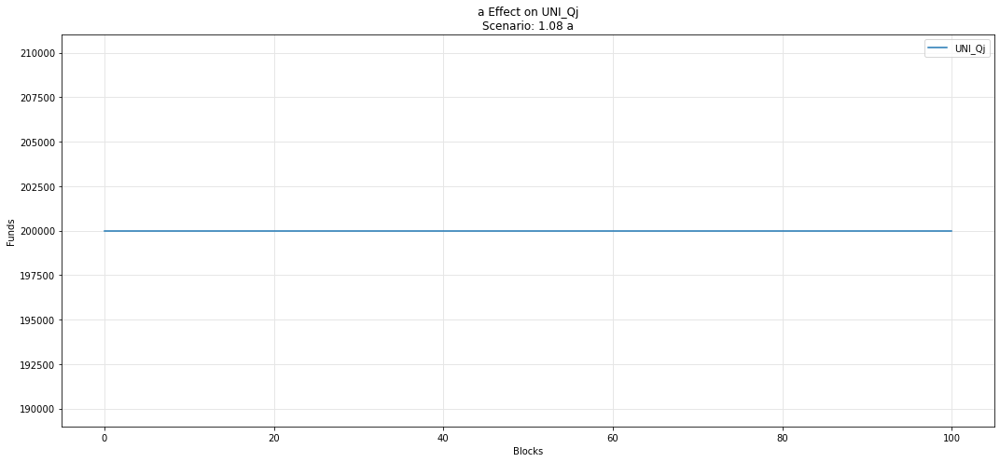

In [41]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qj')

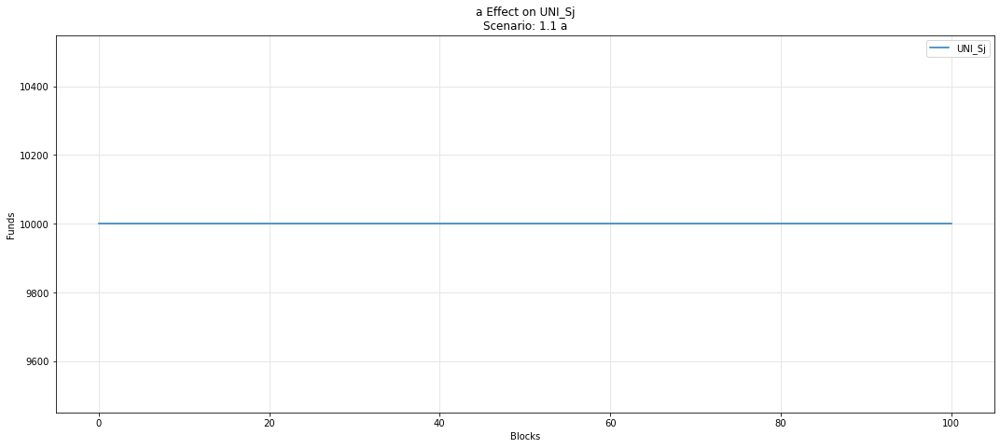

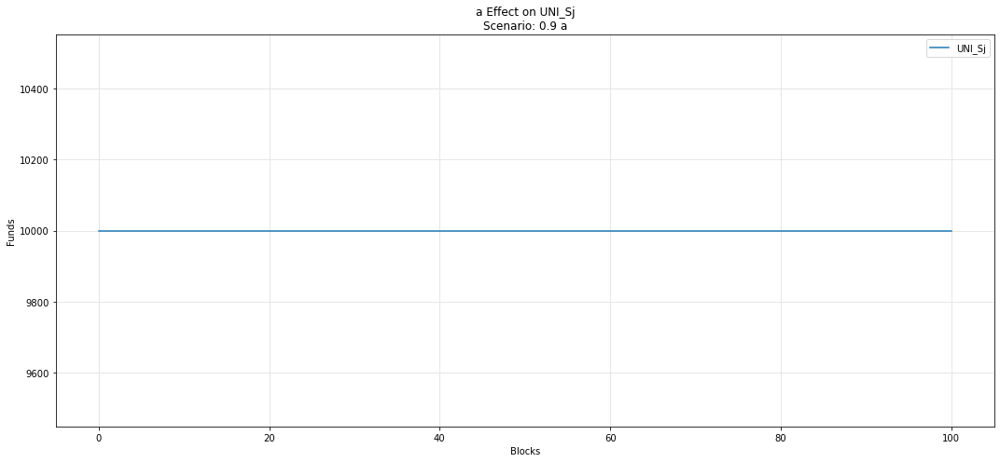

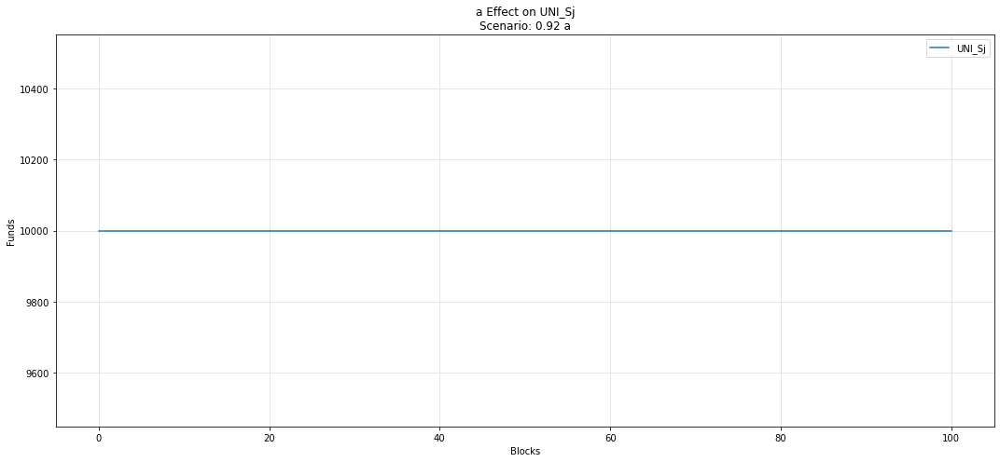

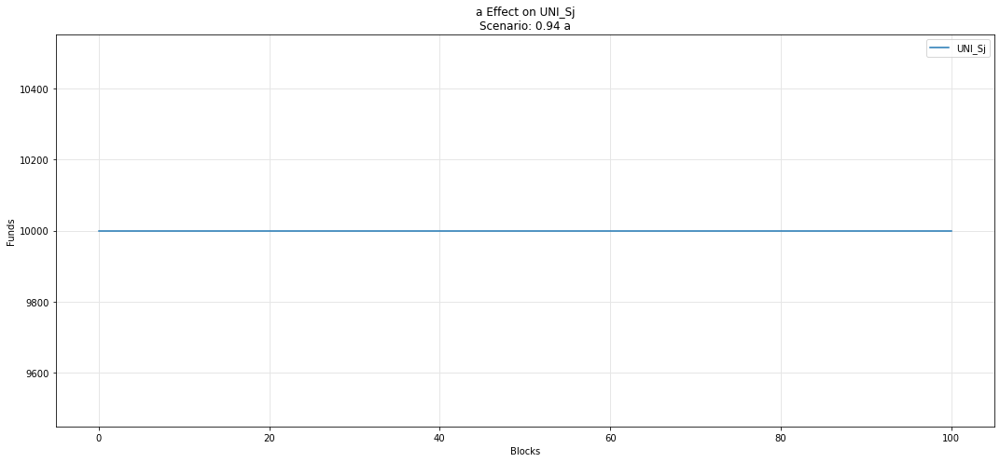

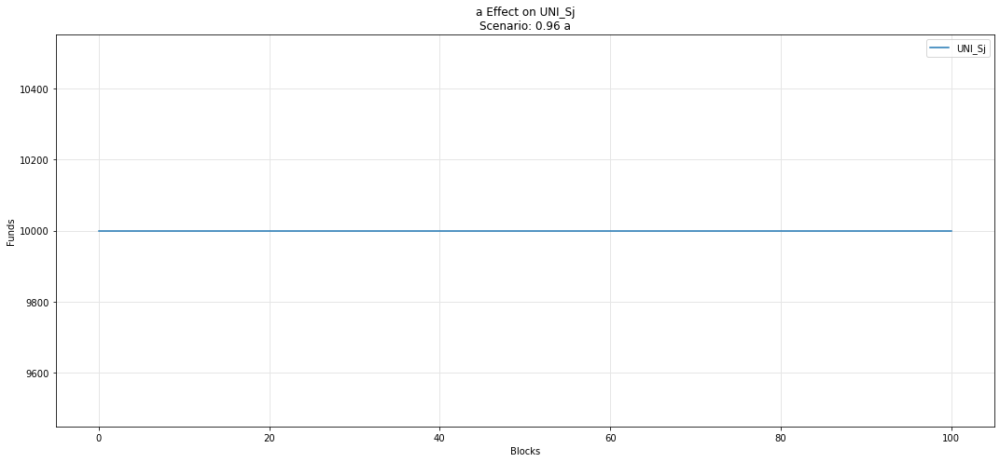

...

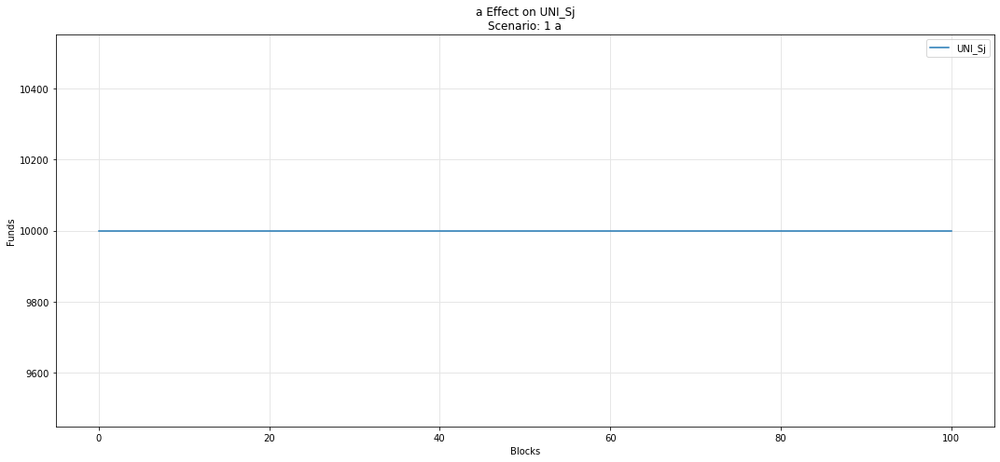

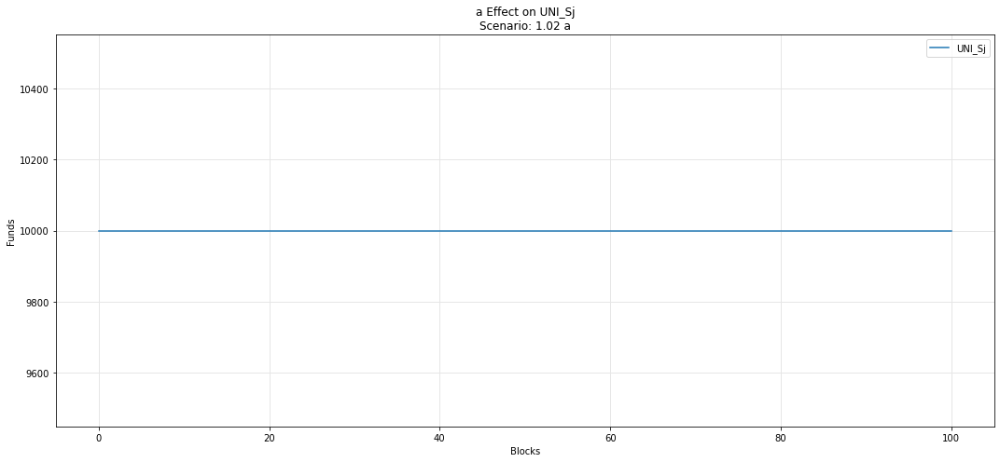

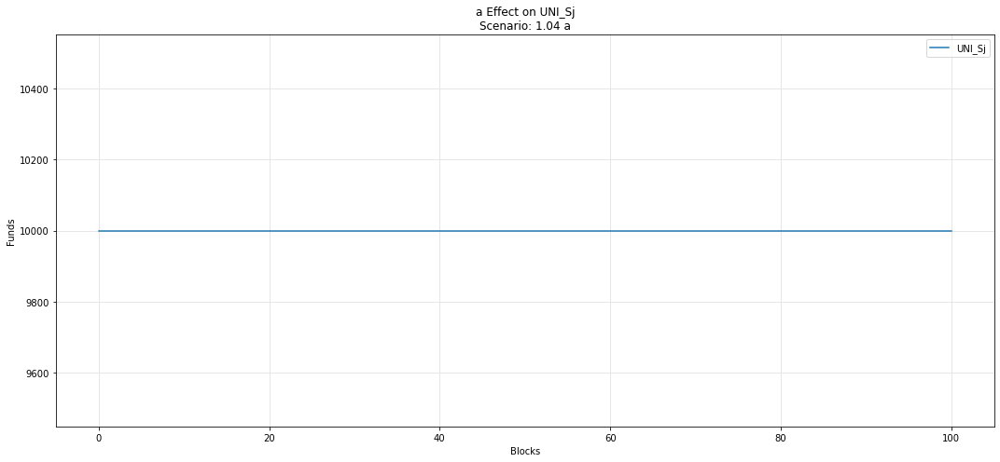

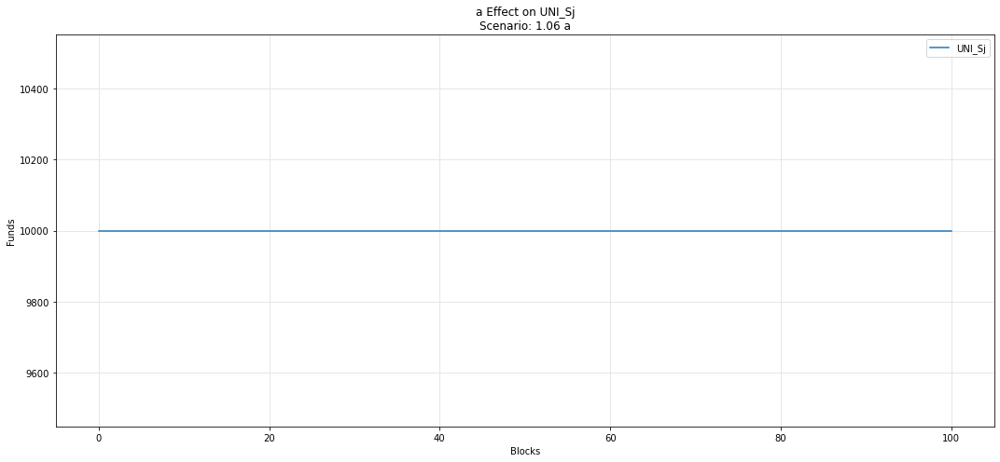

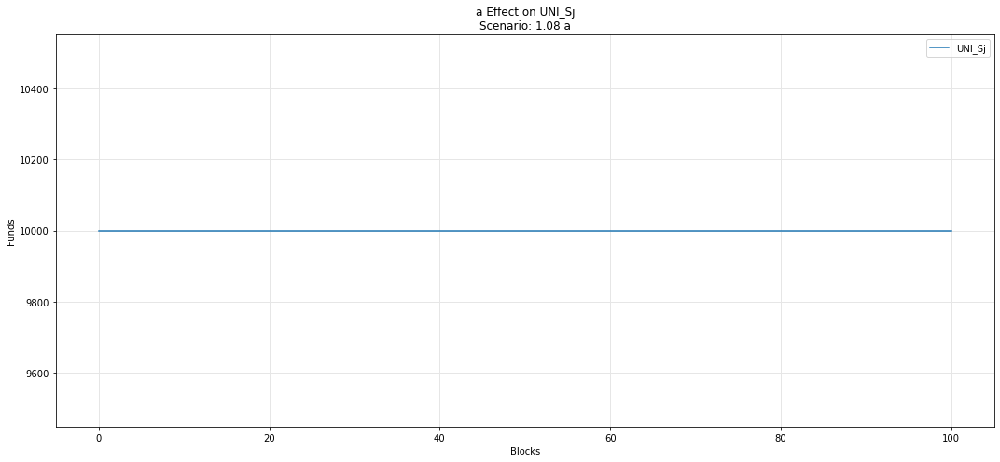

In [42]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sj')

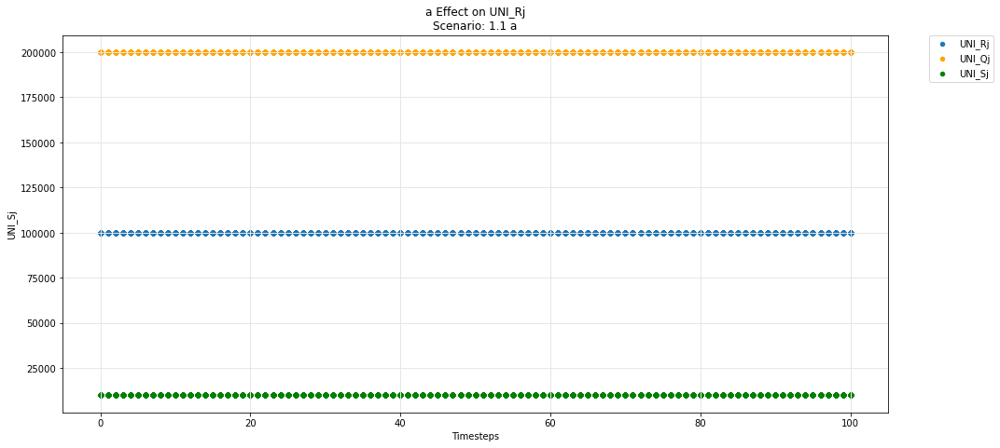

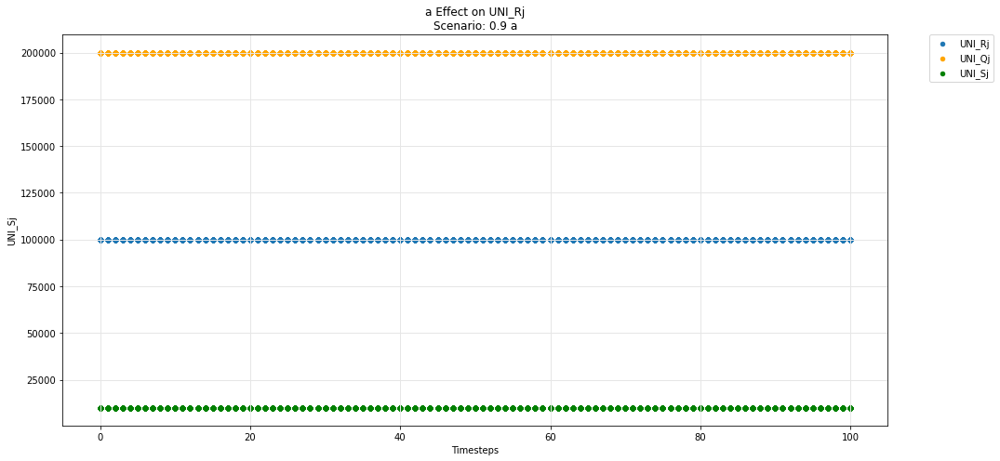

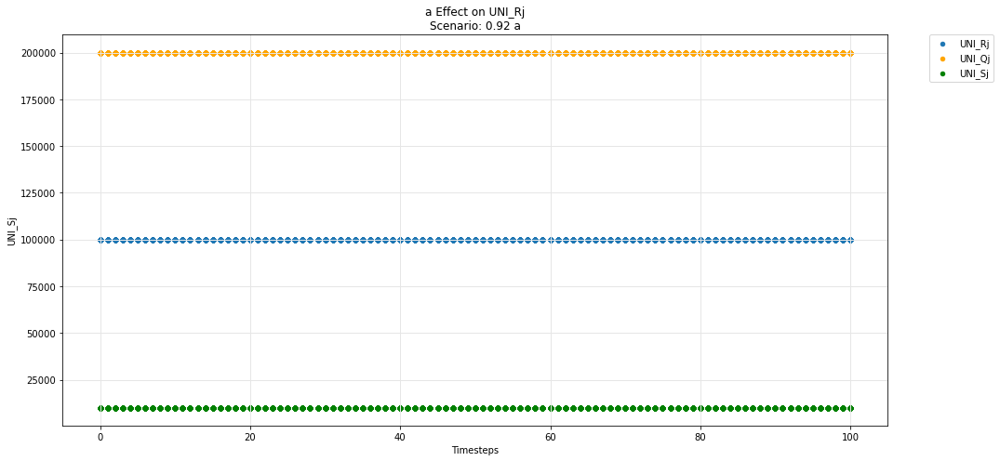

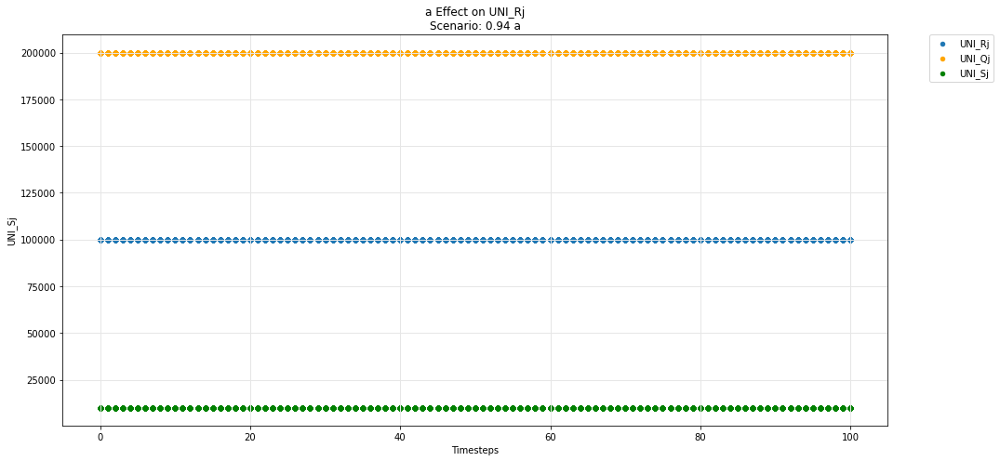

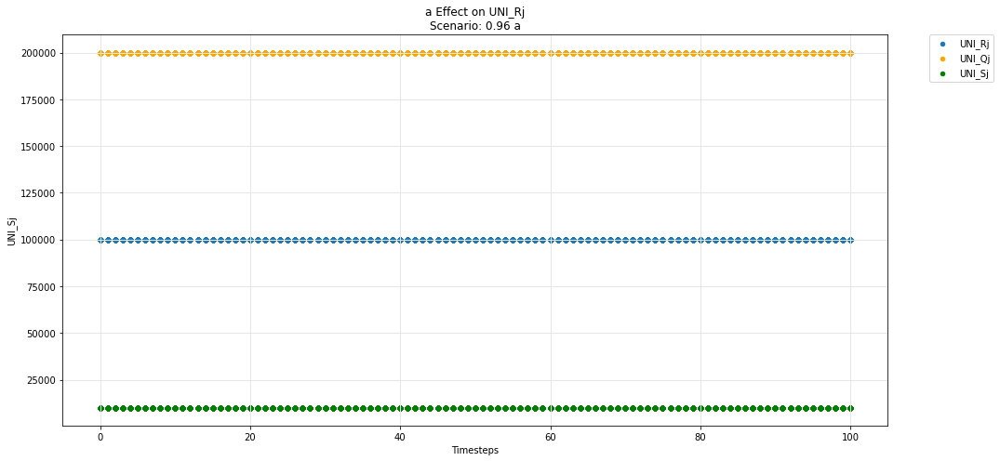

...

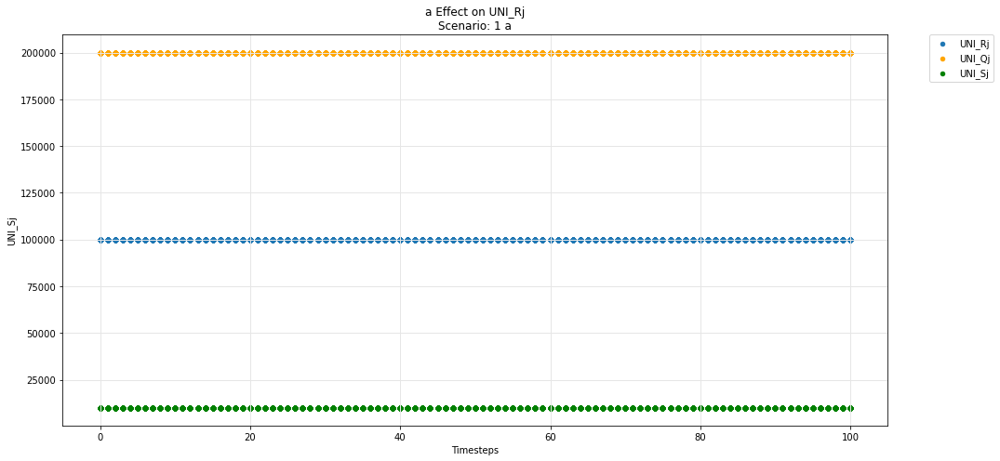

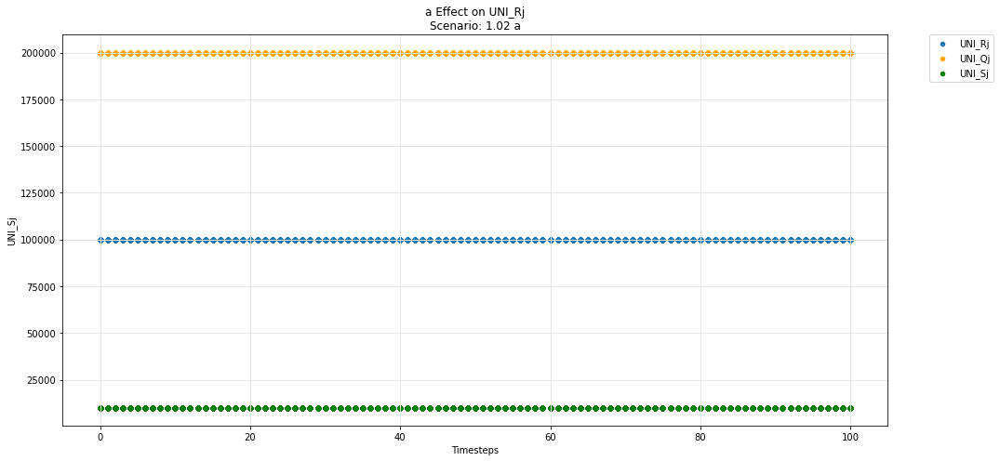

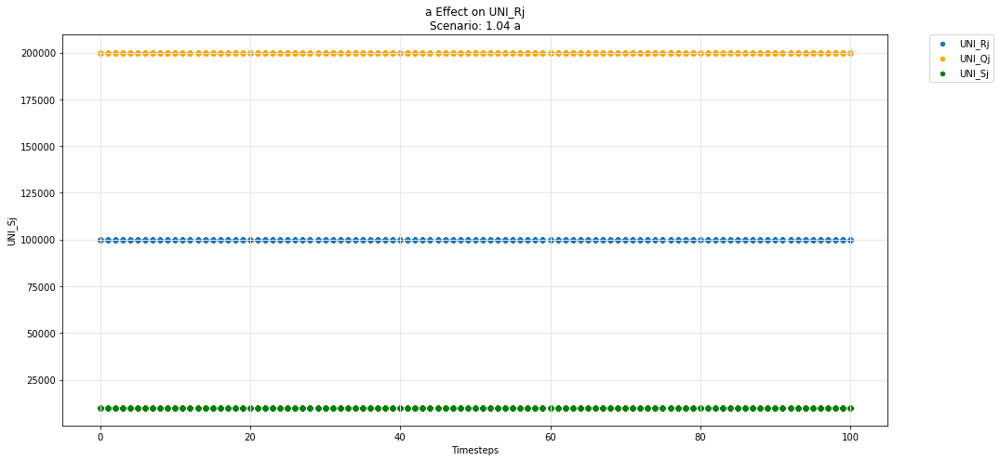

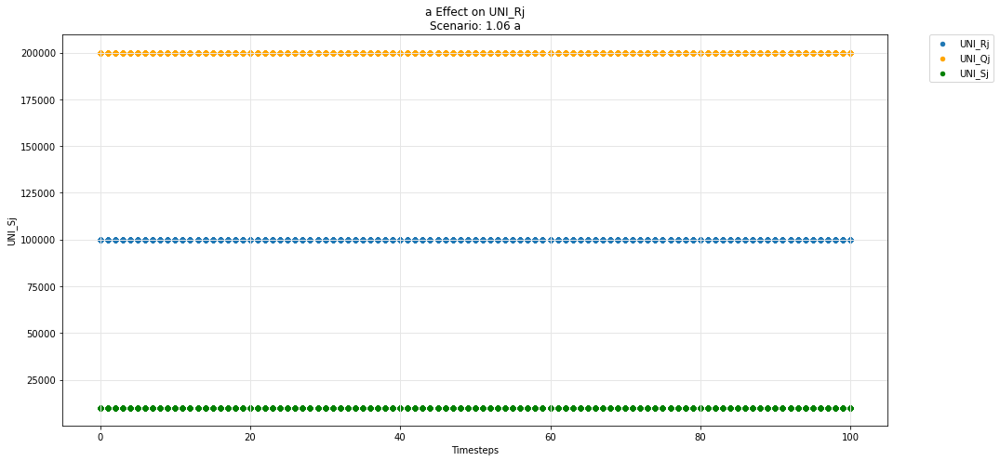

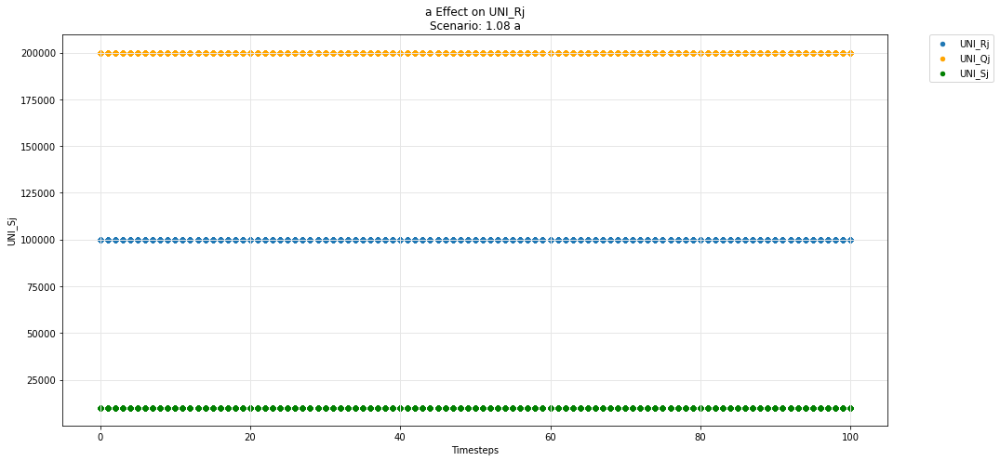

In [43]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Rj', 'UNI_Qj', 'UNI_Sj')

## Uniswap -- ij-Q instance

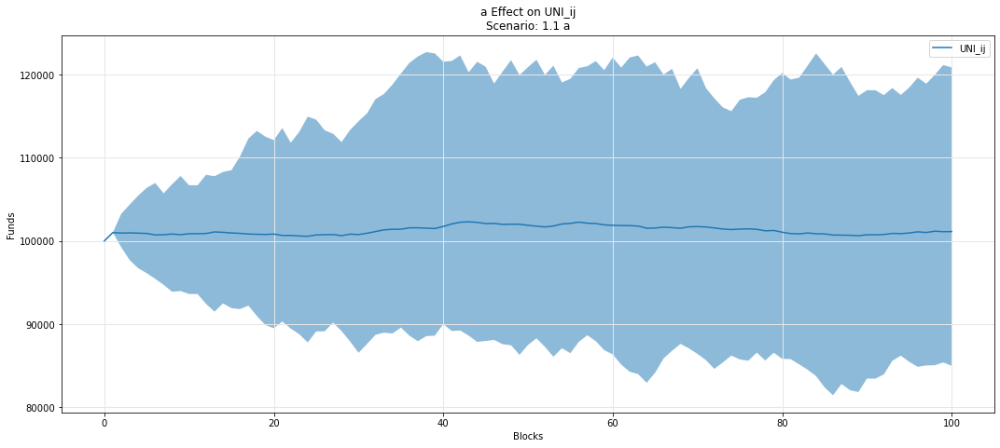

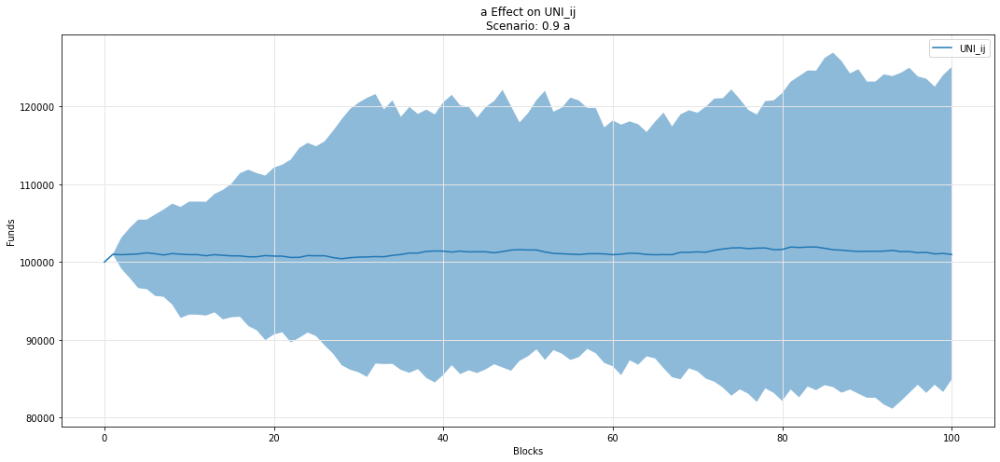

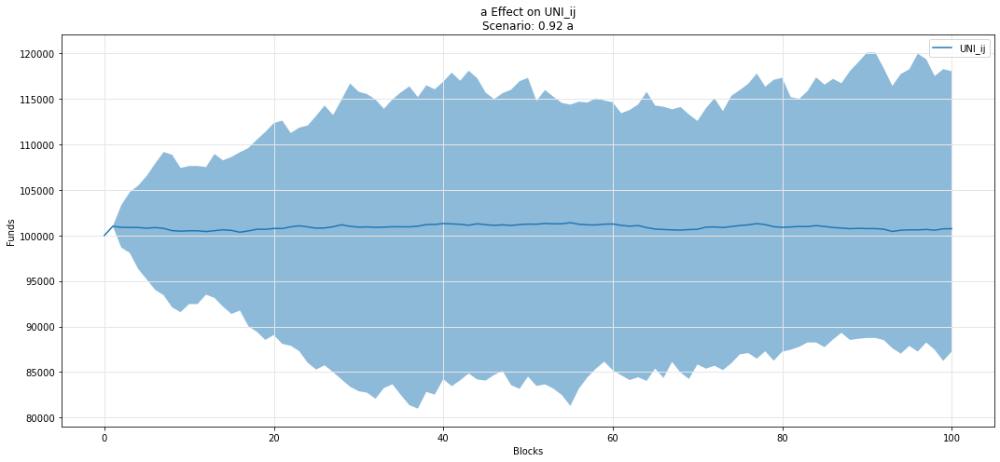

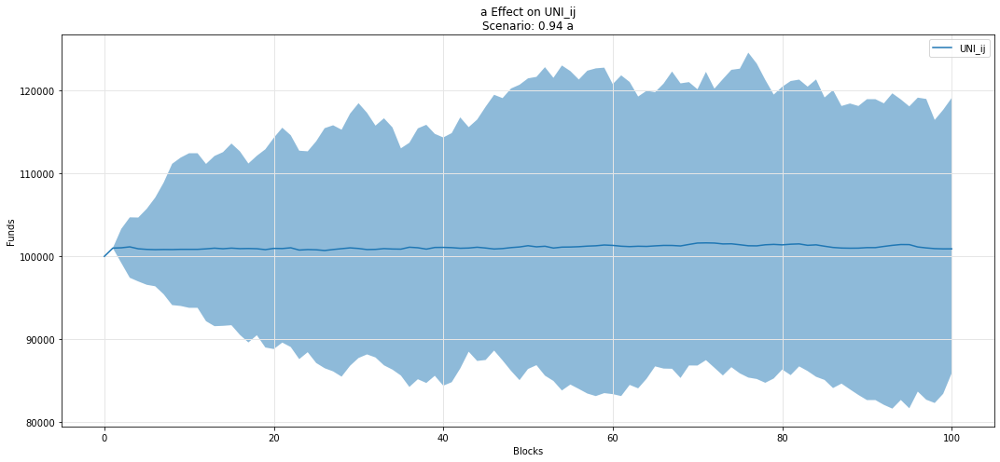

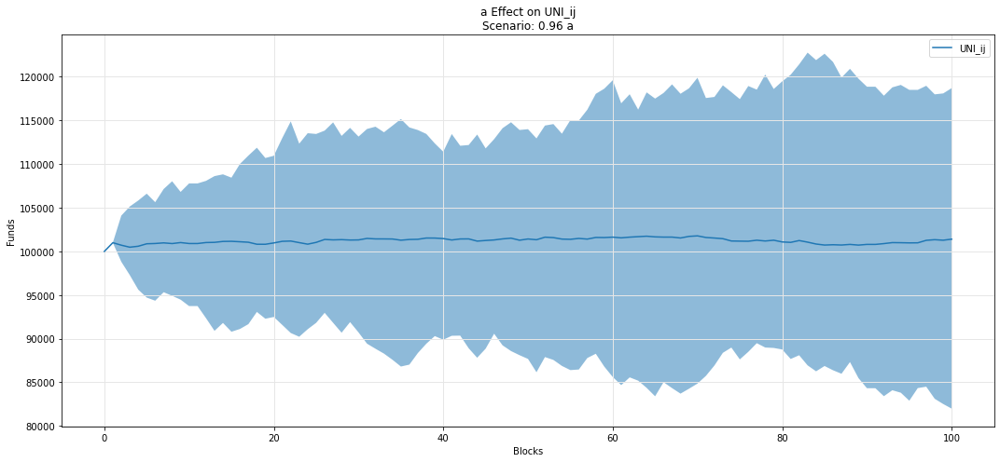

...

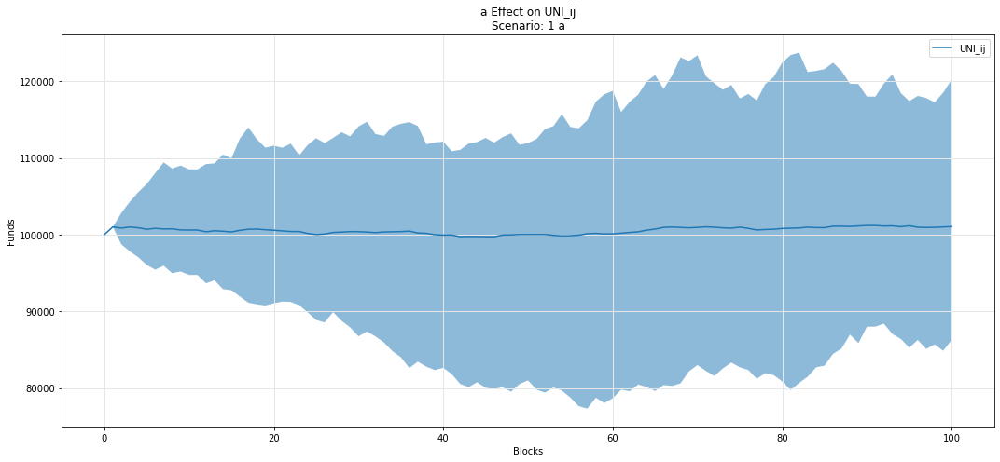

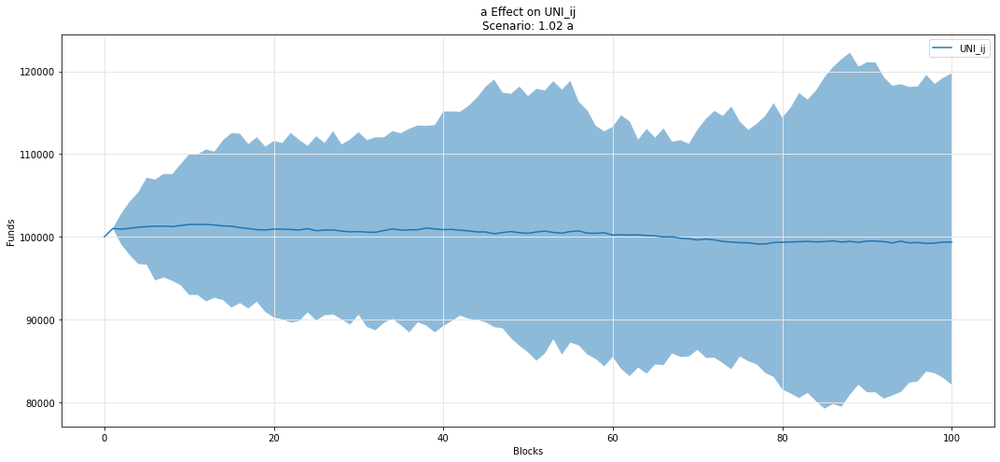

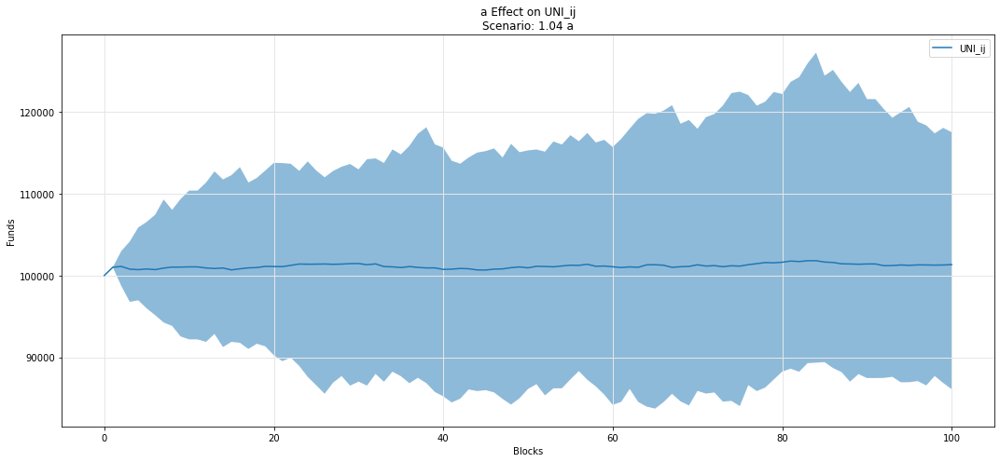

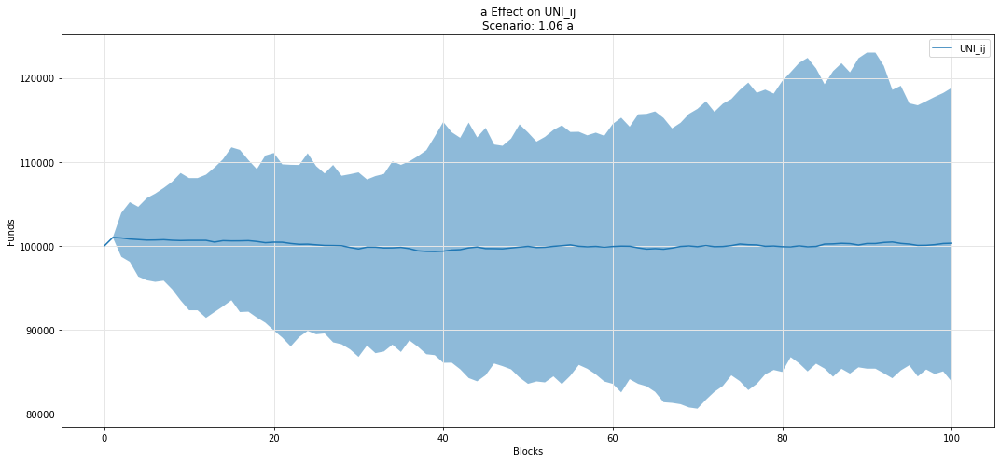

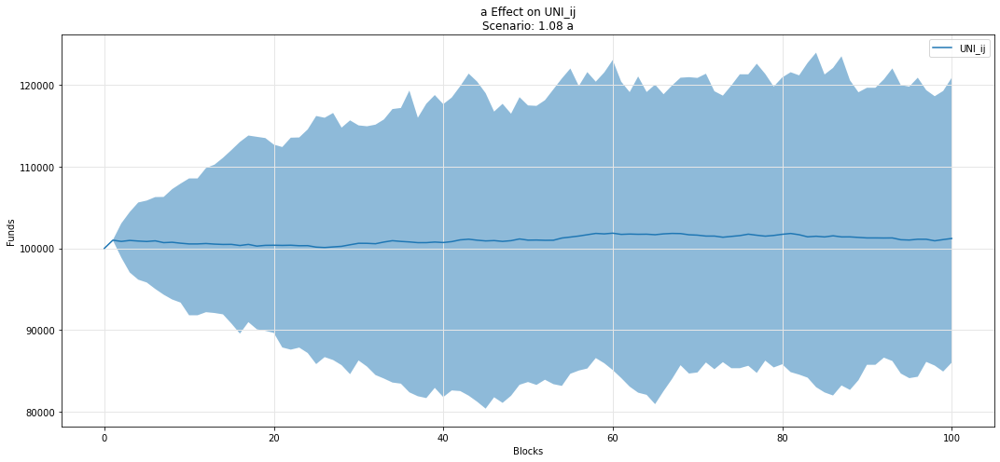

In [44]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ij')

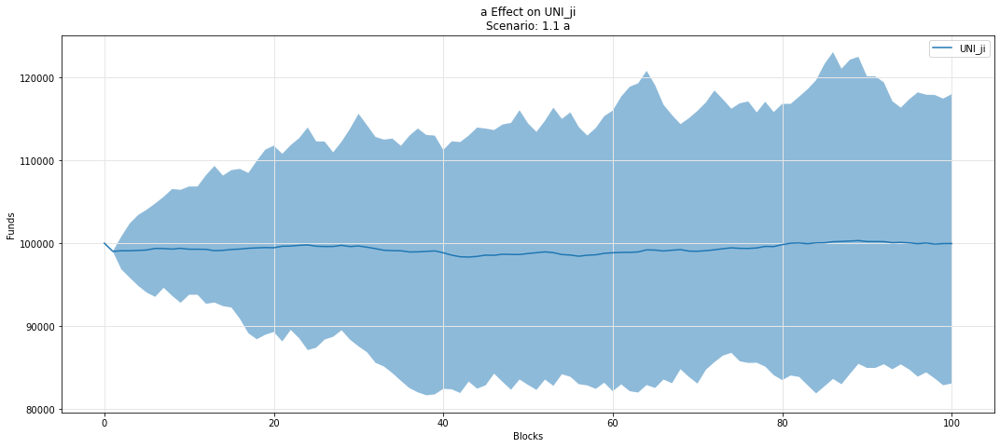

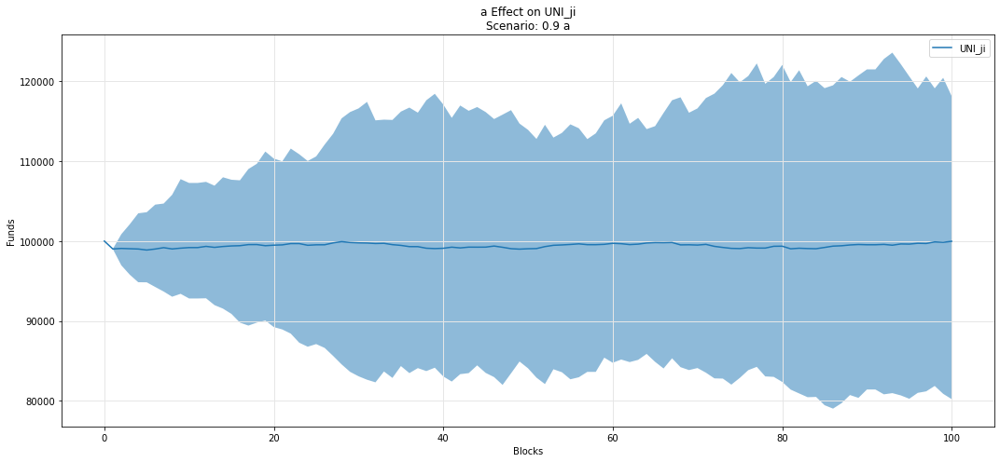

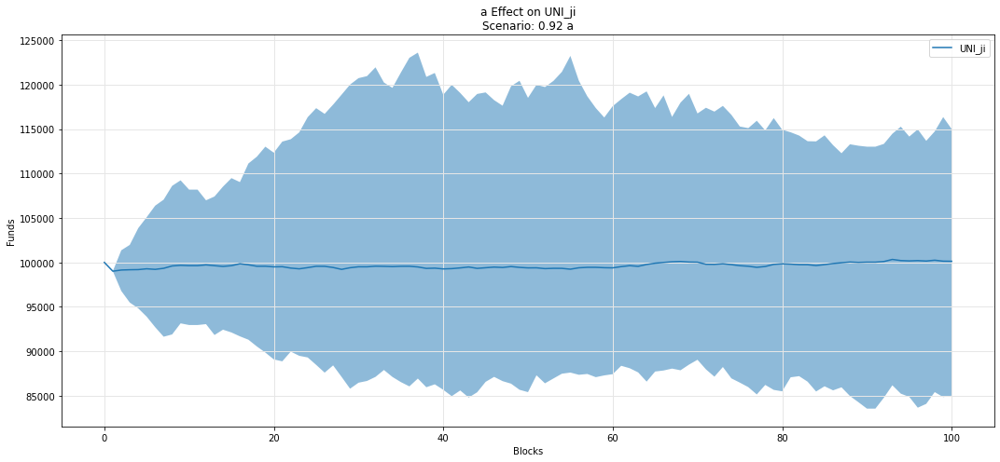

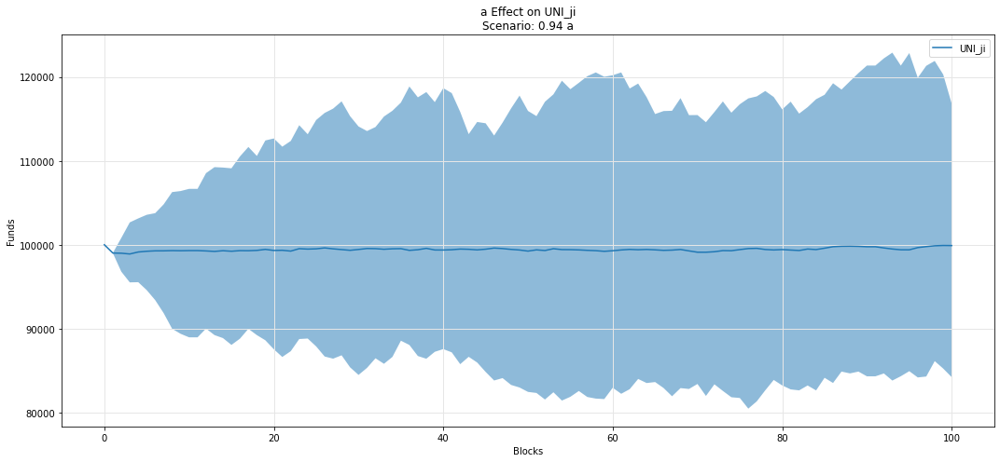

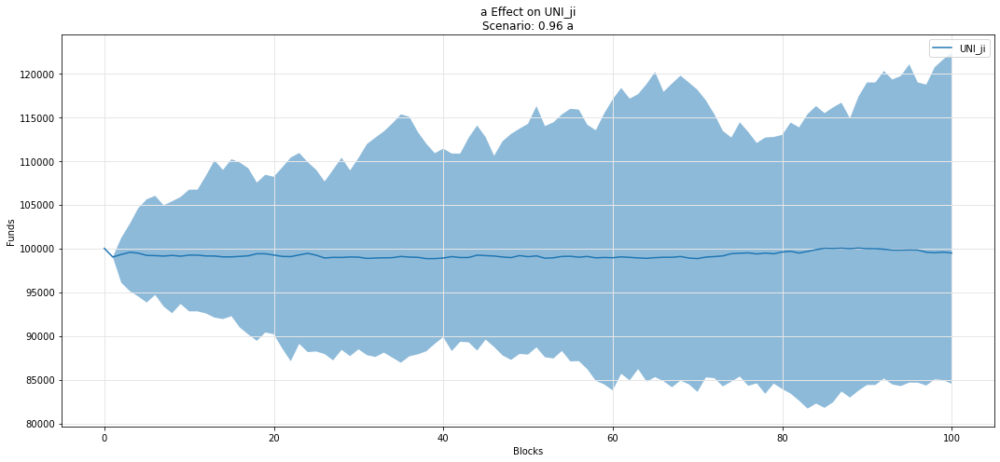

...

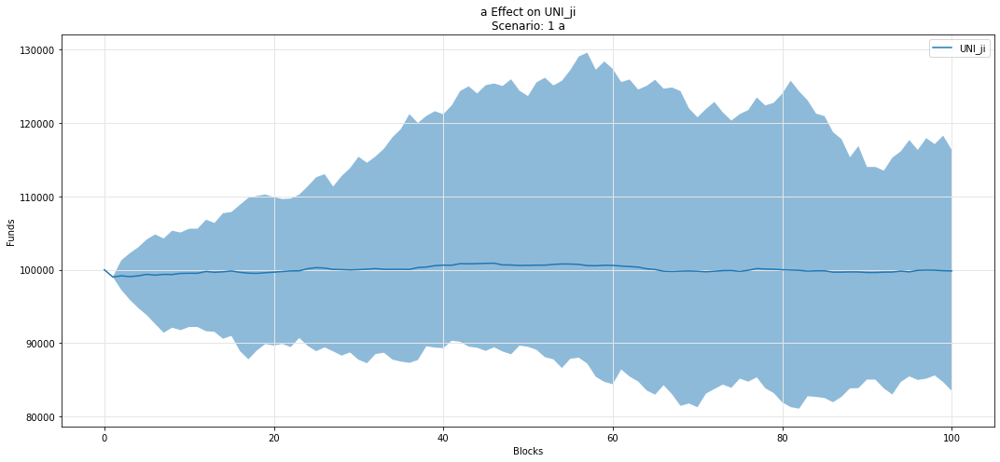

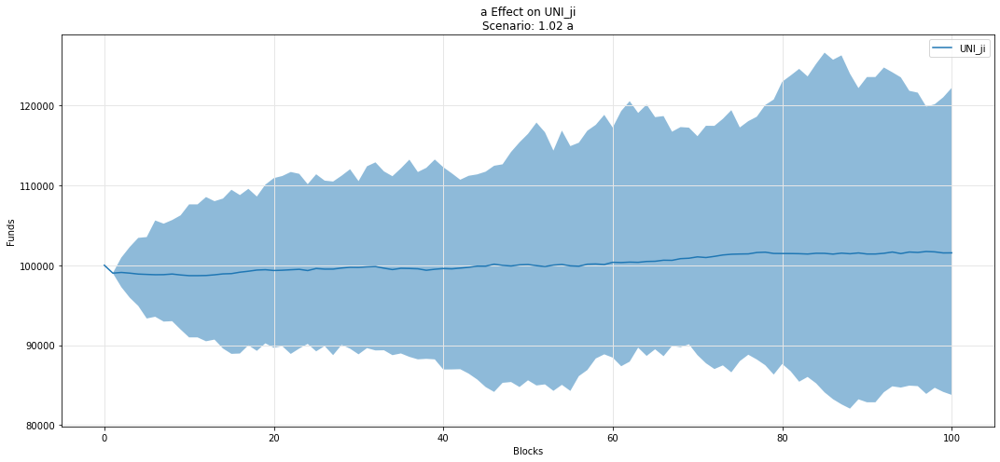

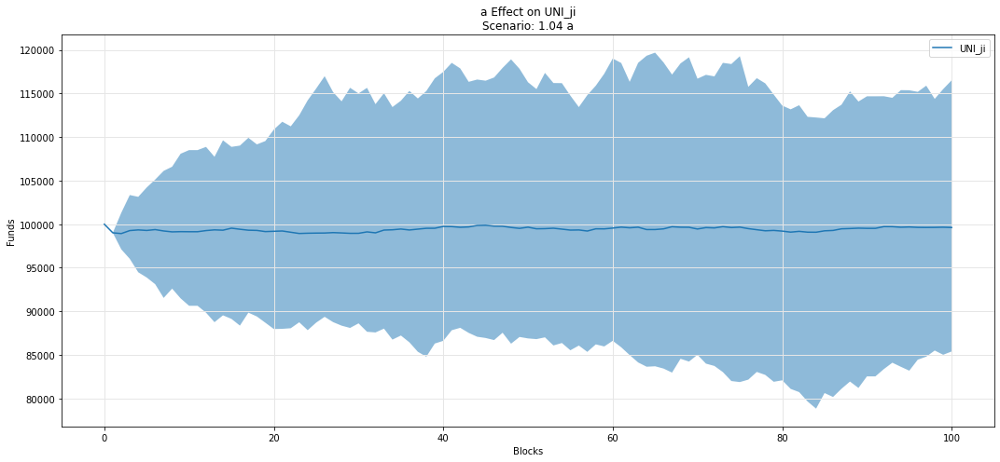

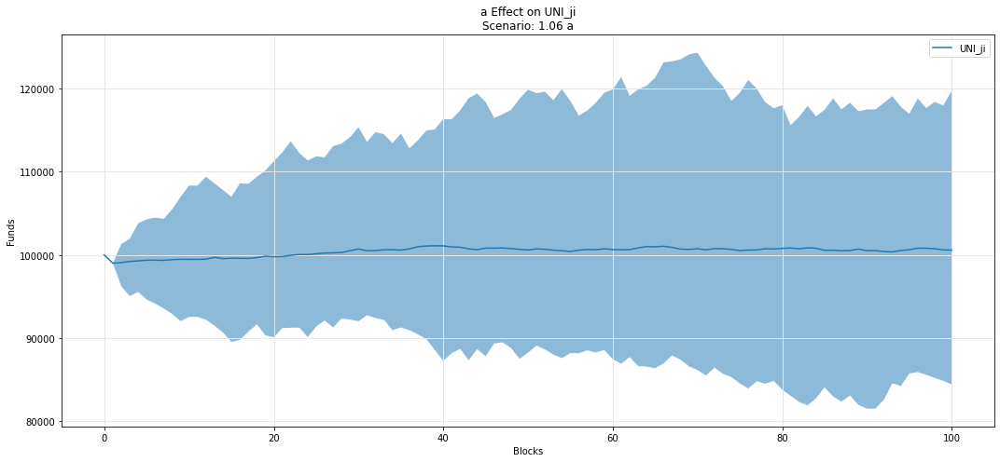

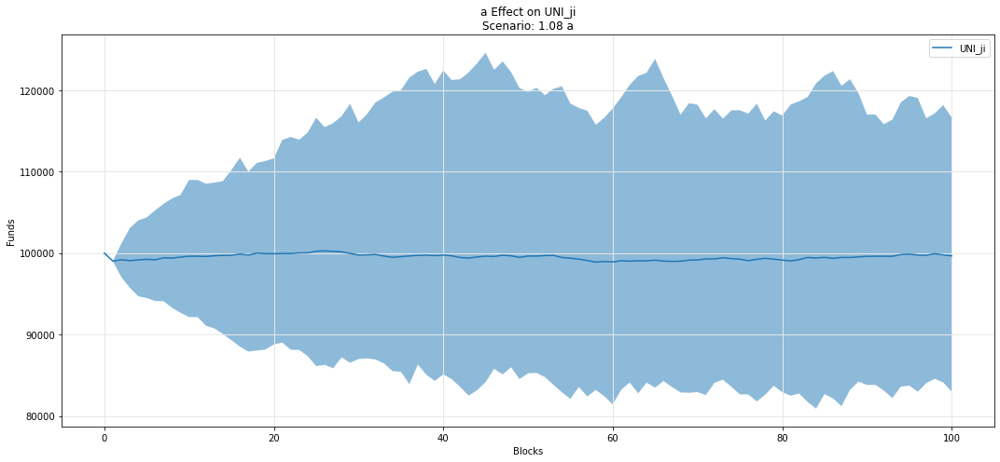

In [45]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ji')

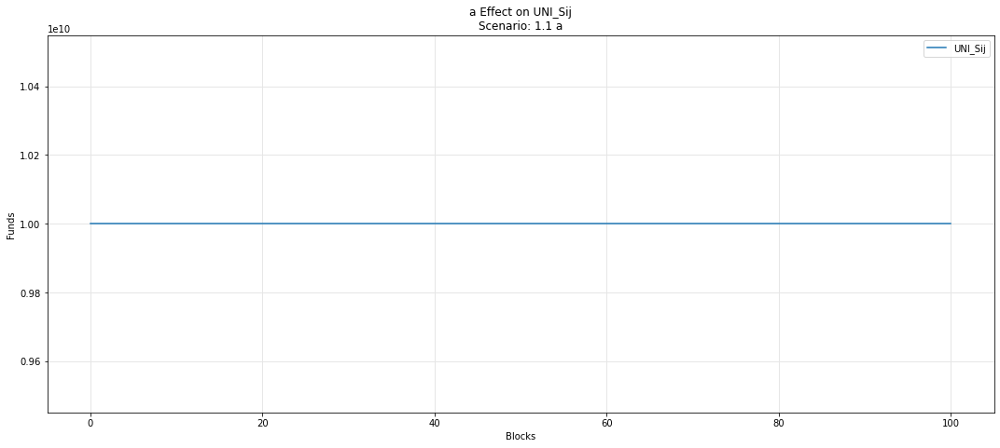

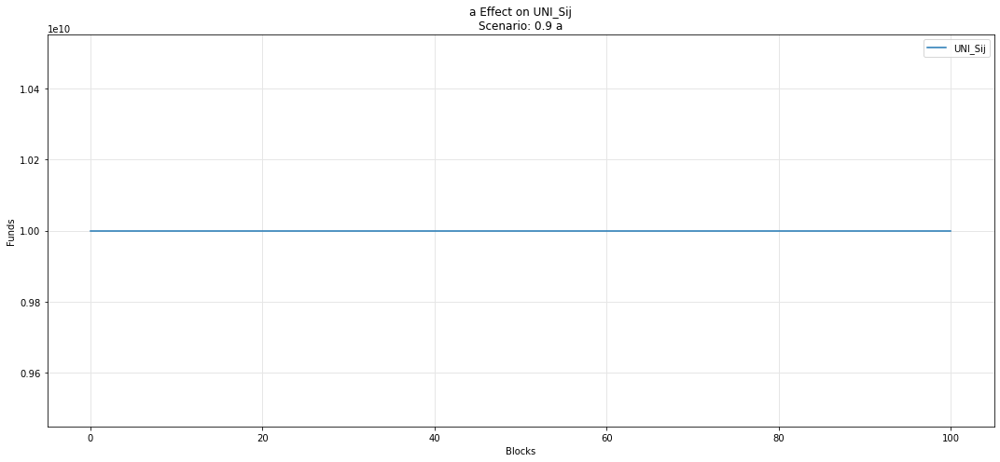

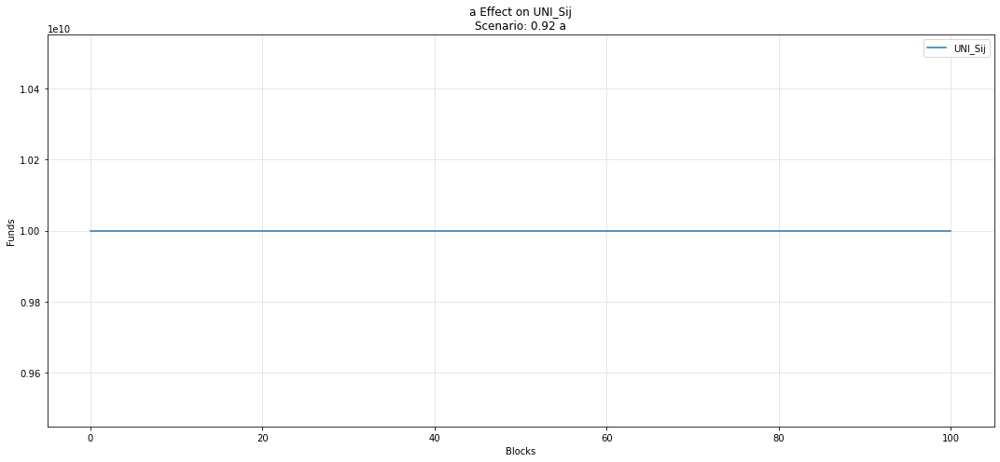

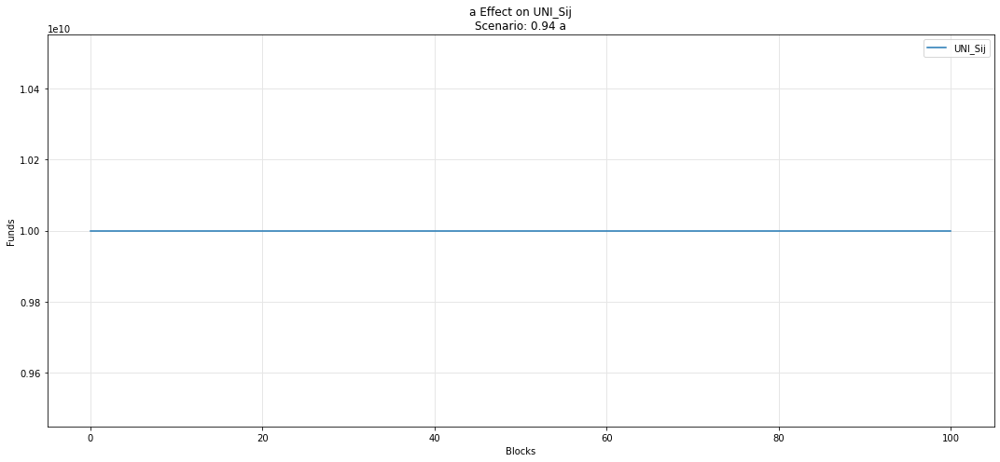

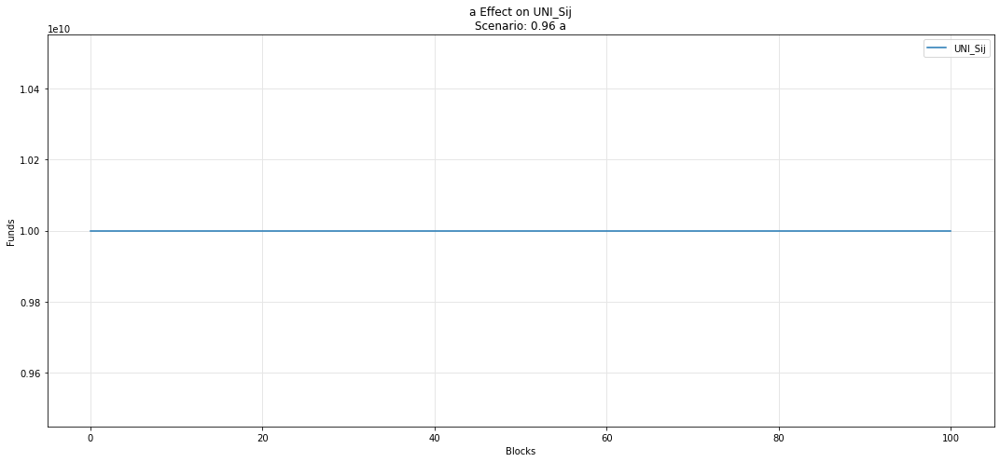

...

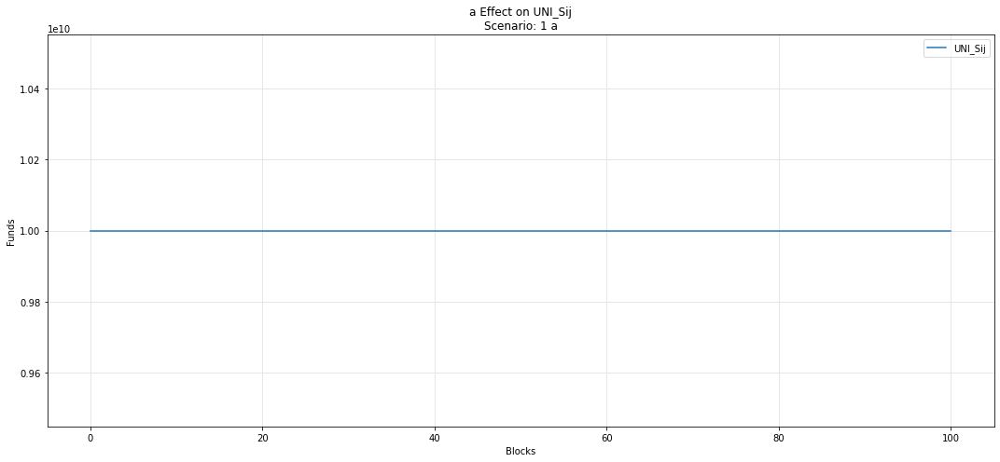

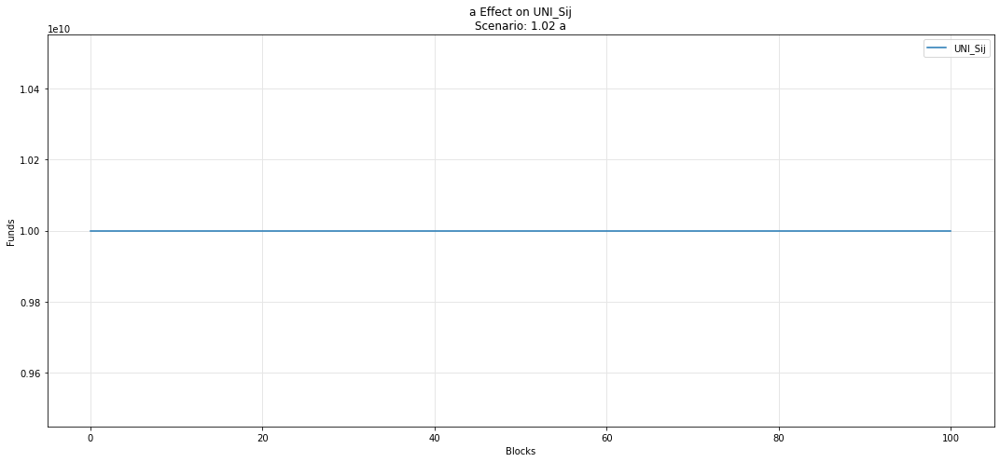

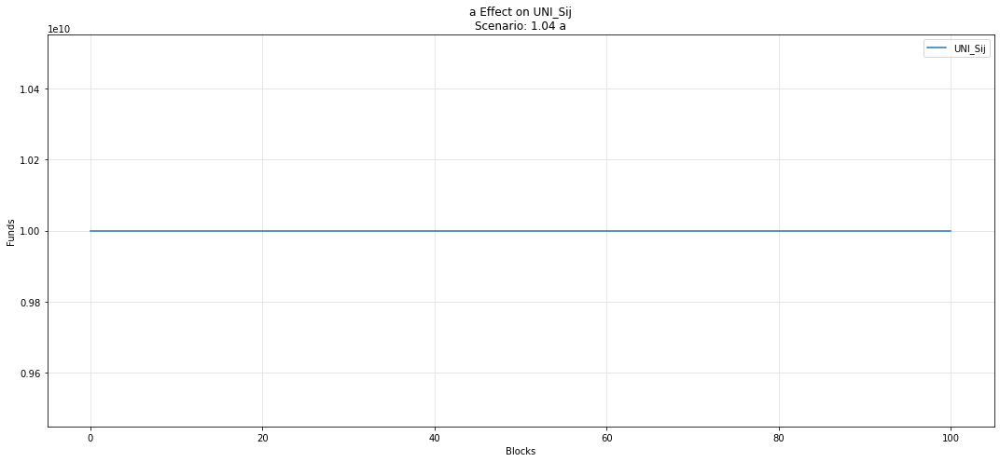

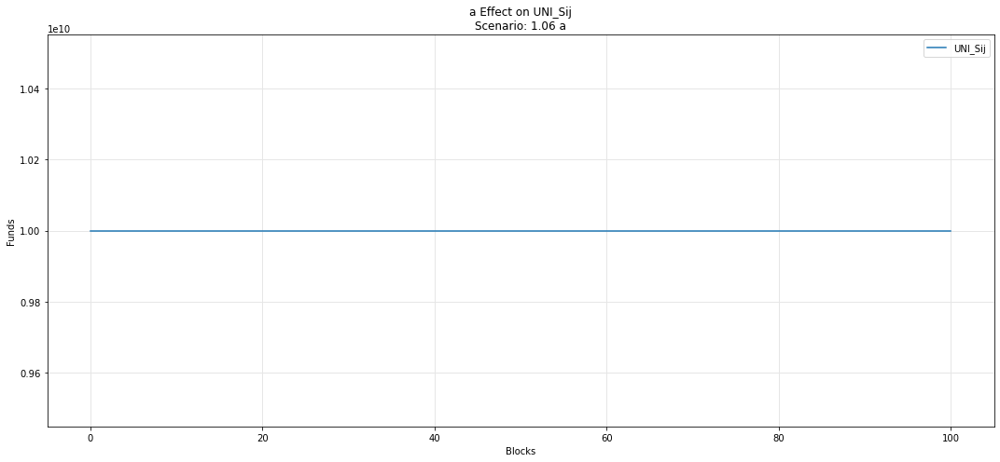

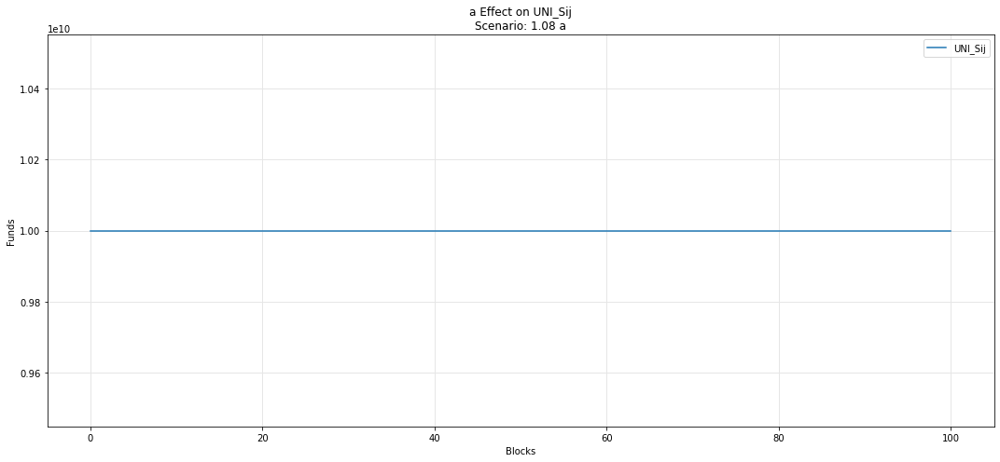

In [46]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sij')

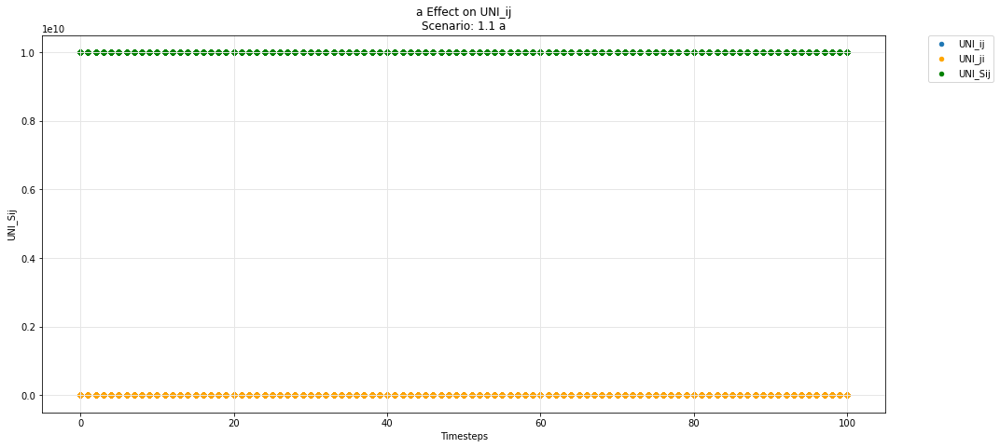

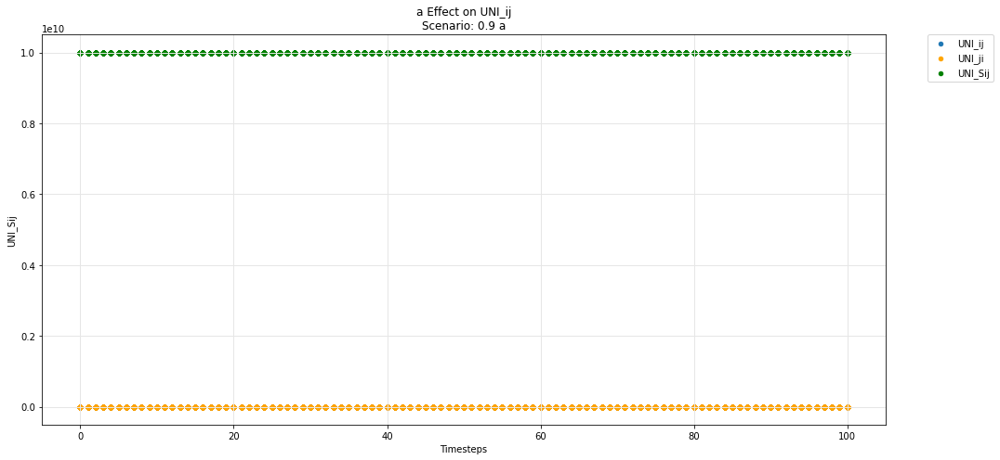

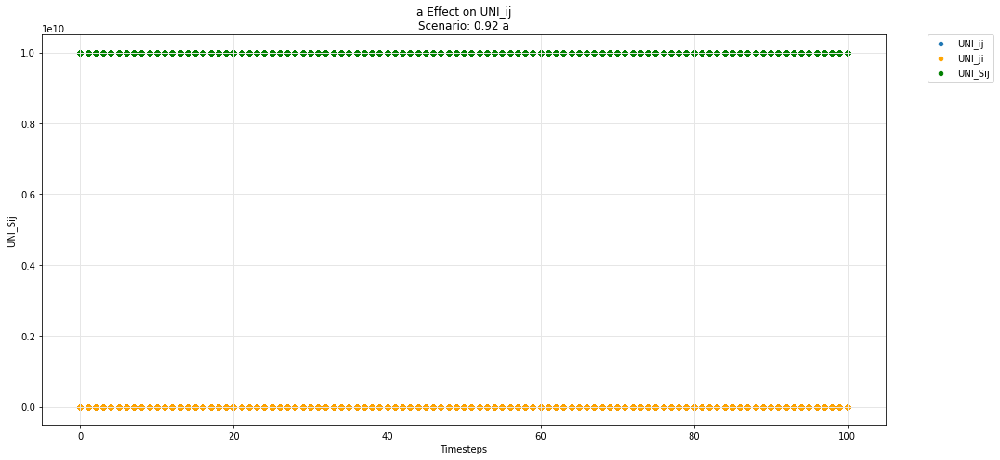

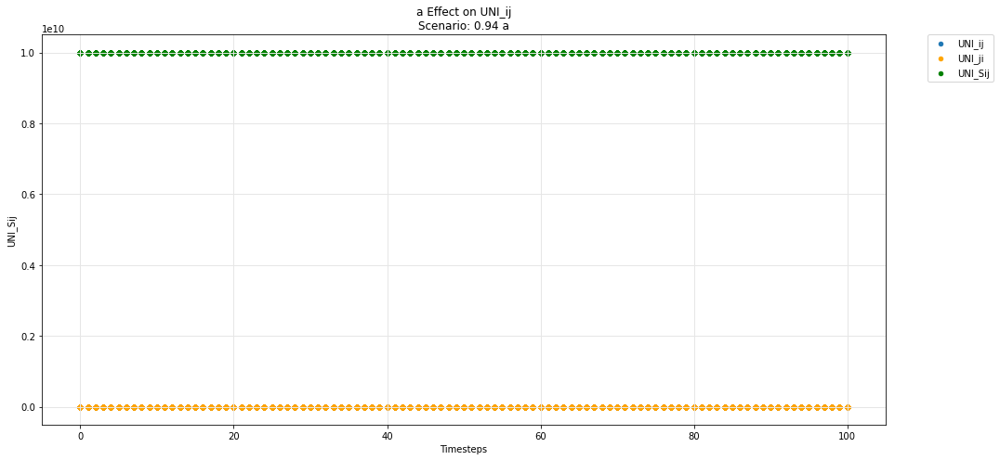

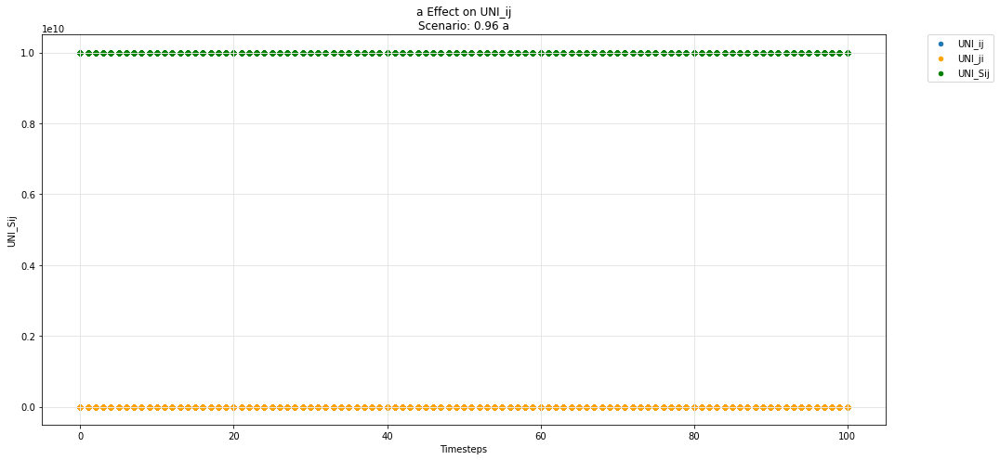

...

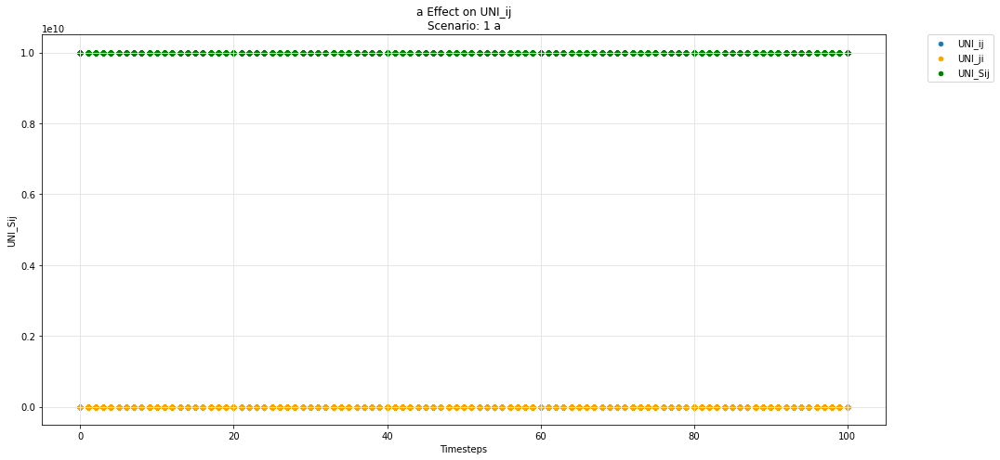

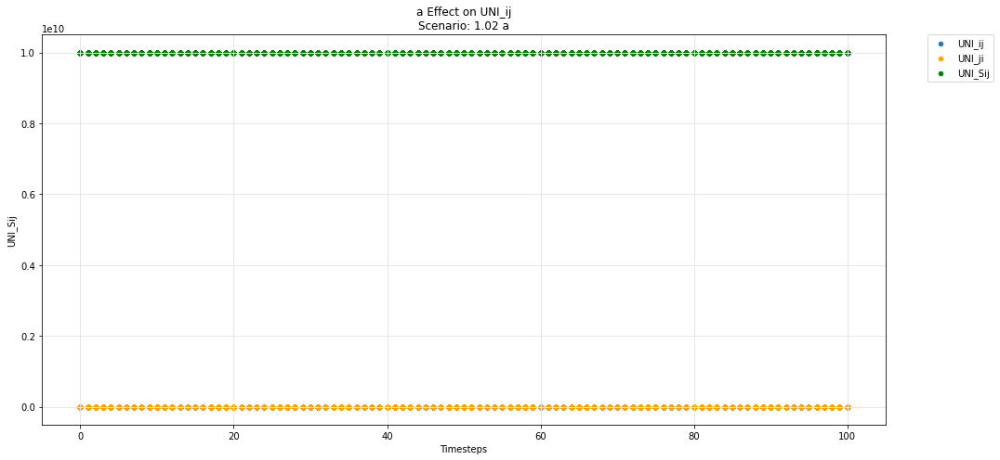

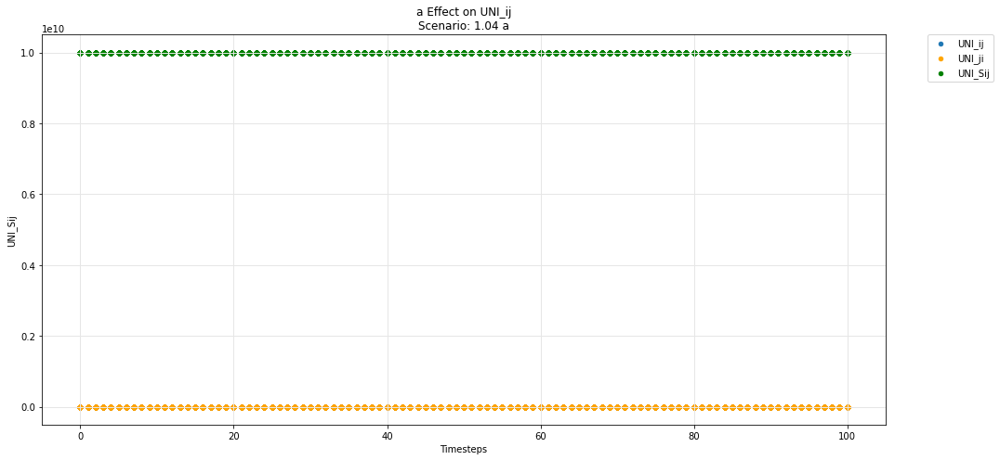

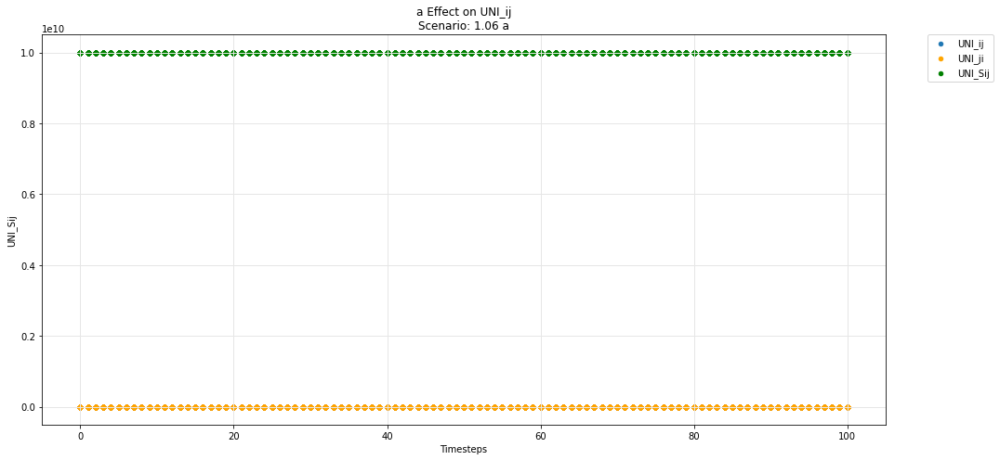

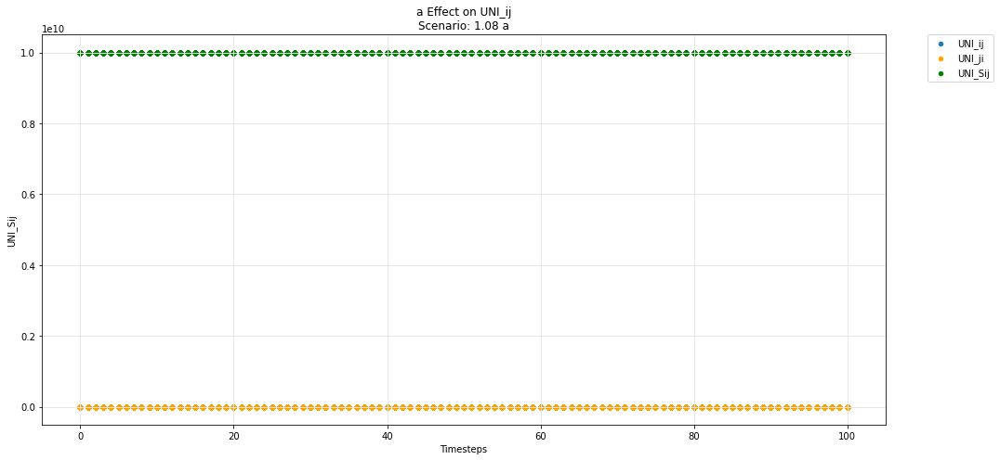

In [47]:
param_test_plot(experiments, config_ids, 'a', 'UNI_ij', 'UNI_ji', 'UNI_Sij')

## Hydra -- base

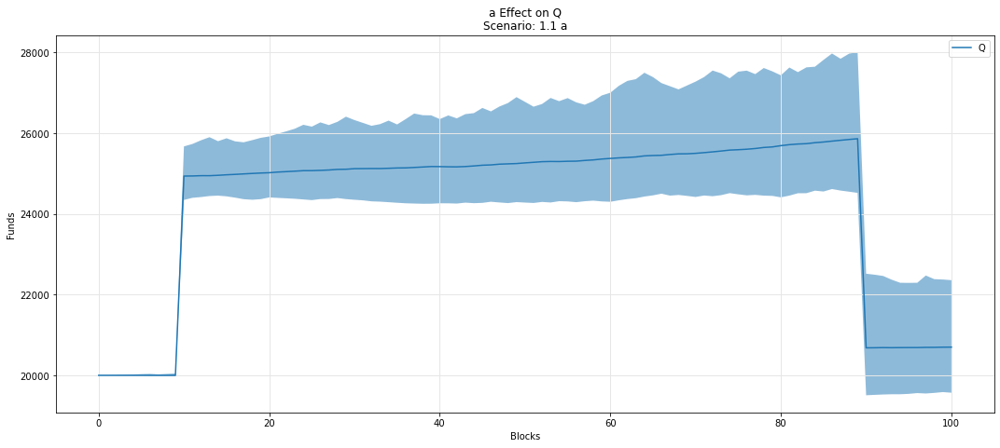

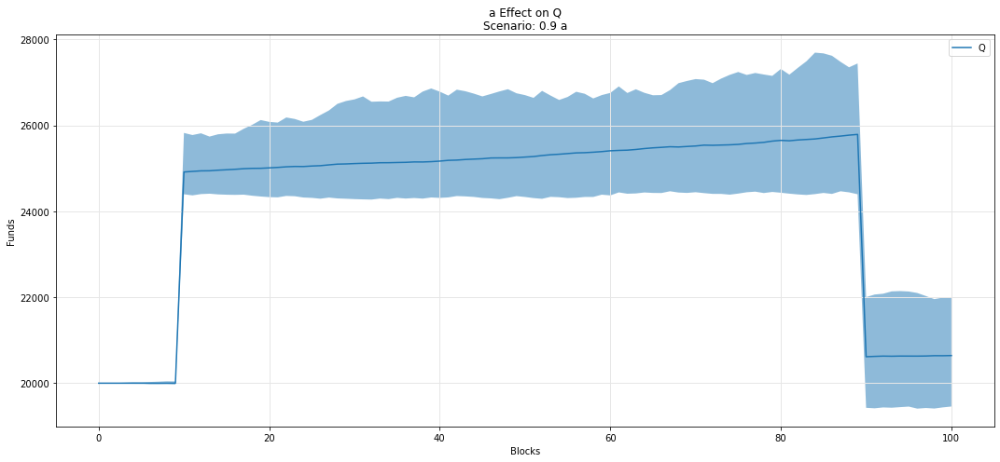

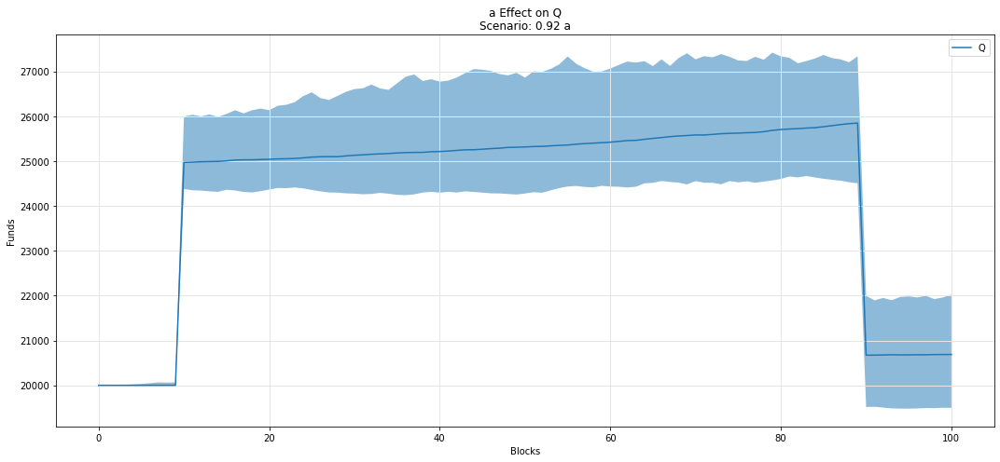

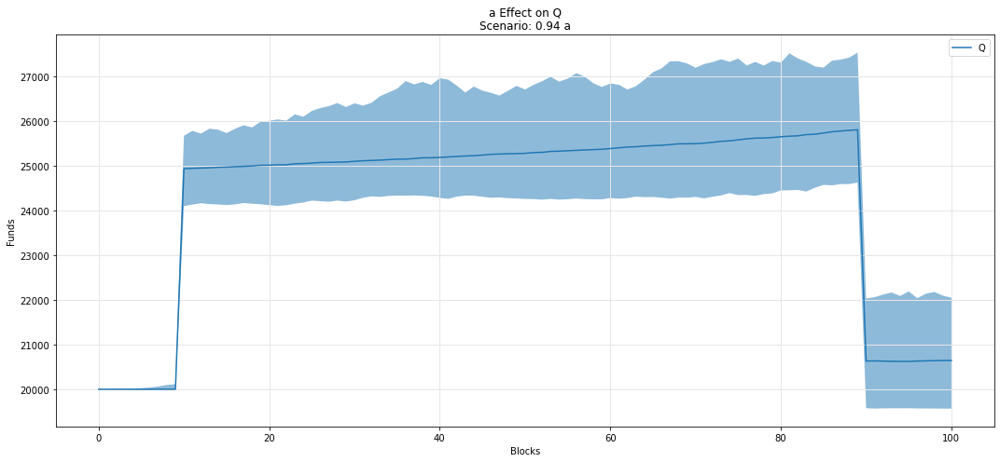

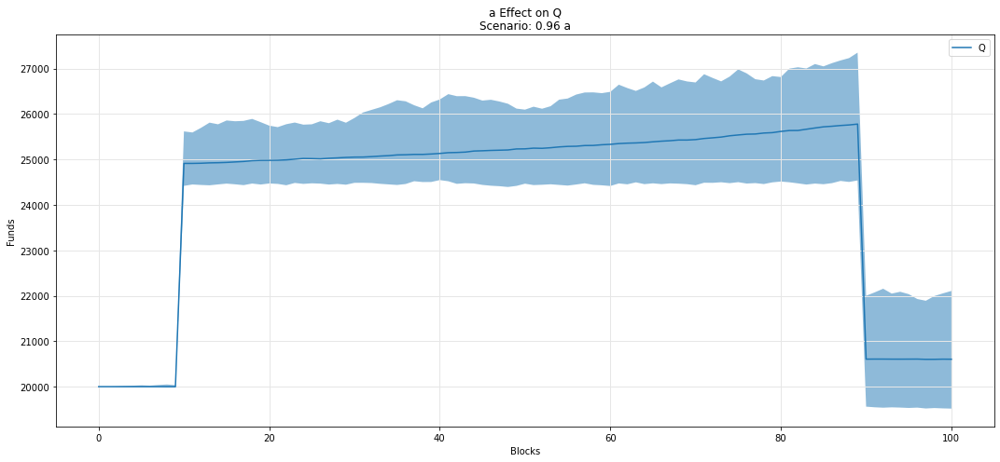

...

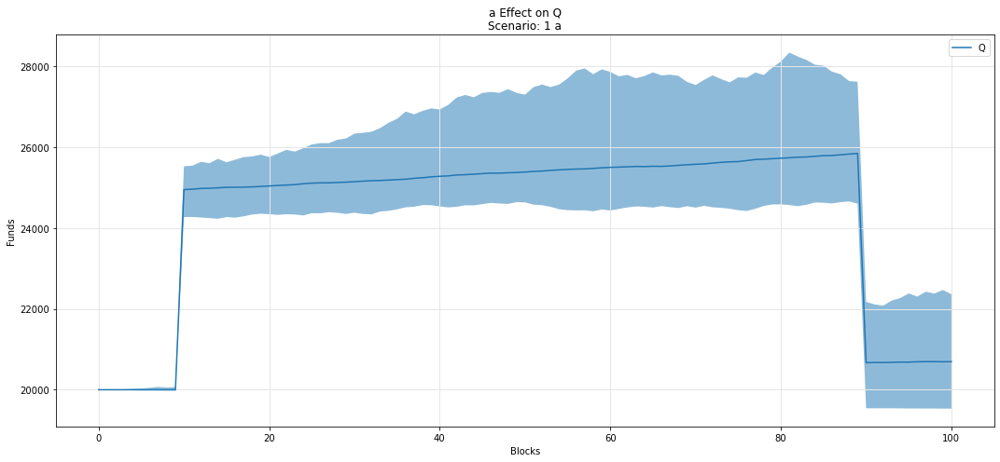

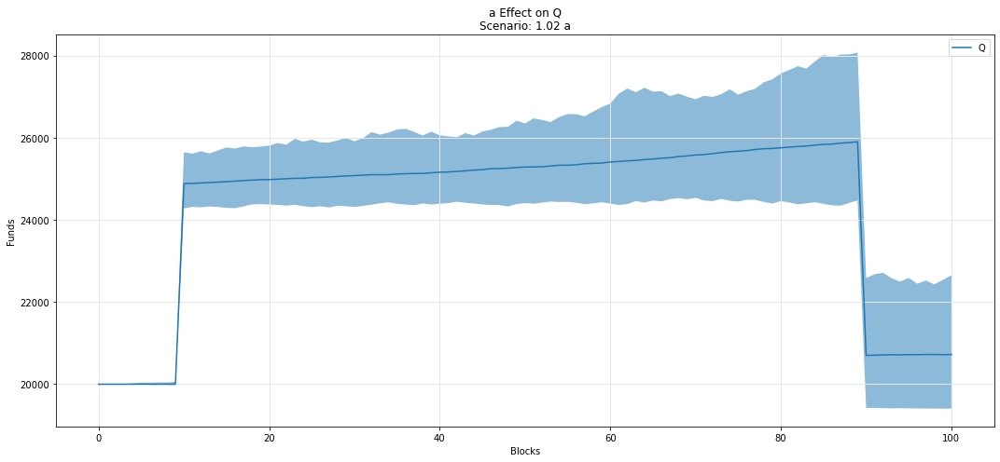

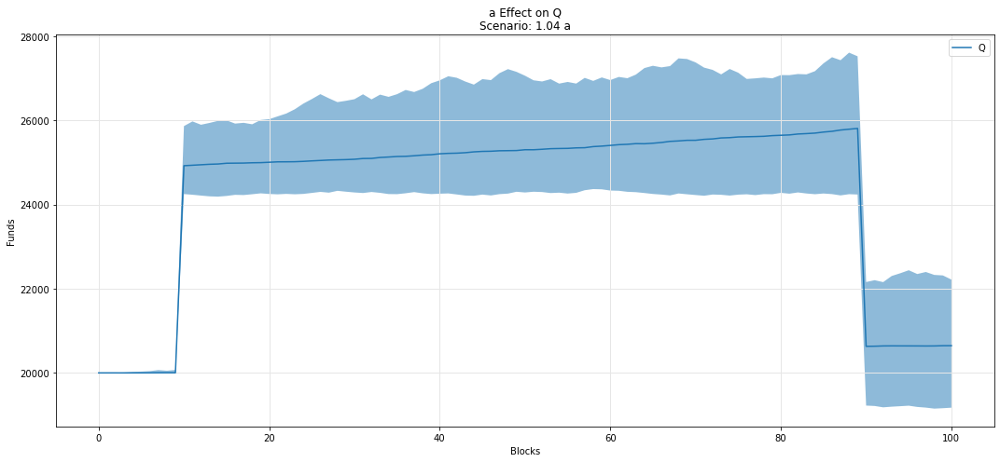

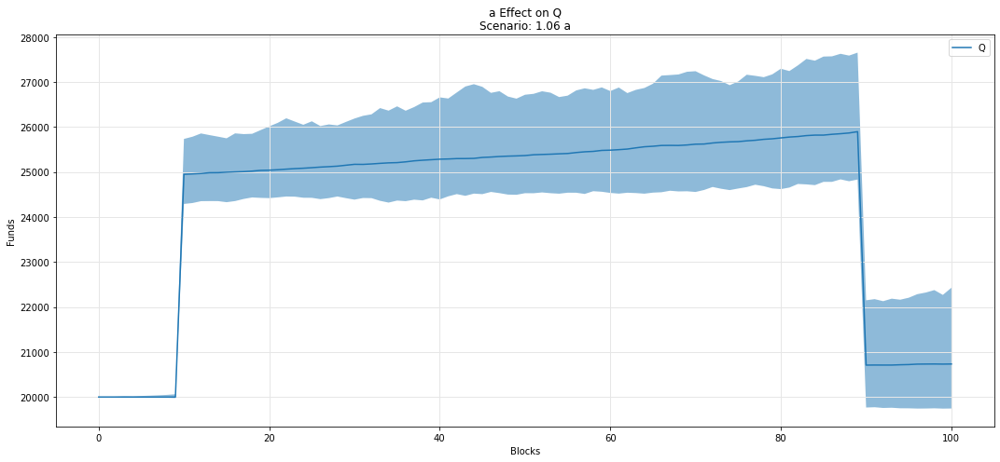

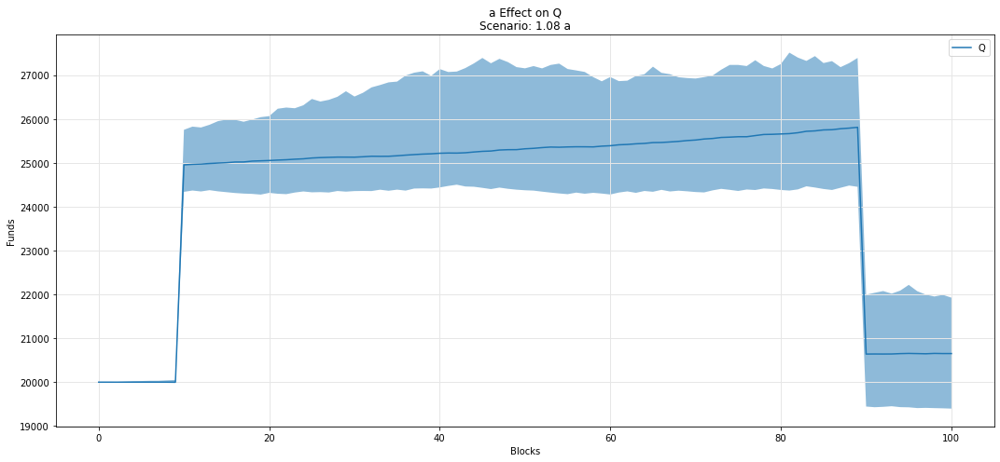

In [48]:
param_fan_plot3(experiments, config_ids, 'a','Q')

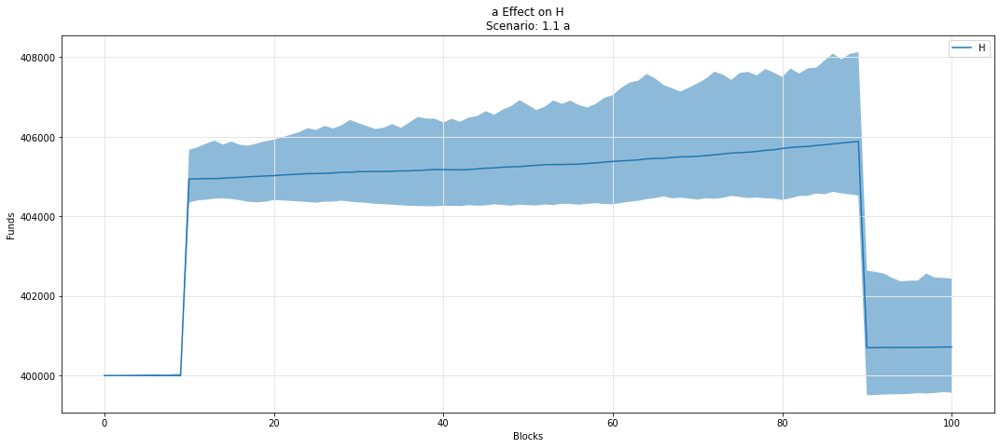

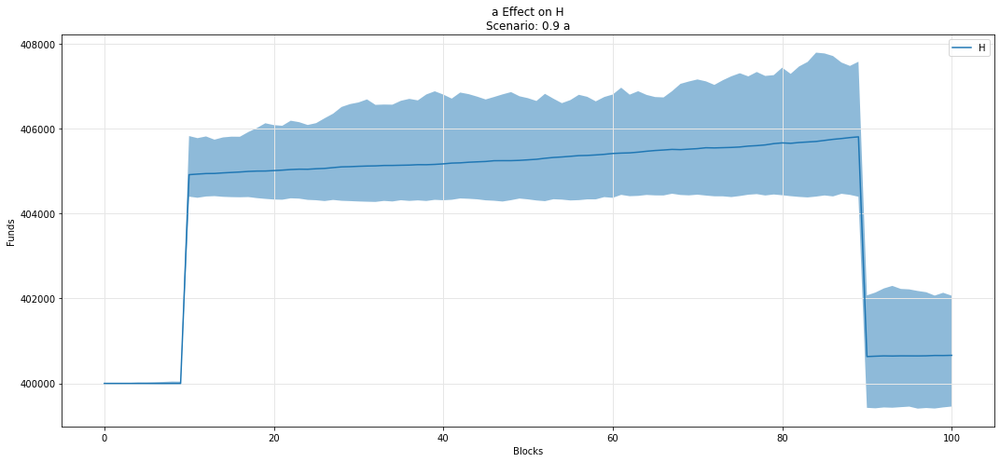

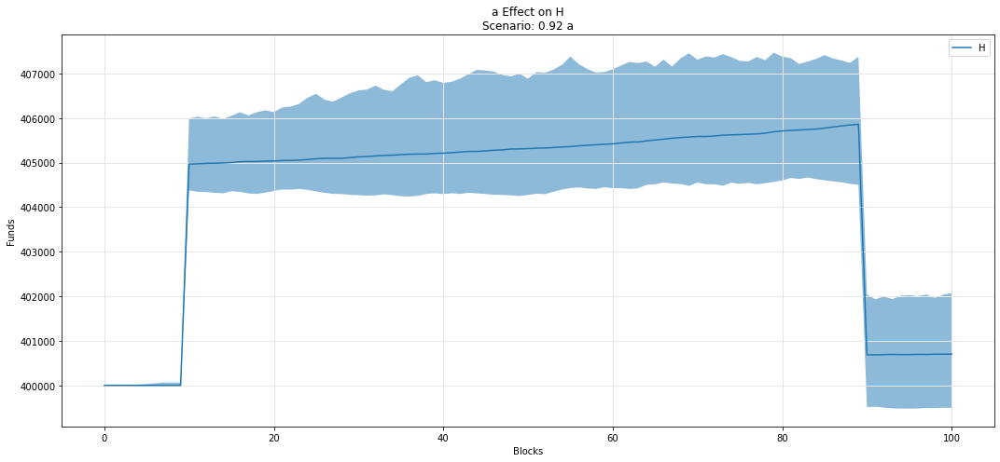

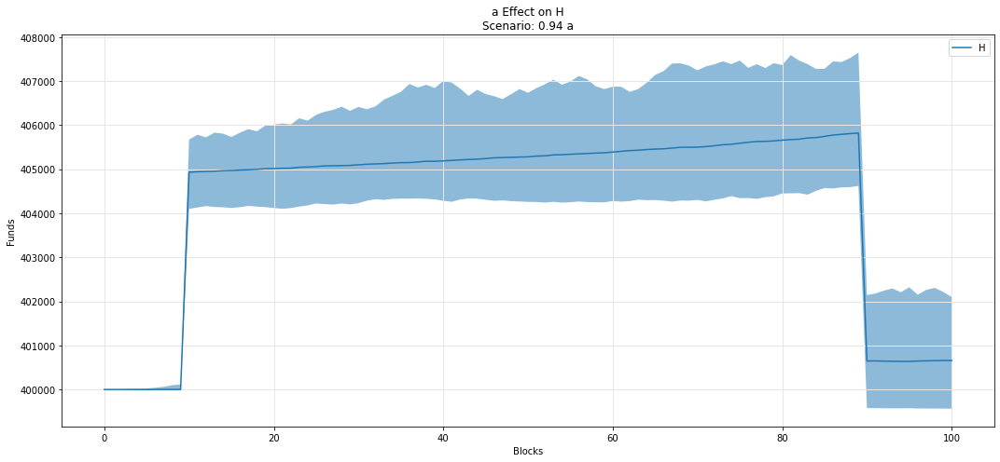

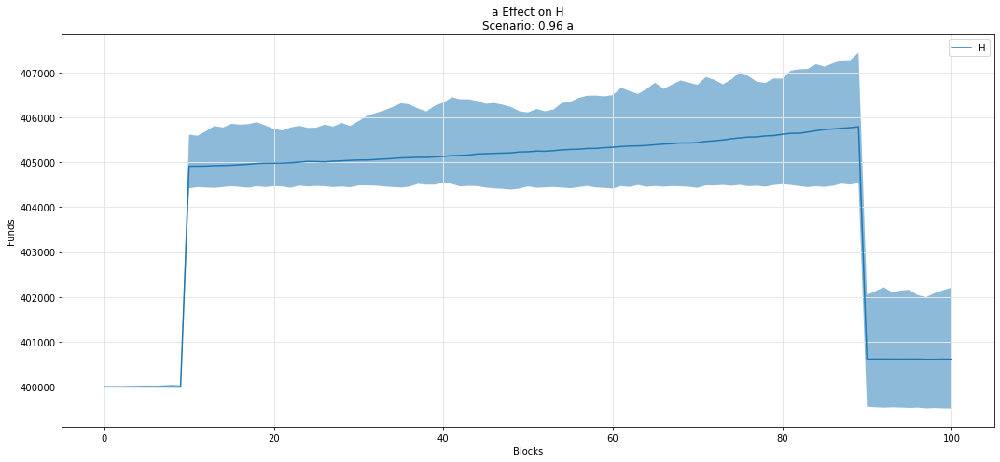

...

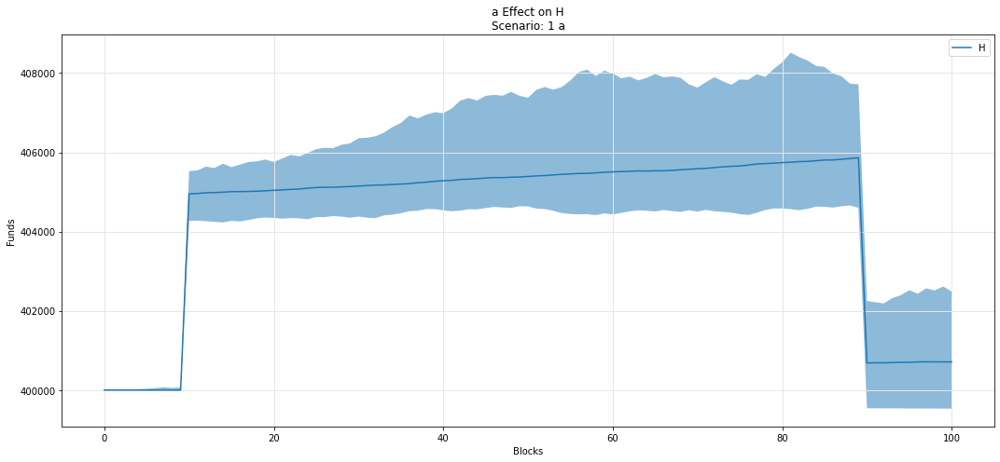

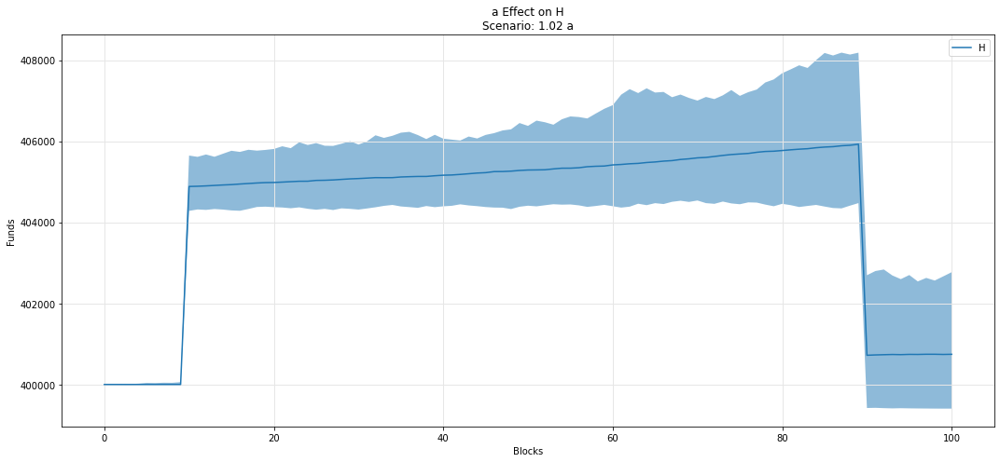

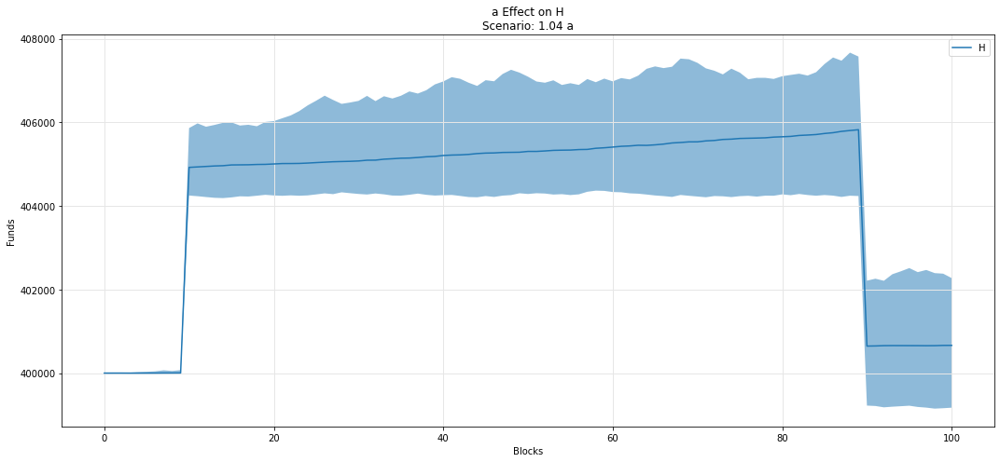

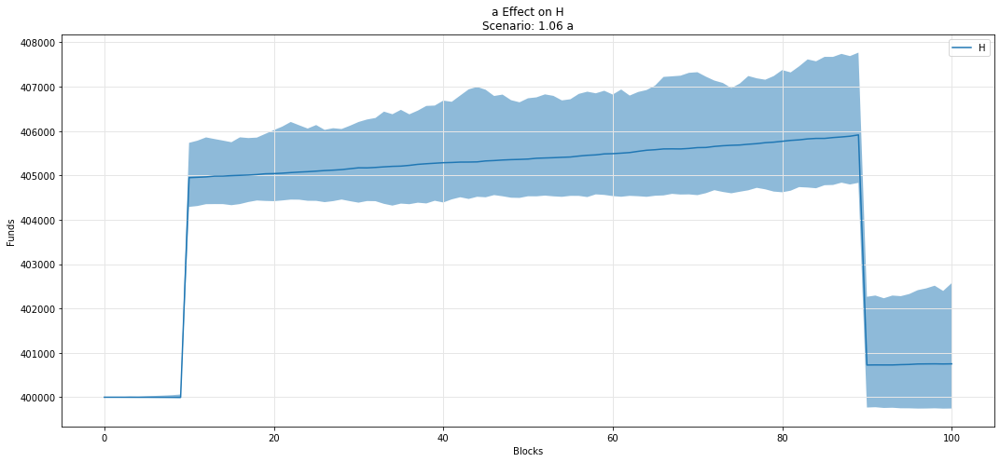

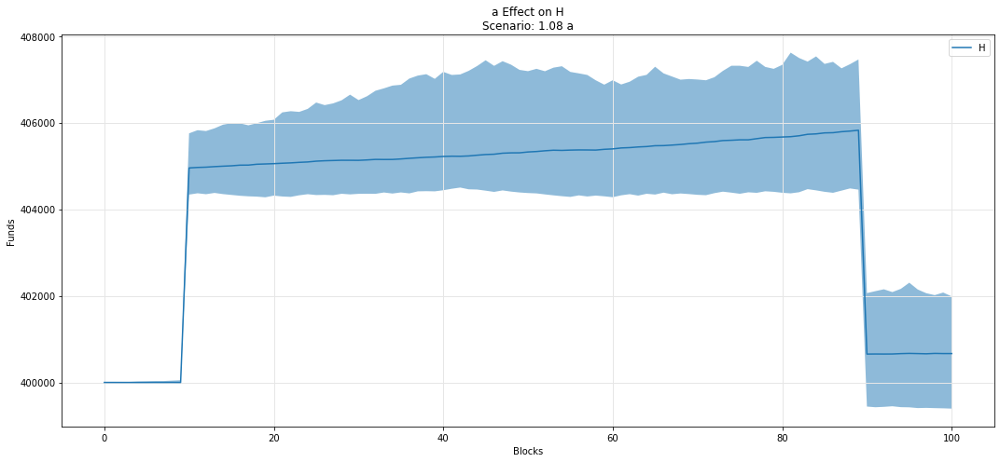

In [49]:
param_fan_plot3(experiments, config_ids, 'a','H')

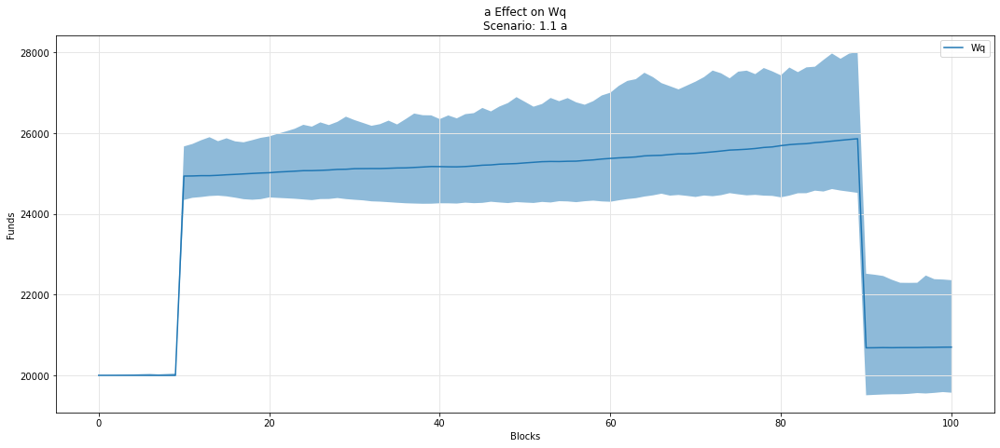

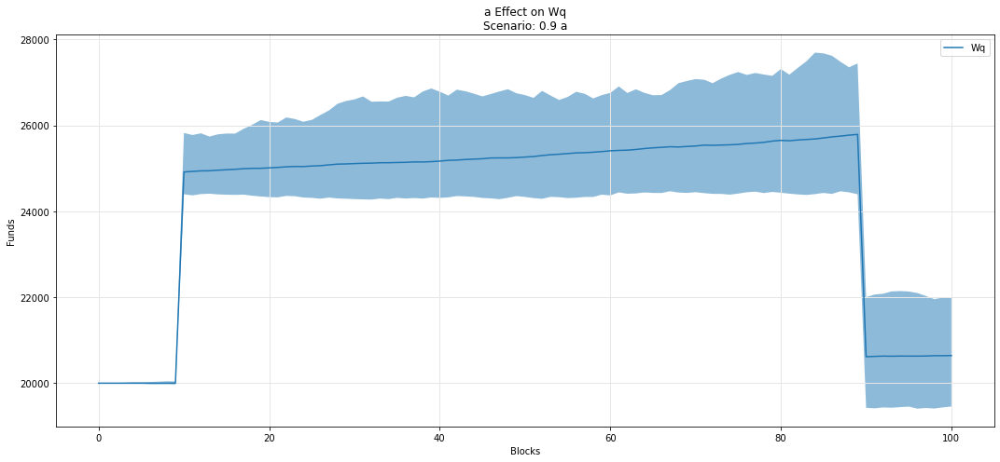

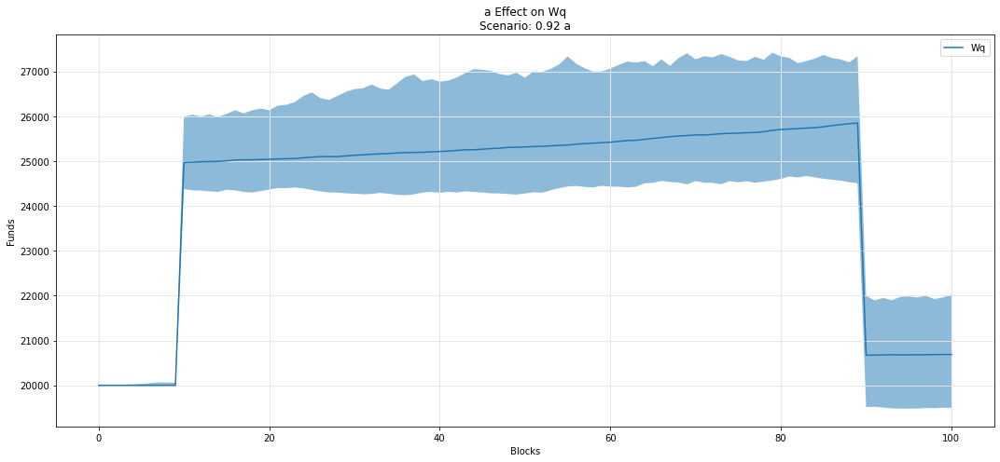

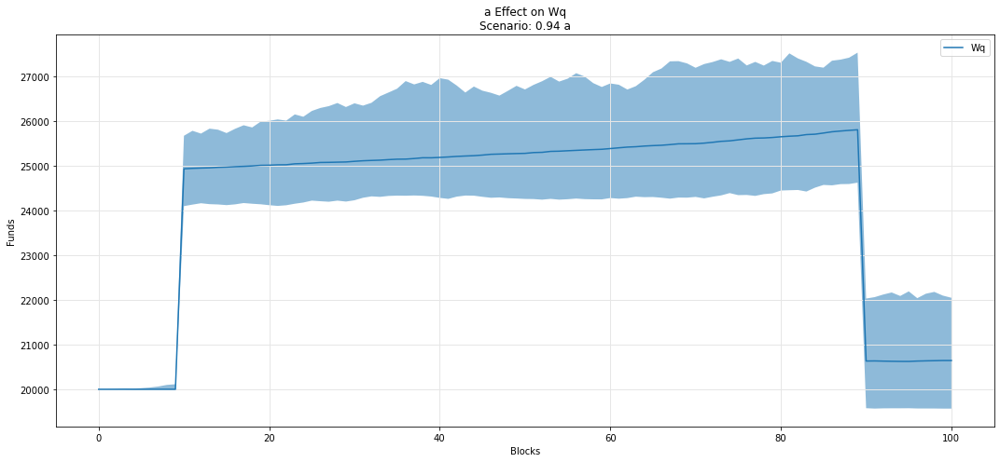

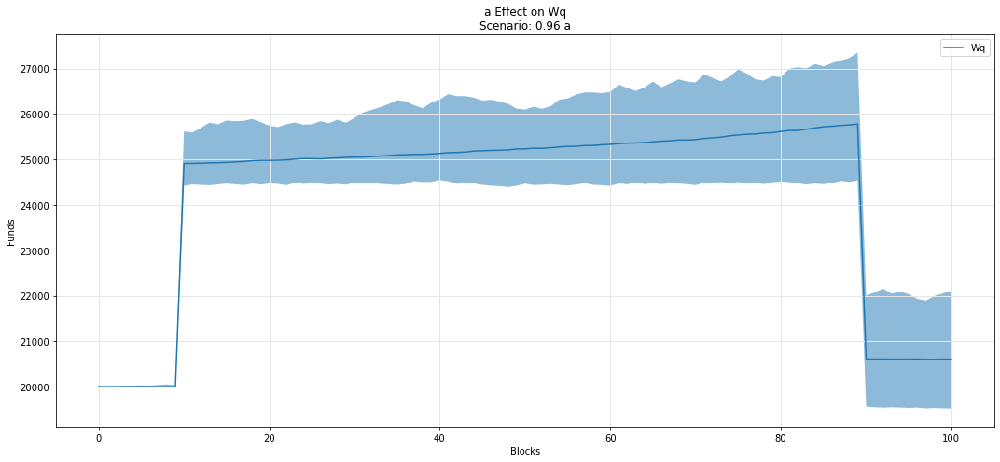

...

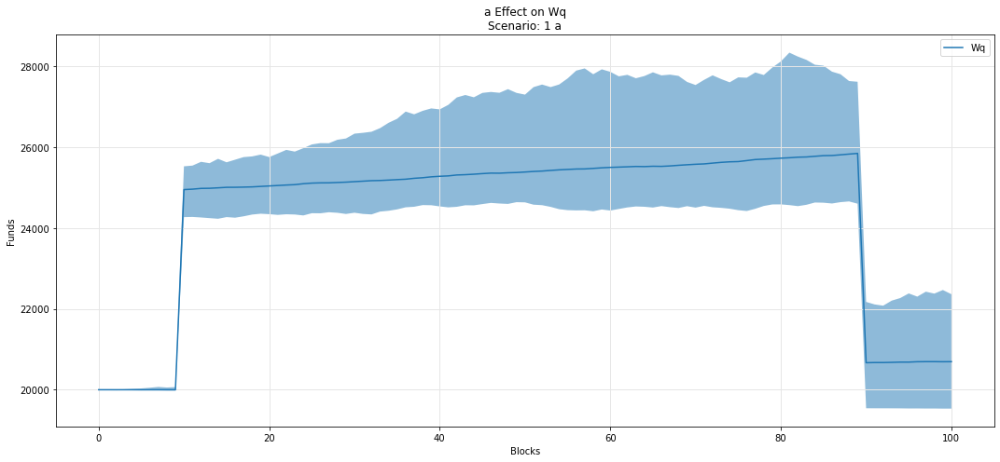

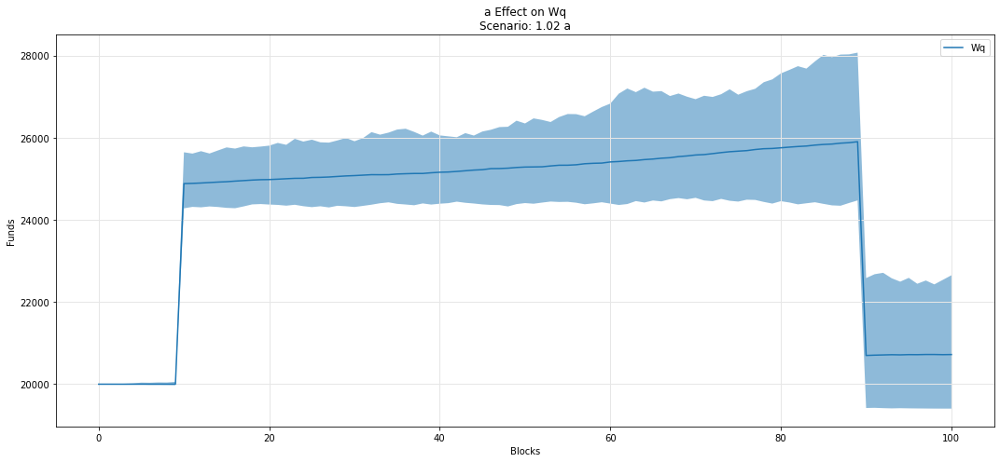

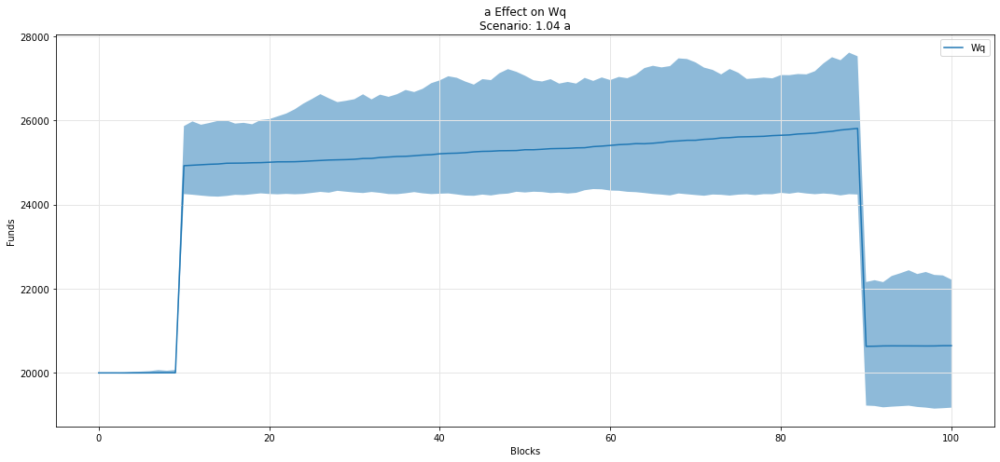

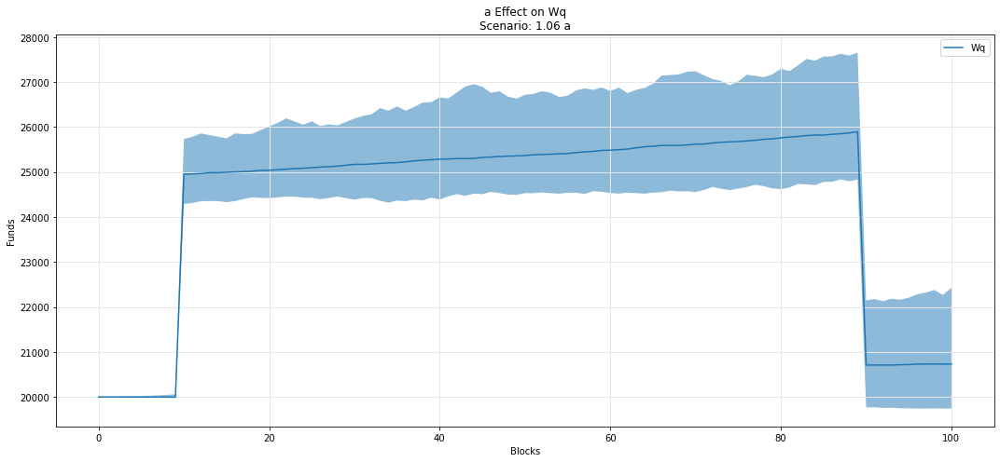

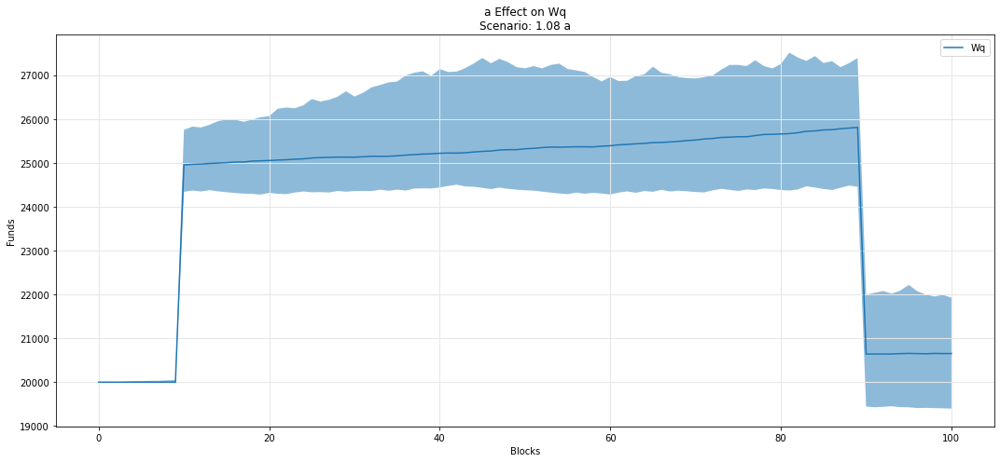

In [50]:
param_fan_plot3(experiments, config_ids, 'a','Wq')

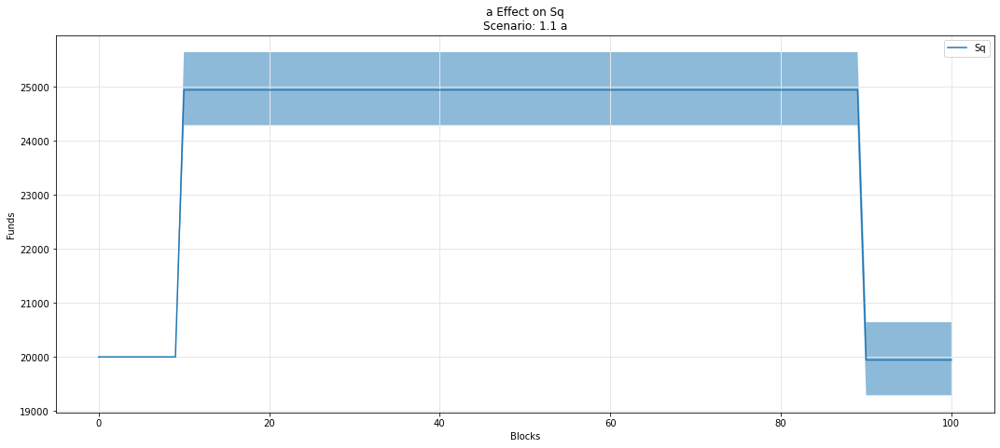

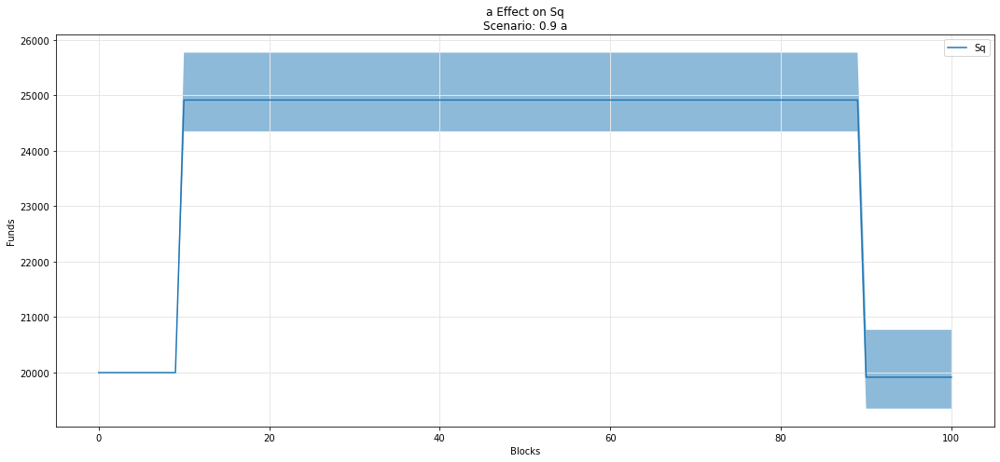

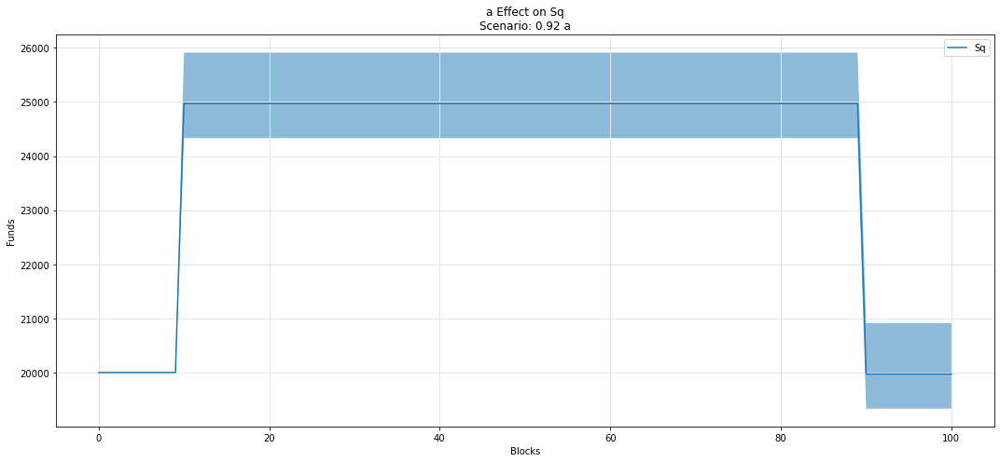

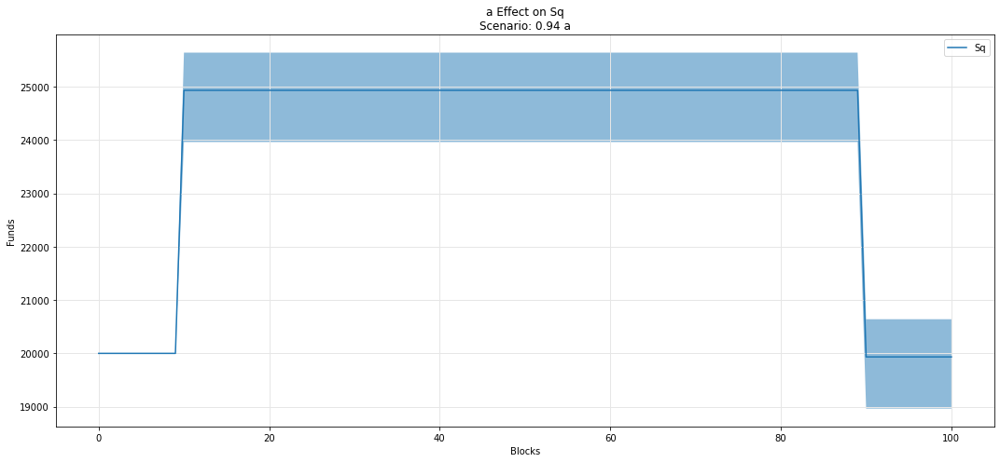

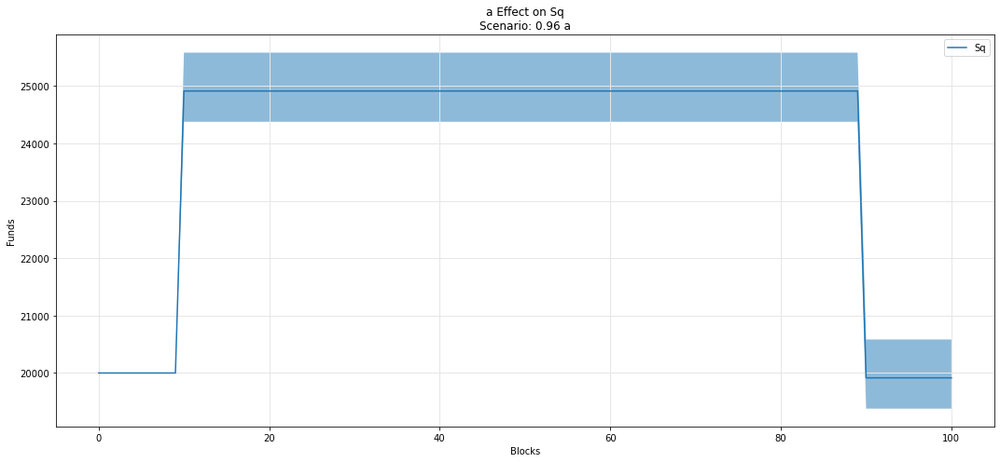

...

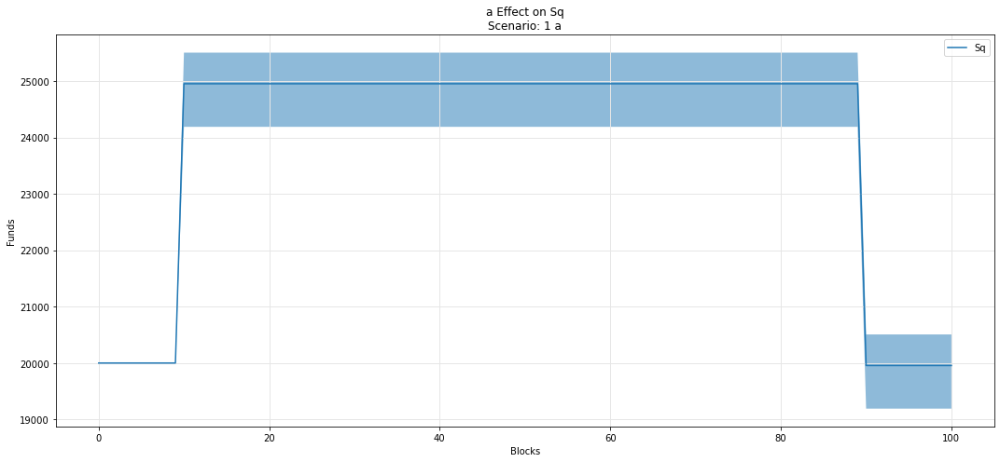

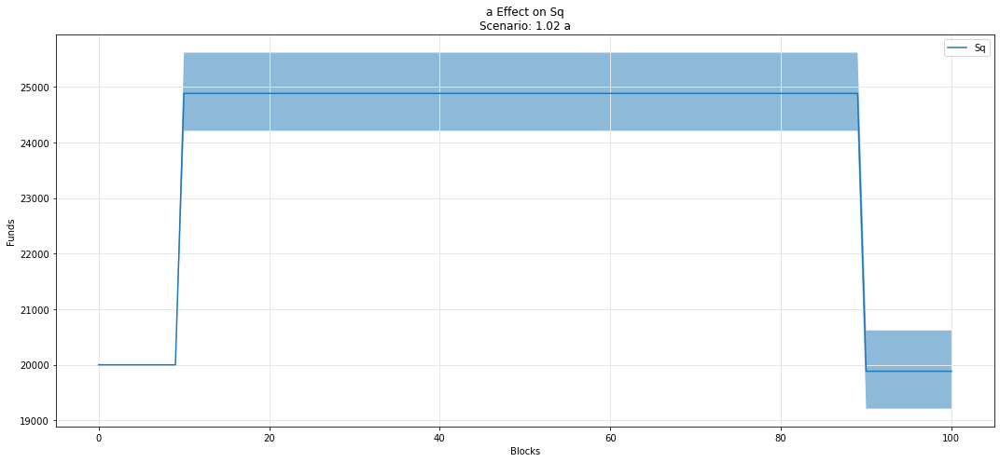

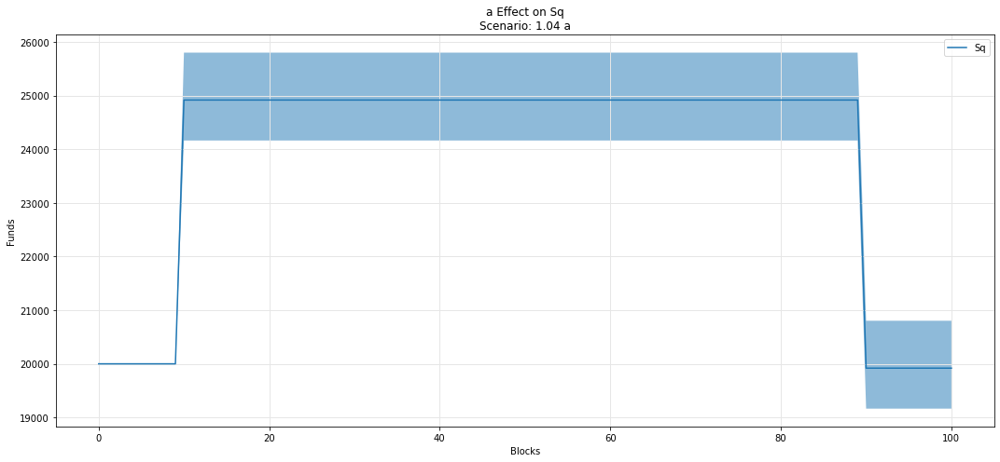

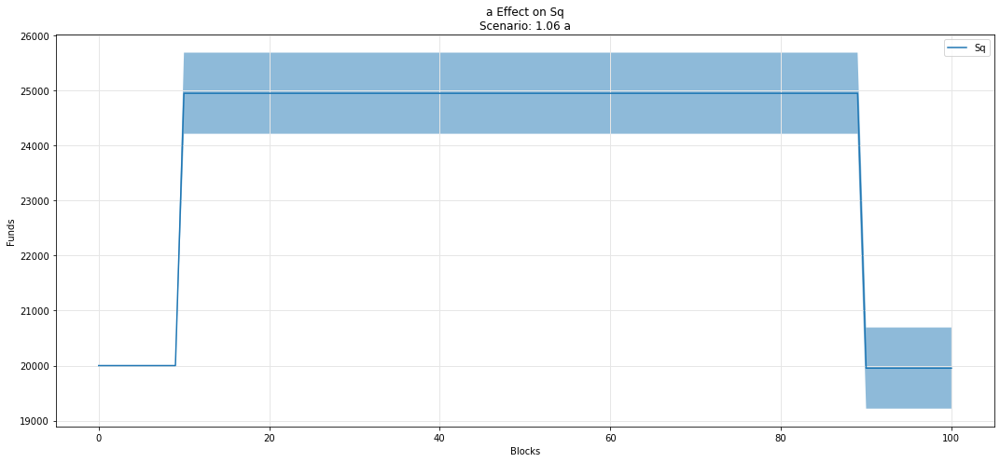

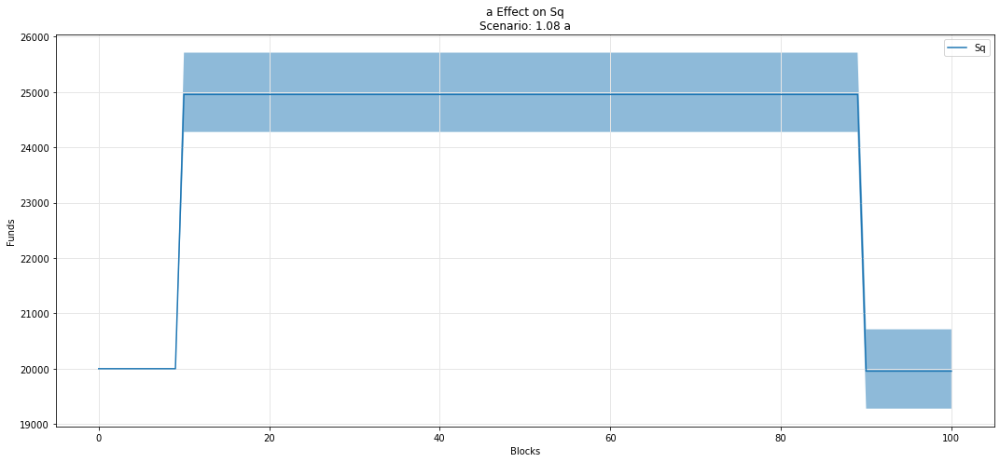

In [51]:
param_fan_plot3(experiments, config_ids, 'a','Sq')

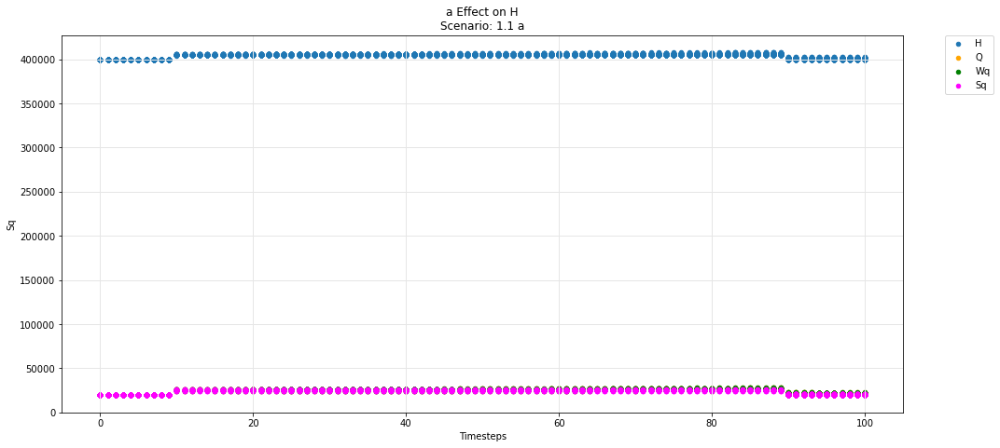

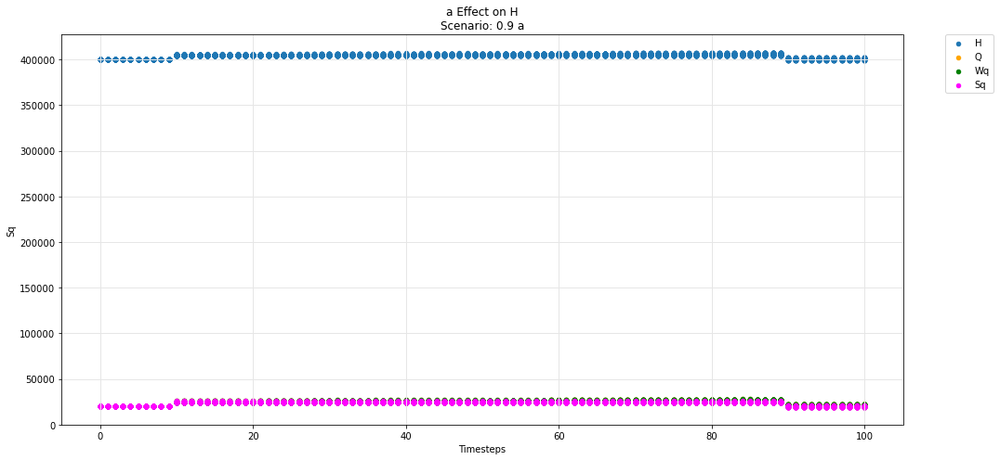

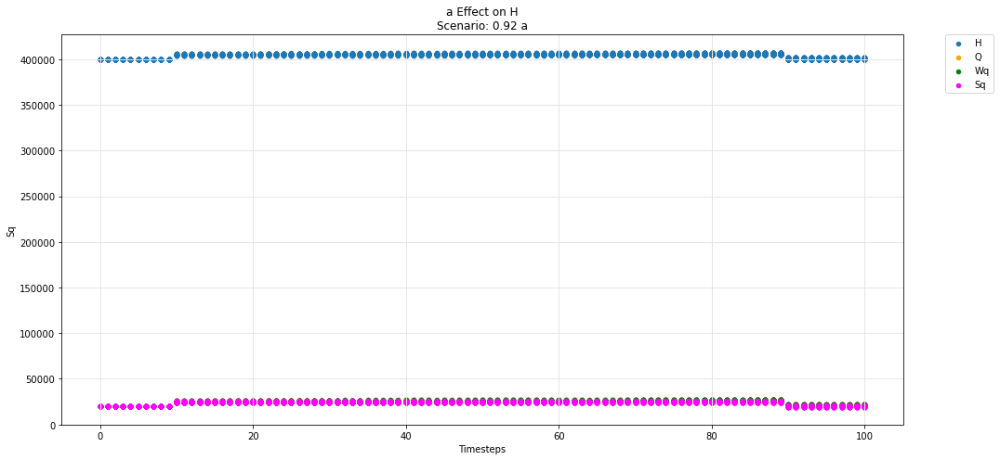

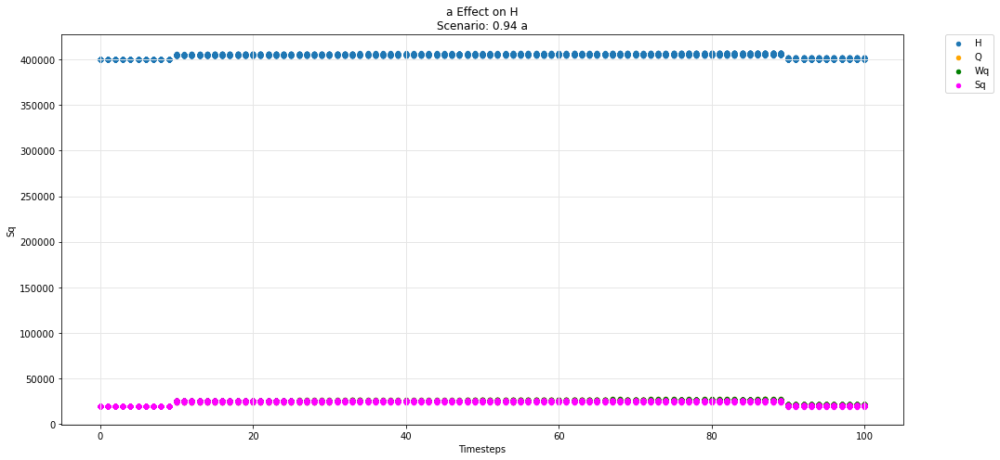

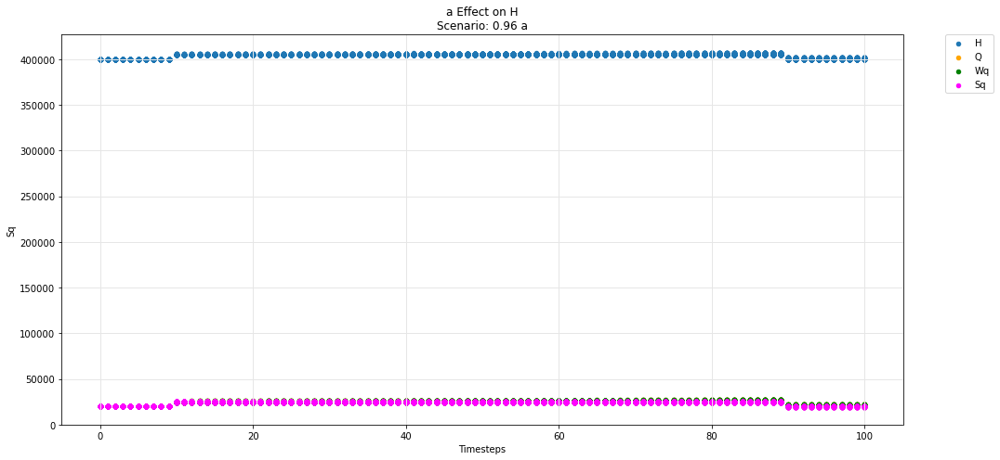

...

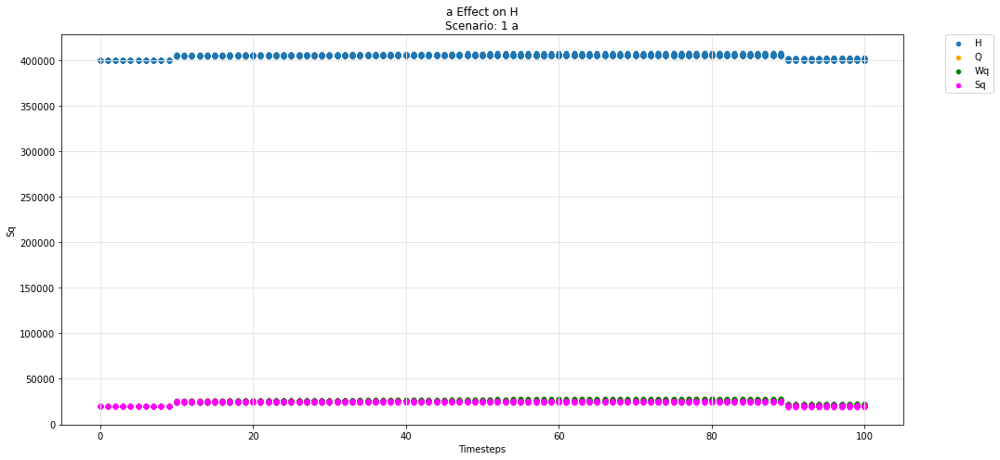

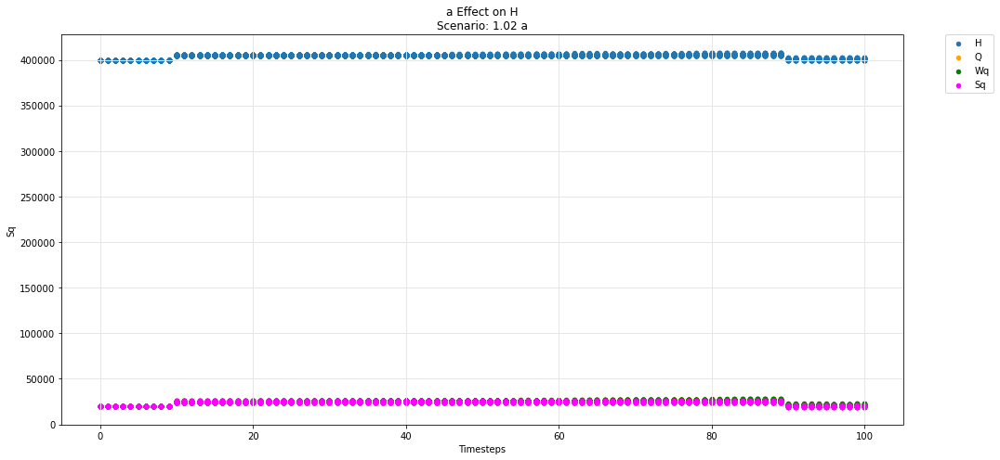

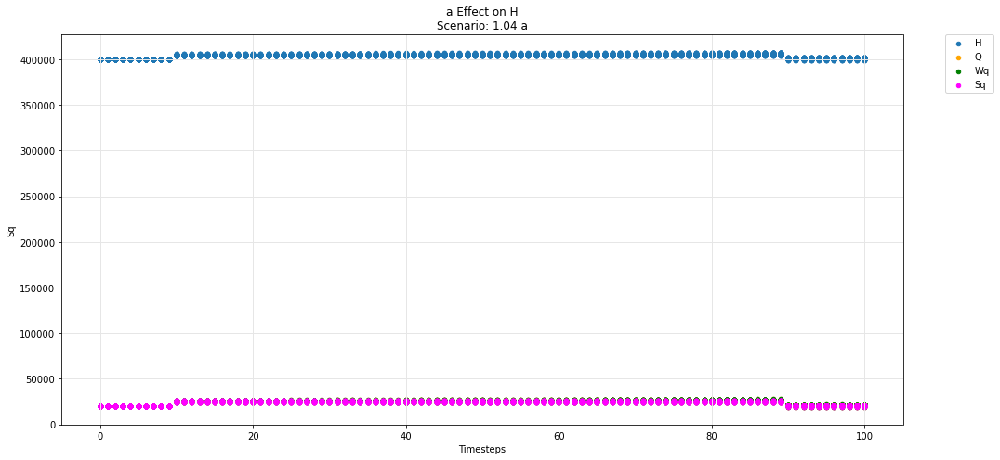

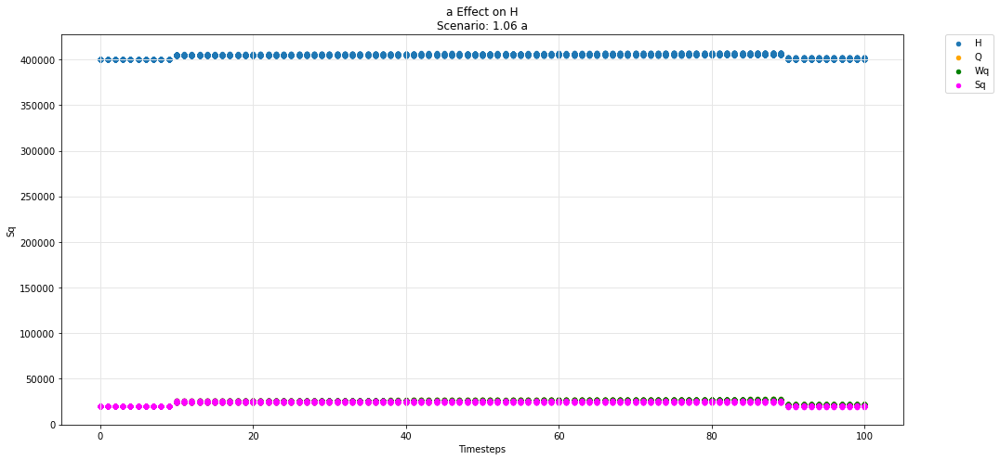

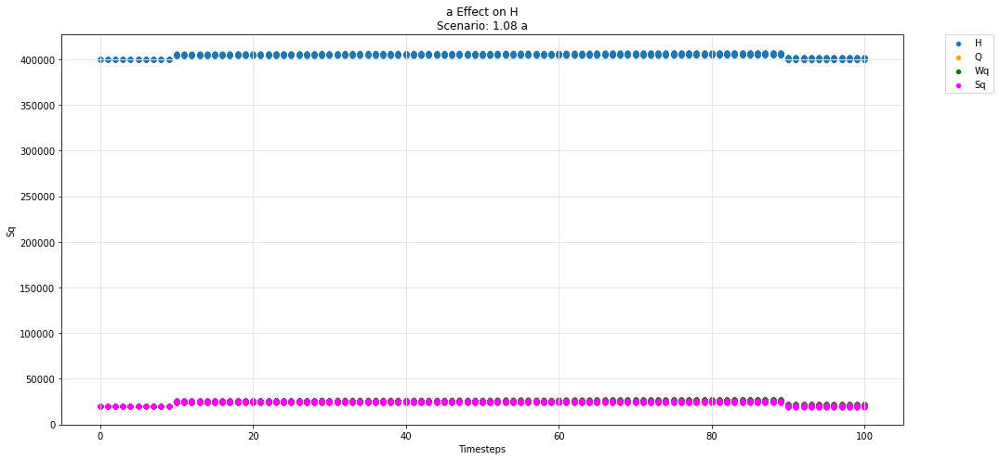

In [52]:
param_test_plot(experiments, config_ids, 'a', 'H', 'Q', 'Wq', 'Sq')

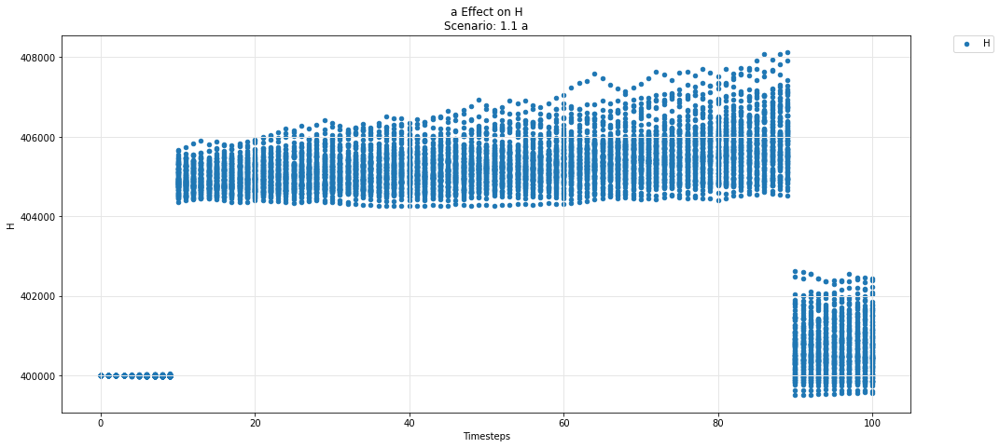

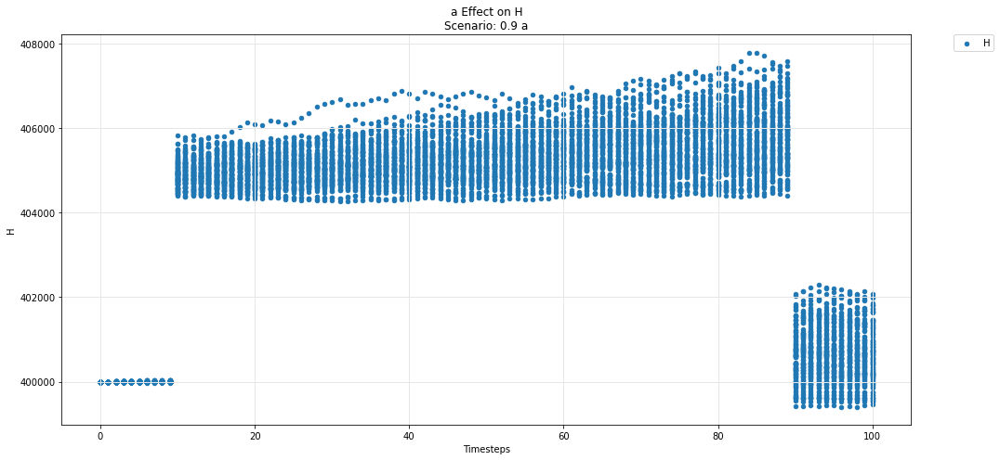

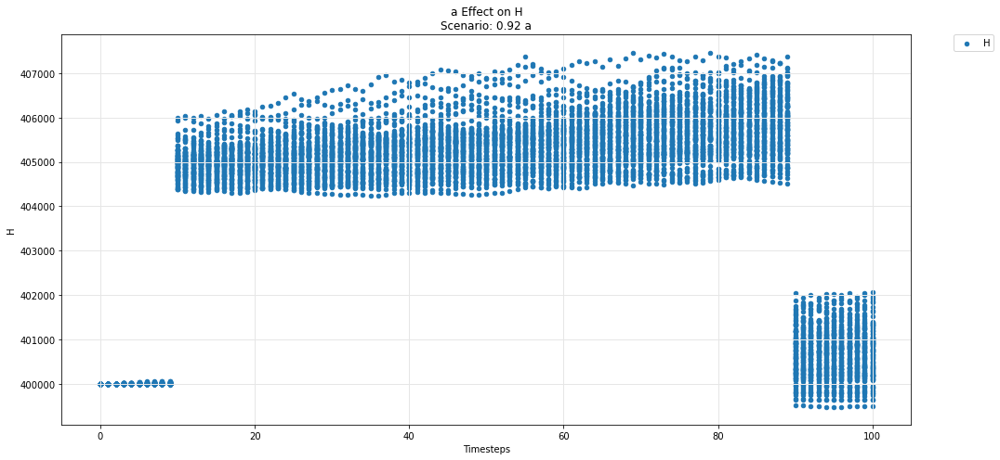

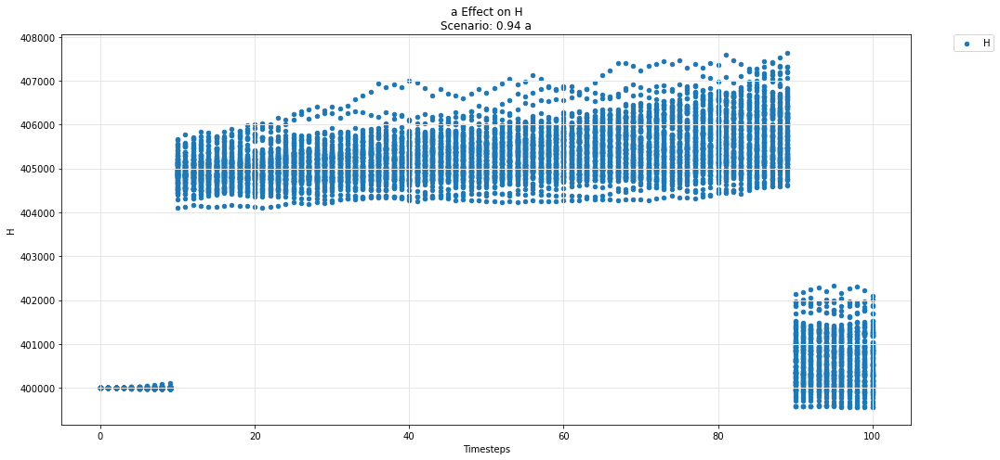

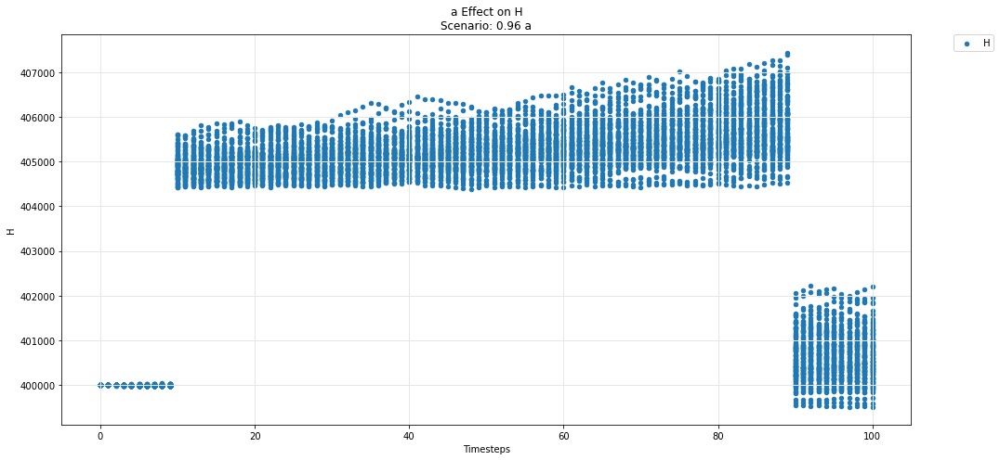

...

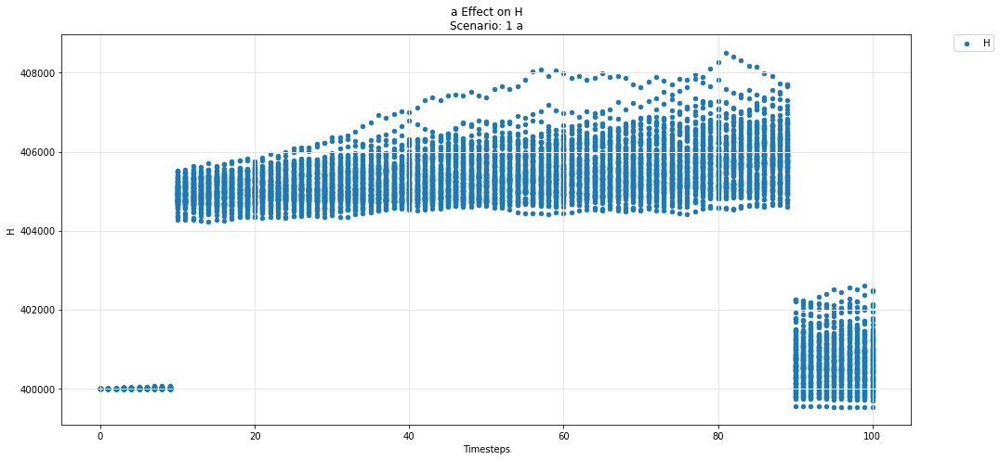

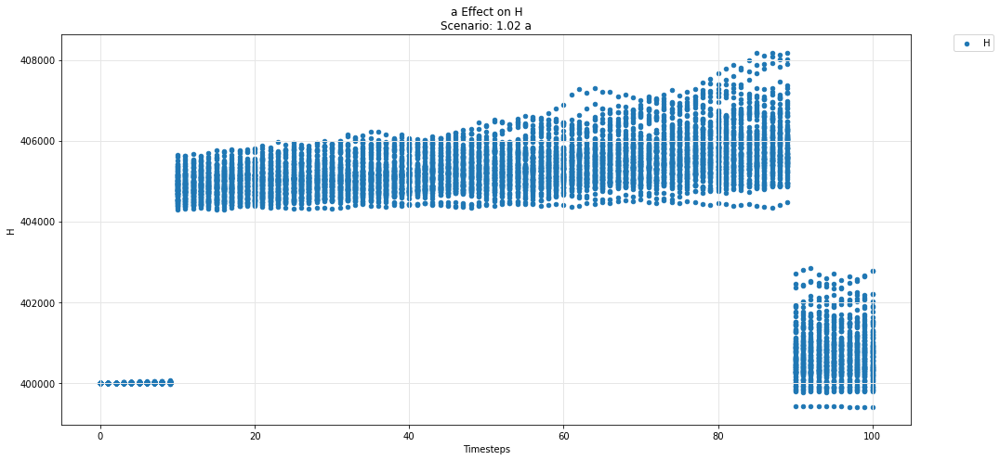

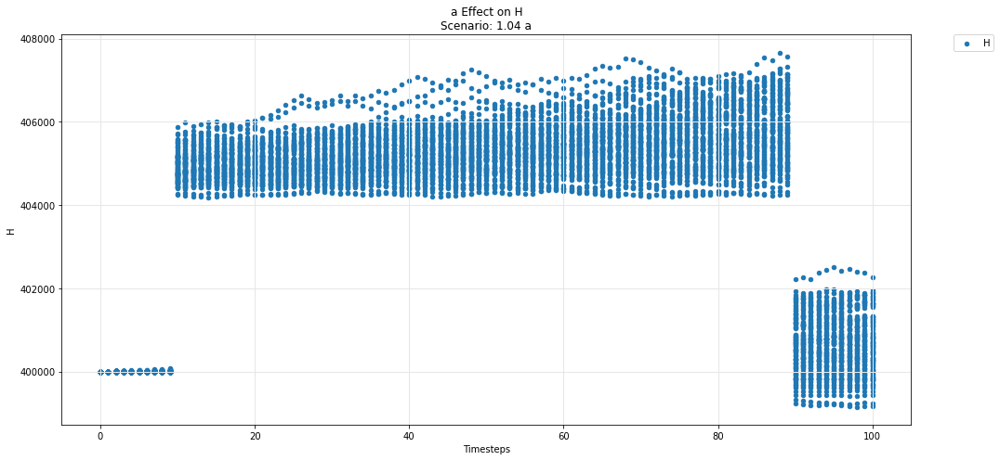

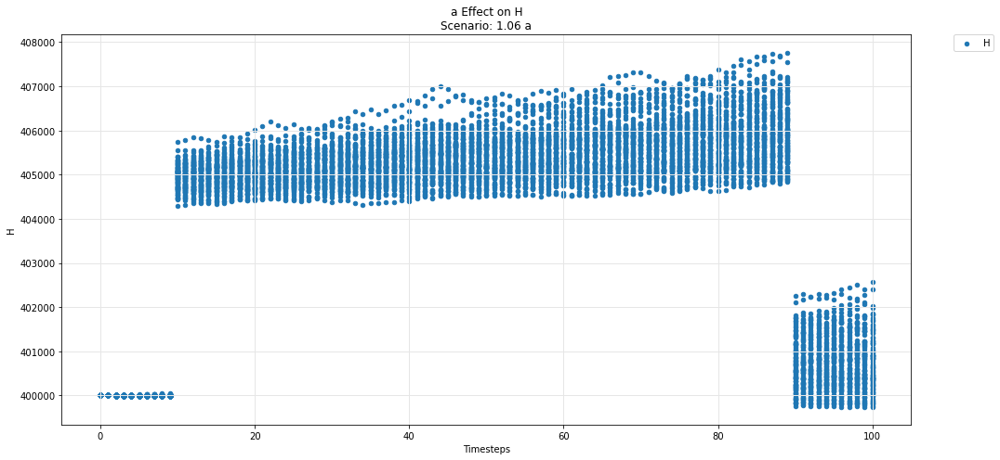

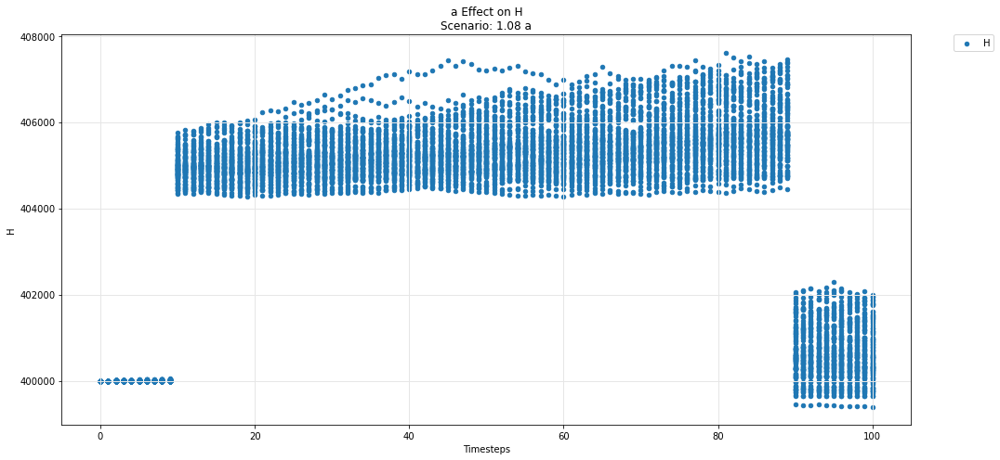

In [53]:
param_test_plot(experiments, config_ids, 'a', 'H')

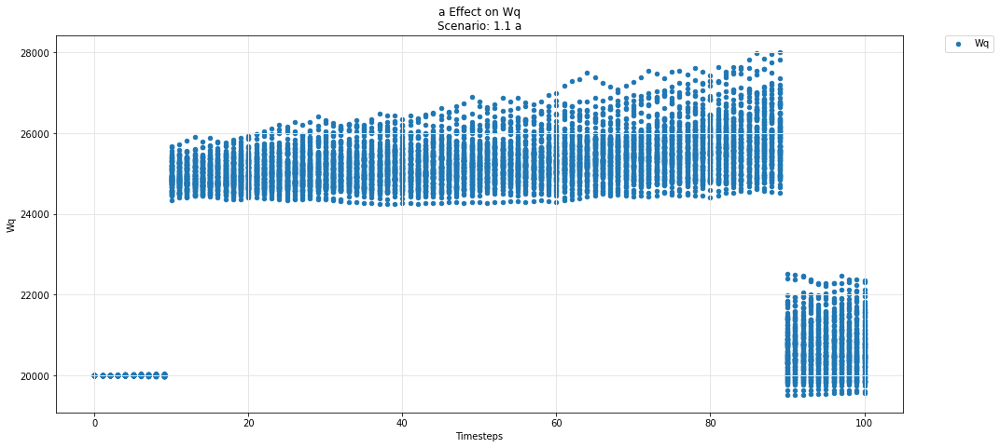

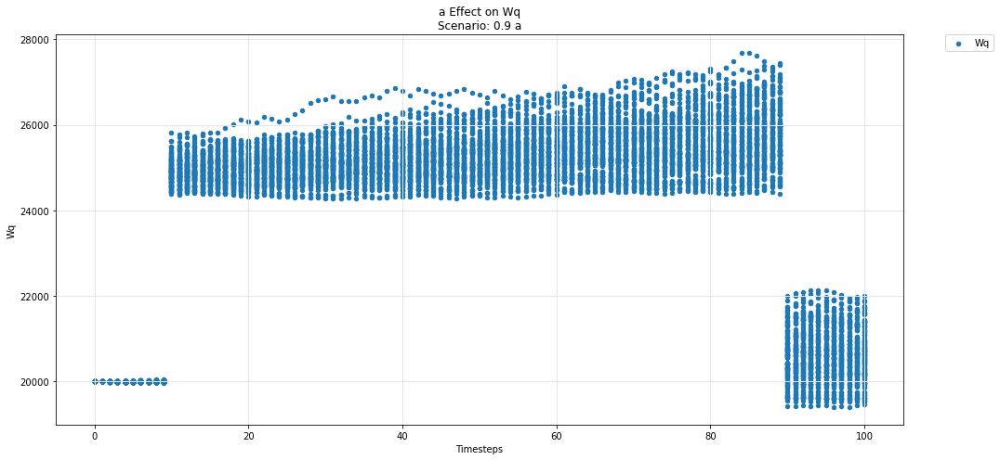

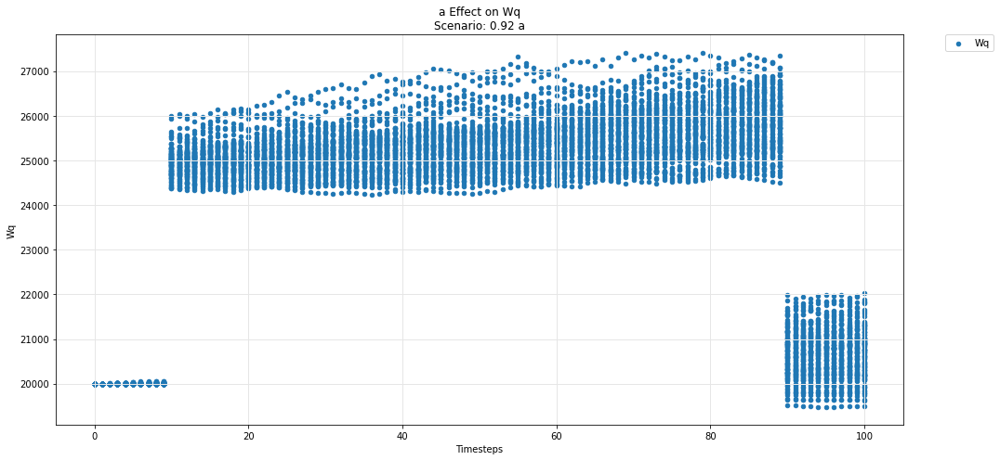

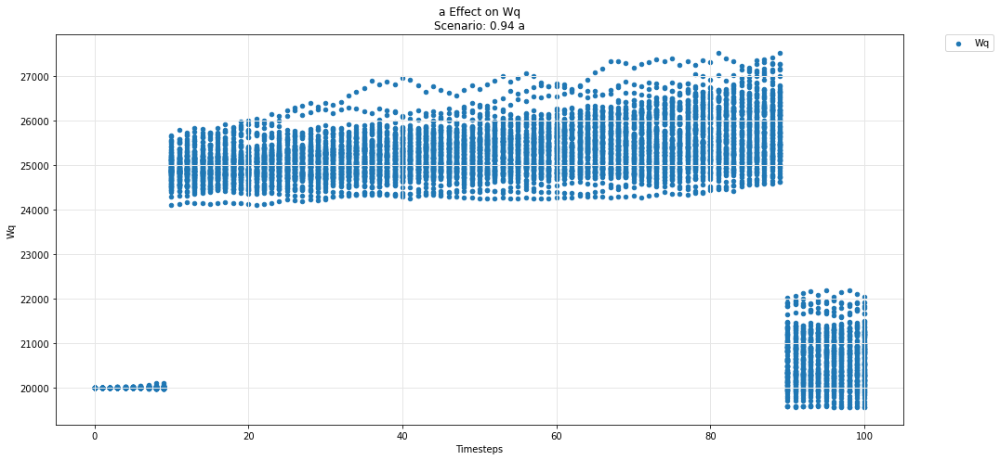

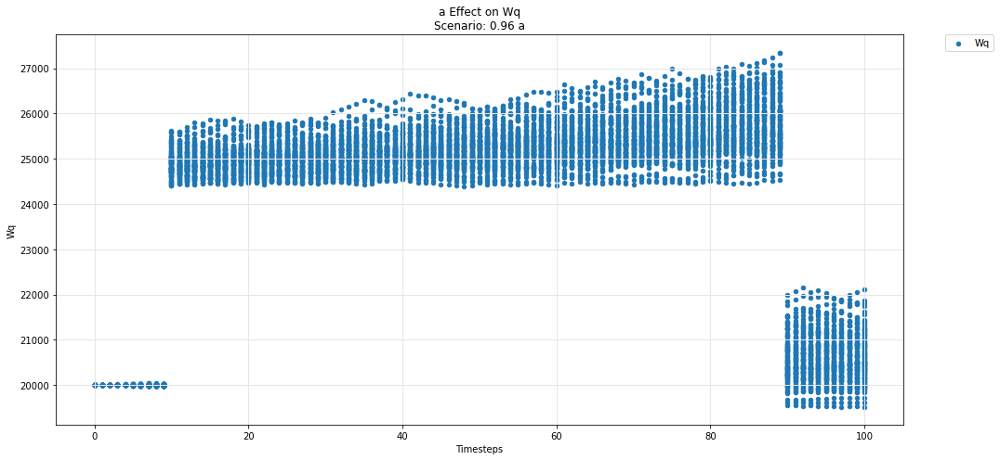

...

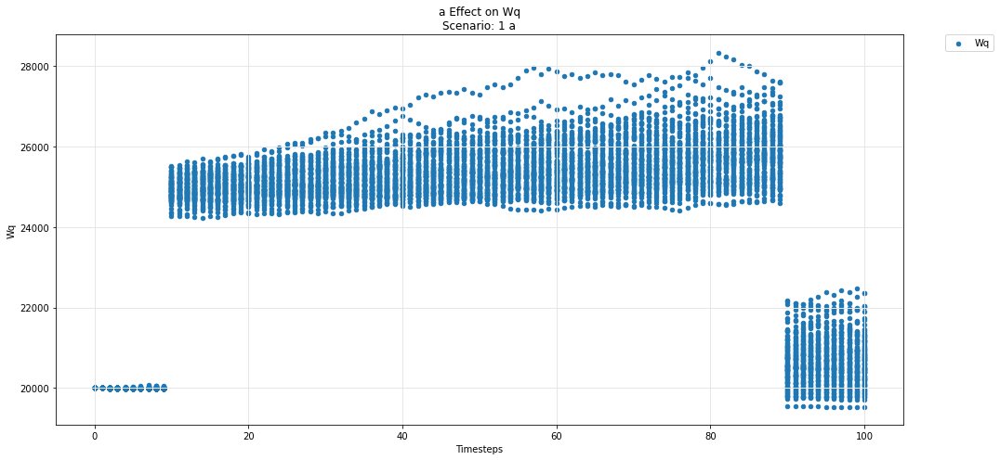

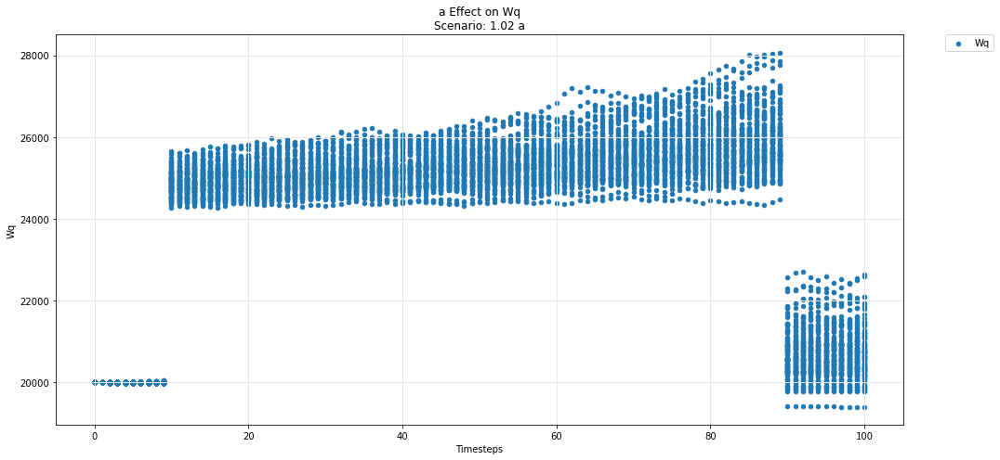

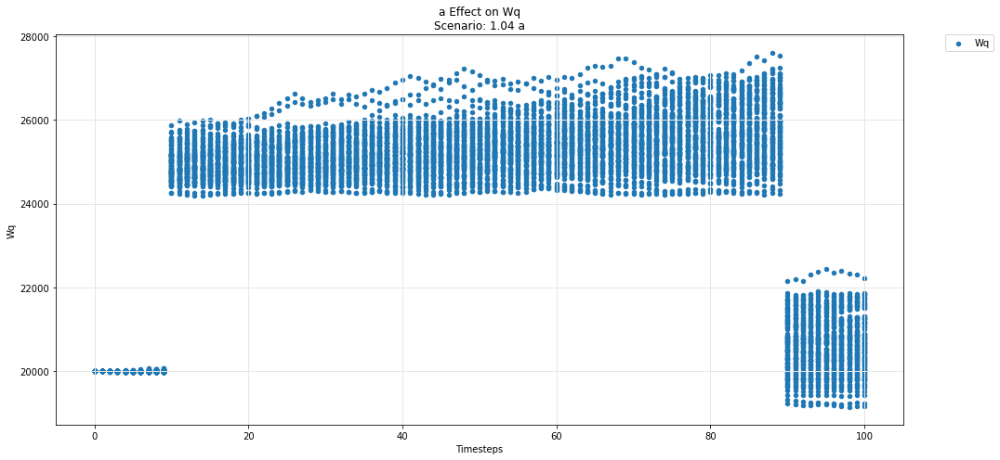

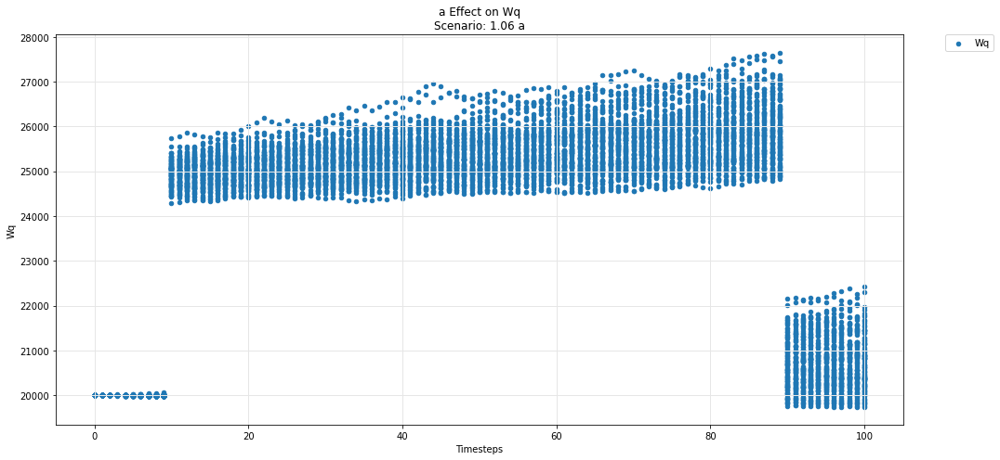

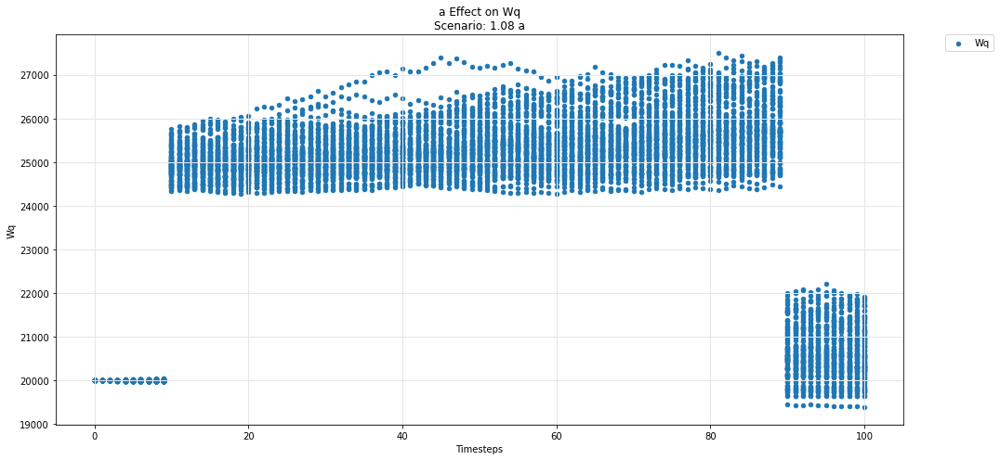

In [54]:
param_test_plot(experiments, config_ids, 'a', 'Wq')

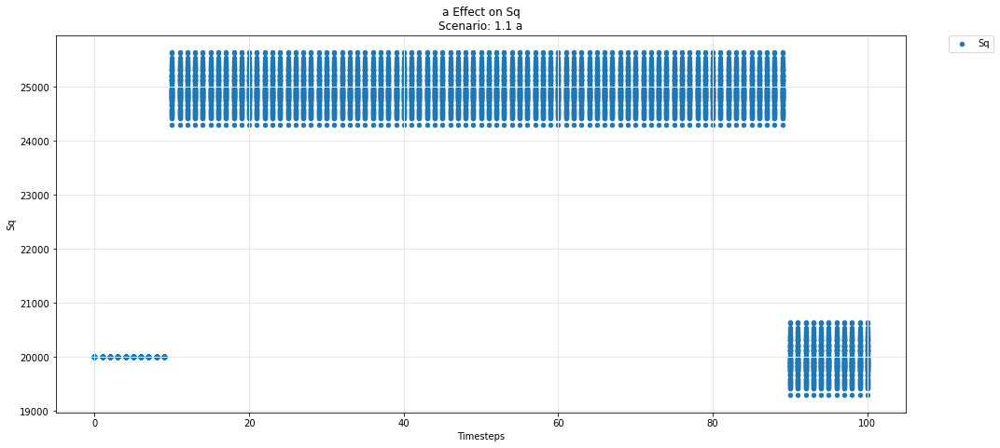

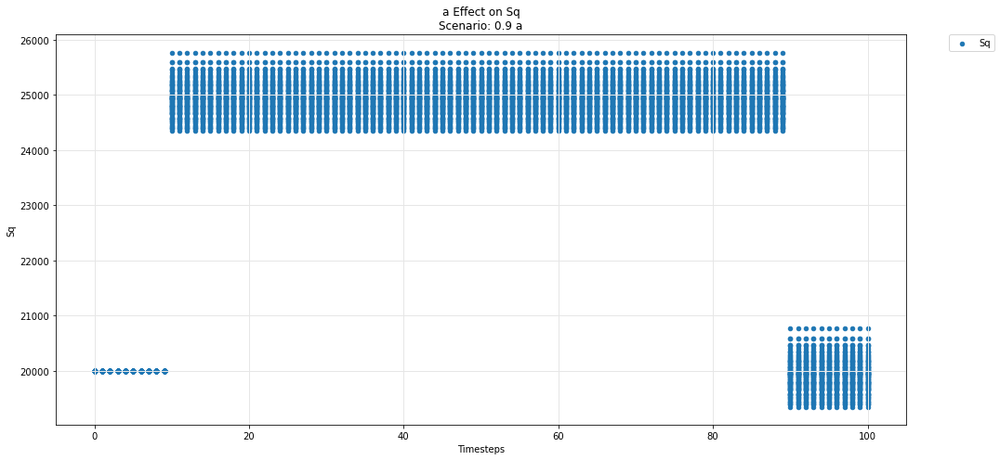

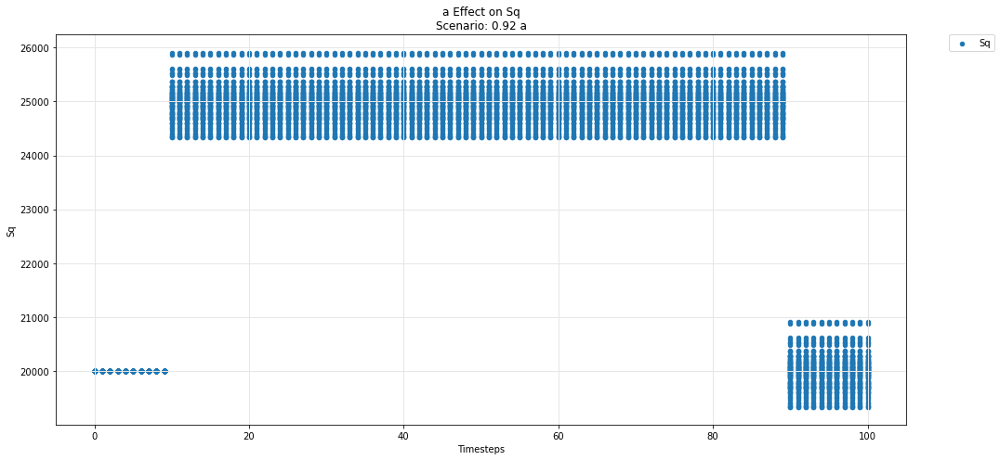

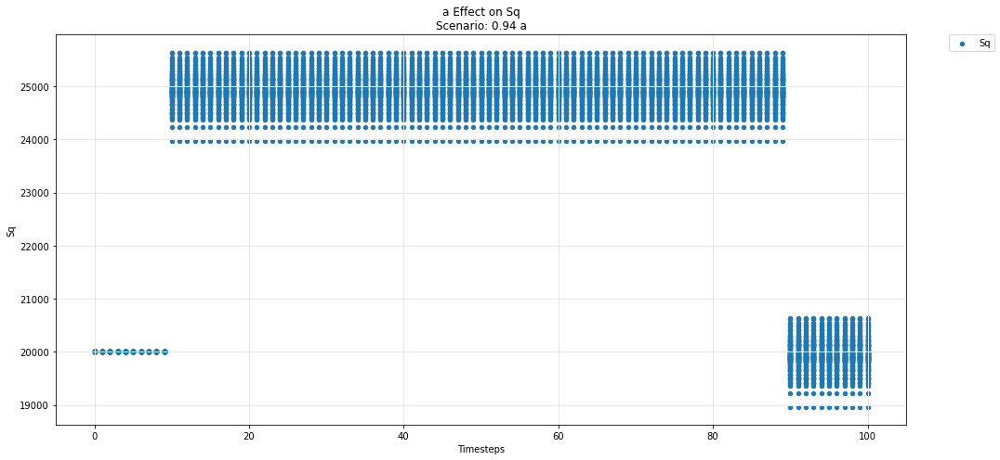

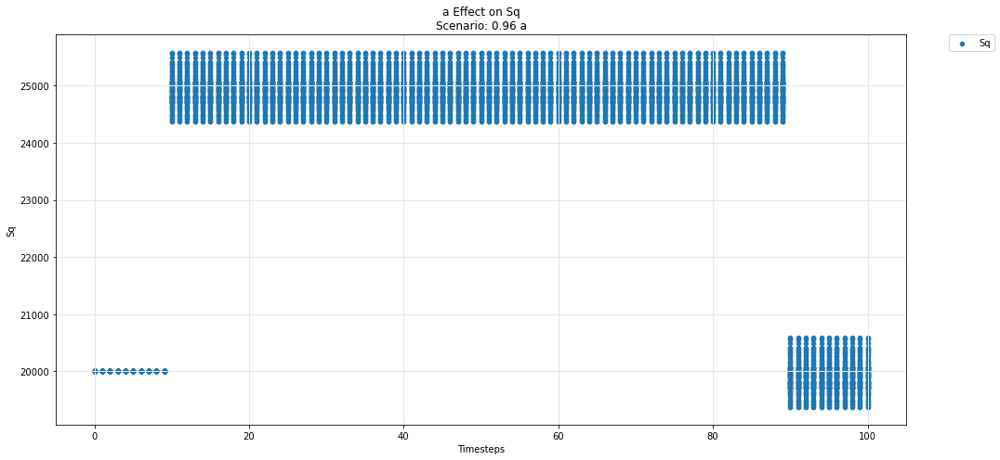

...

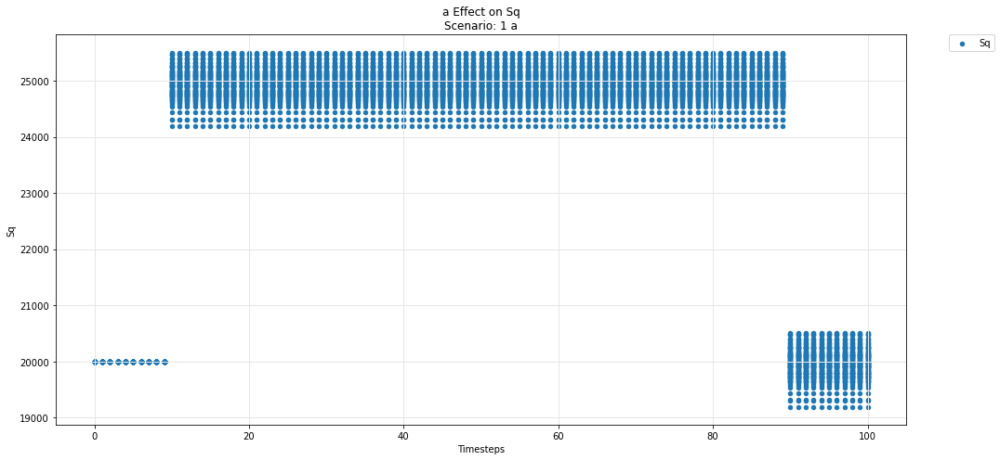

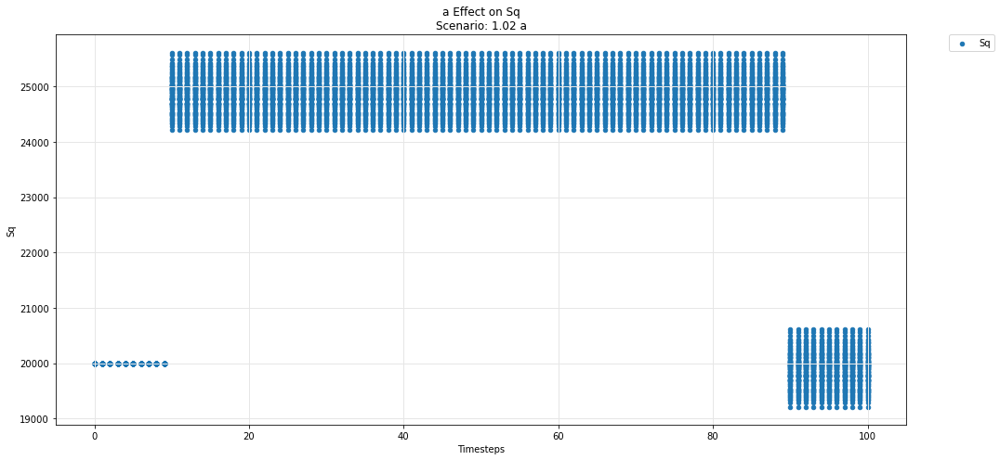

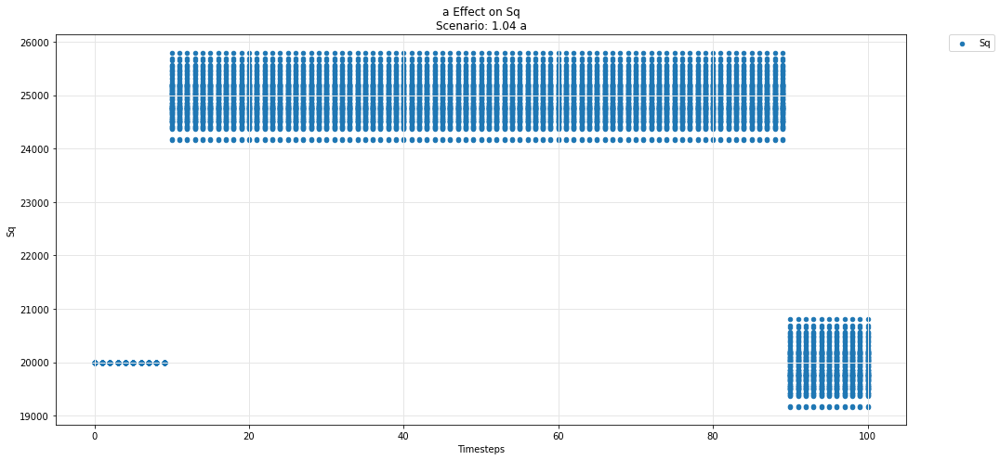

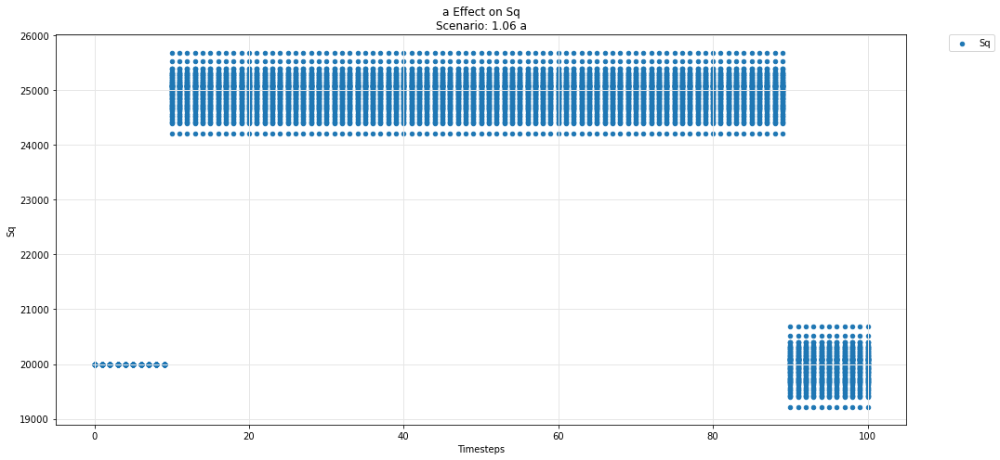

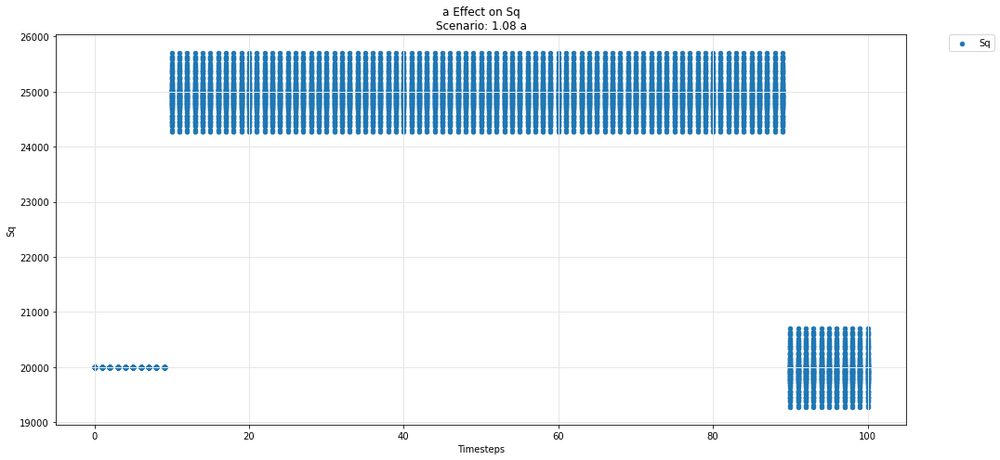

In [55]:
param_test_plot(experiments, config_ids, 'a', 'Sq')

## Hydra -- pool

Movement of the Omnipool variables
- Asset i
- Asset j
- Asset k

over the course of the simulation

In [56]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

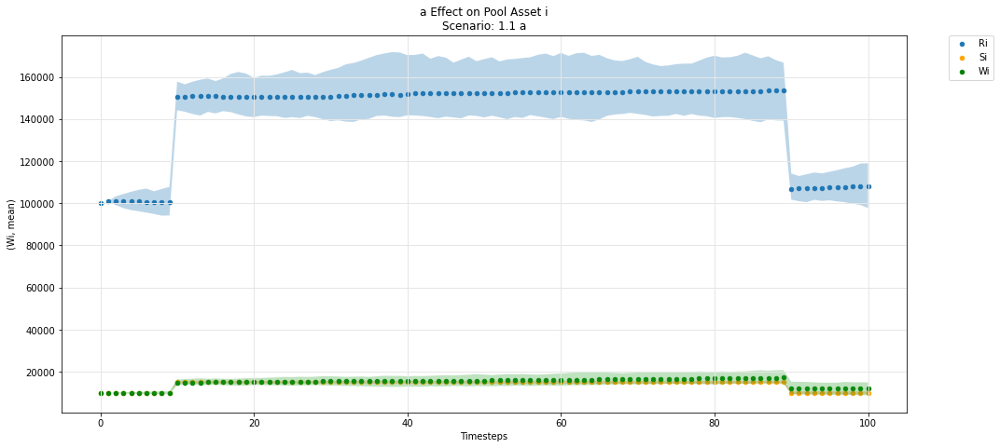

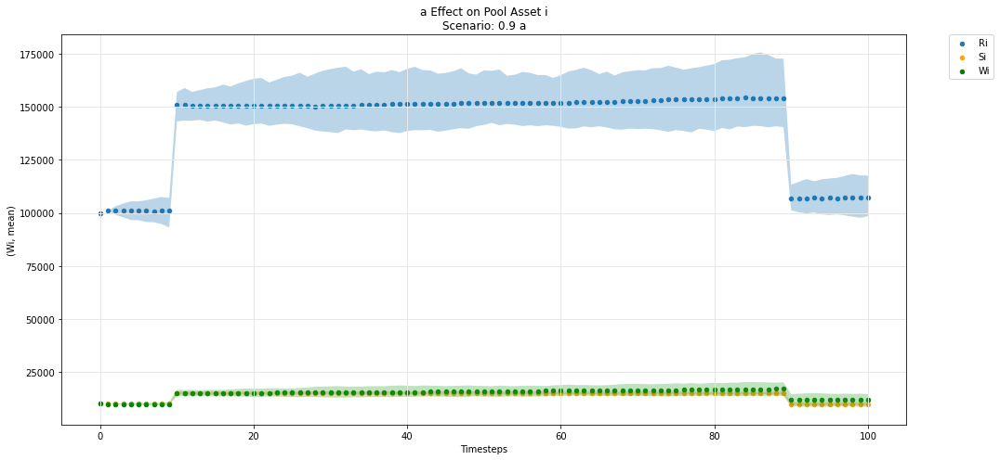

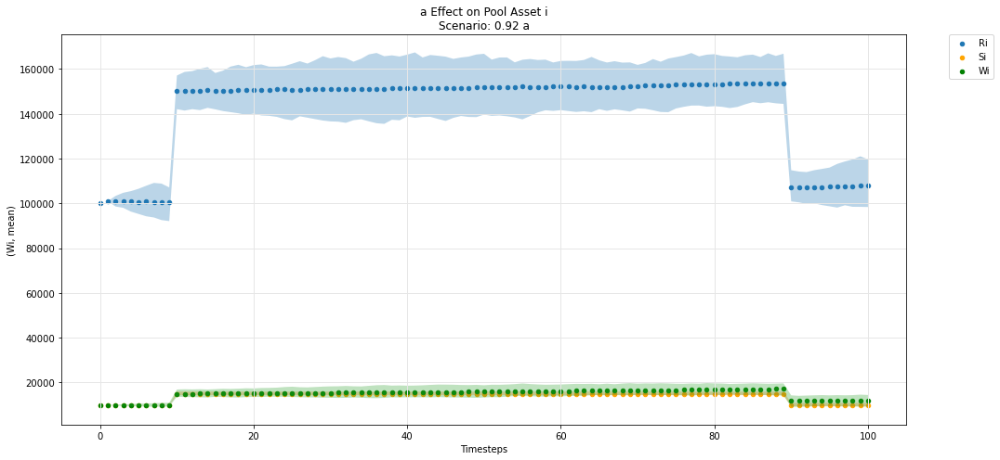

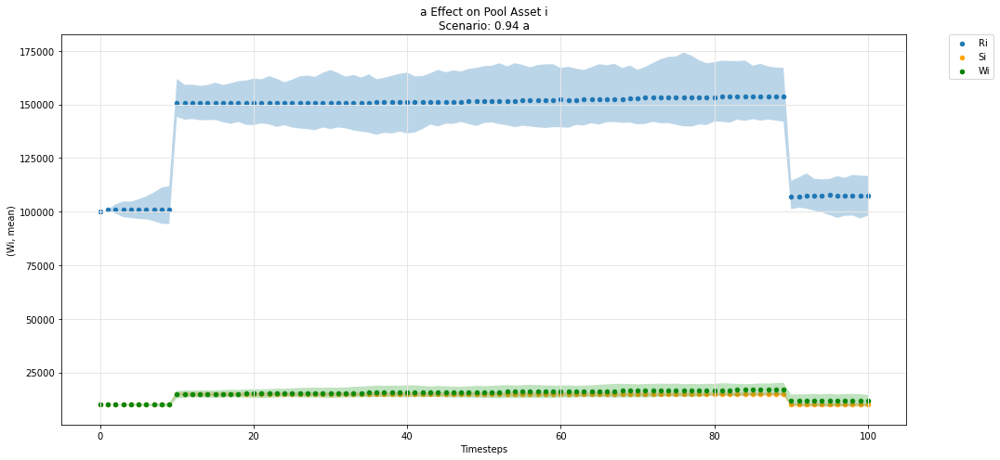

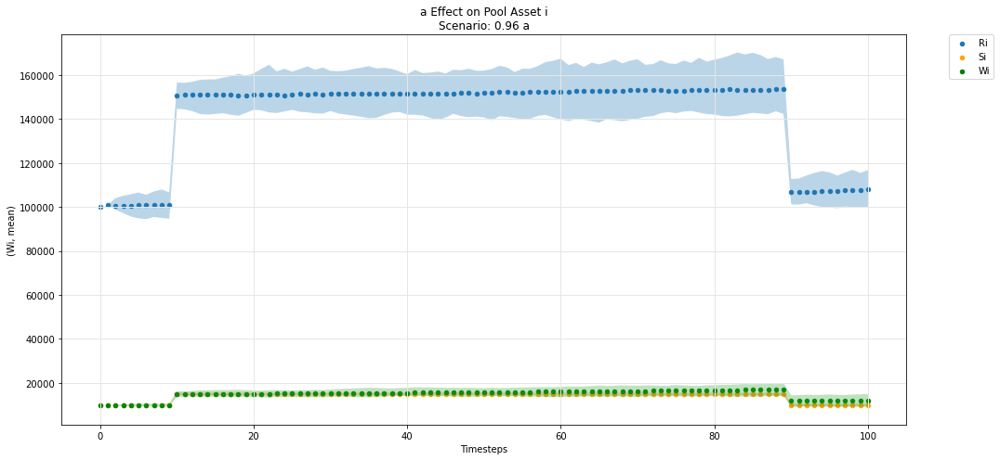

...

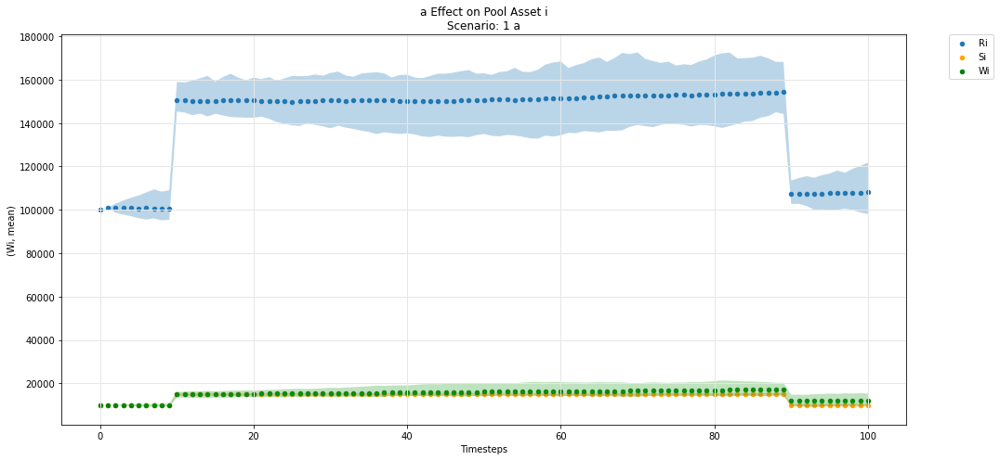

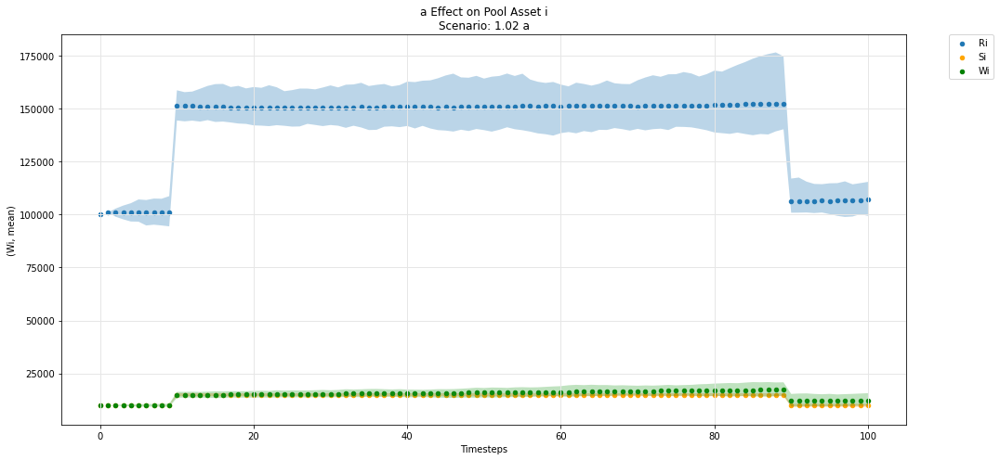

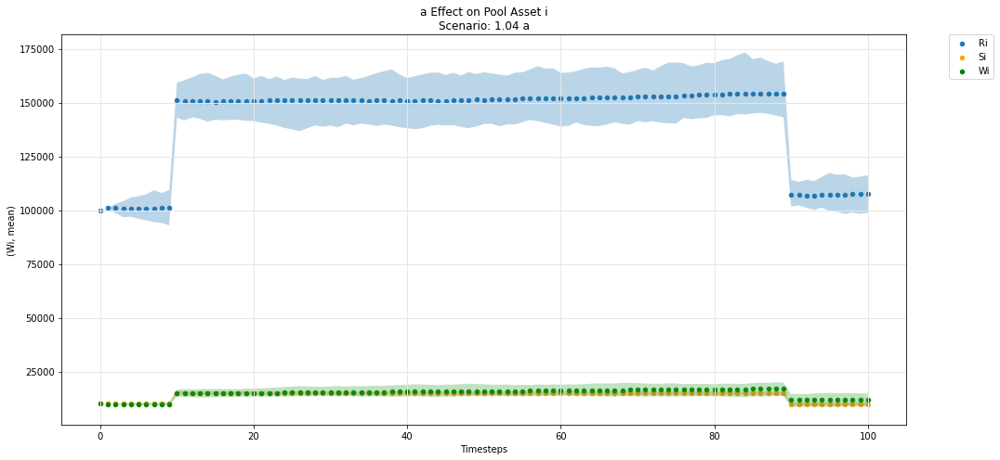

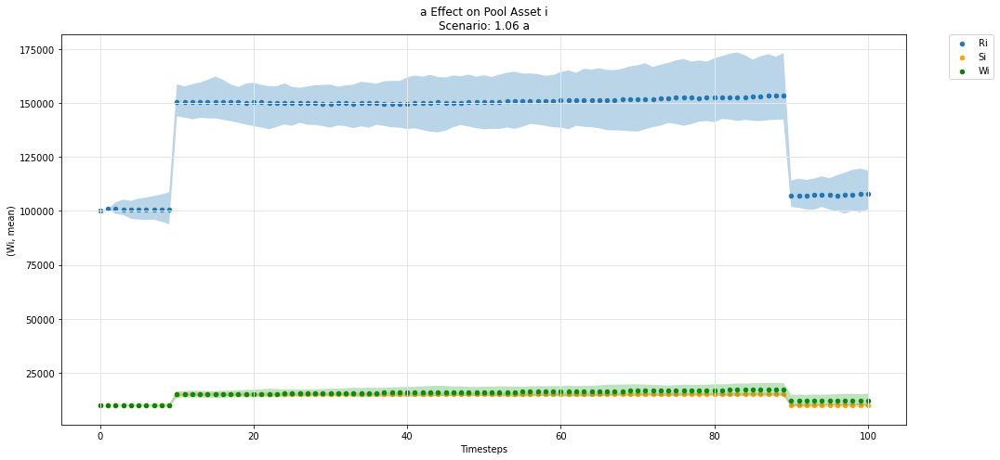

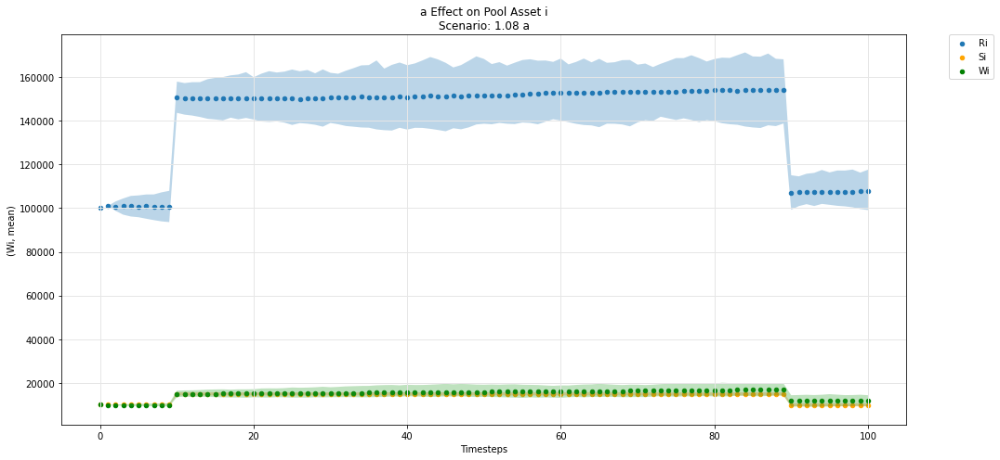

In [57]:
param_pool_simulation_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

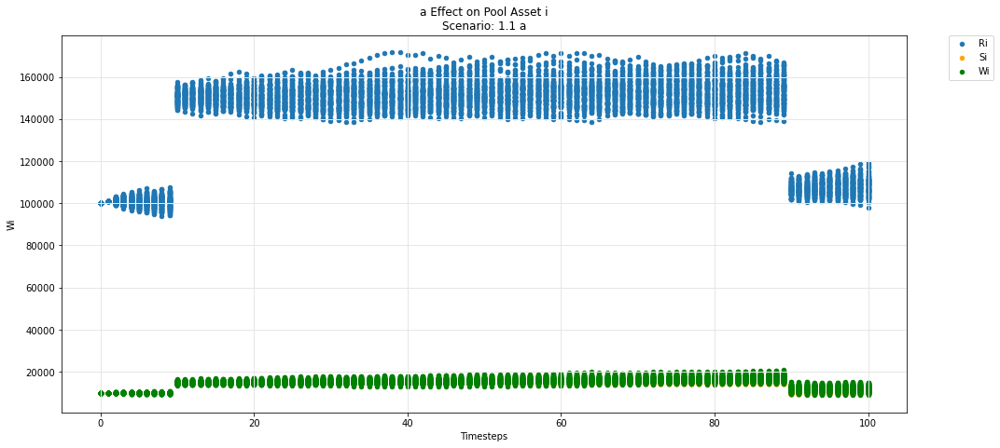

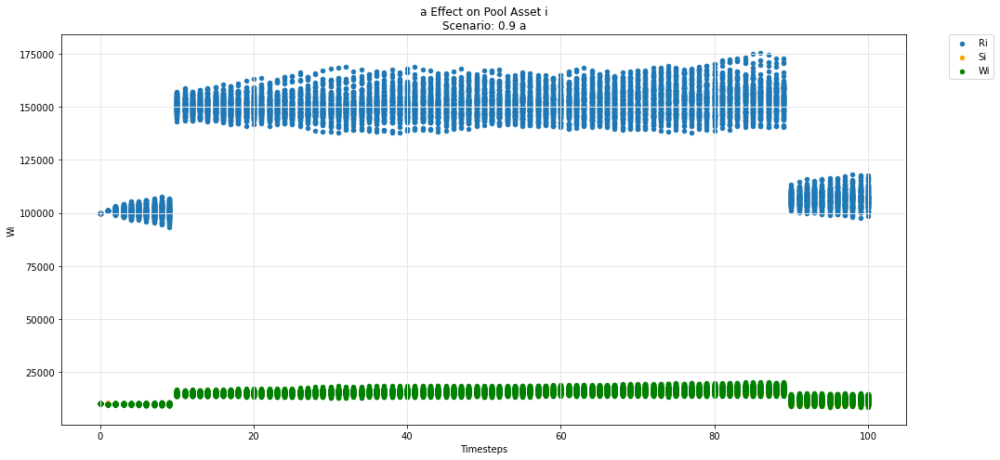

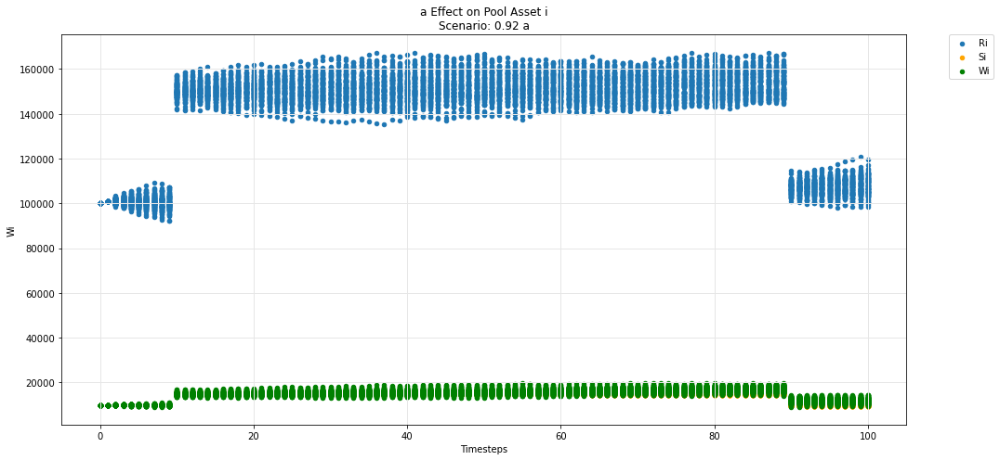

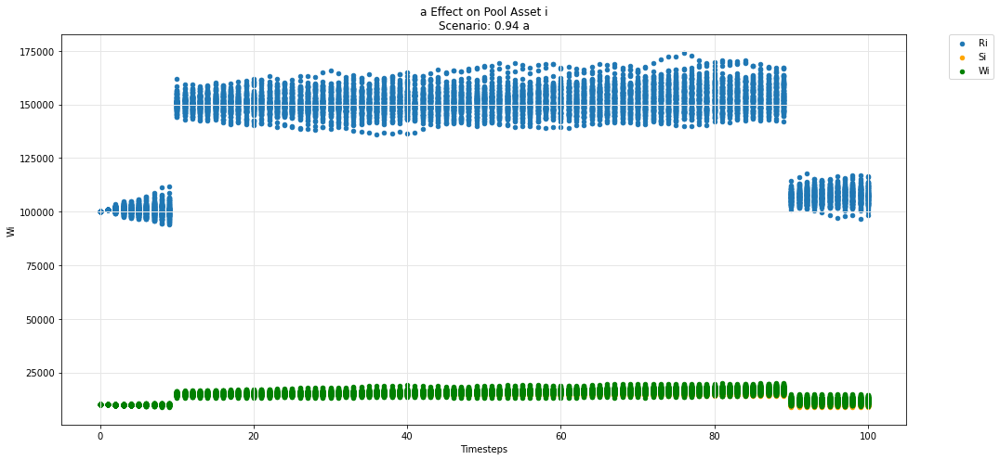

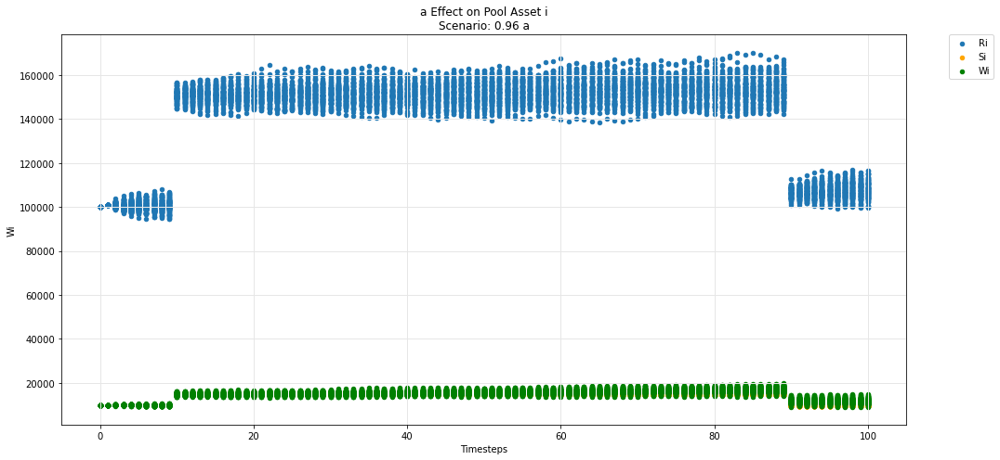

...

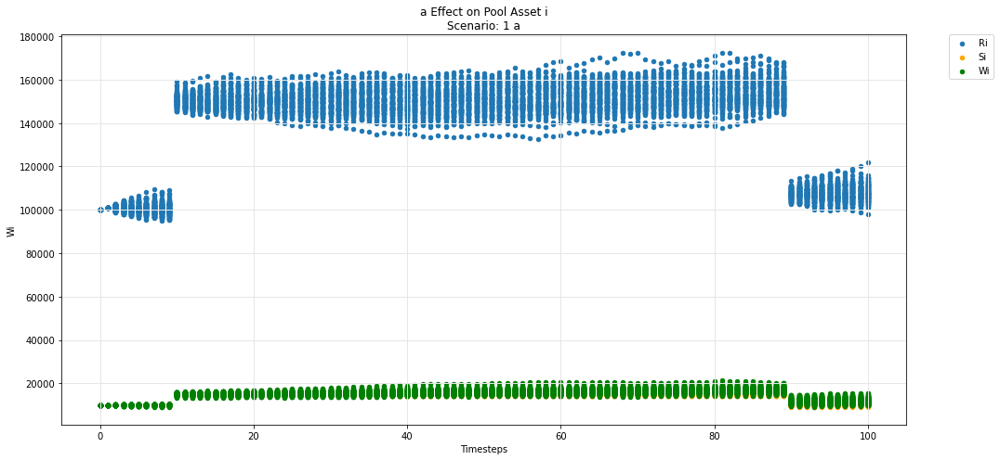

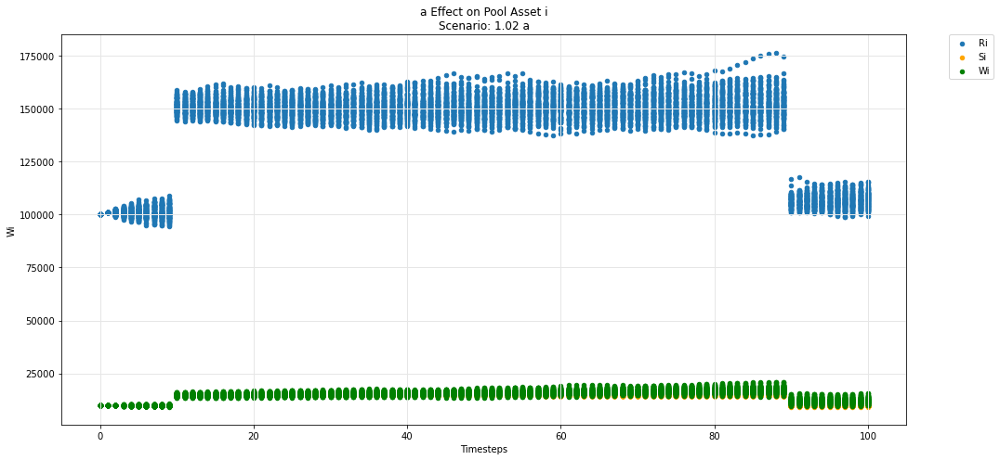

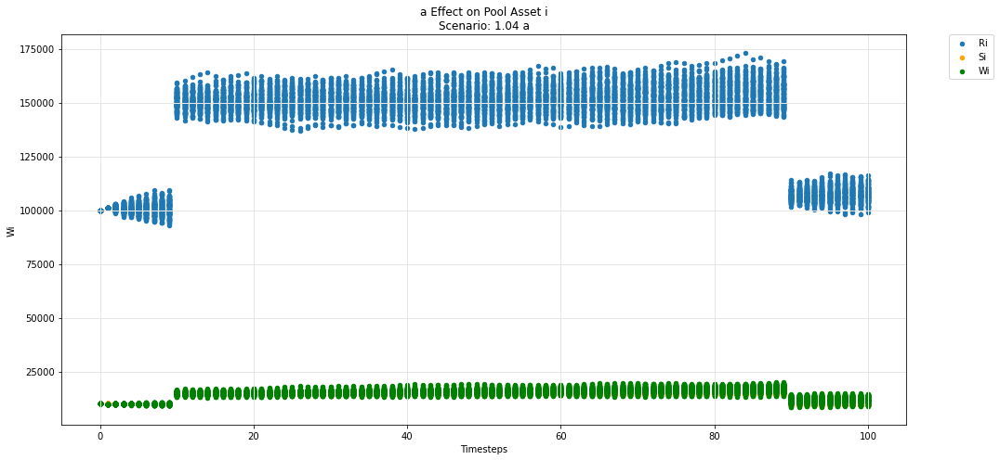

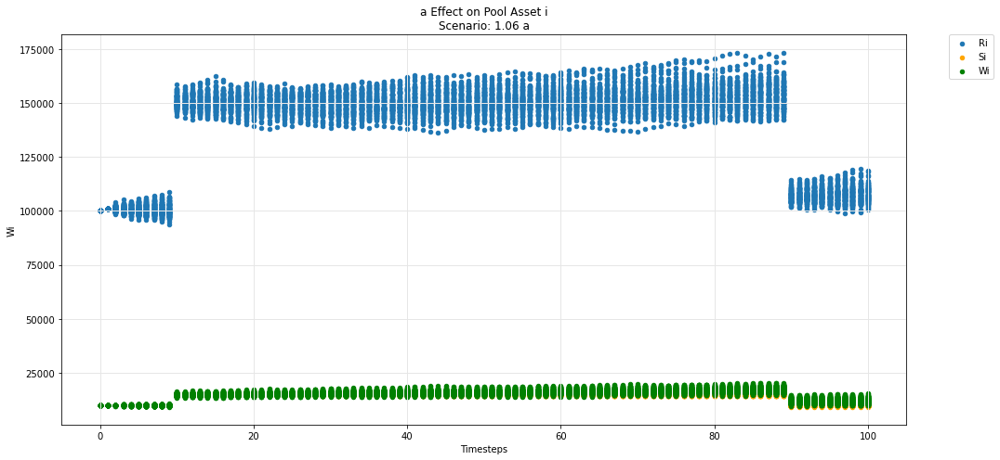

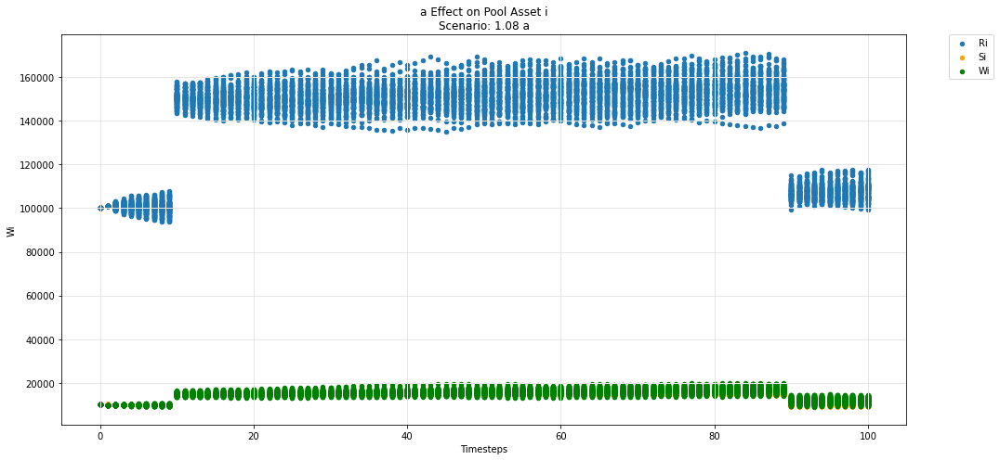

In [58]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

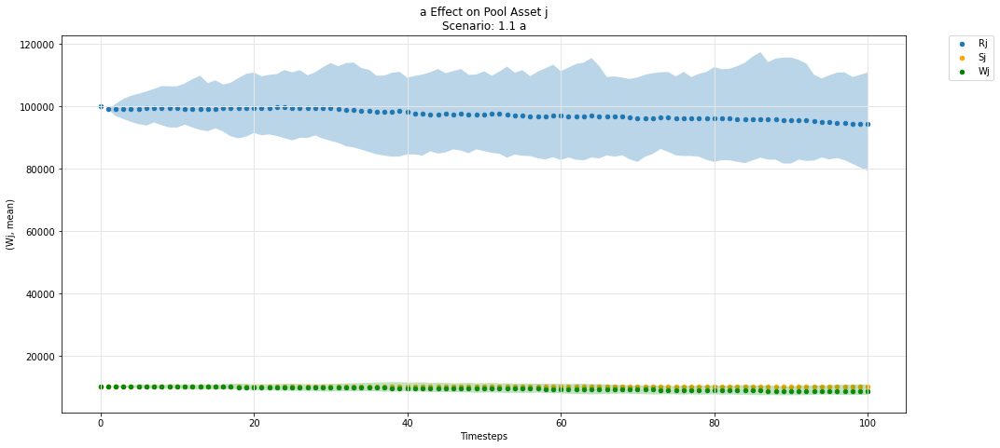

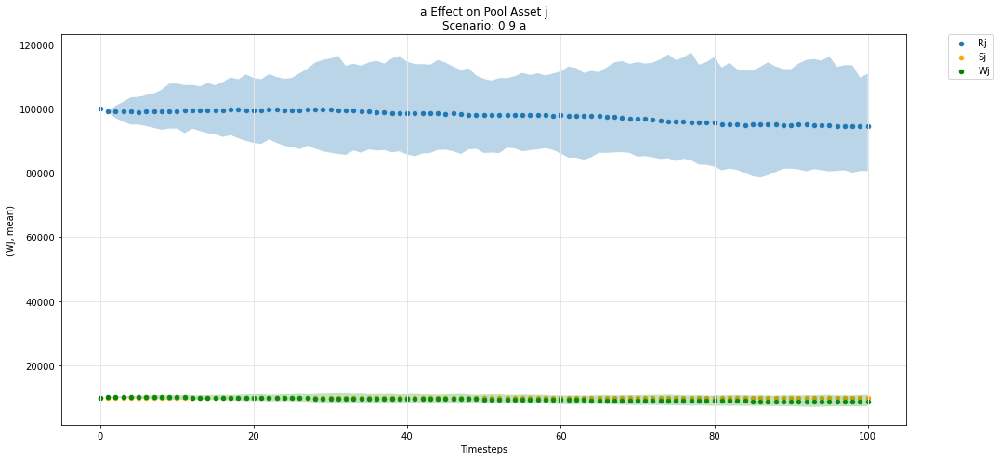

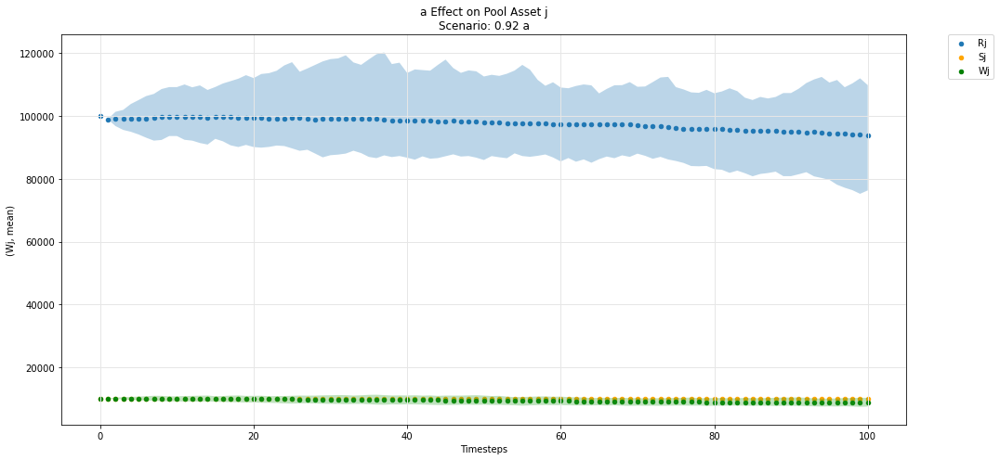

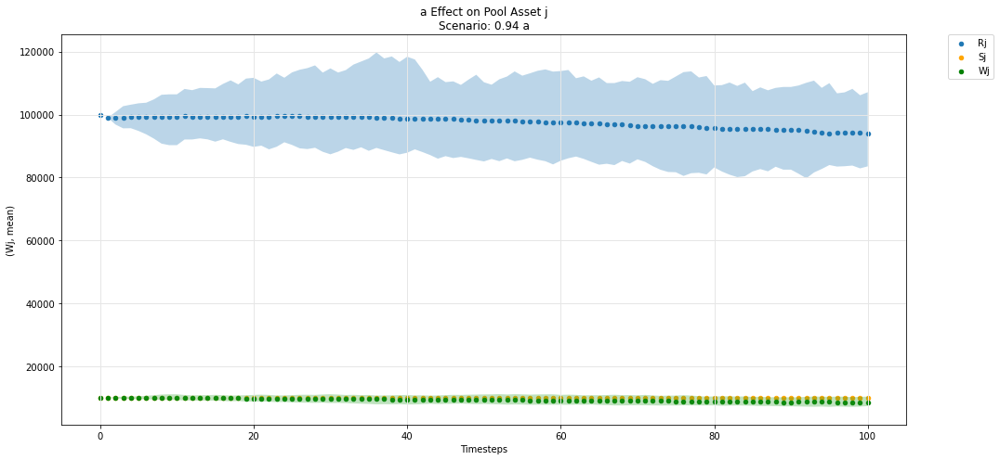

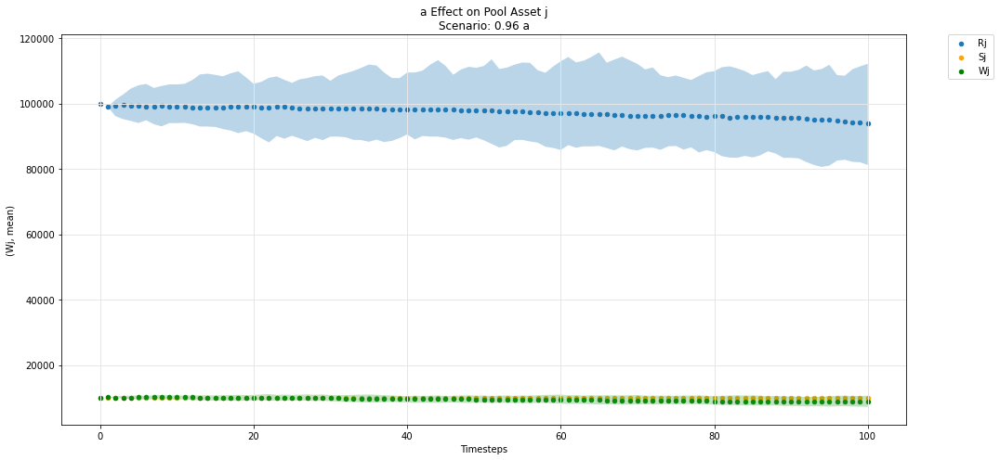

...

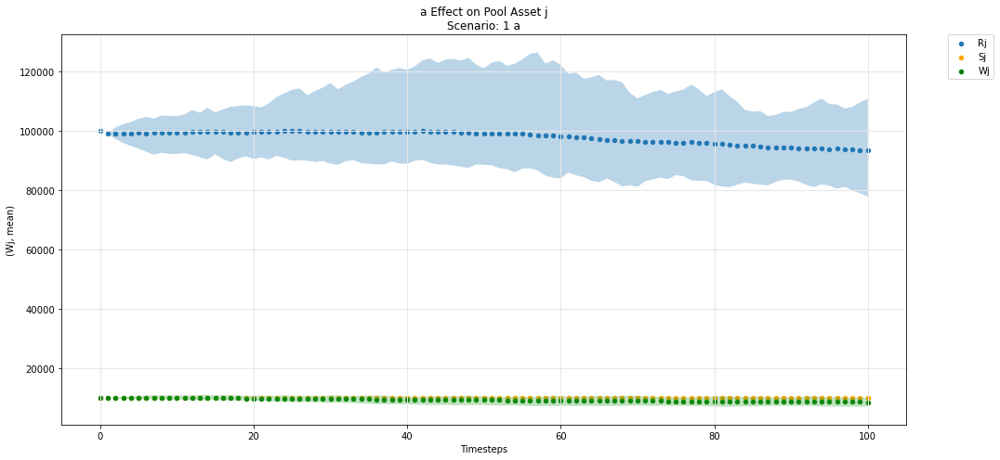

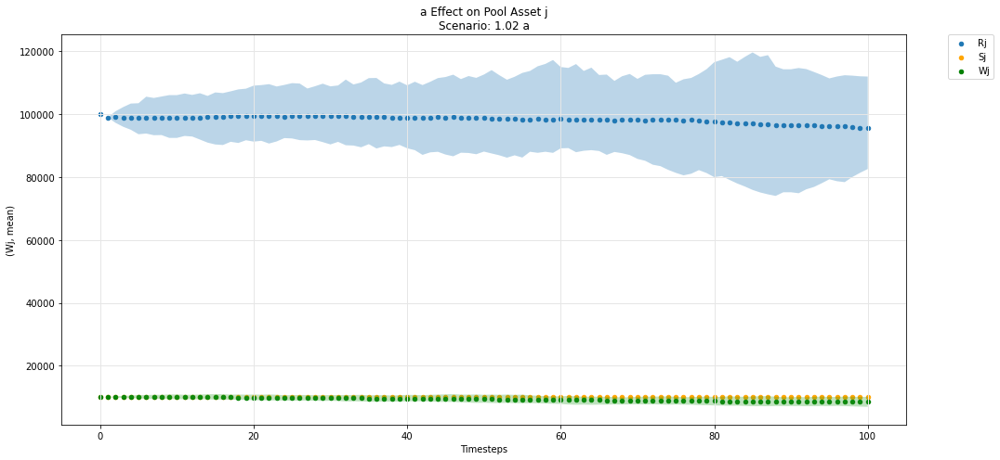

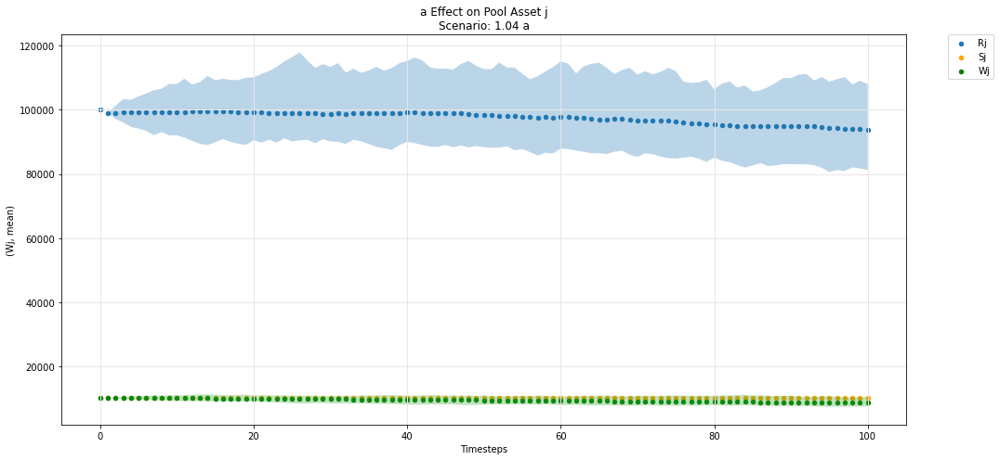

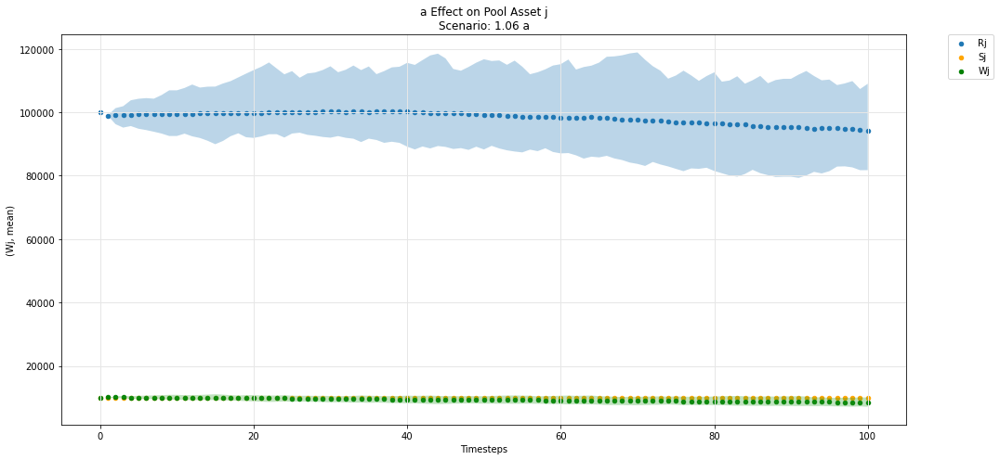

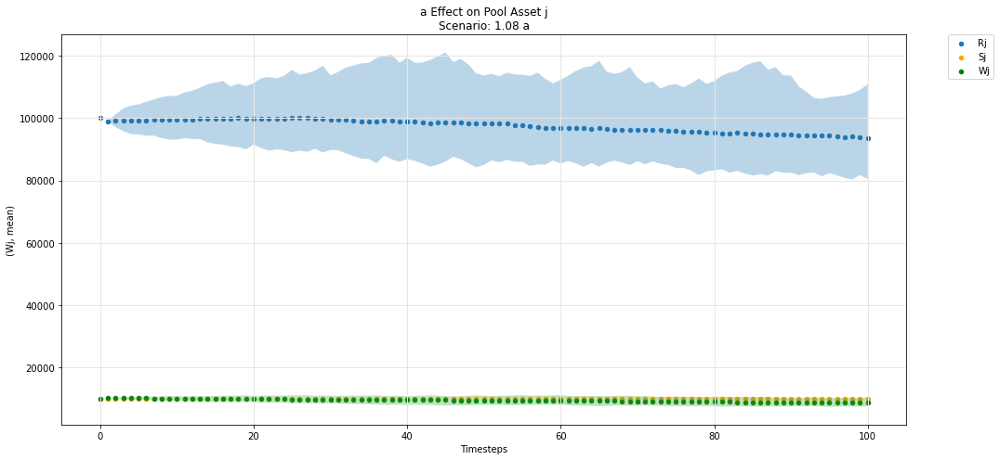

In [59]:
param_pool_simulation_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

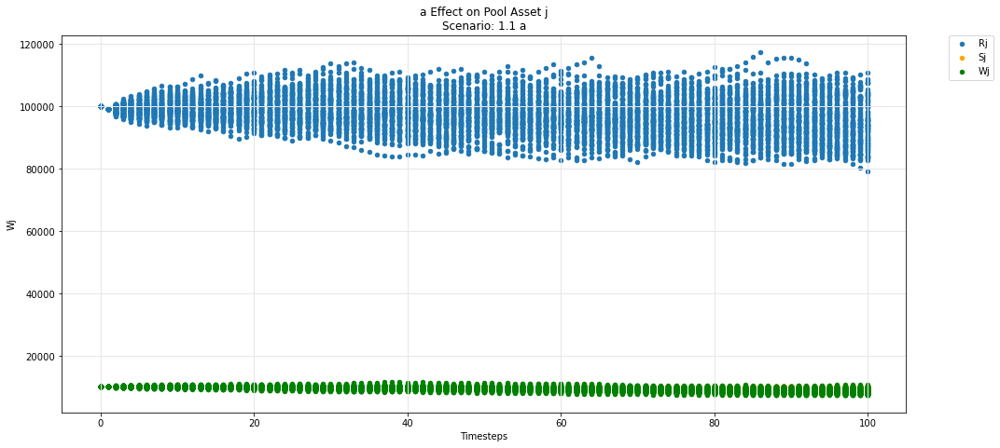

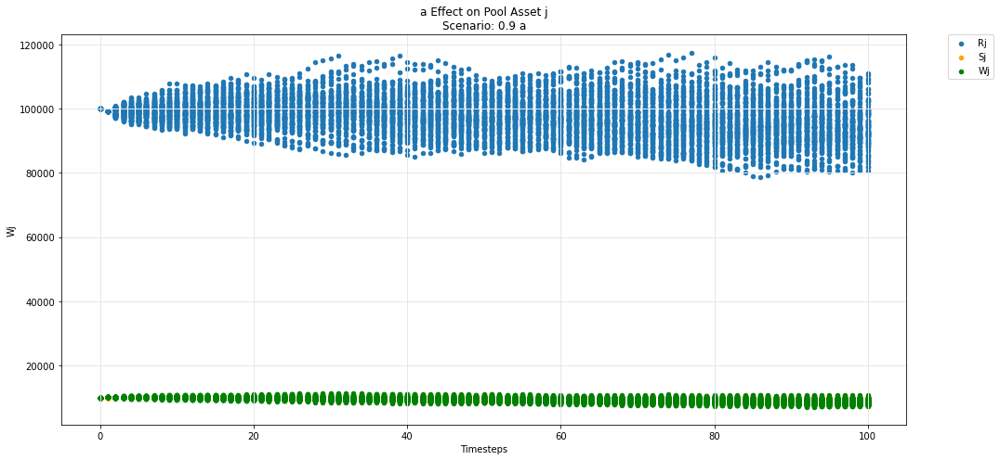

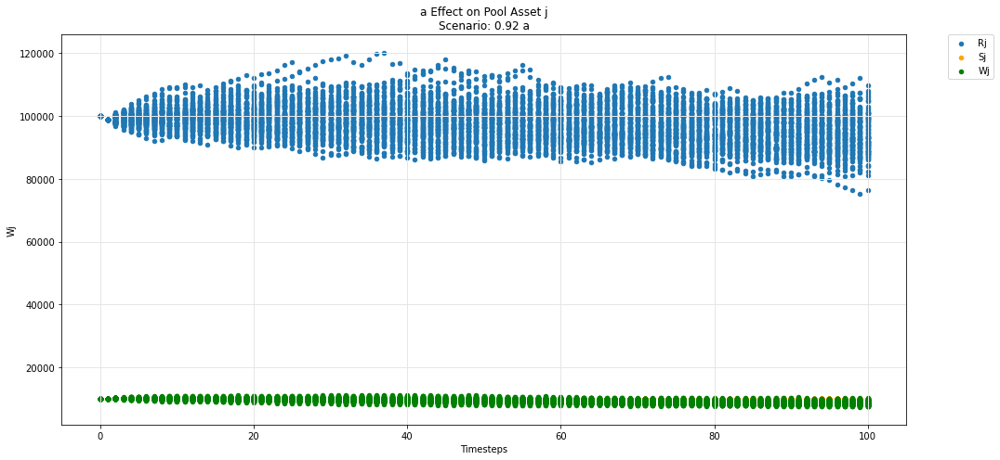

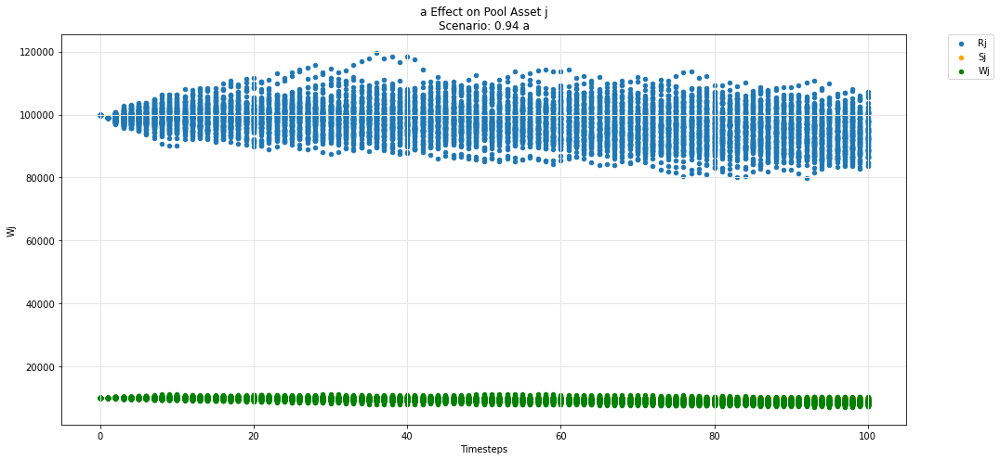

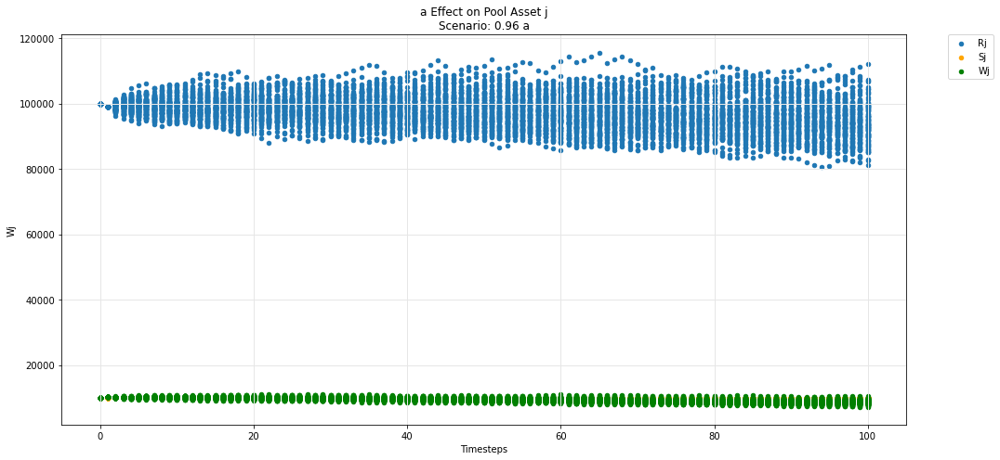

...

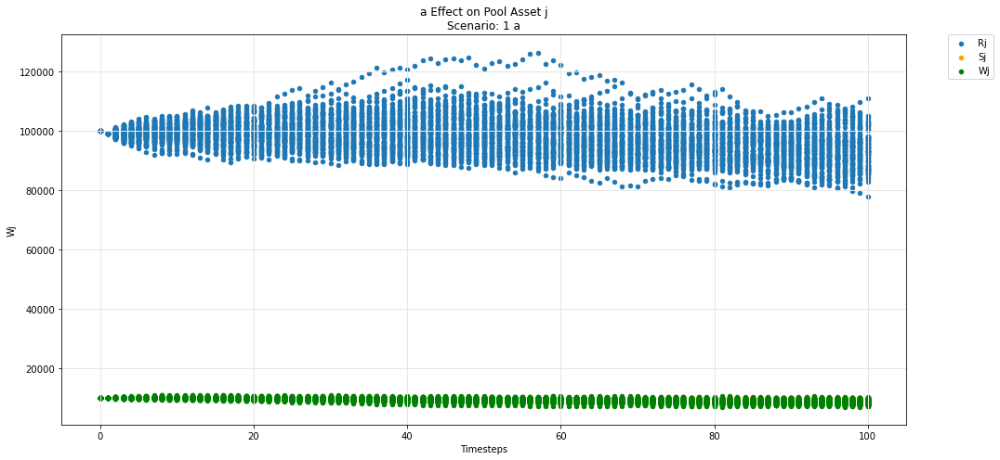

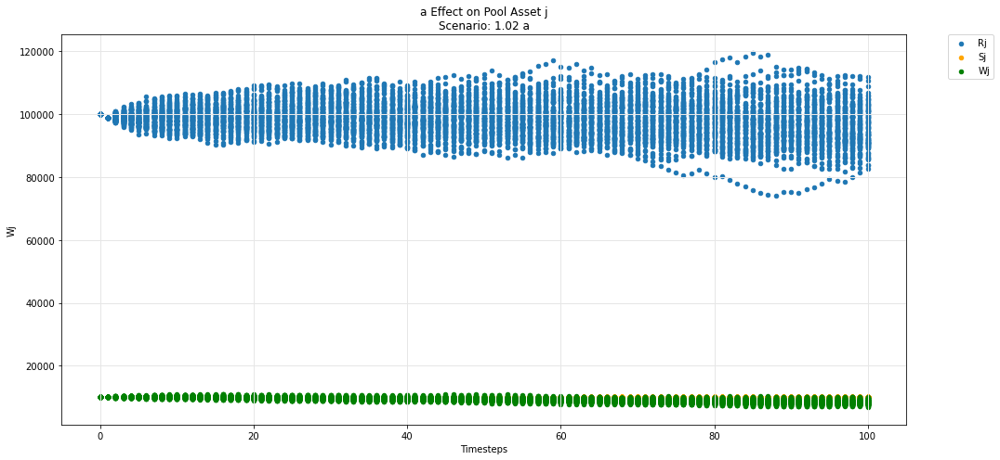

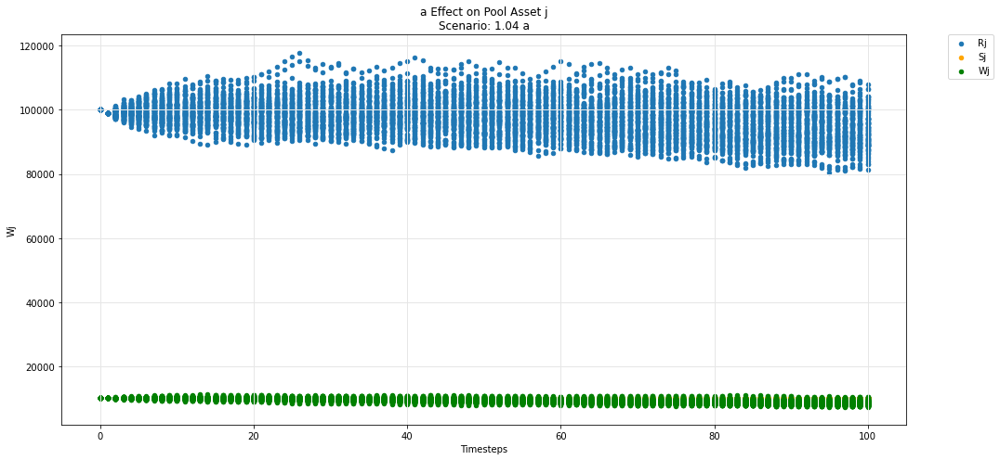

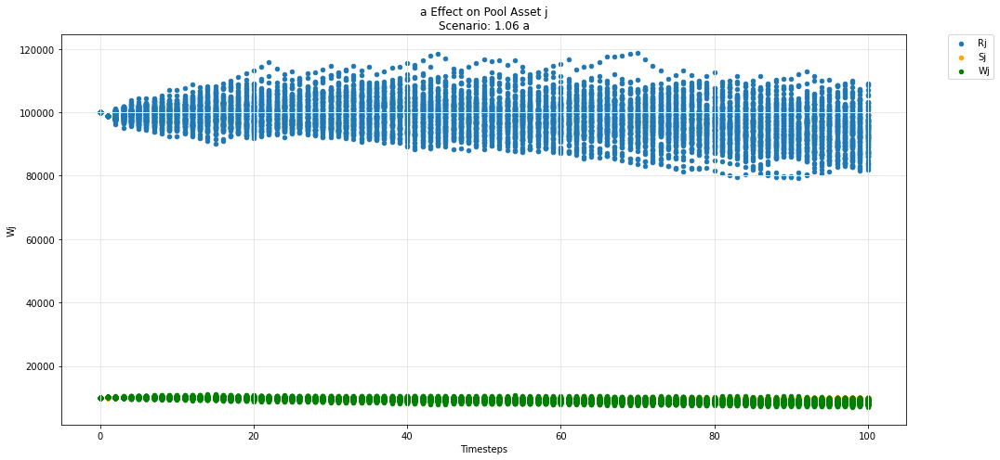

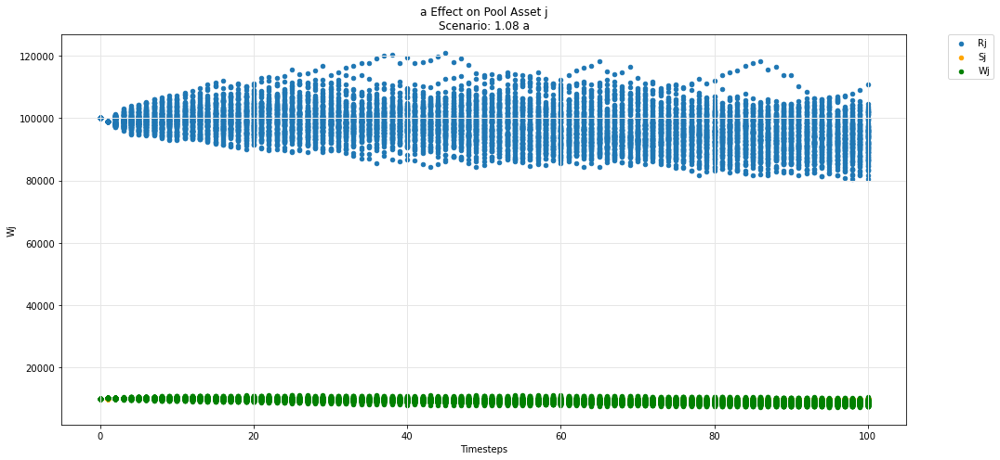

In [60]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

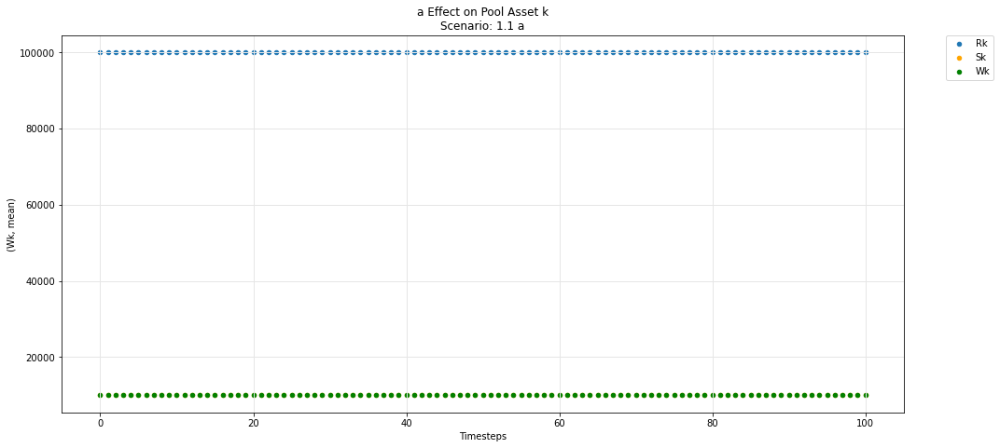

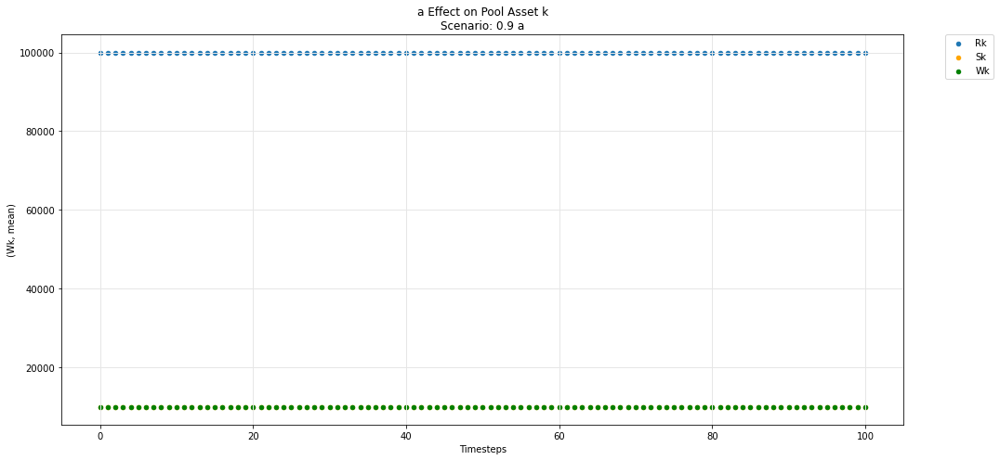

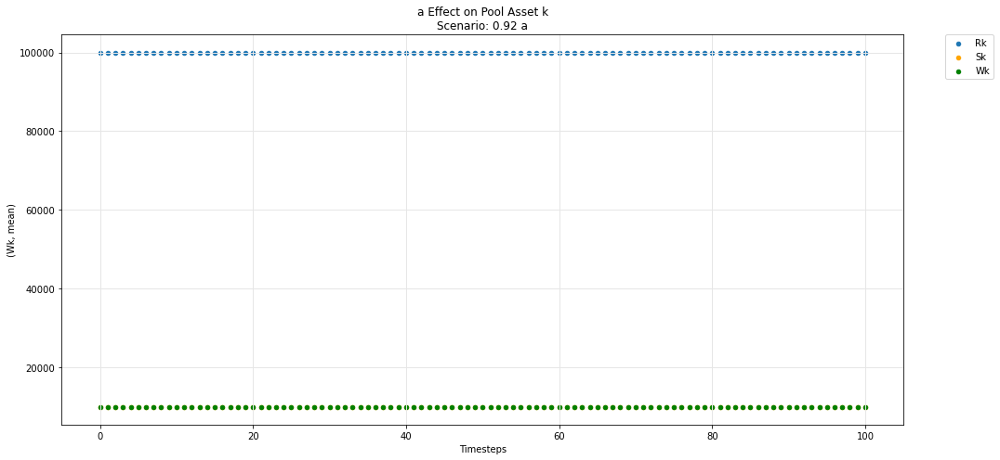

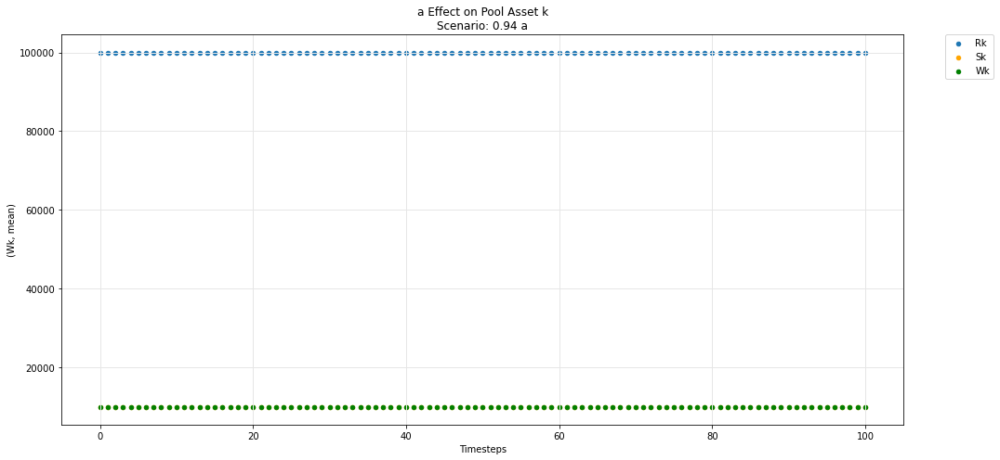

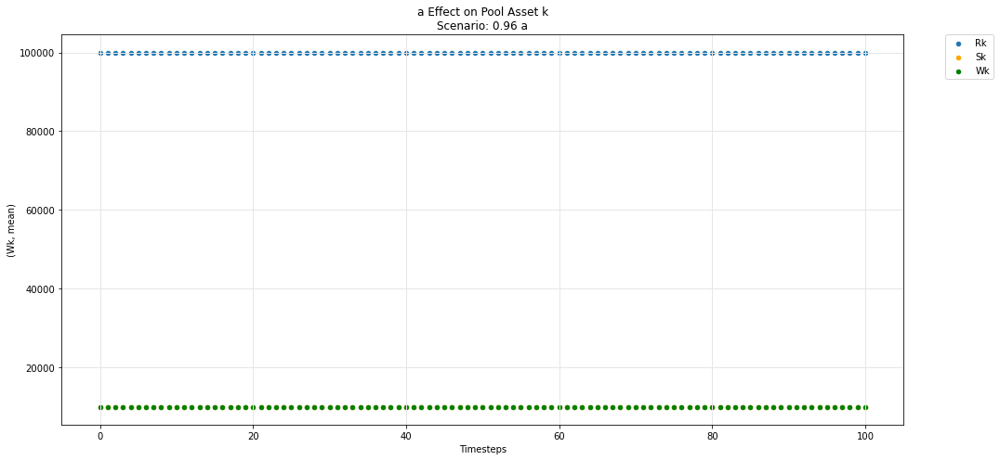

...

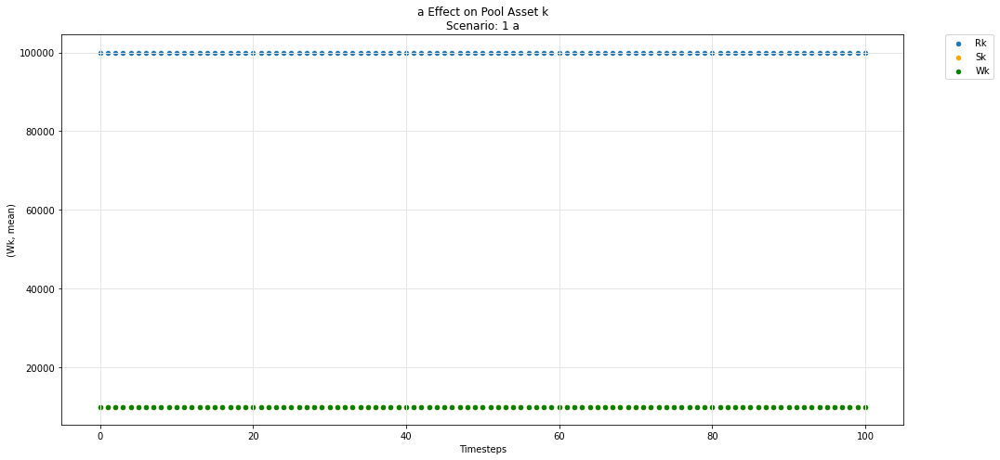

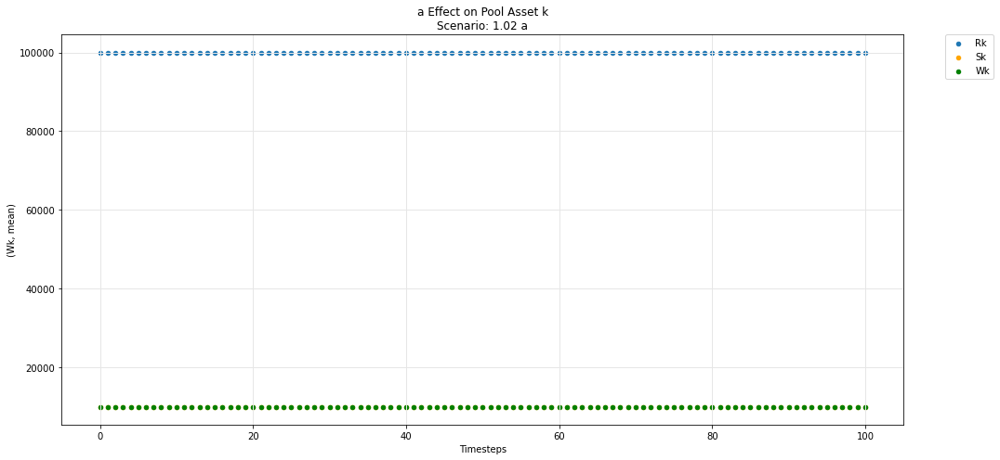

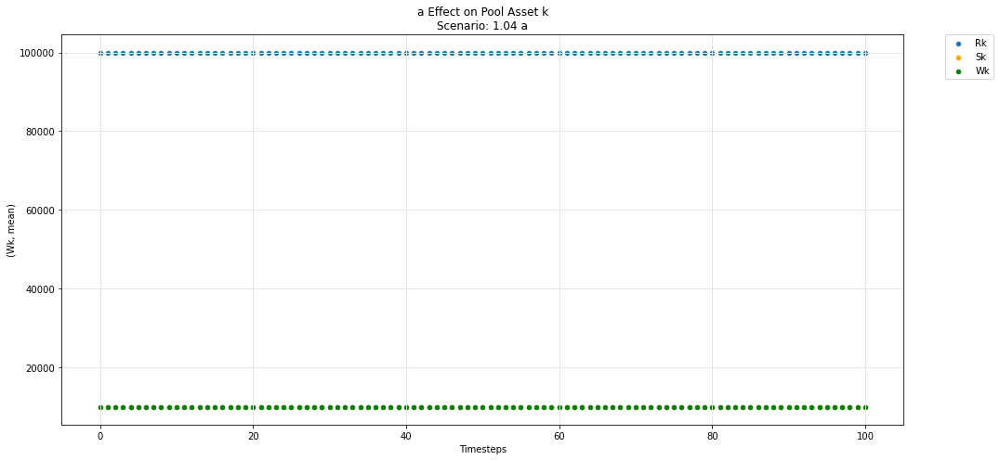

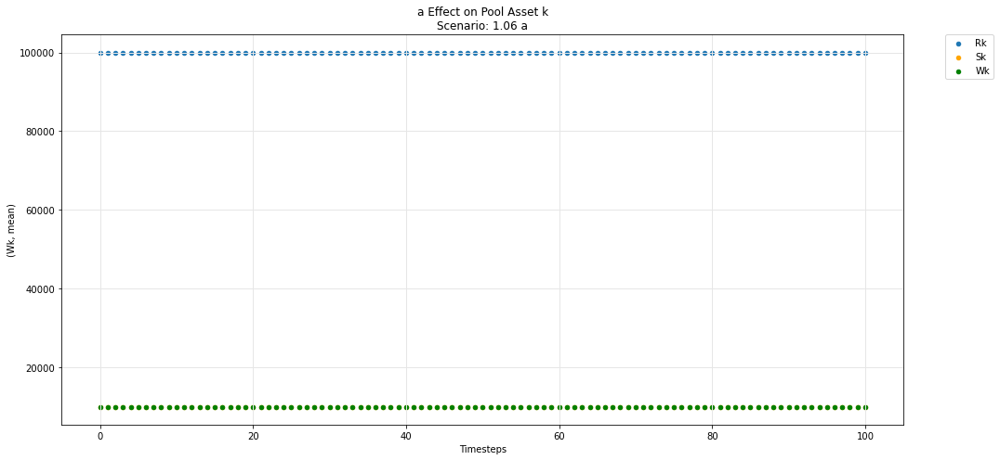

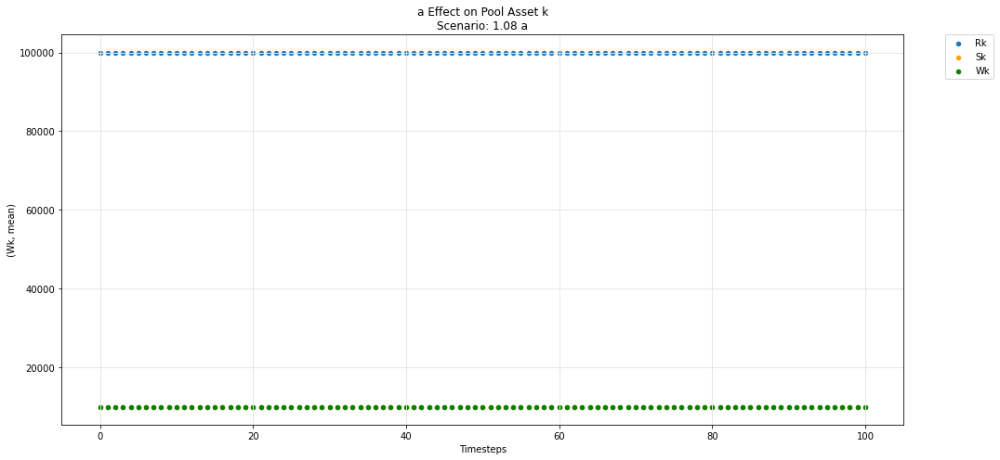

In [61]:
param_pool_simulation_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

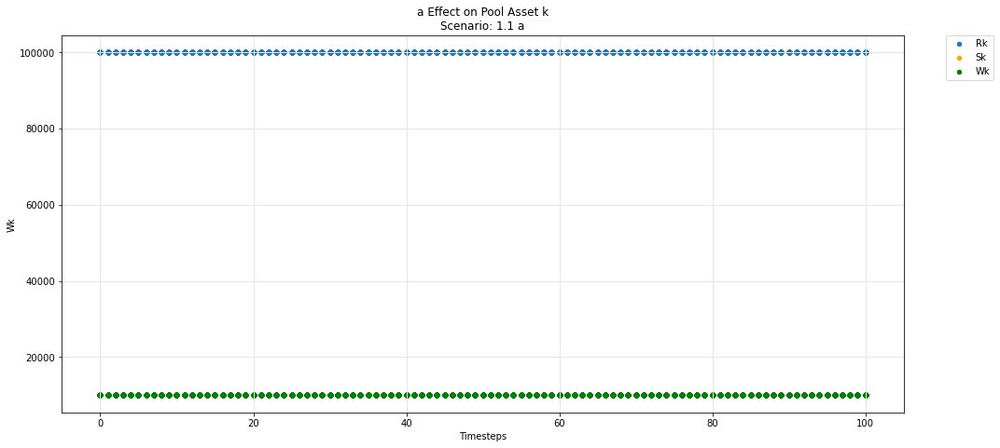

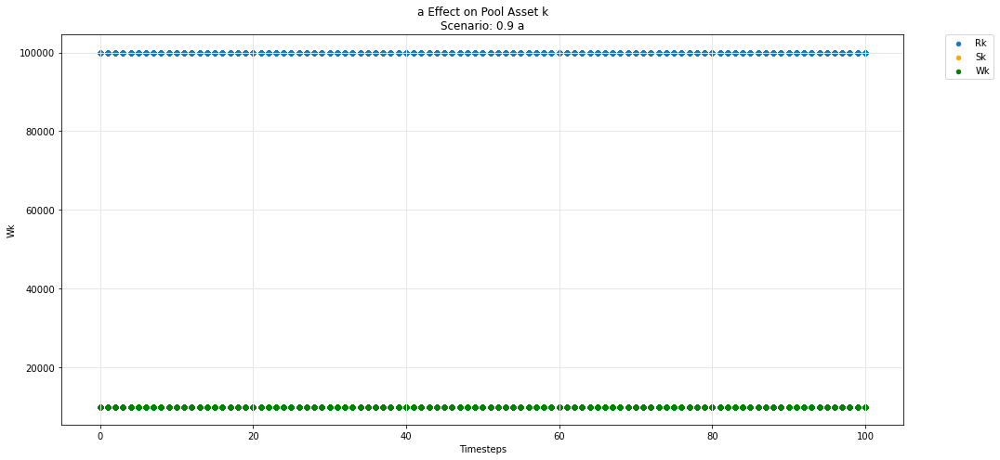

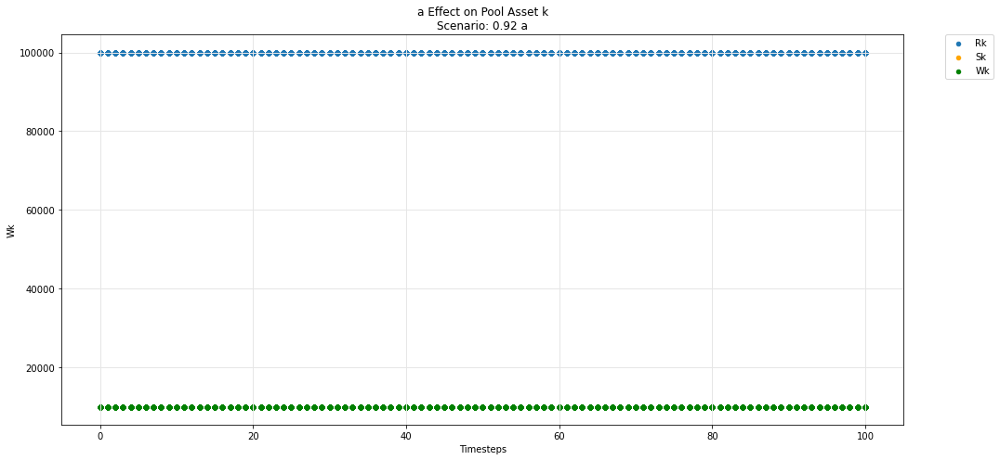

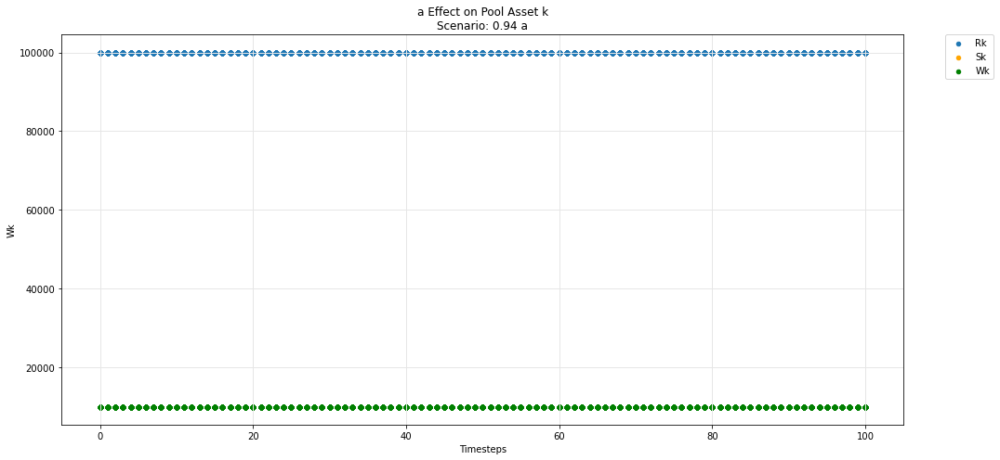

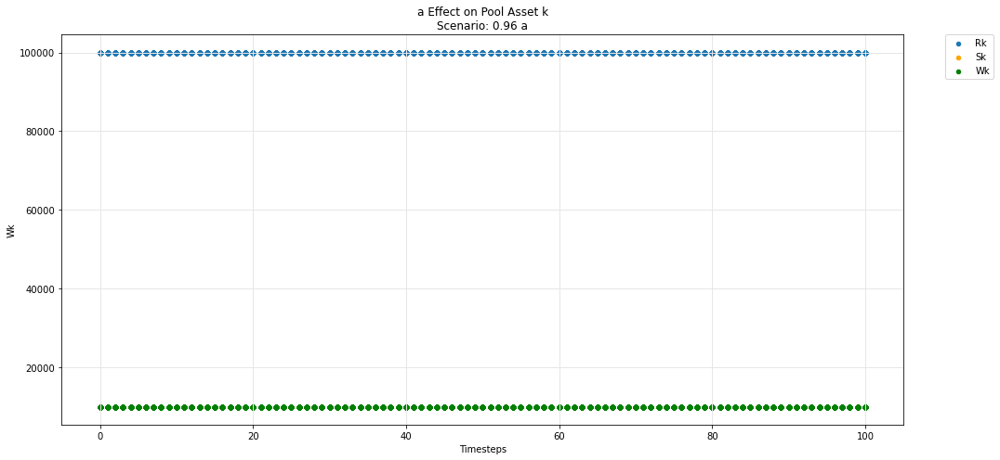

...

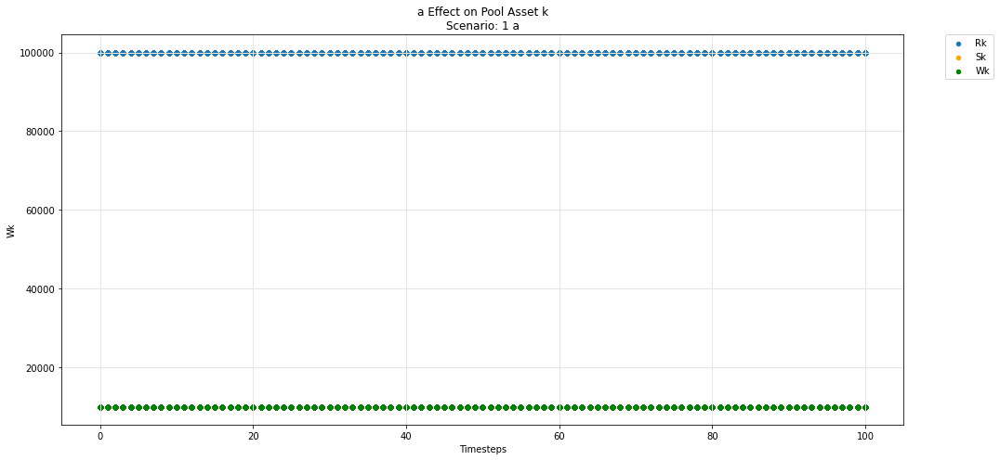

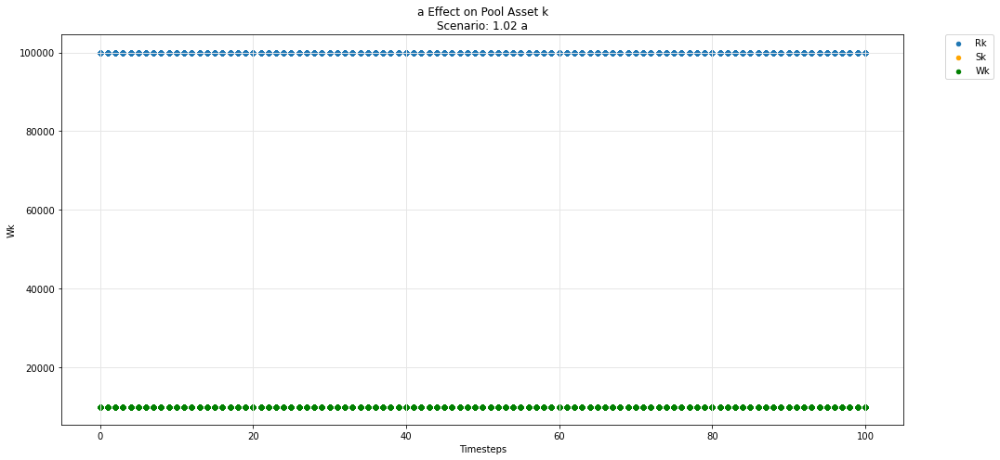

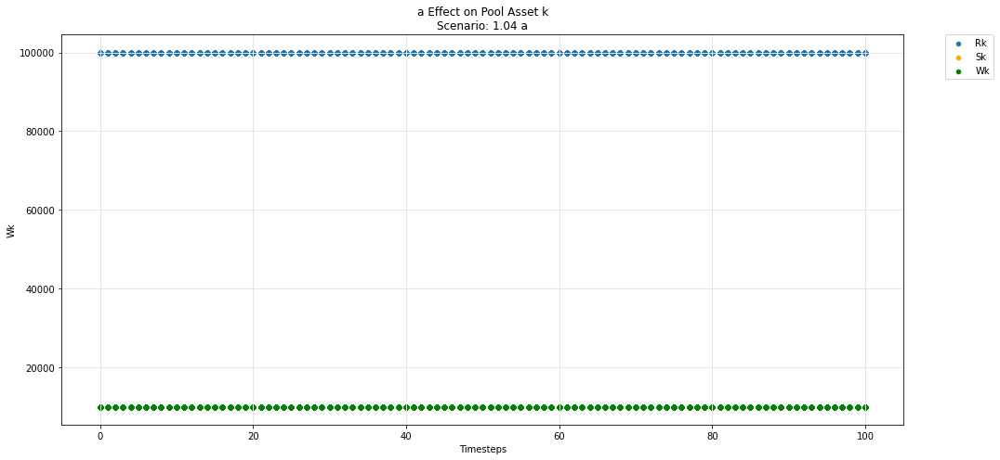

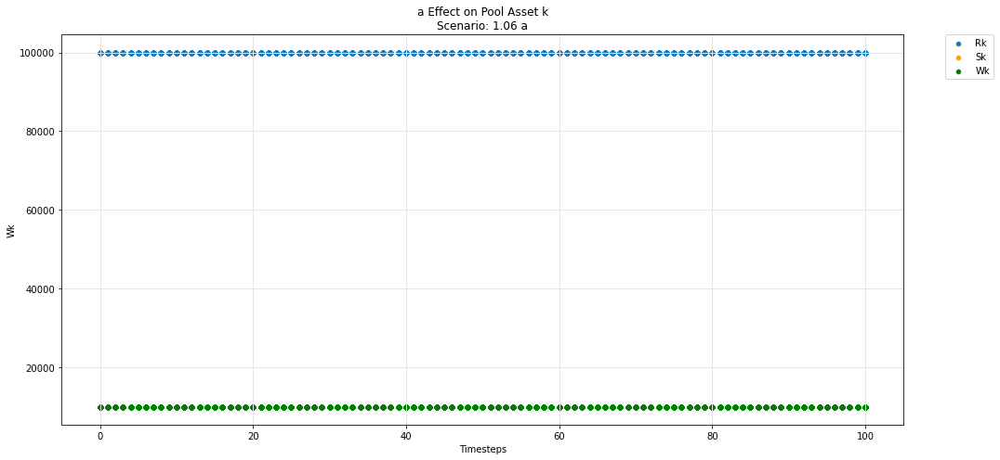

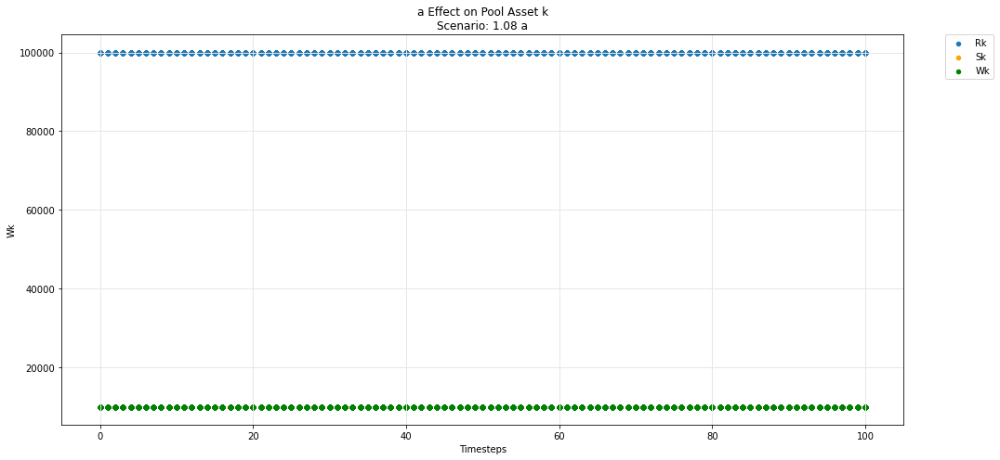

In [62]:
param_pool_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

In [63]:
def param_pool_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=df_label, label=df_label, ax=ax, legend=True, kind ='scatter')

        for count, arg in enumerate(args):
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))

            df.plot(x='timestep', y=df_arg_label, label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

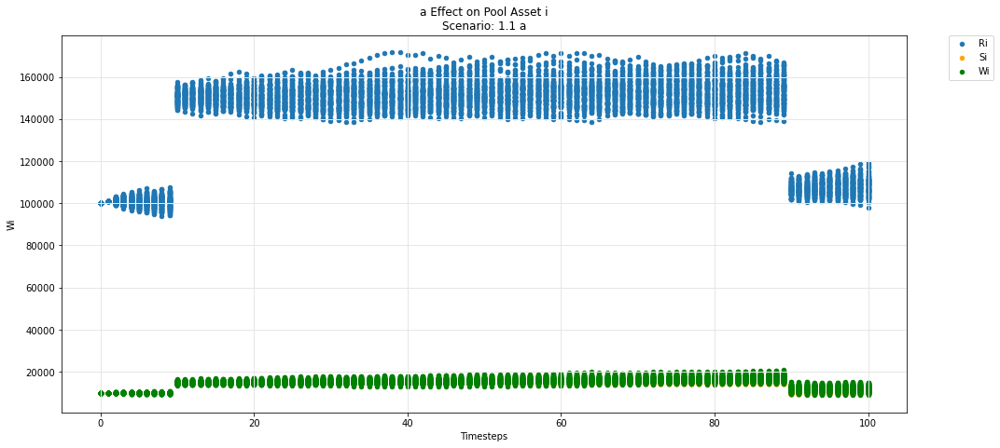

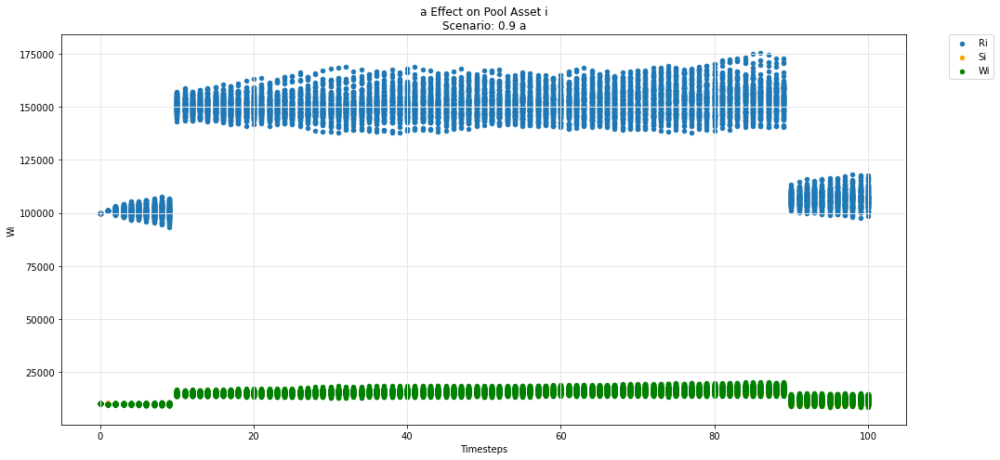

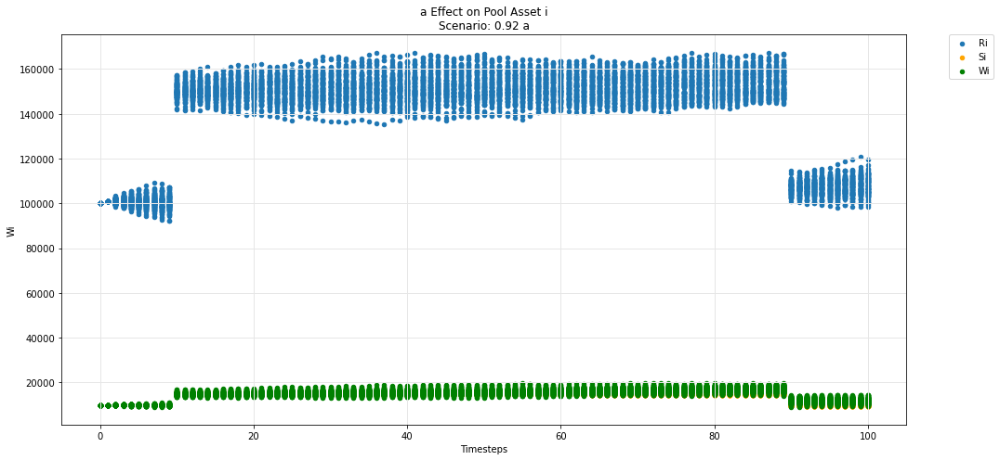

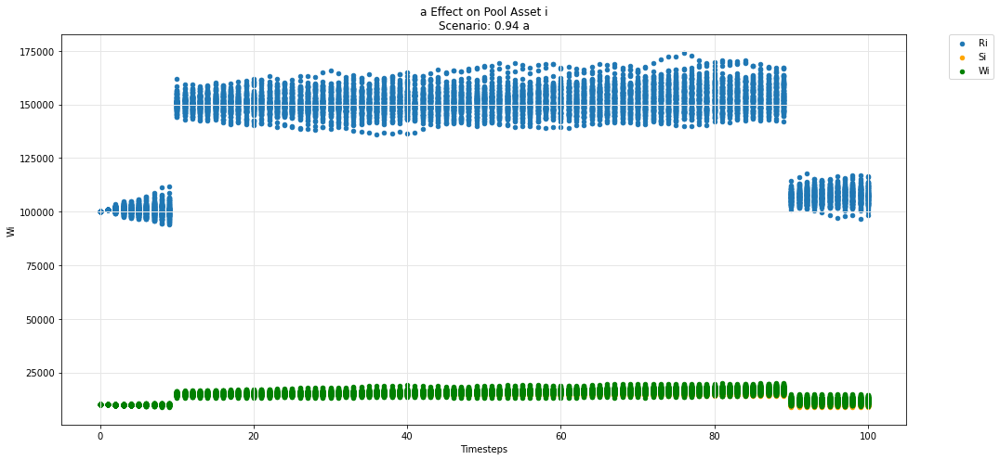

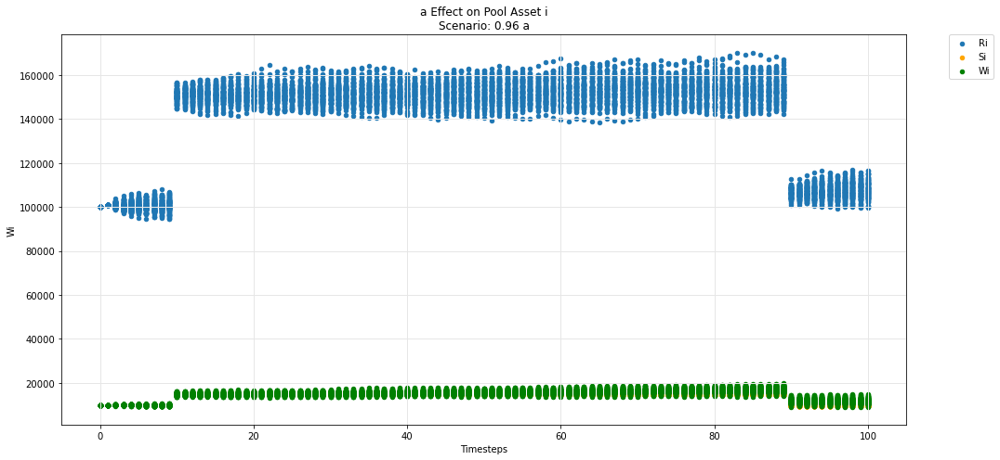

...

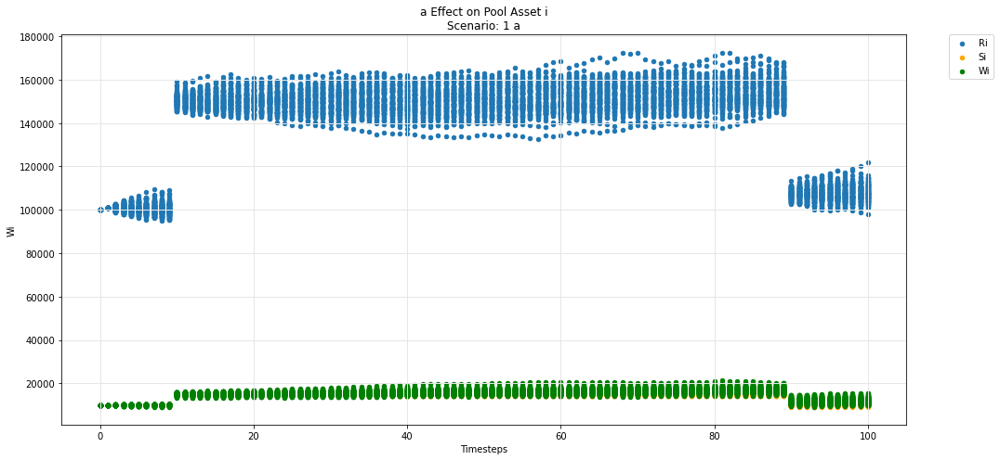

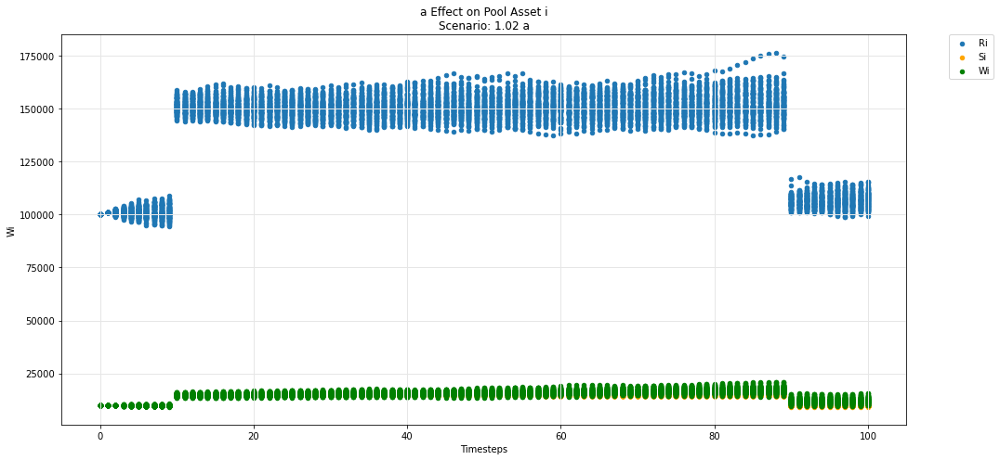

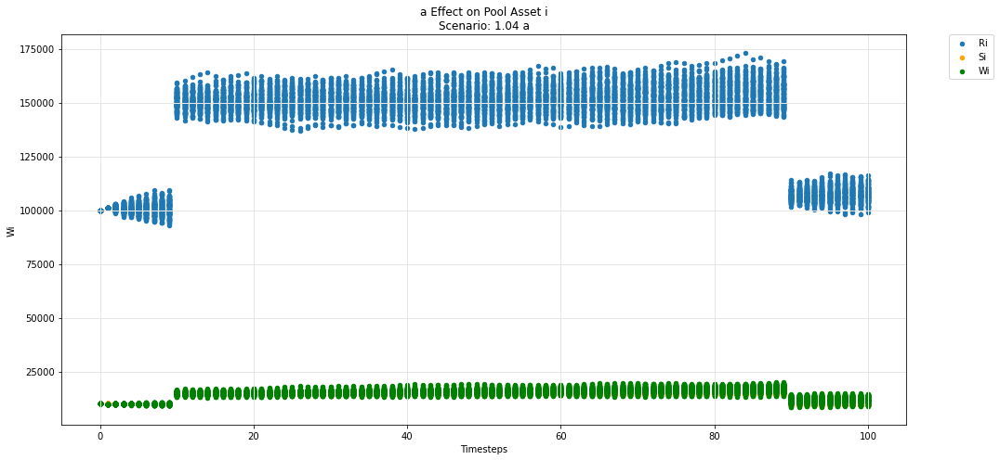

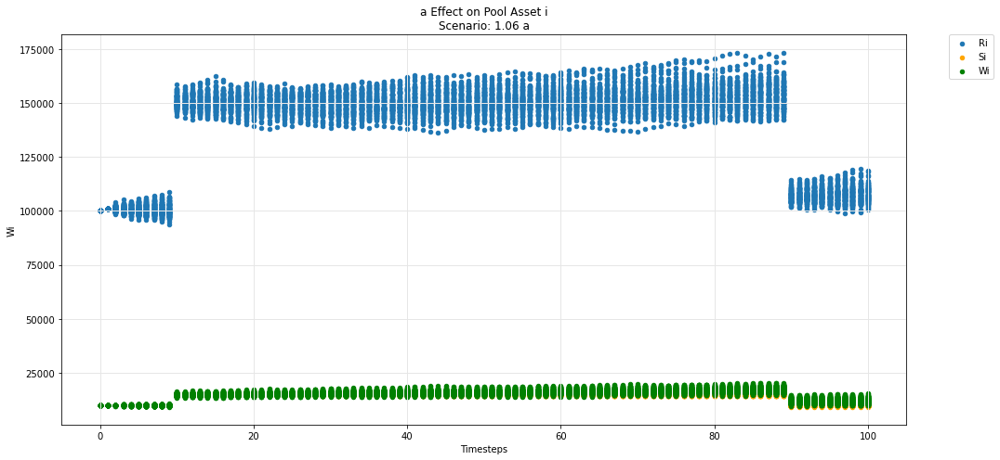

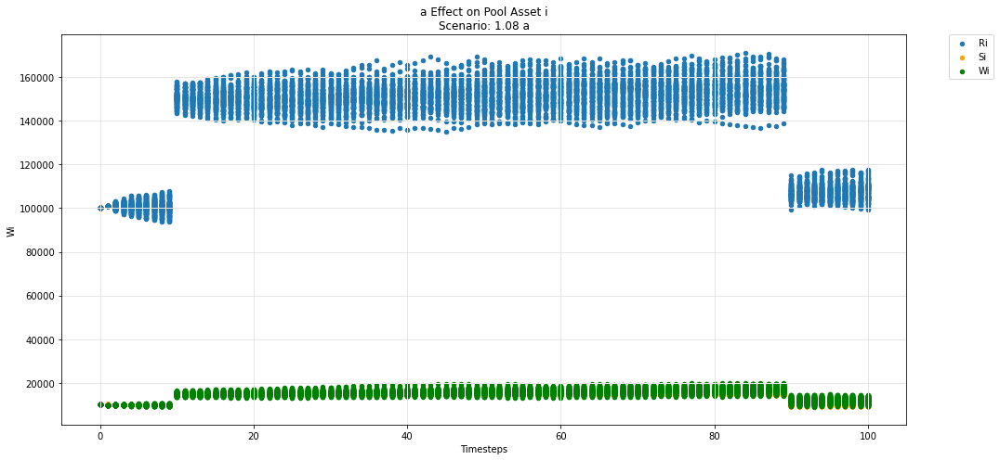

In [64]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

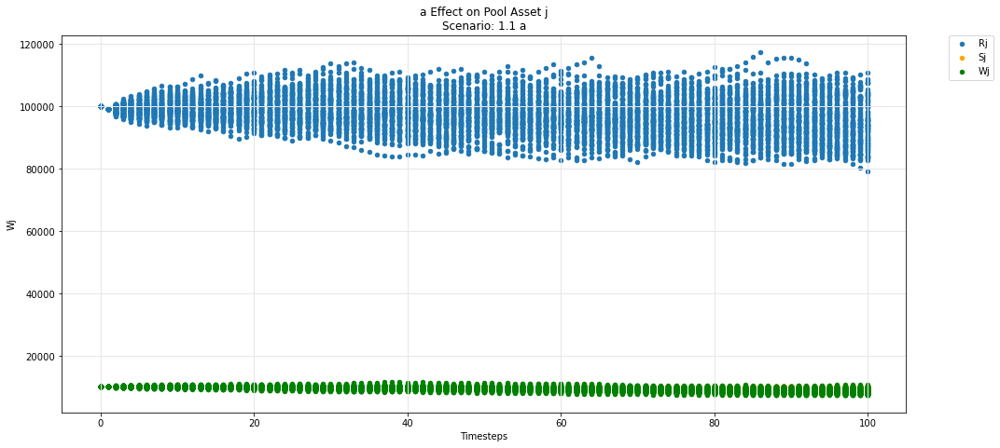

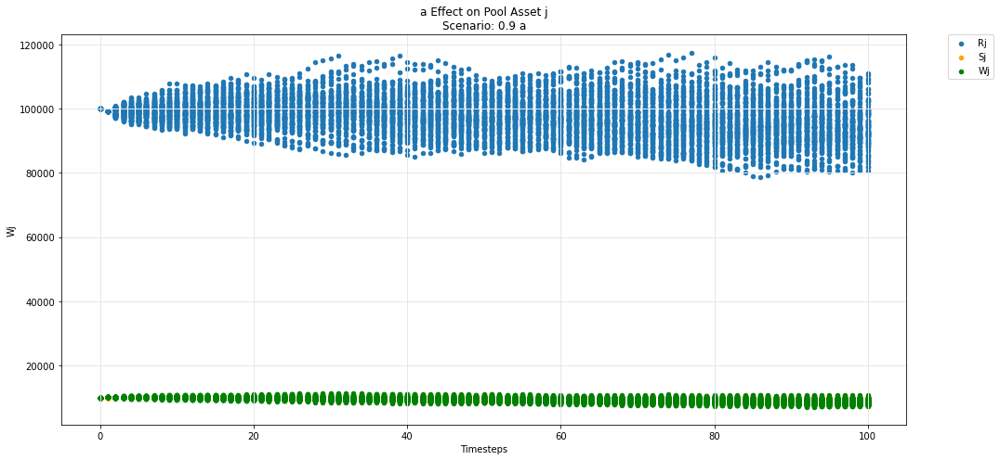

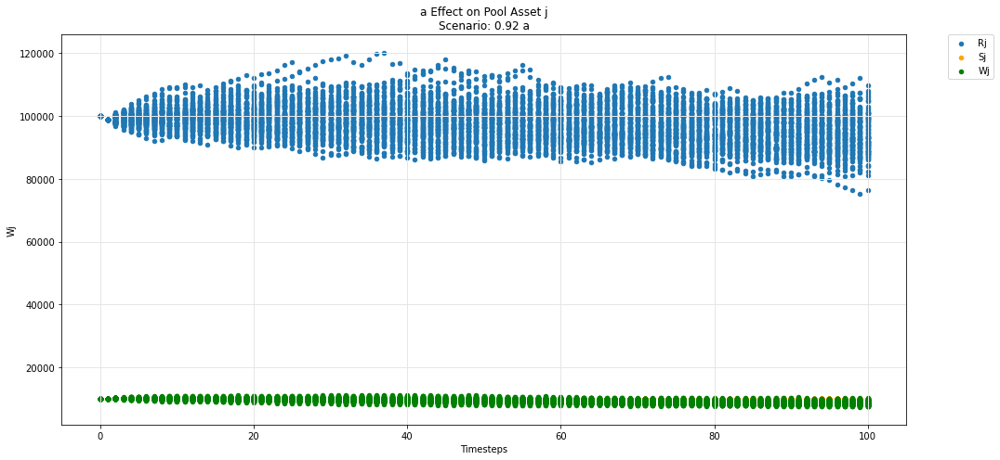

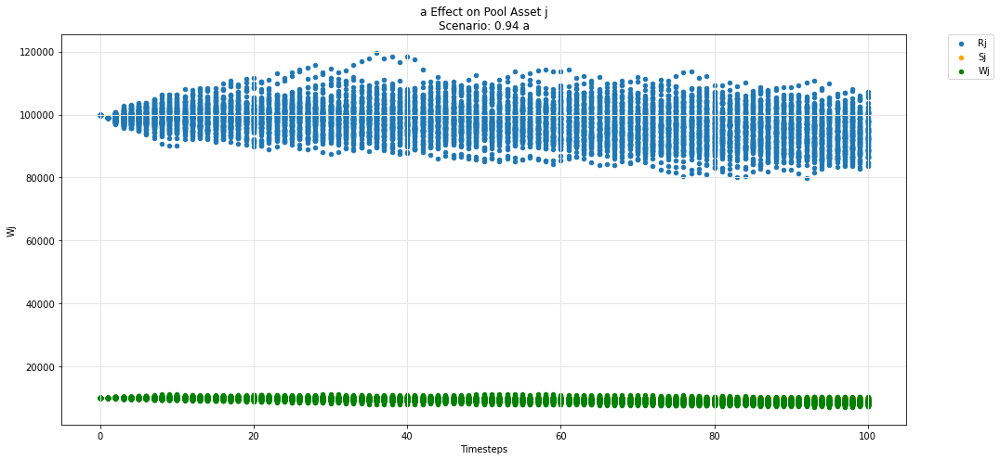

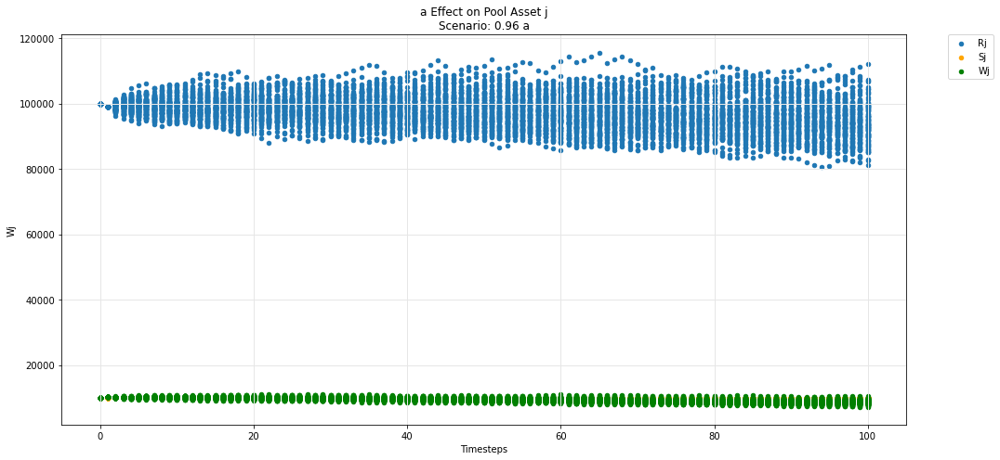

...

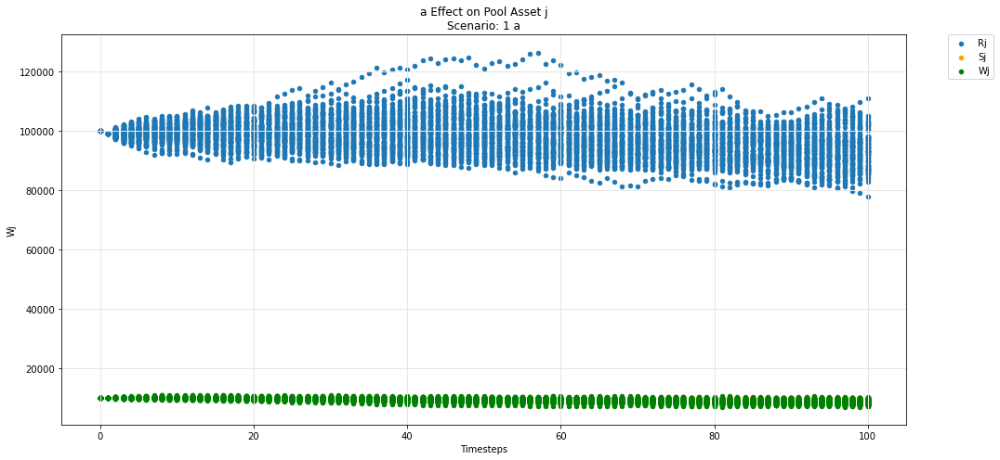

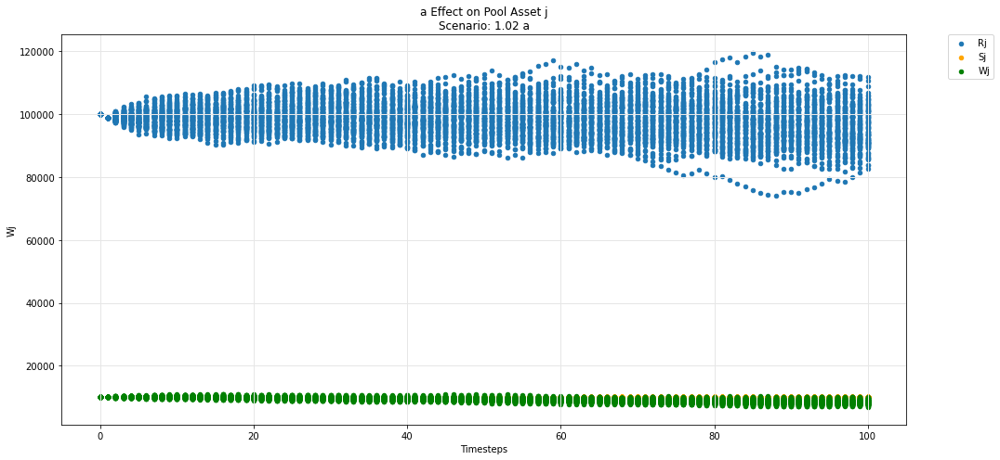

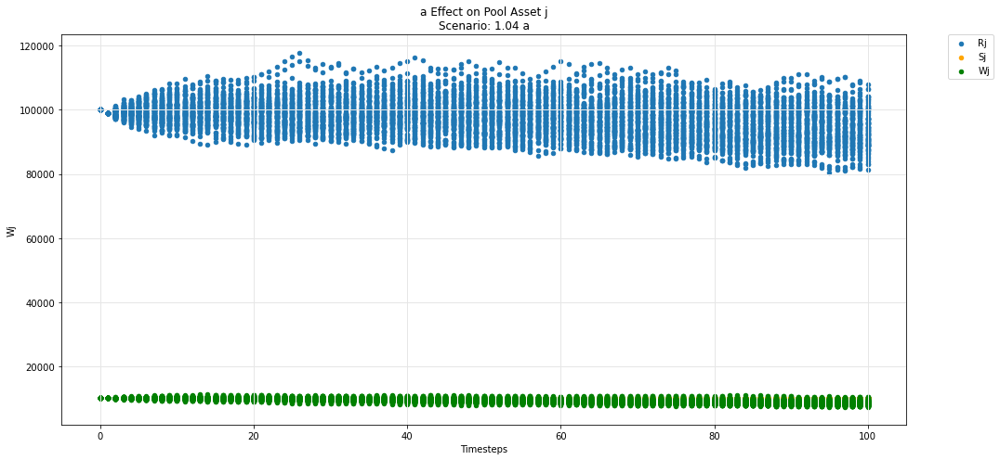

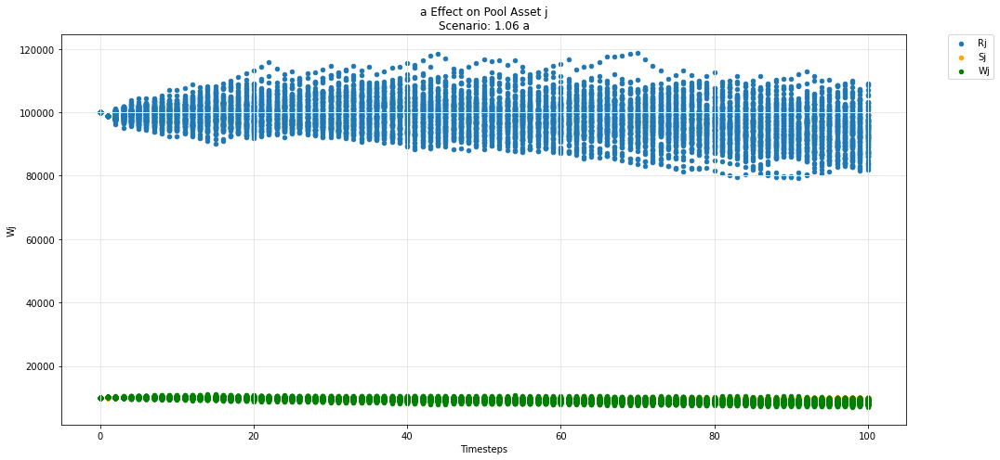

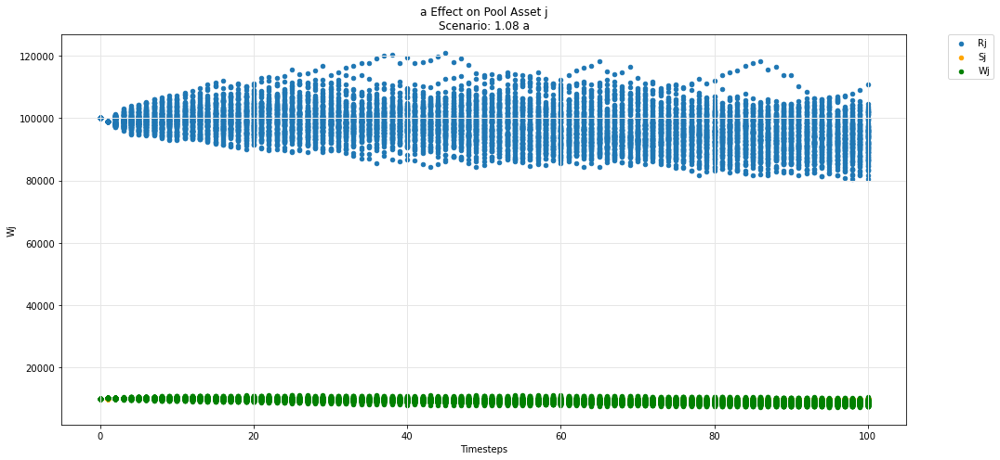

In [65]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

In [66]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

# Prices

## Uniswap

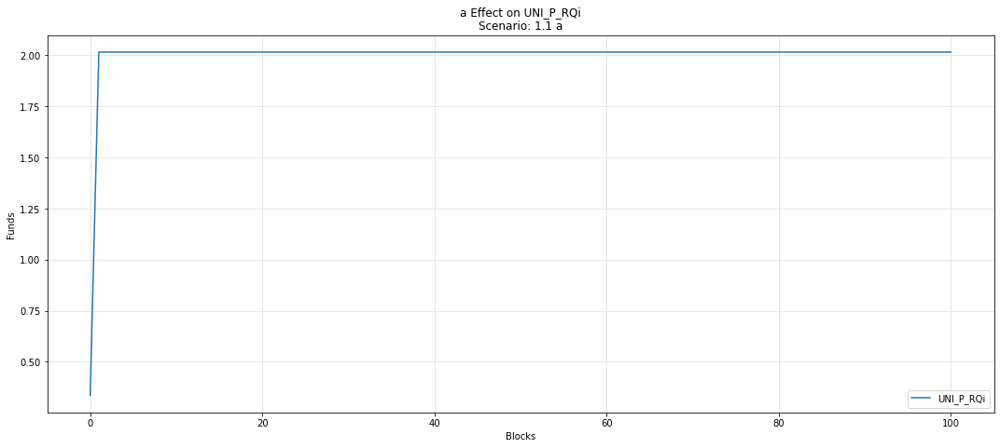

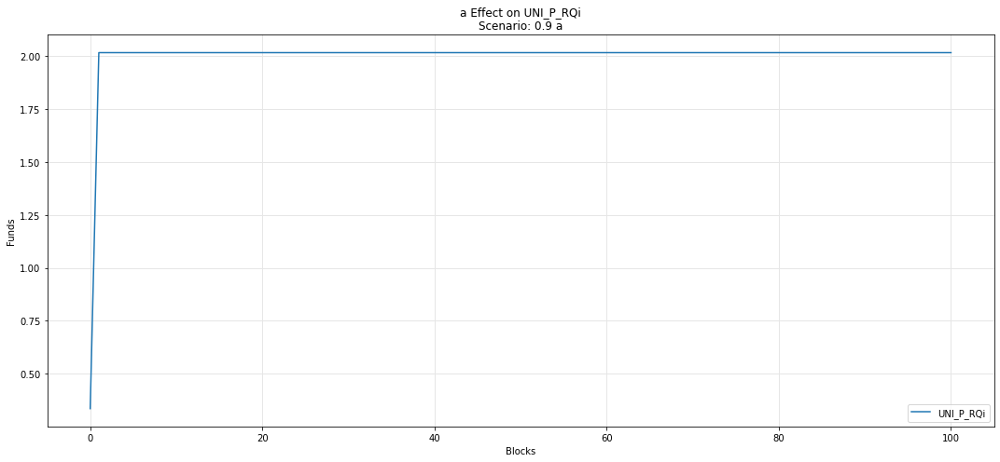

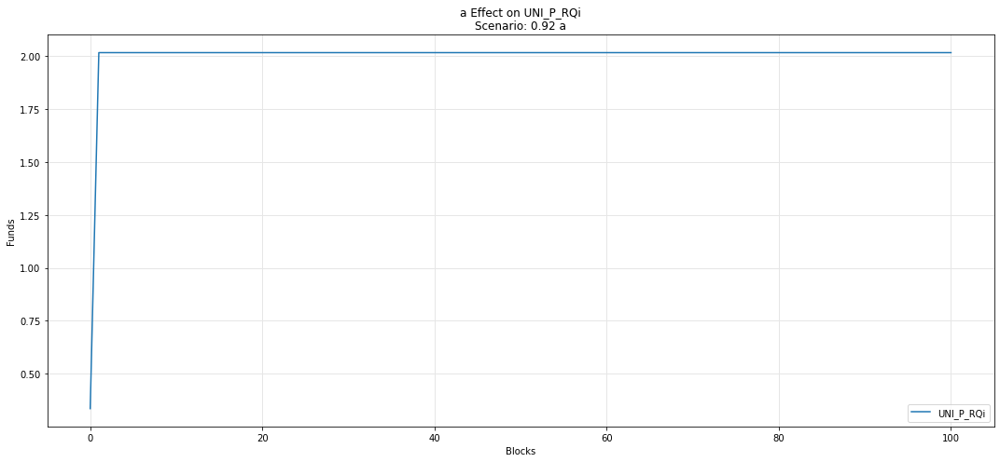

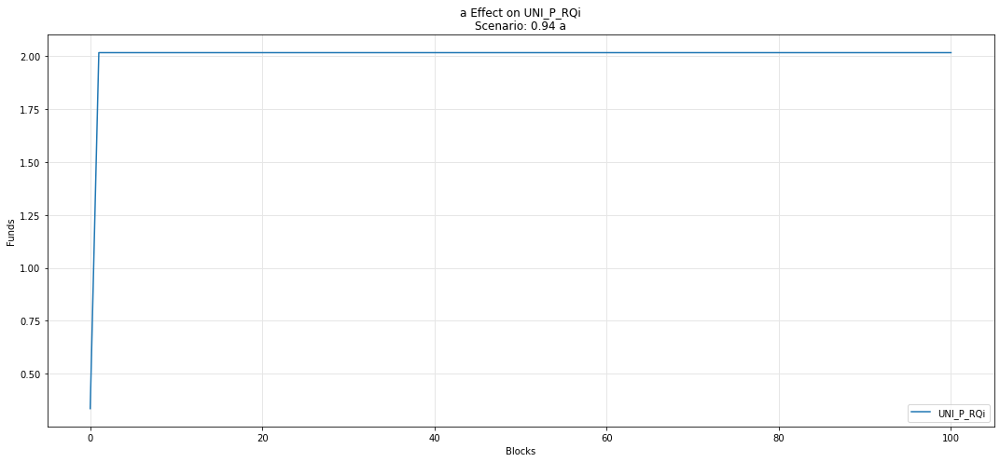

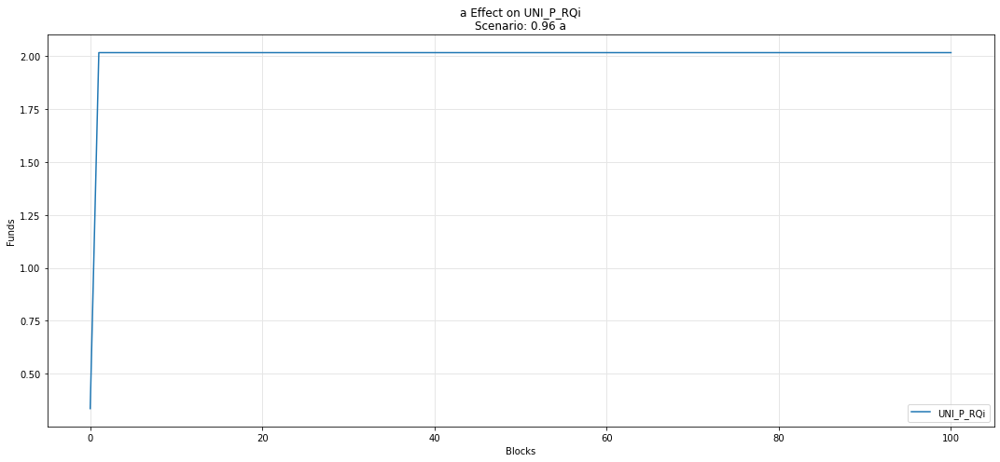

...

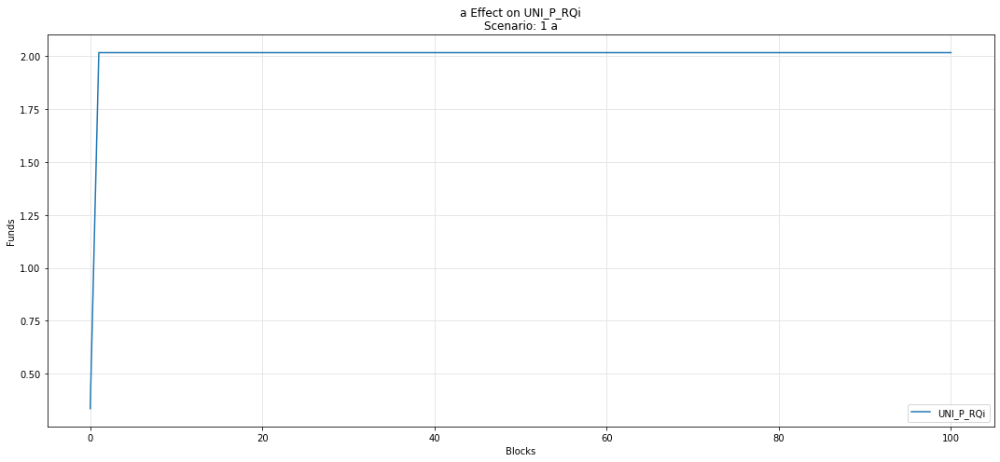

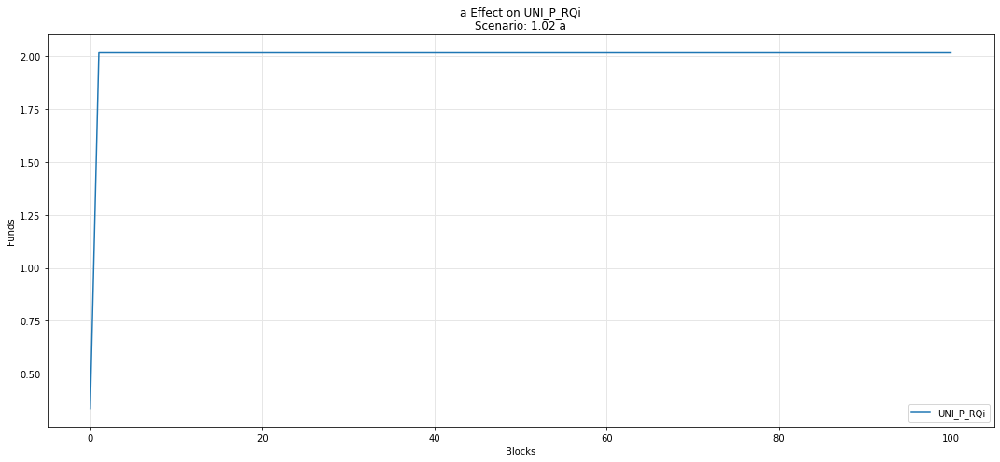

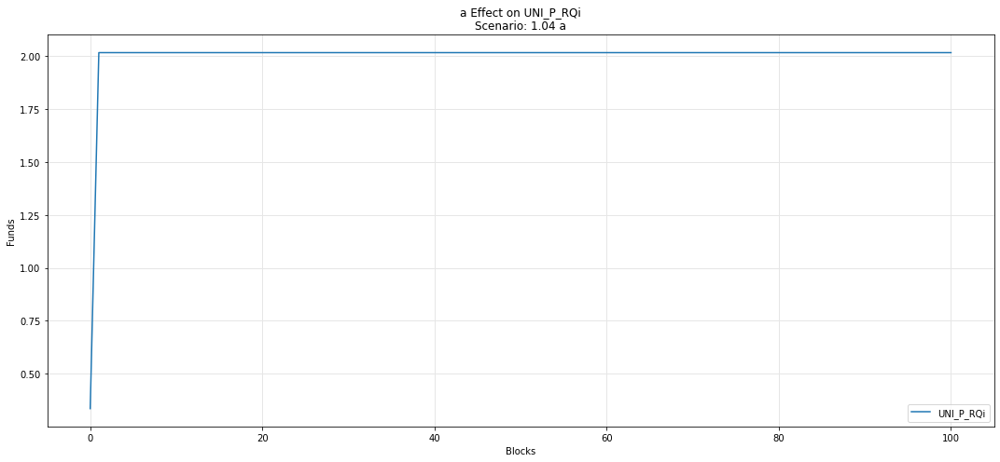

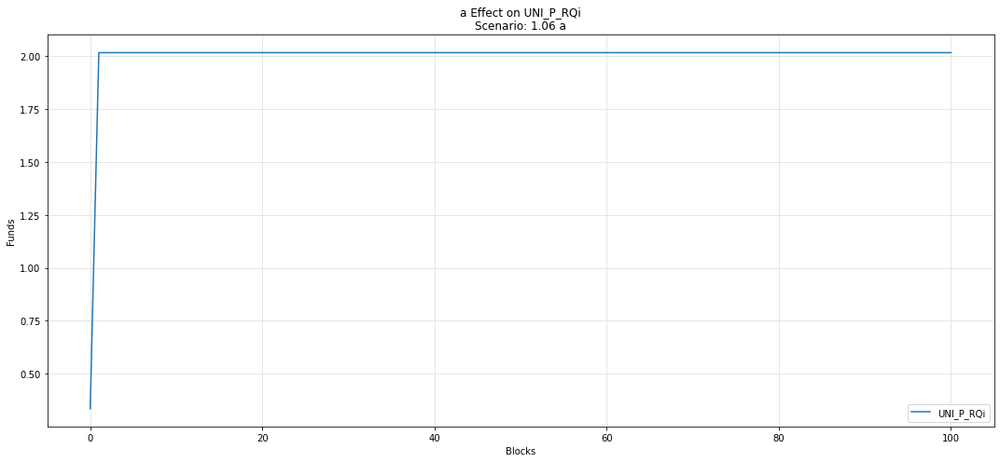

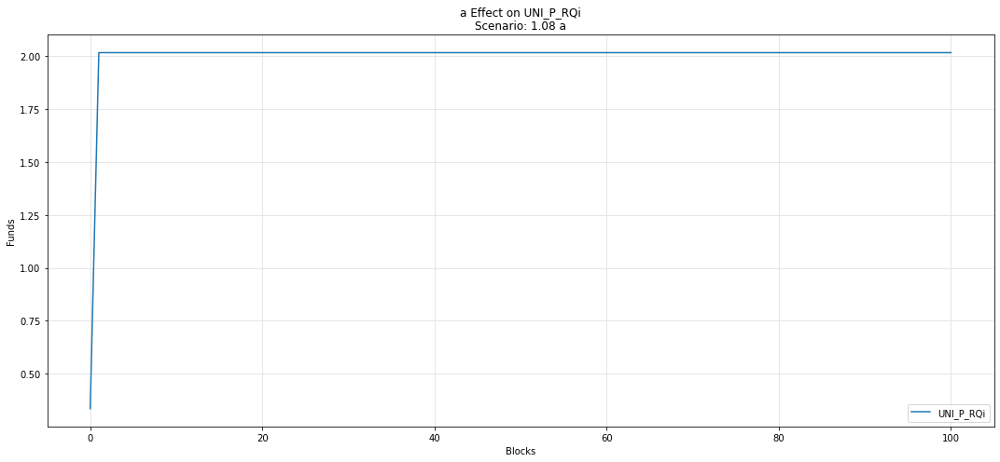

In [67]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQi')

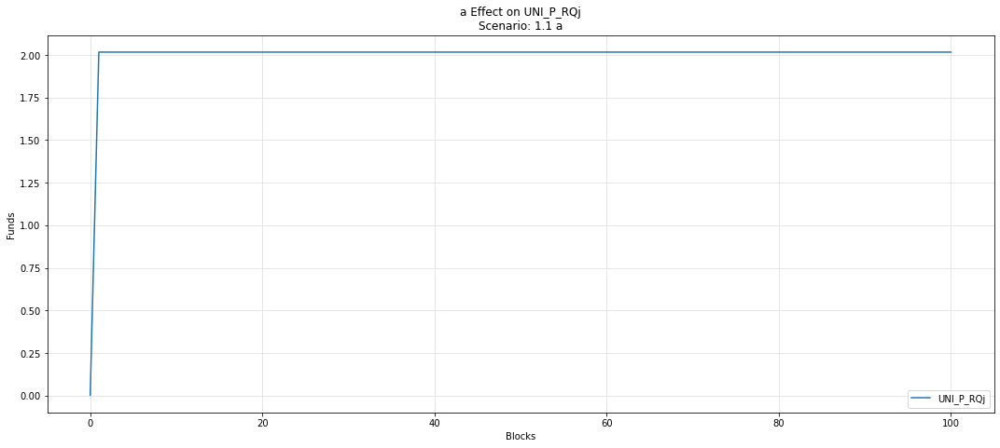

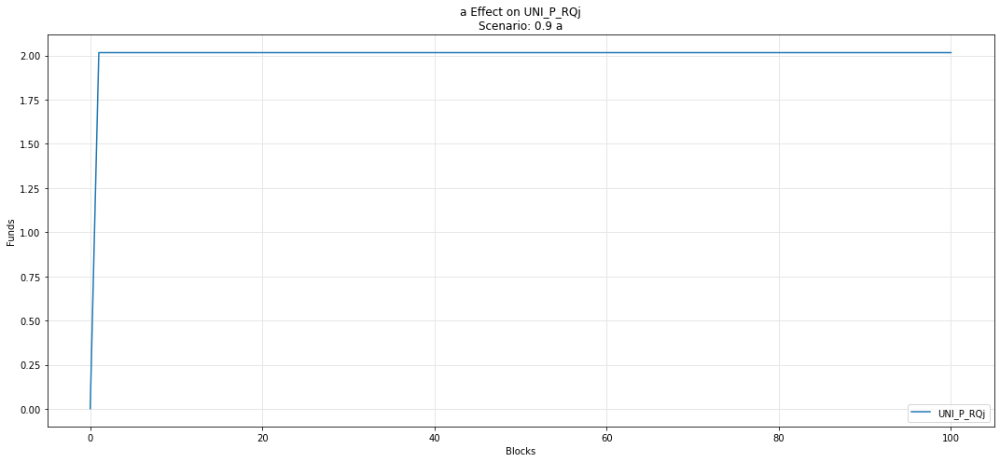

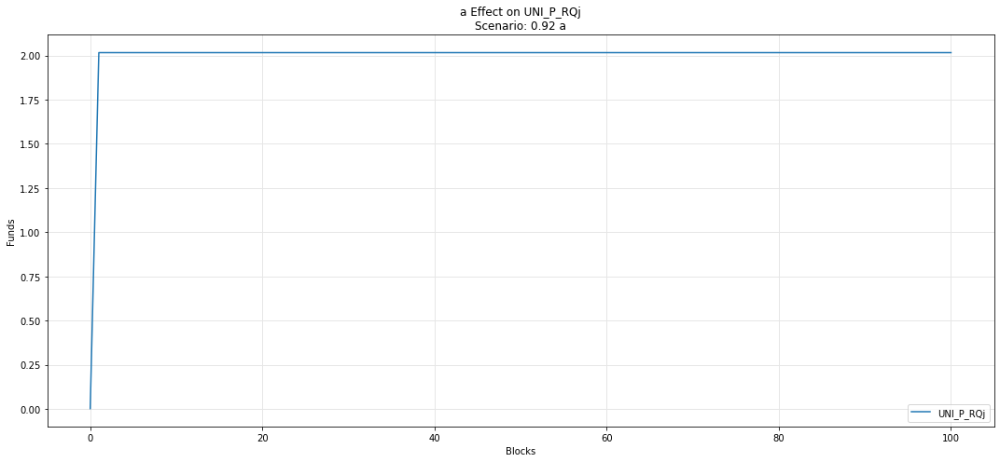

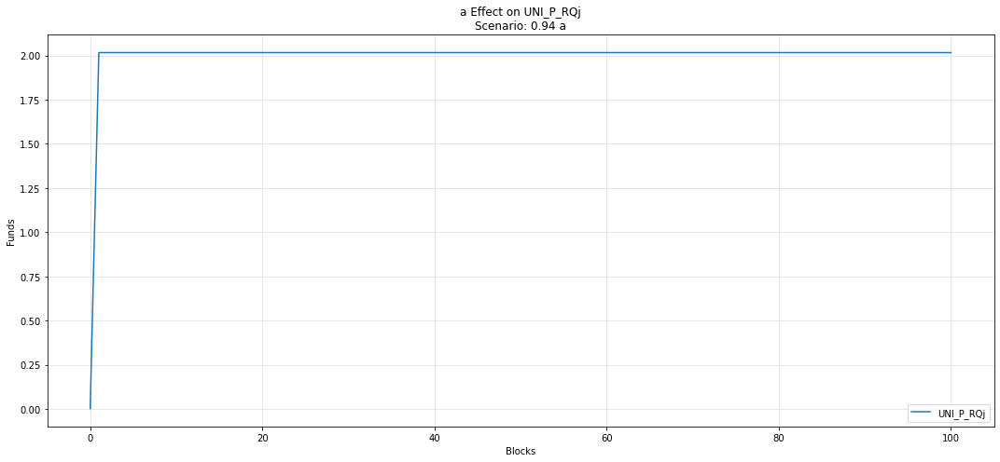

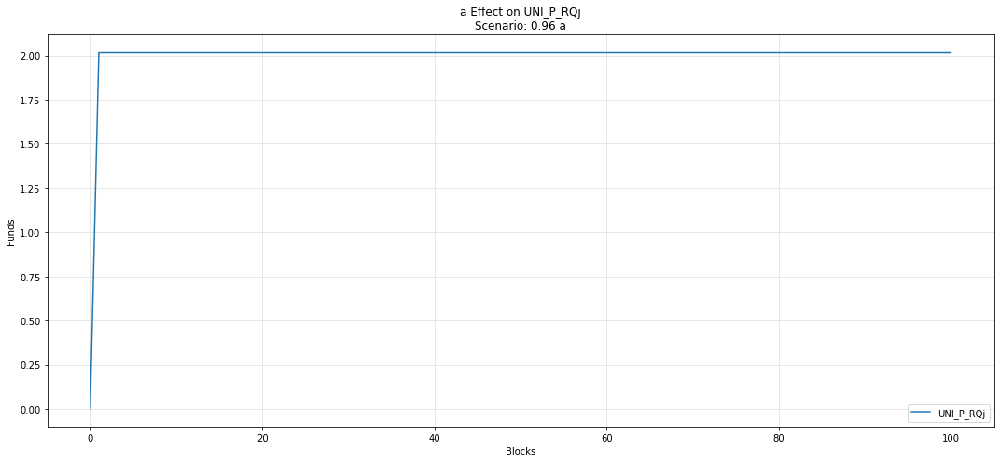

...

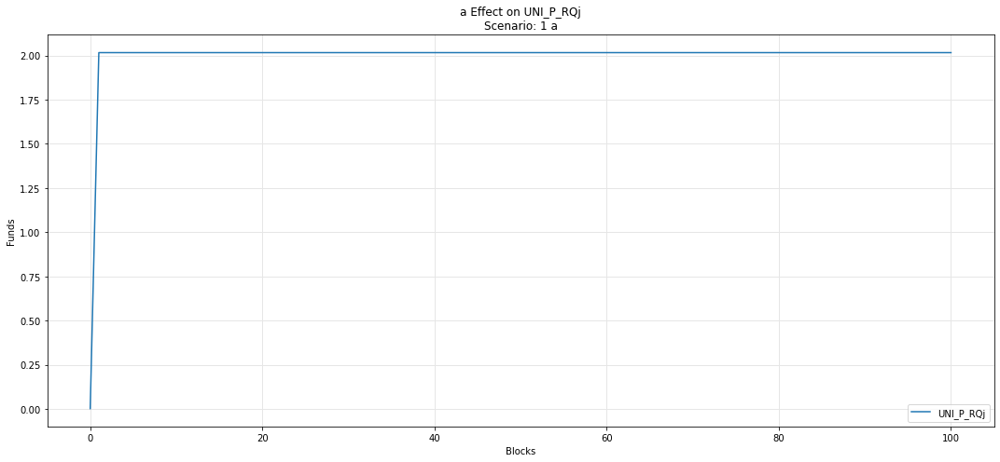

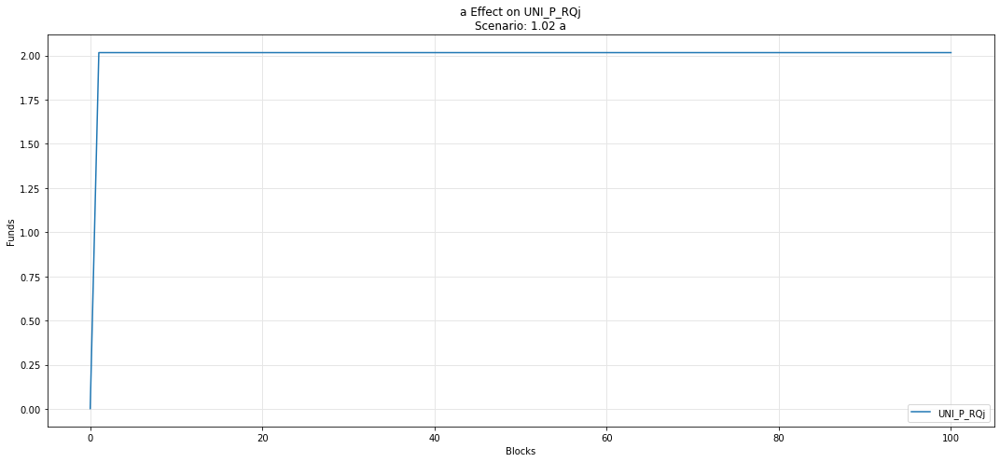

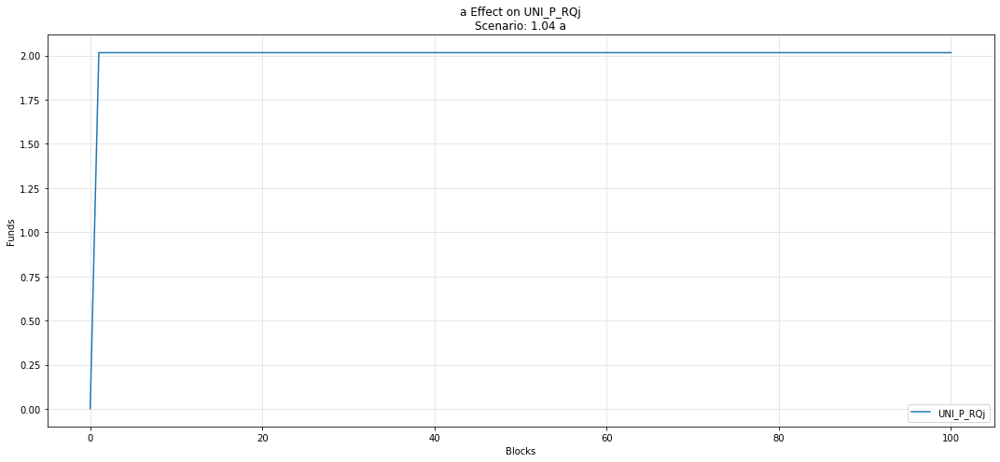

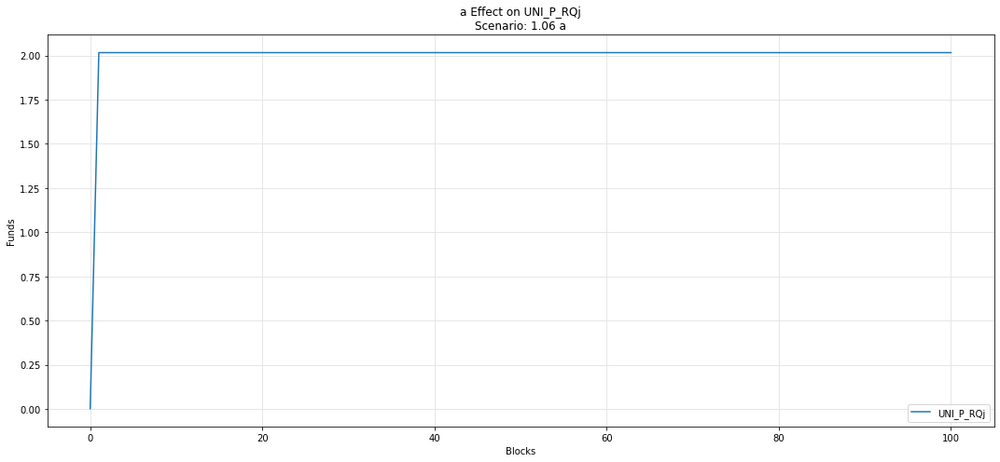

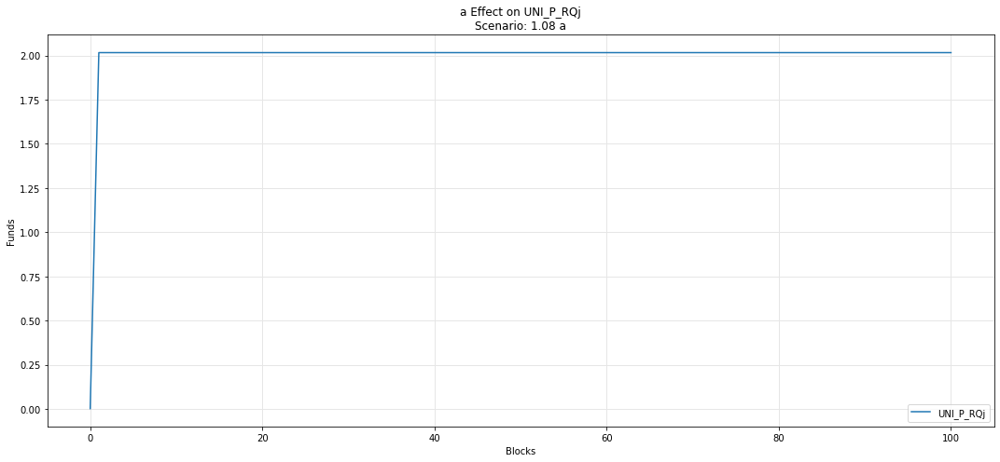

In [68]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQj')

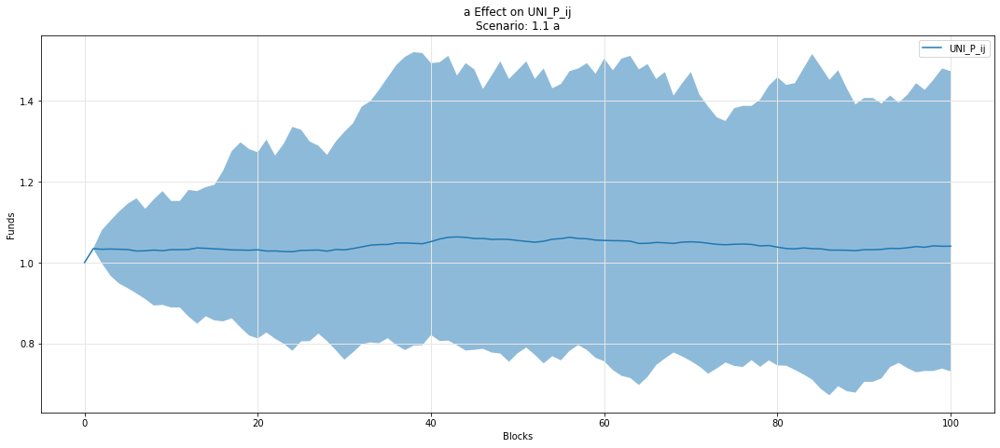

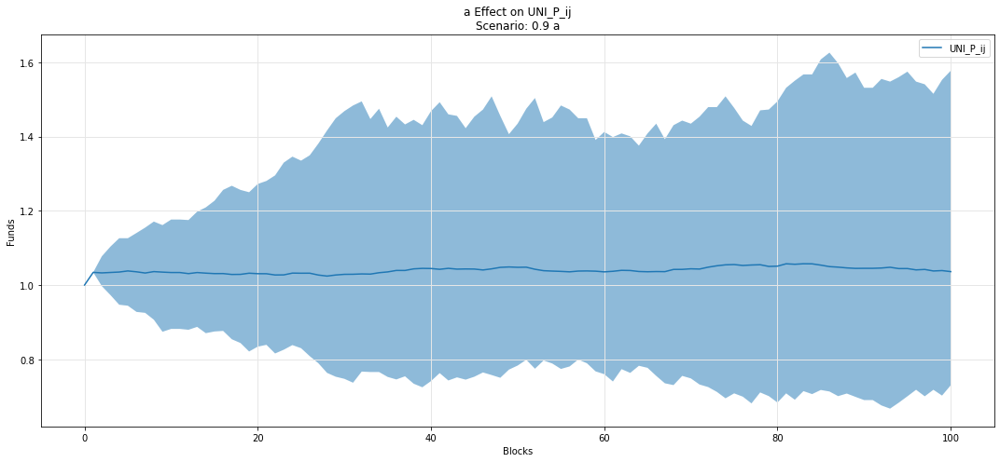

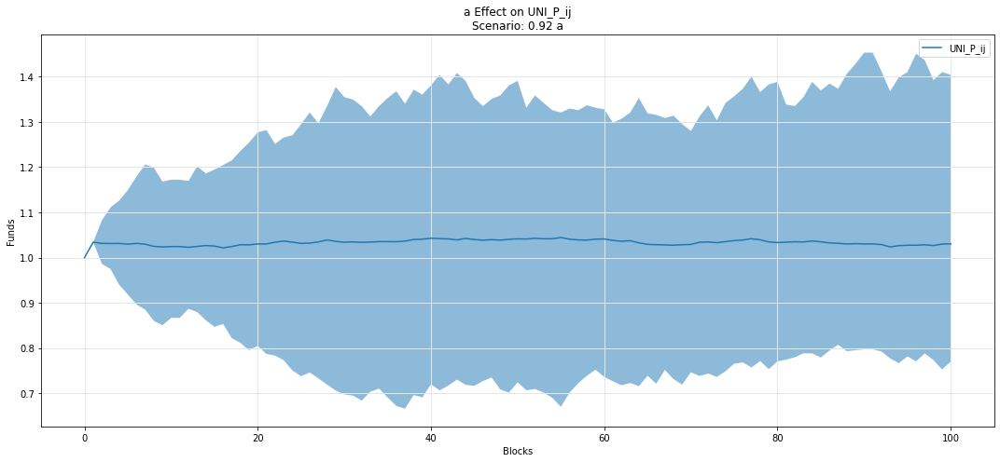

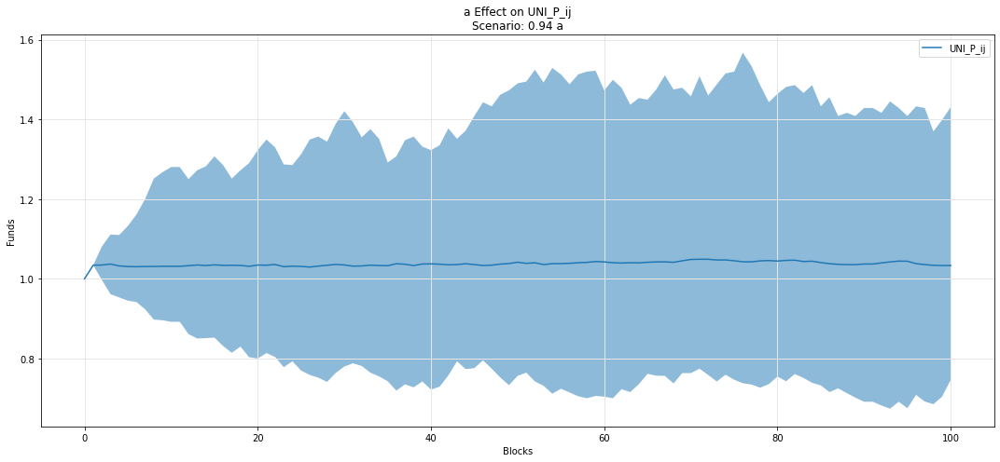

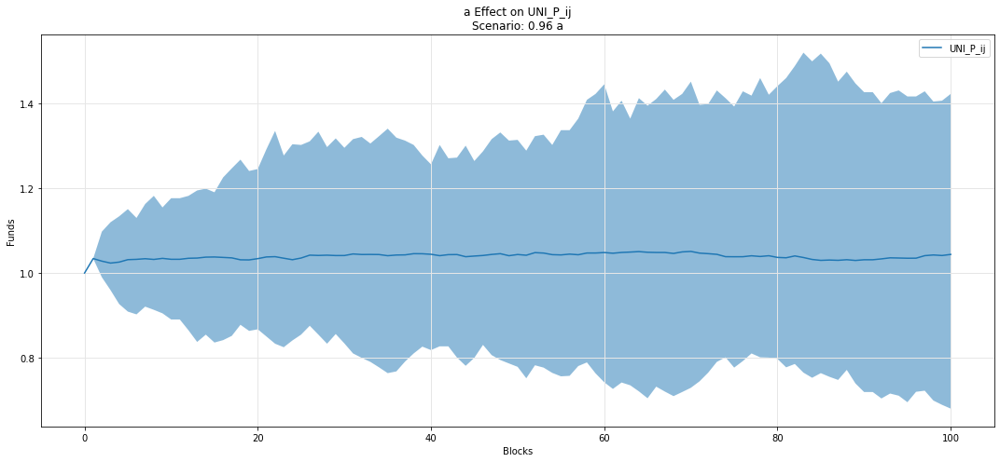

...

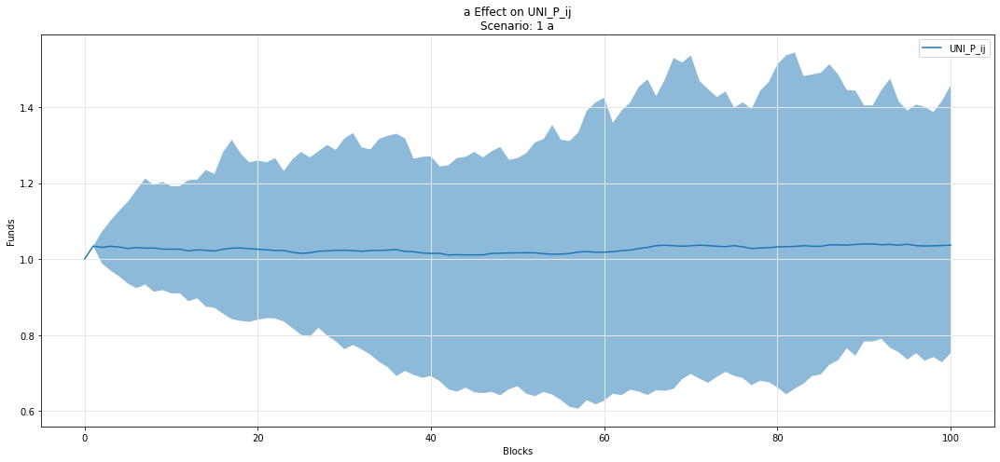

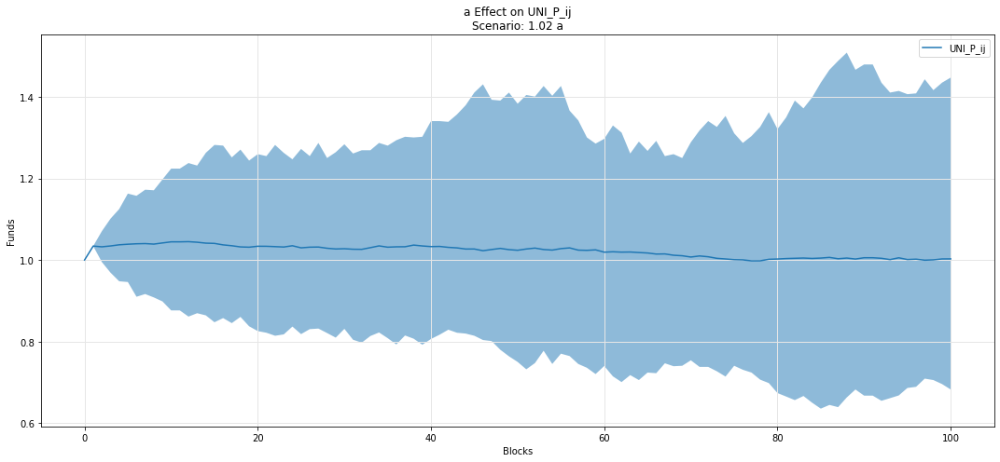

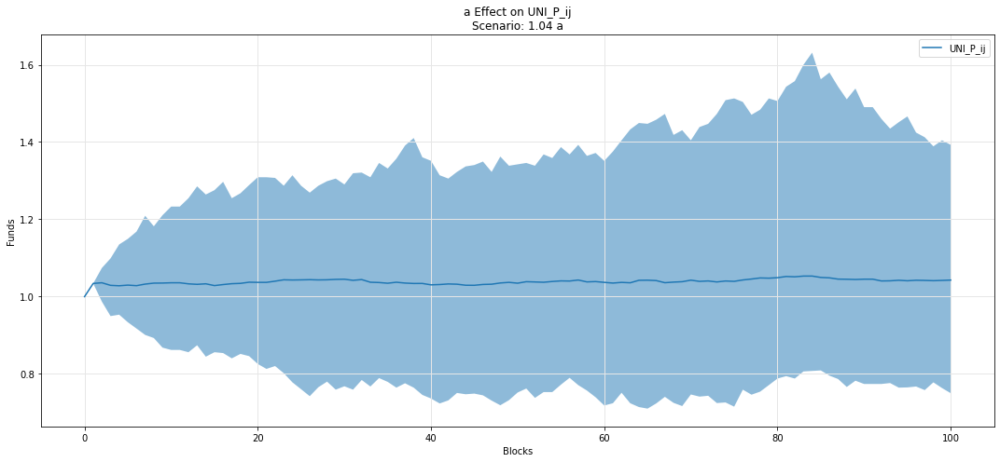

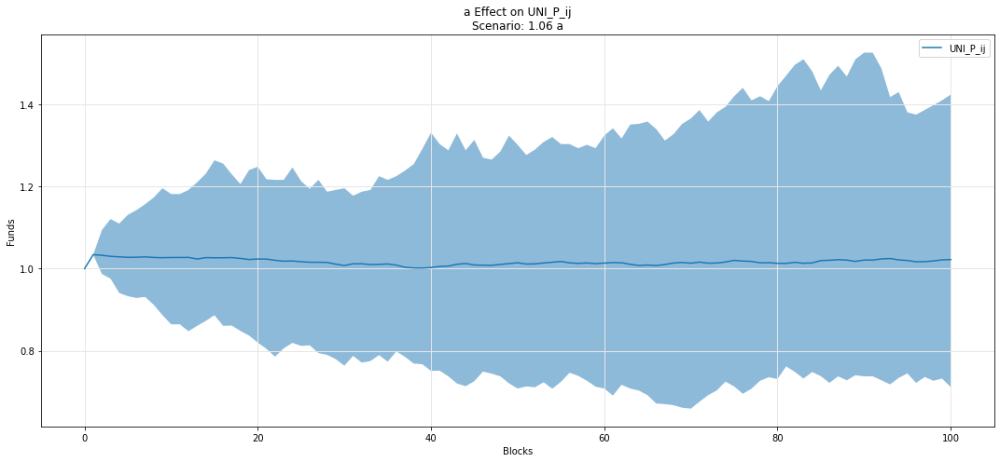

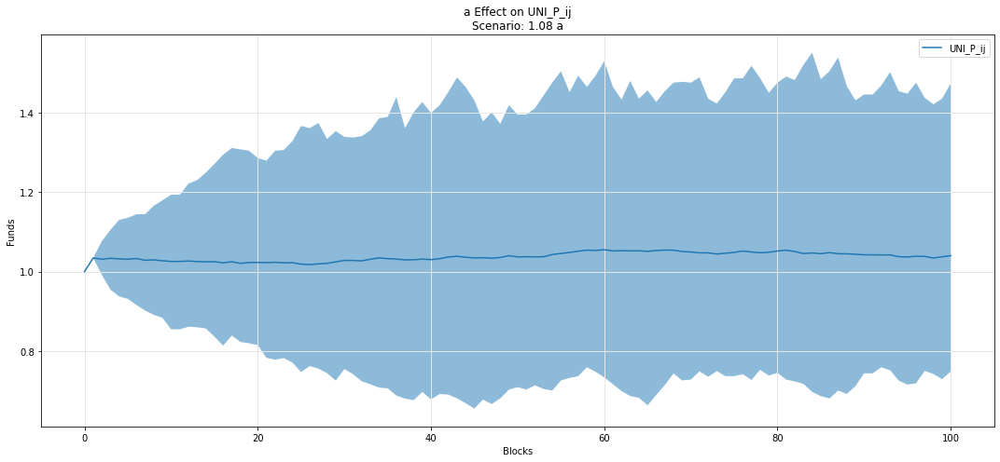

In [69]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_ij')

## Omnipool

## Asset i

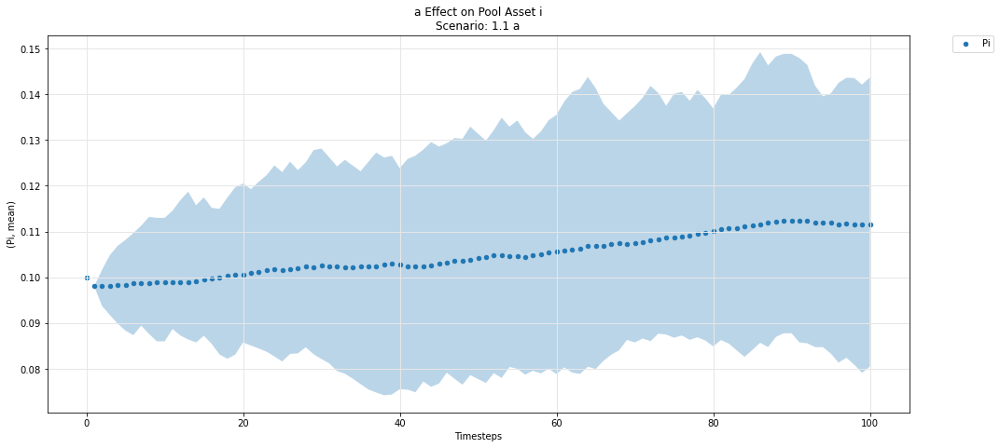

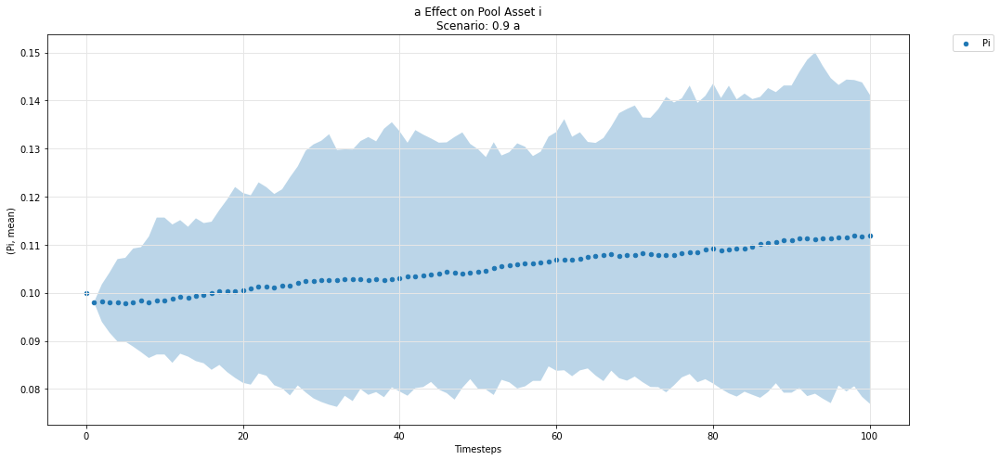

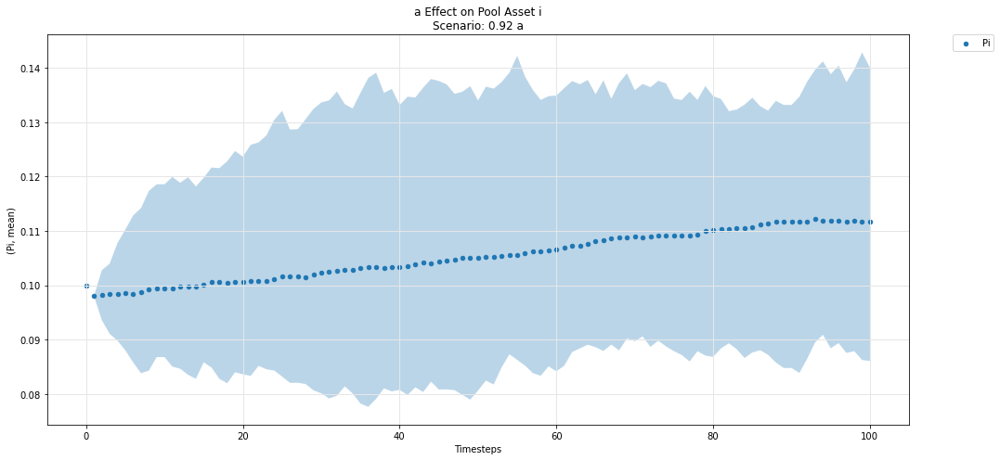

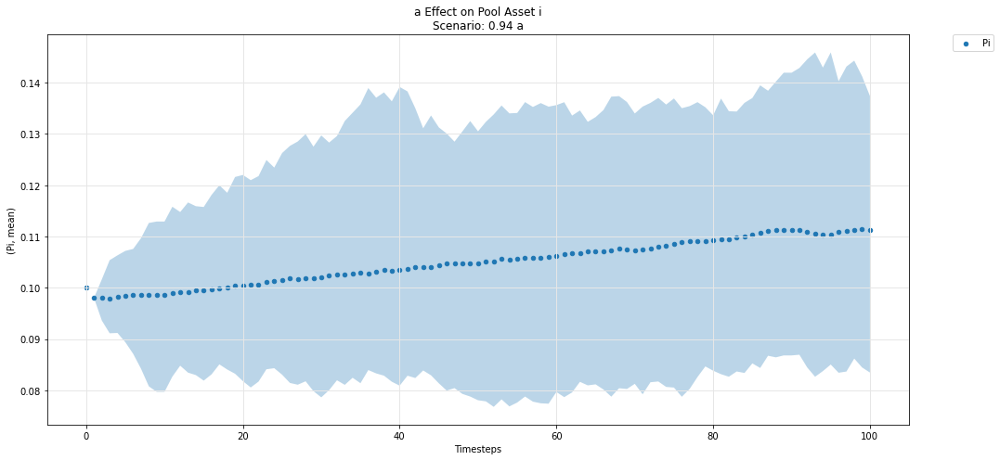

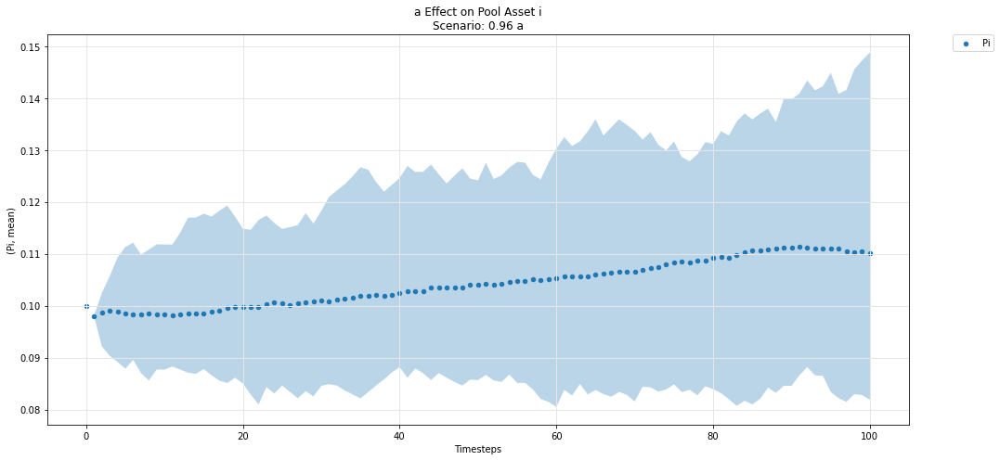

...

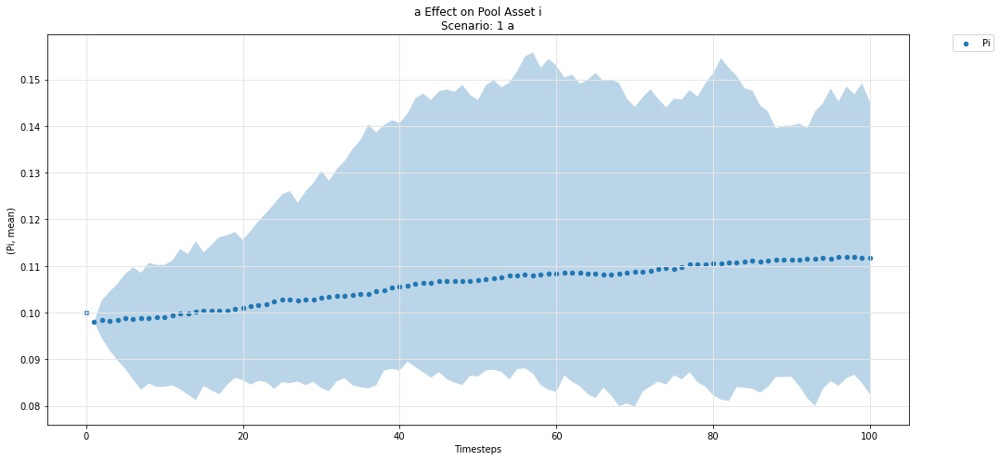

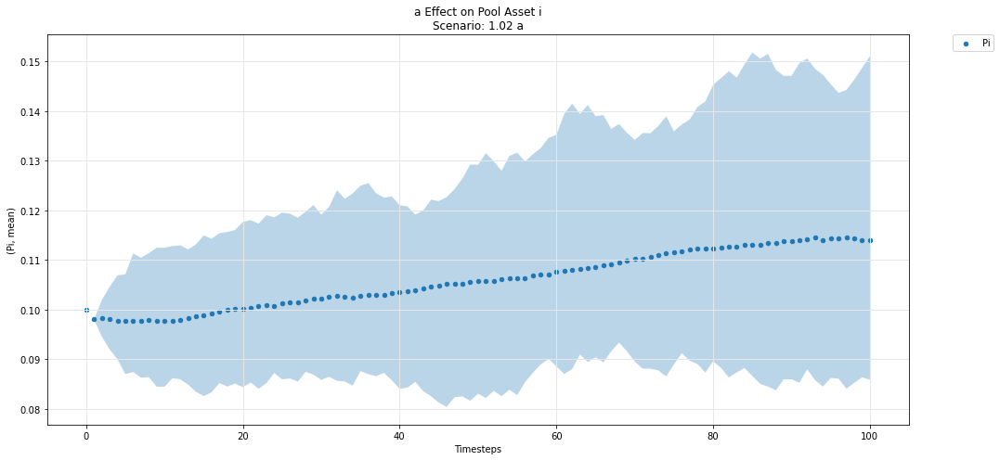

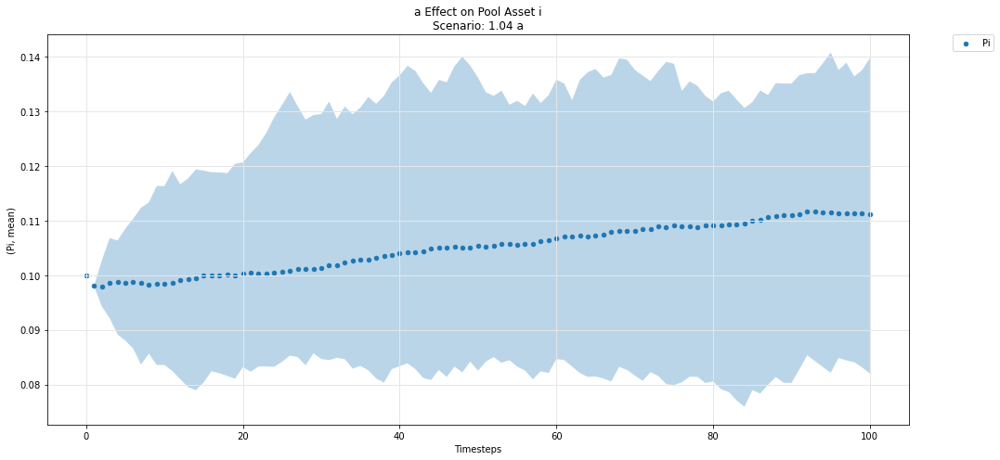

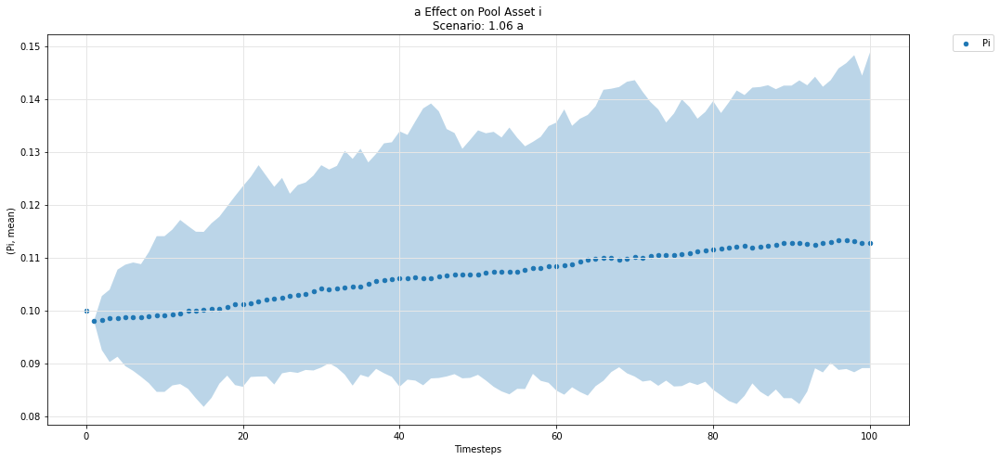

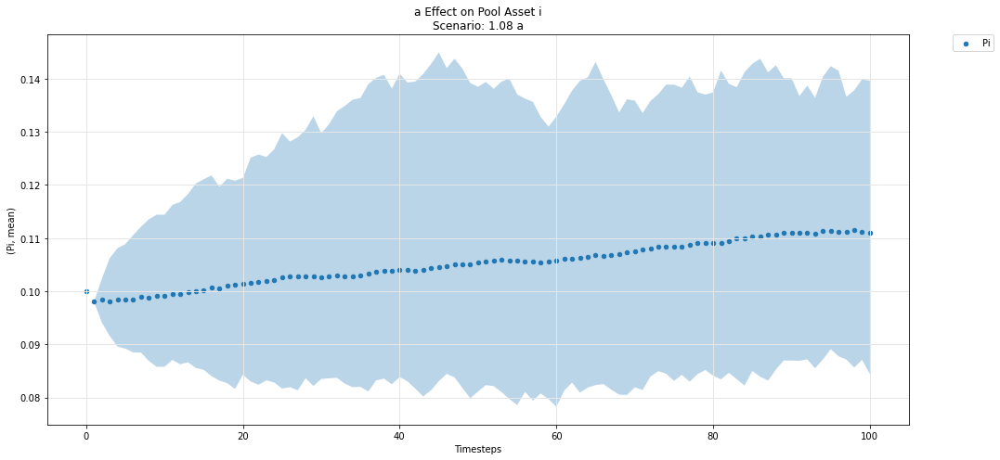

In [70]:
param_pool_simulation_plot(experiments, config_ids, 'a','i','P')

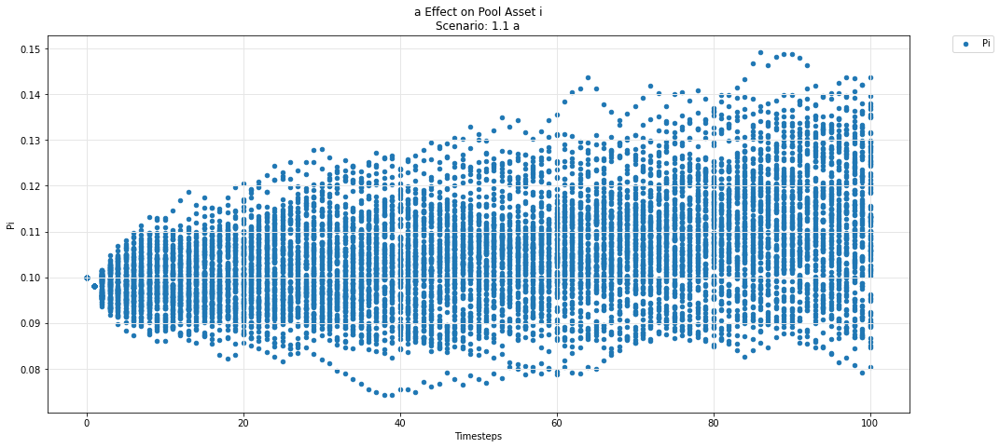

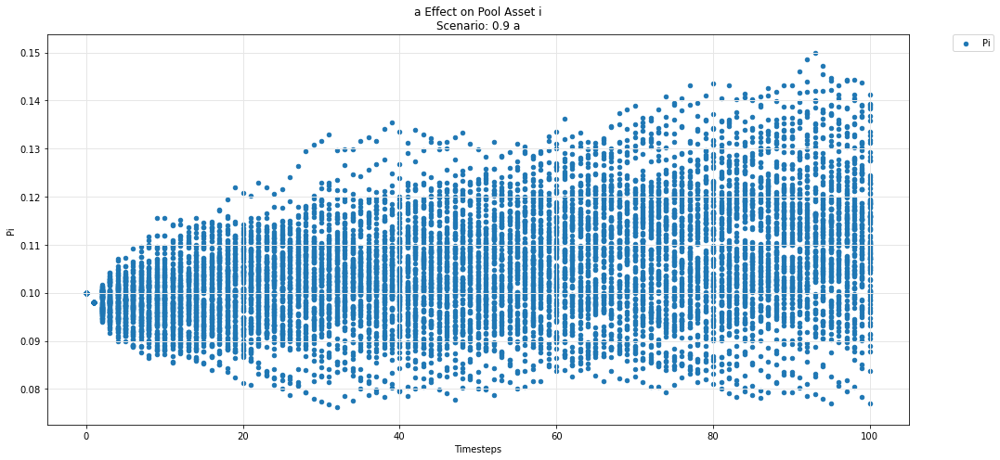

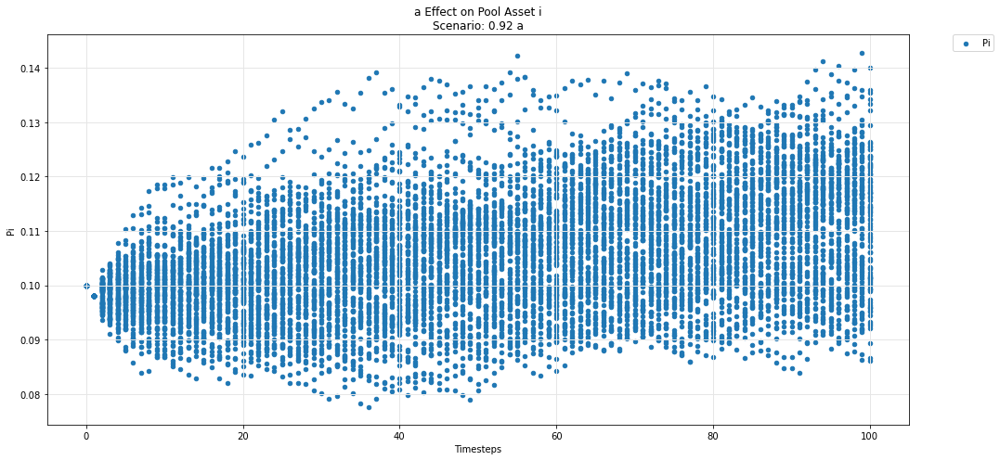

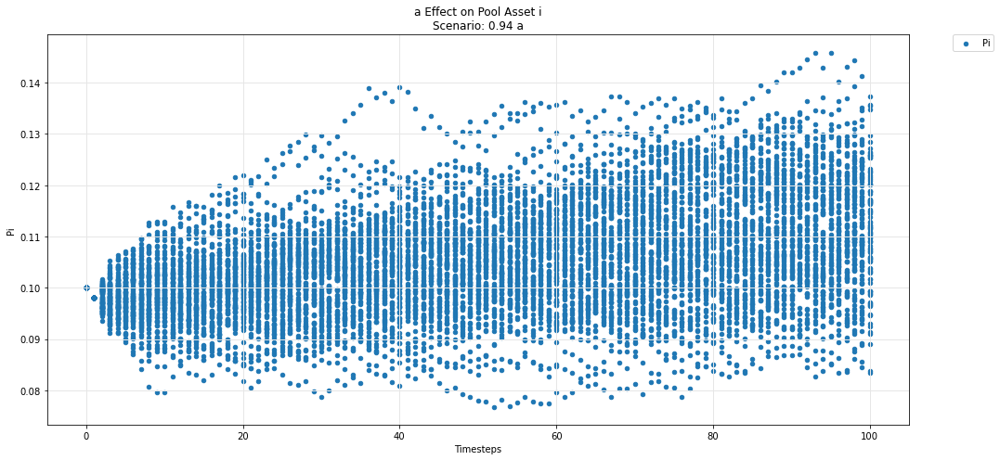

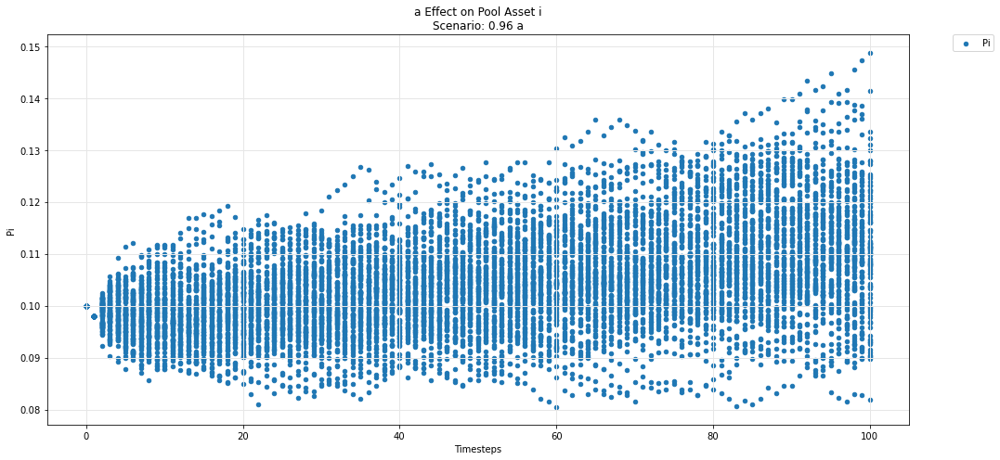

...

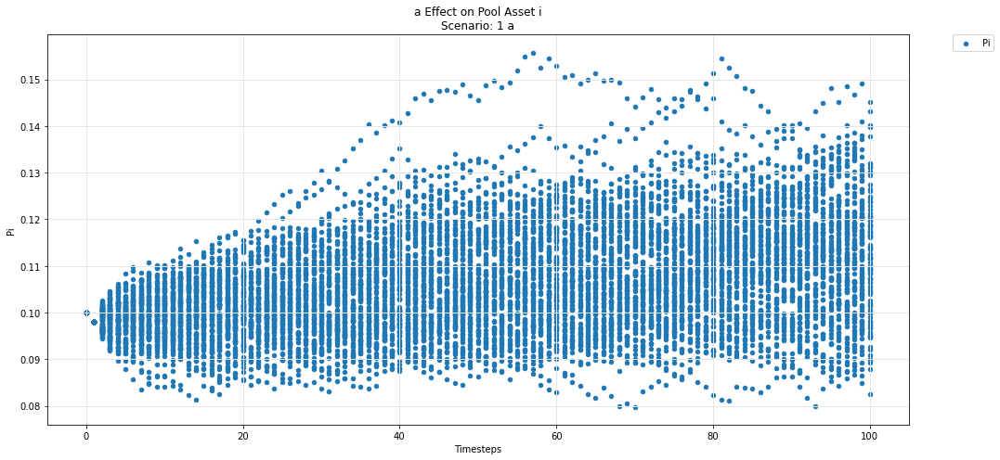

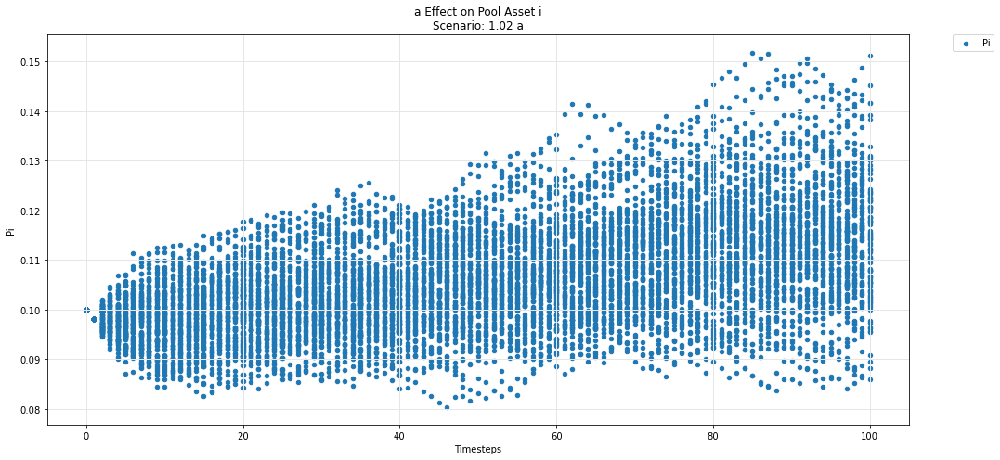

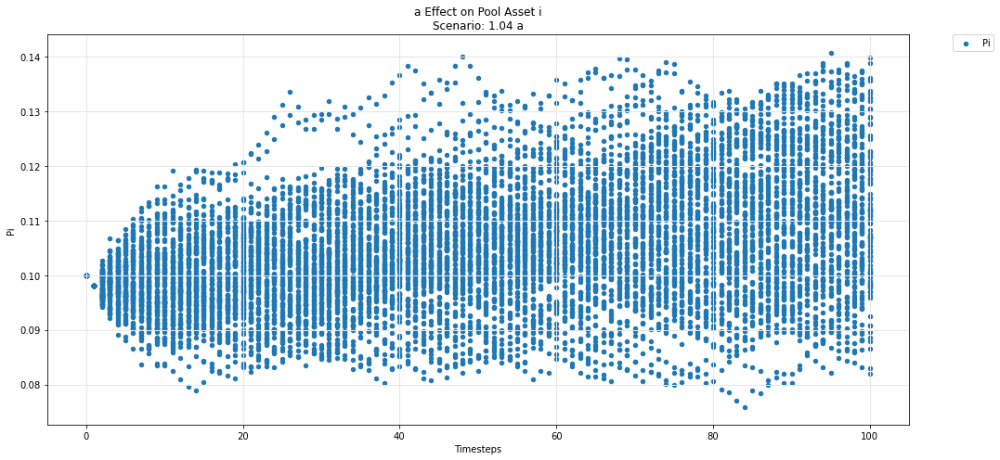

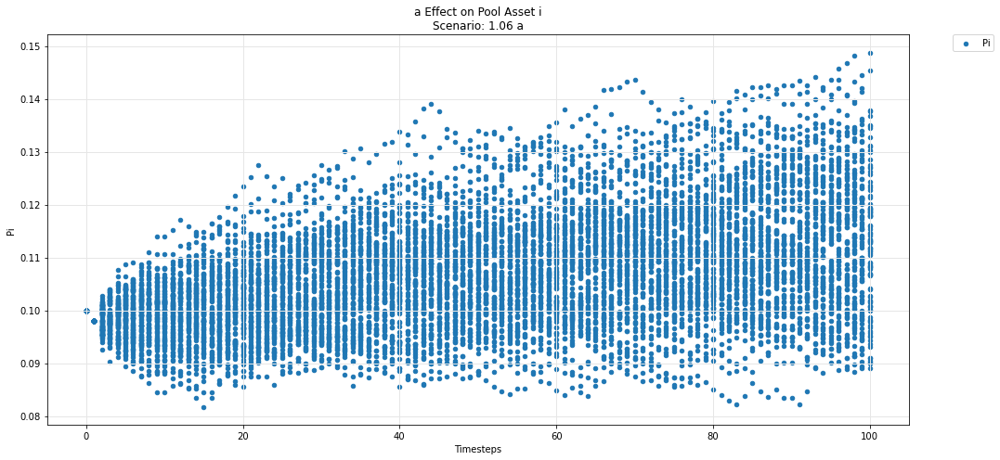

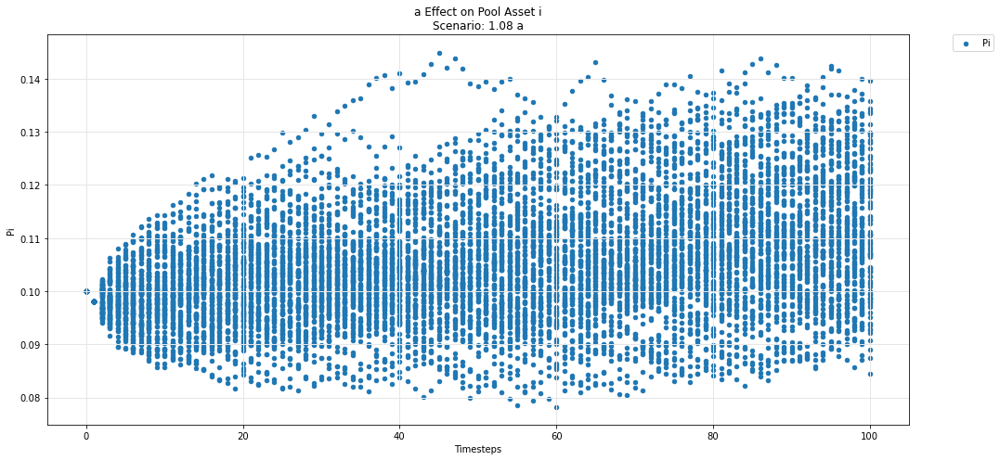

In [71]:
param_pool_plot(experiments, config_ids, 'a','i','P')

## Asset j

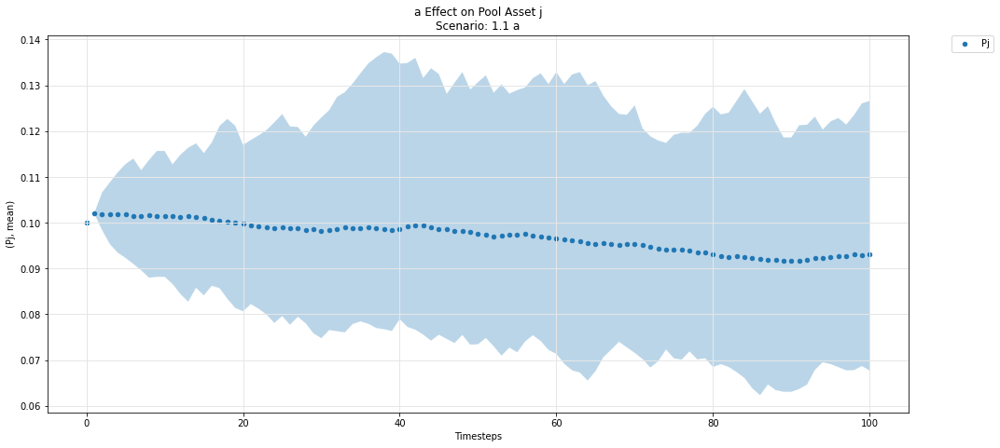

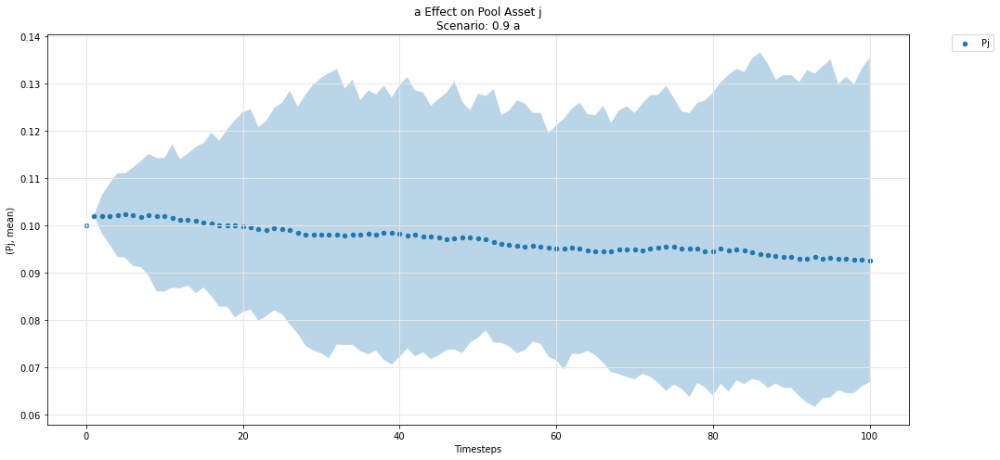

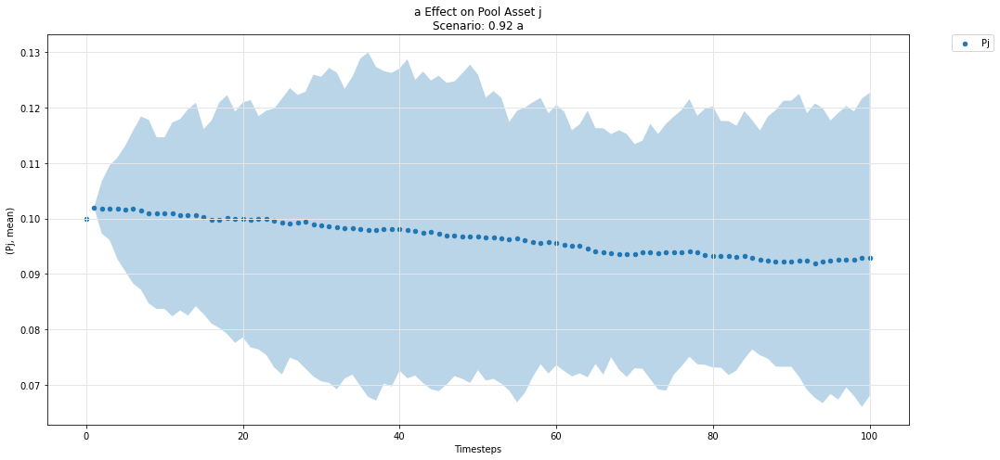

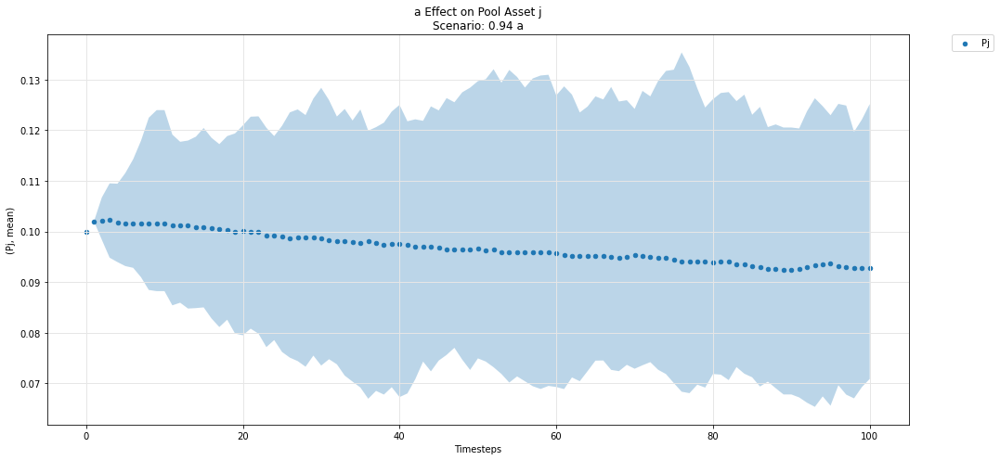

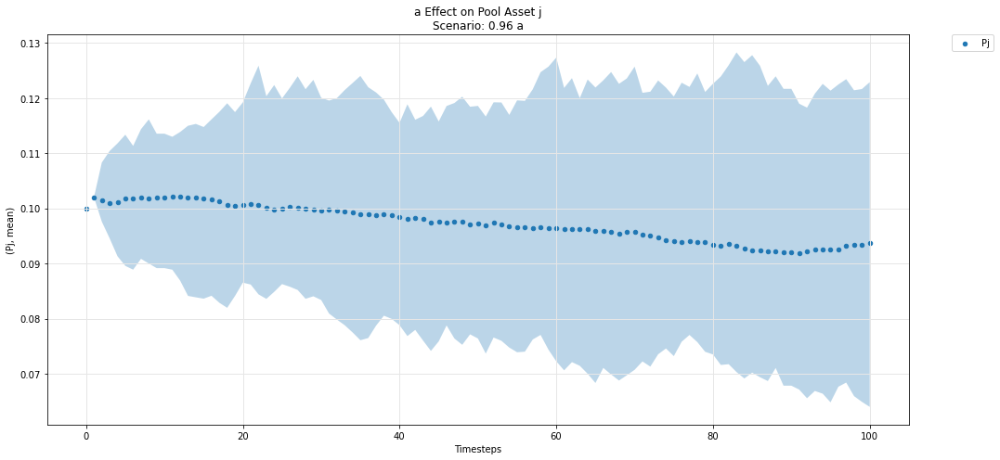

...

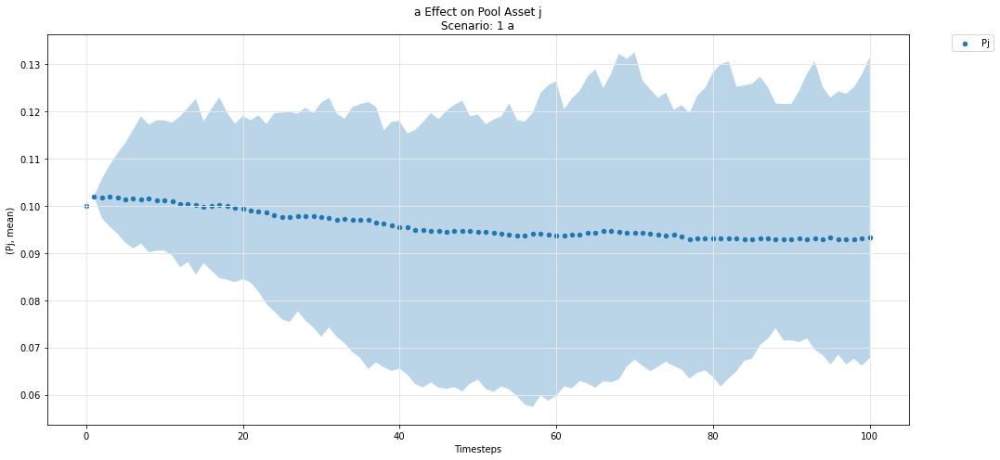

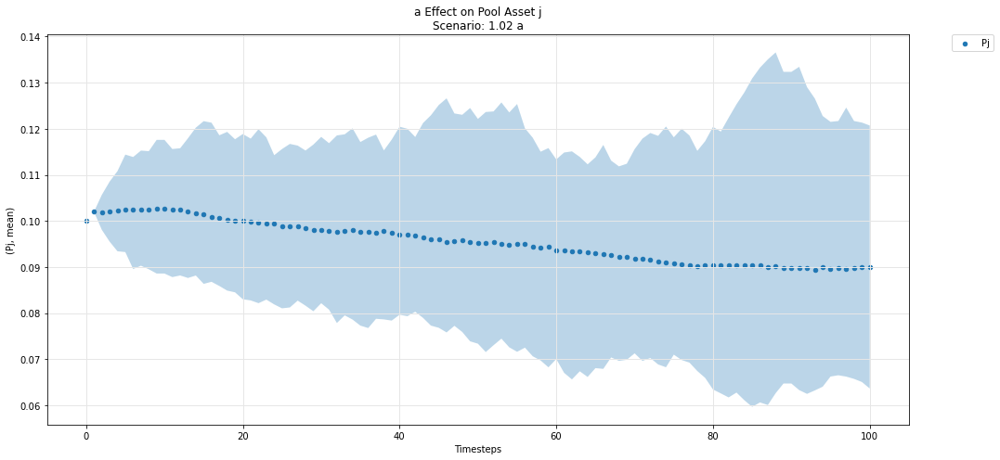

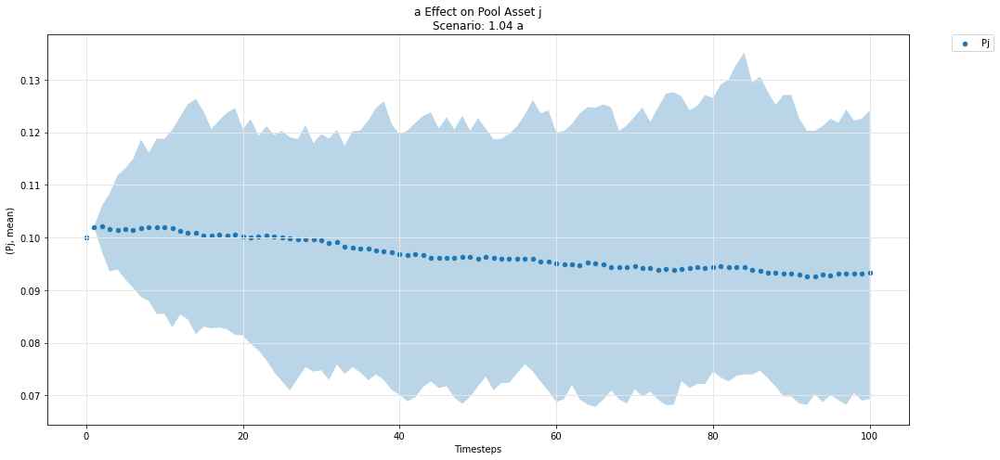

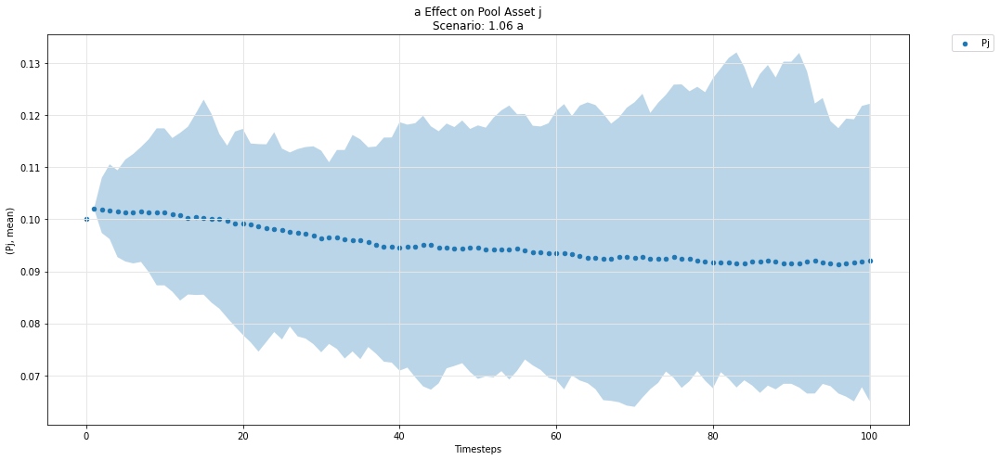

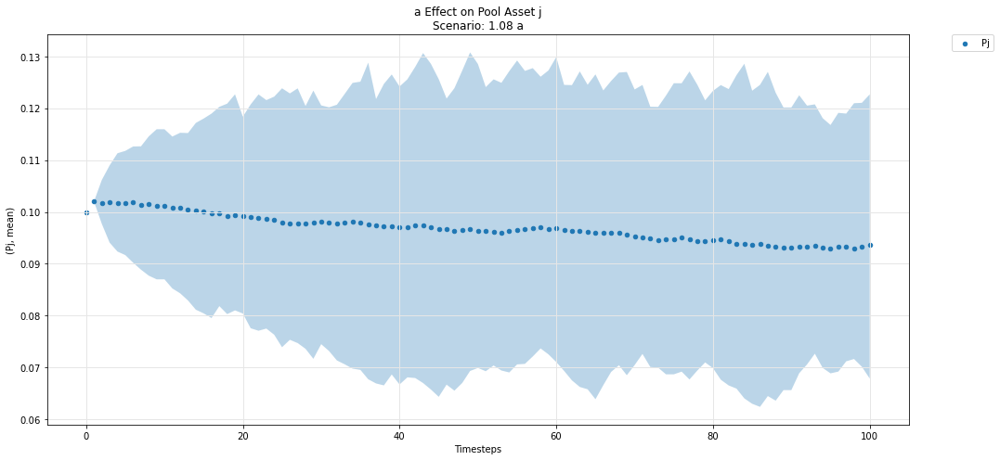

In [72]:
param_pool_simulation_plot(experiments, config_ids, 'a','j','P')

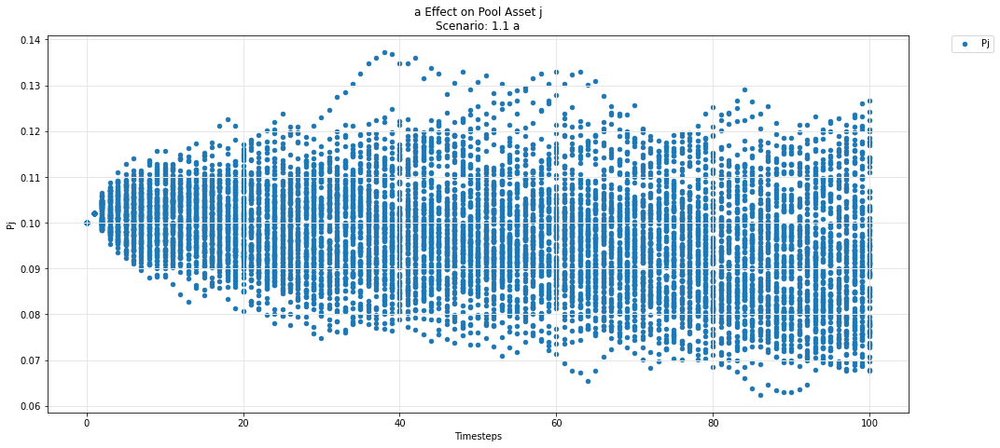

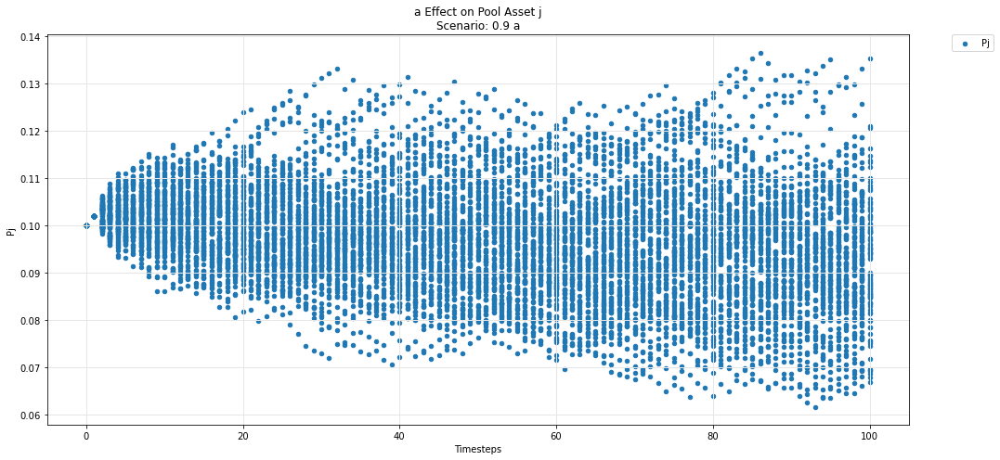

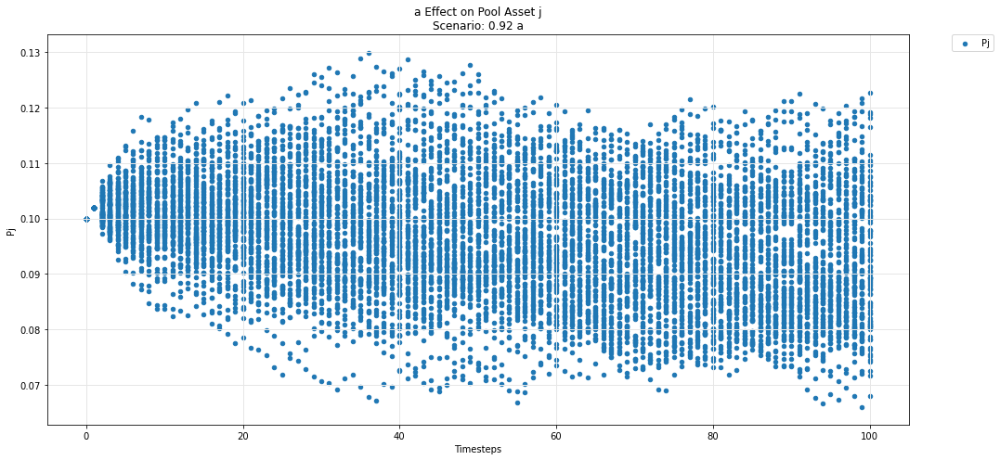

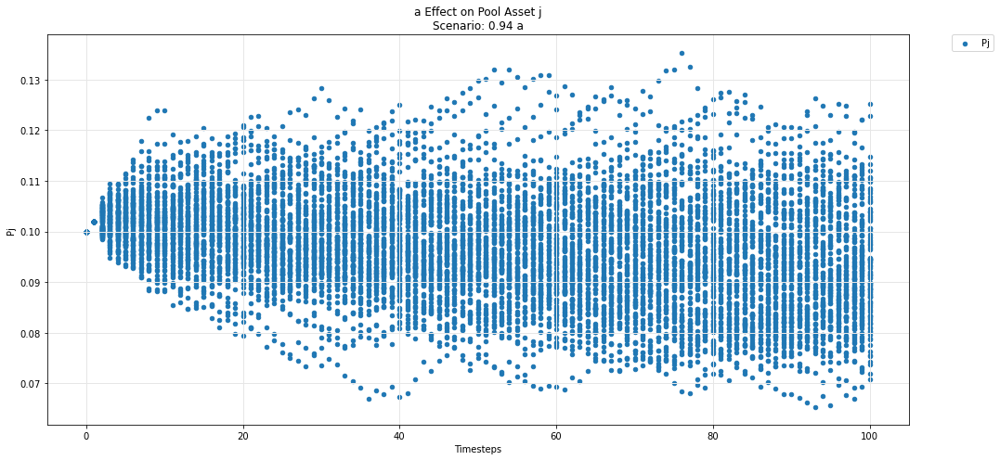

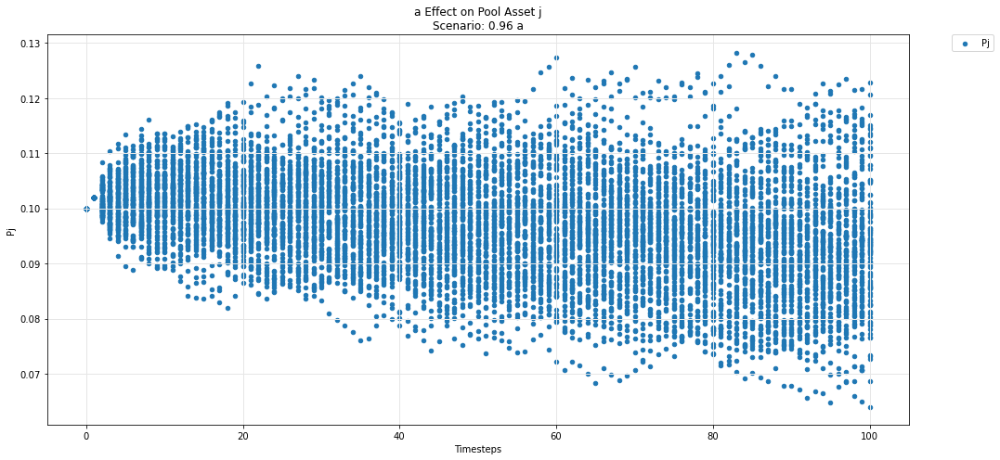

...

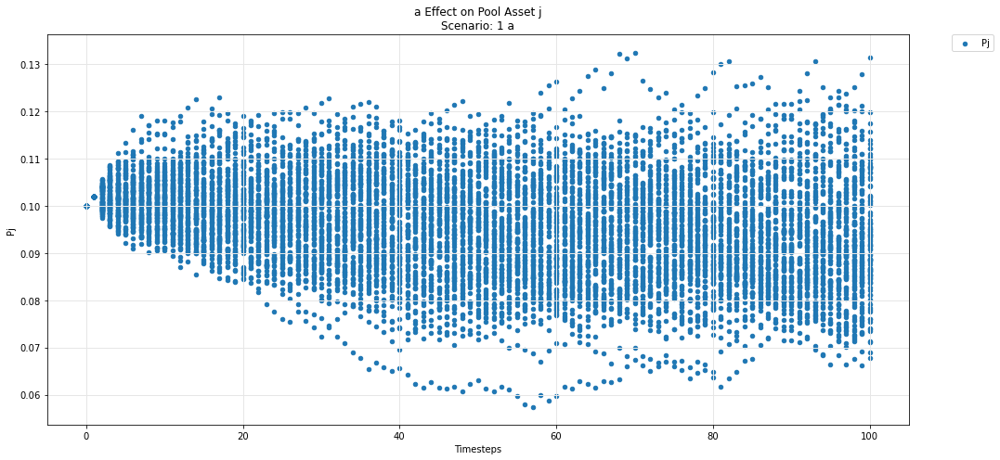

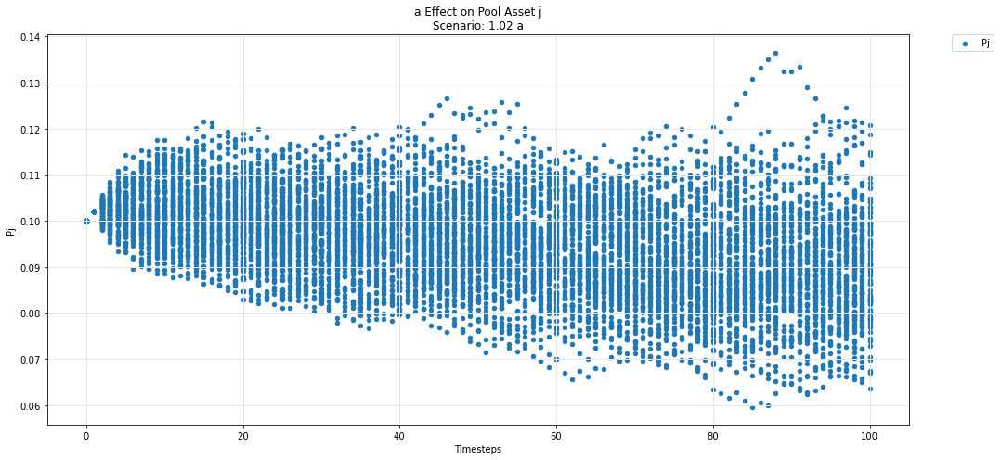

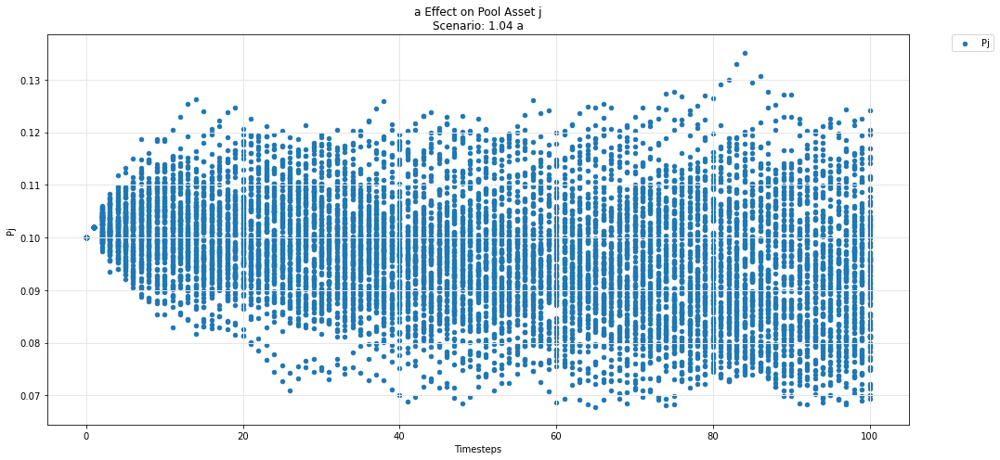

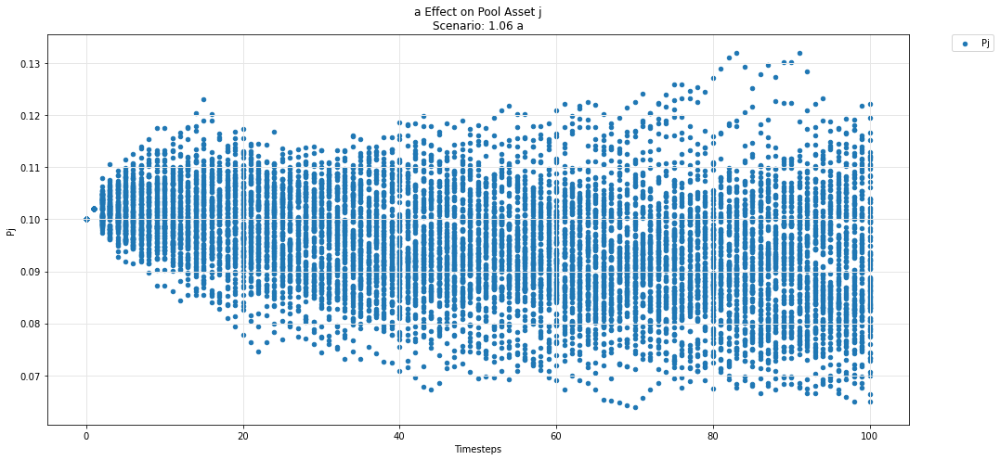

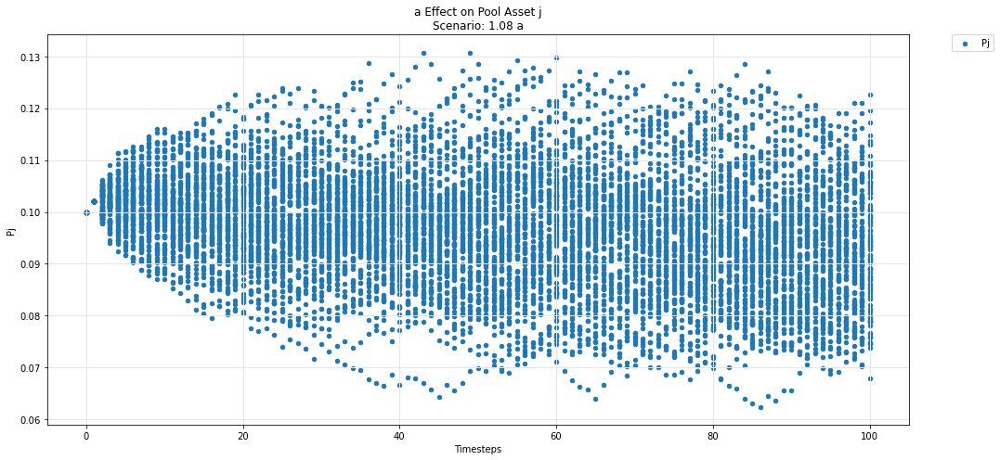

In [73]:
param_pool_plot(experiments, config_ids, 'a','j','P')

## Asset k

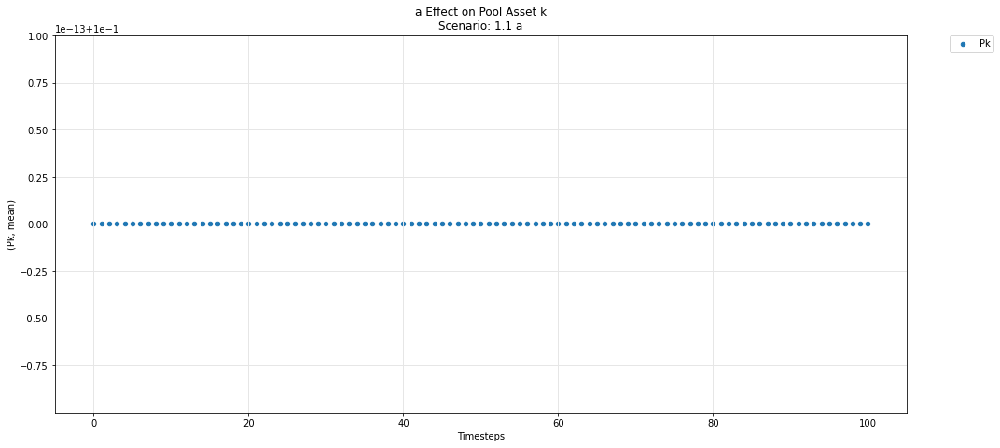

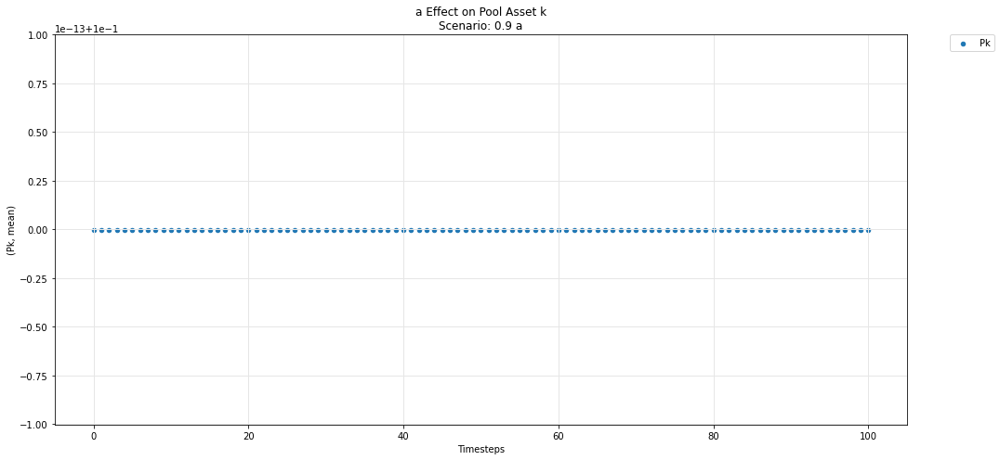

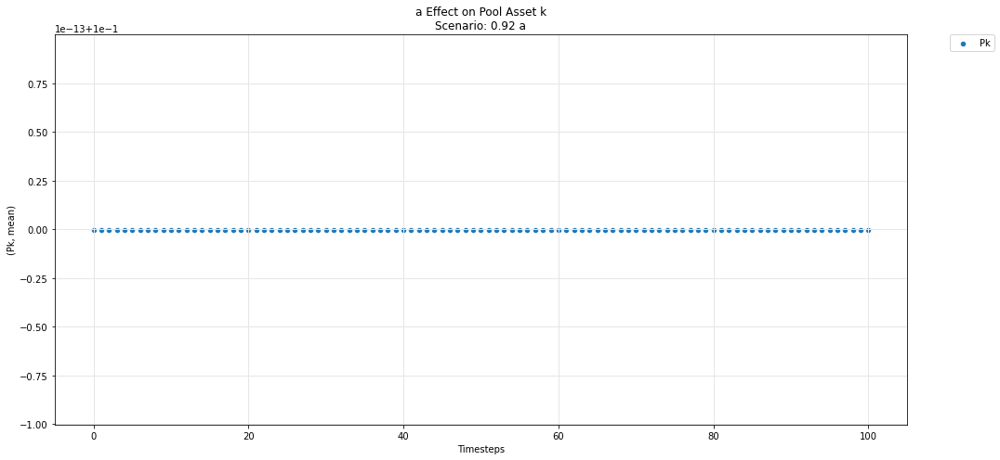

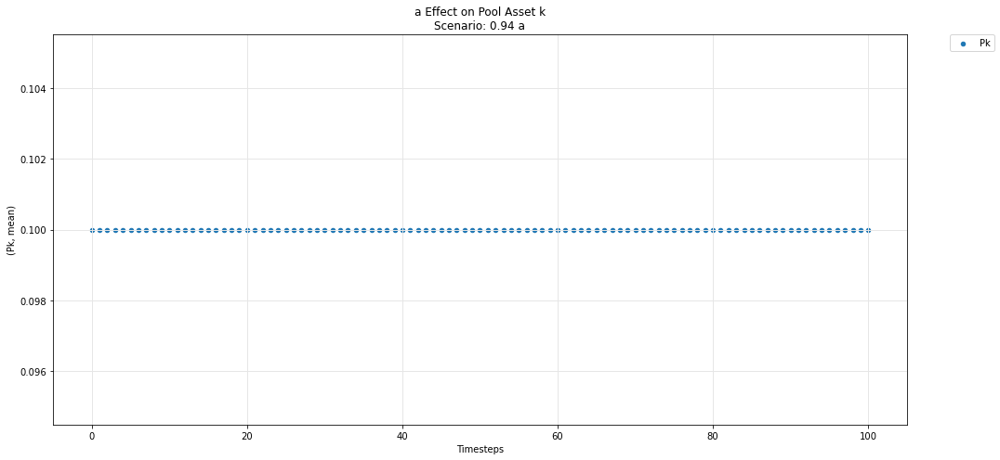

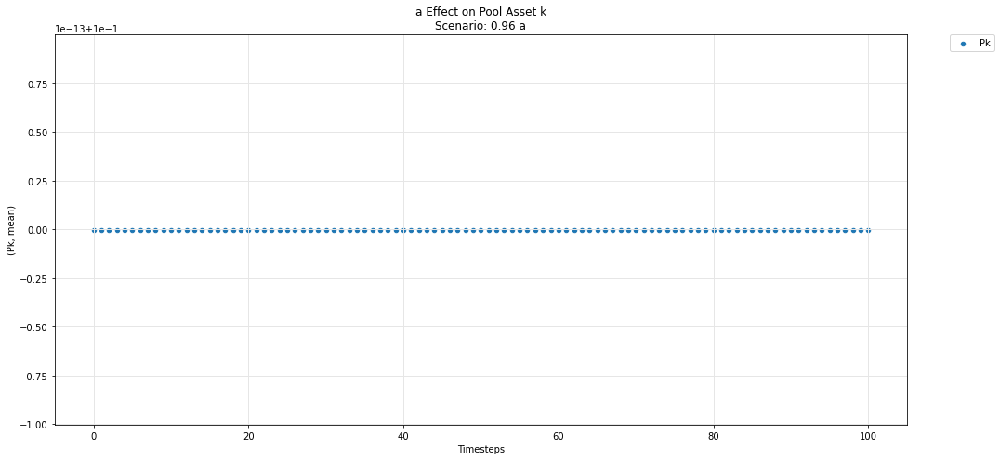

...

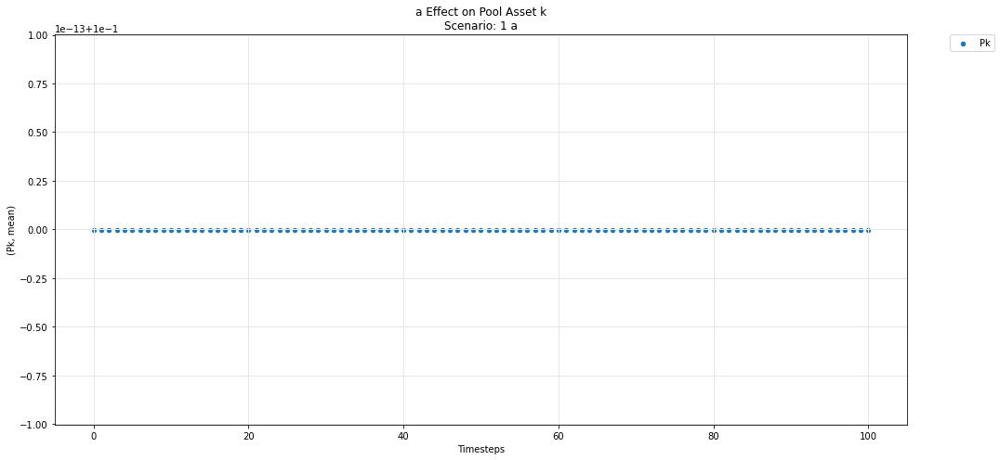

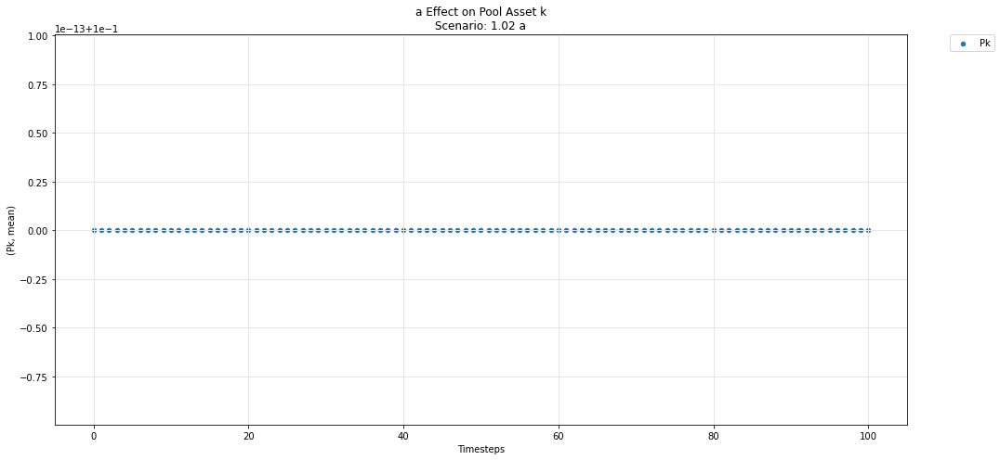

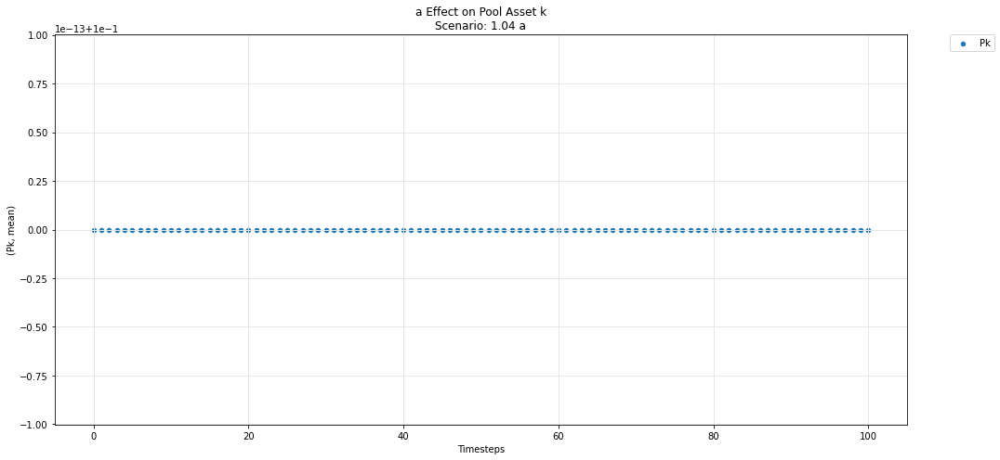

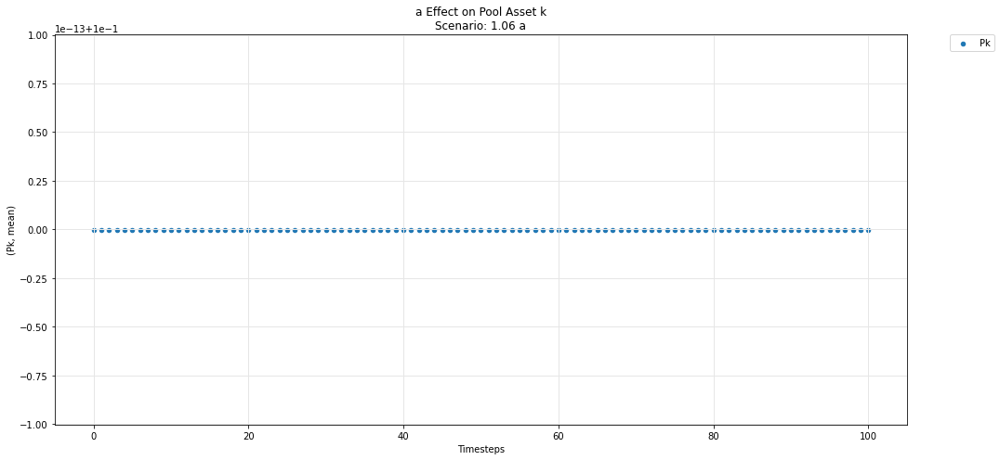

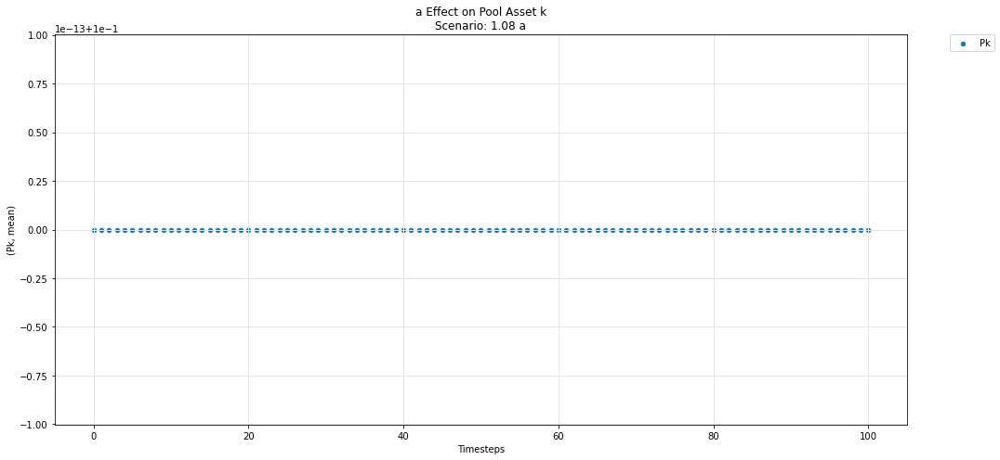

In [74]:
param_pool_simulation_plot(experiments, config_ids, 'a','k','P')

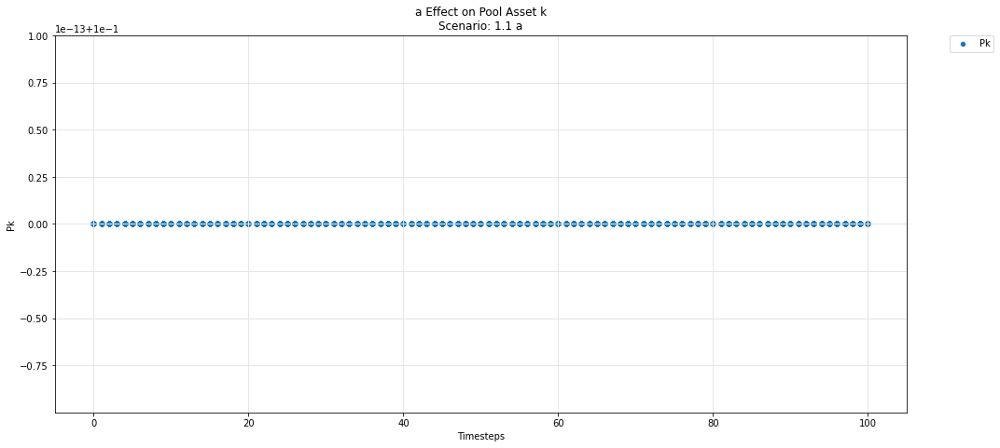

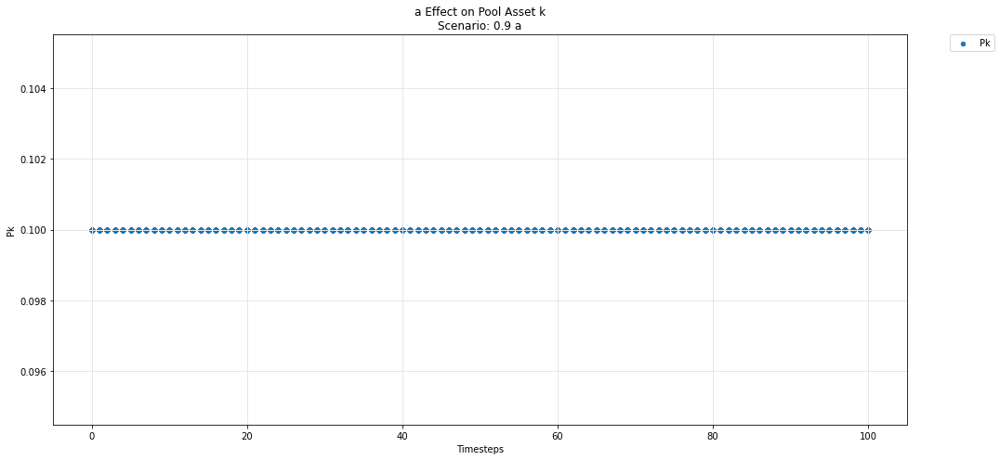

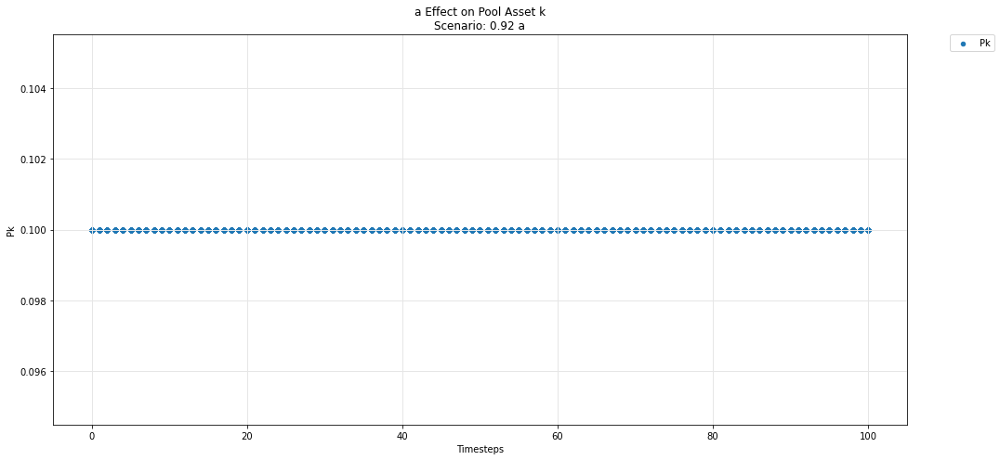

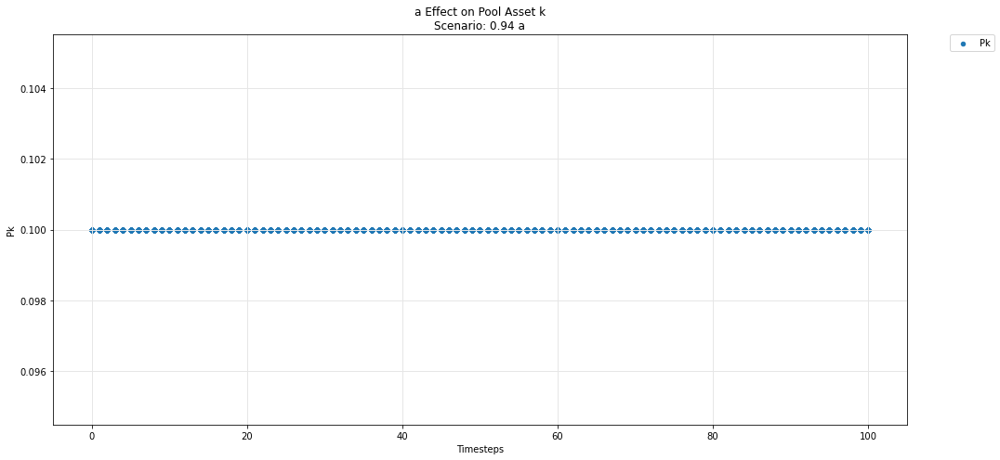

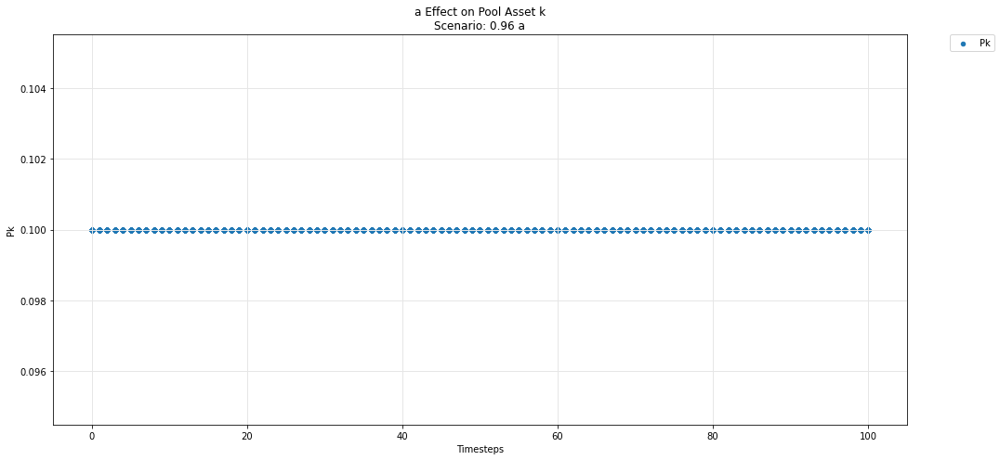

...

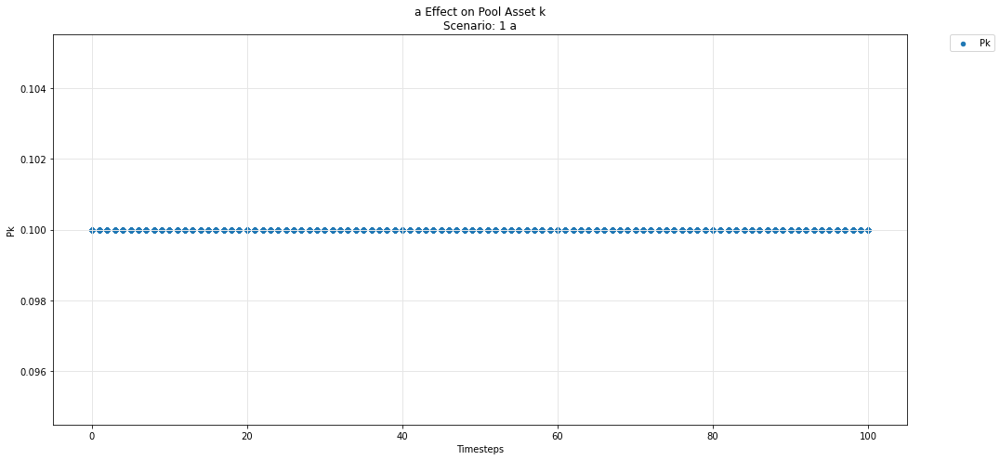

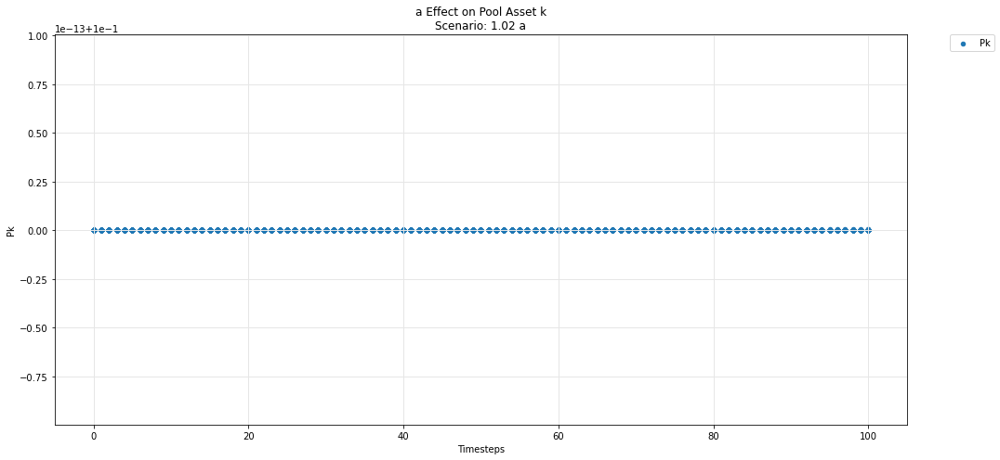

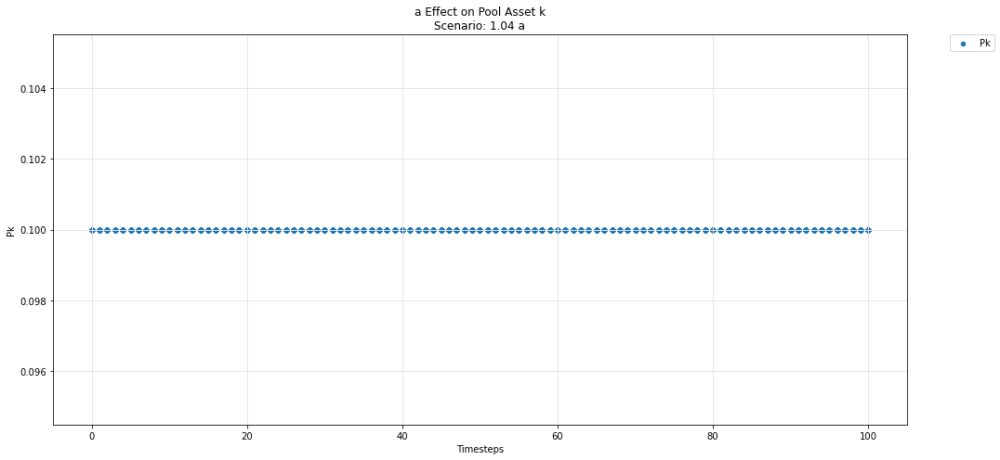

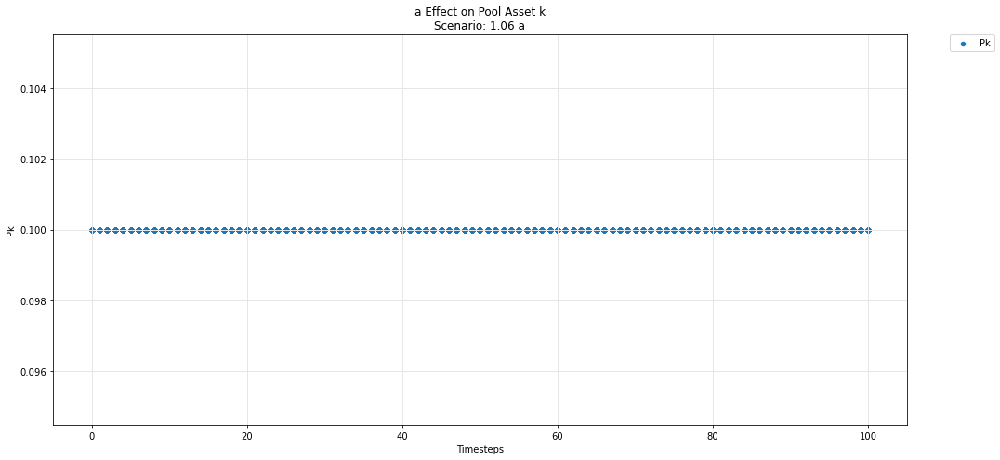

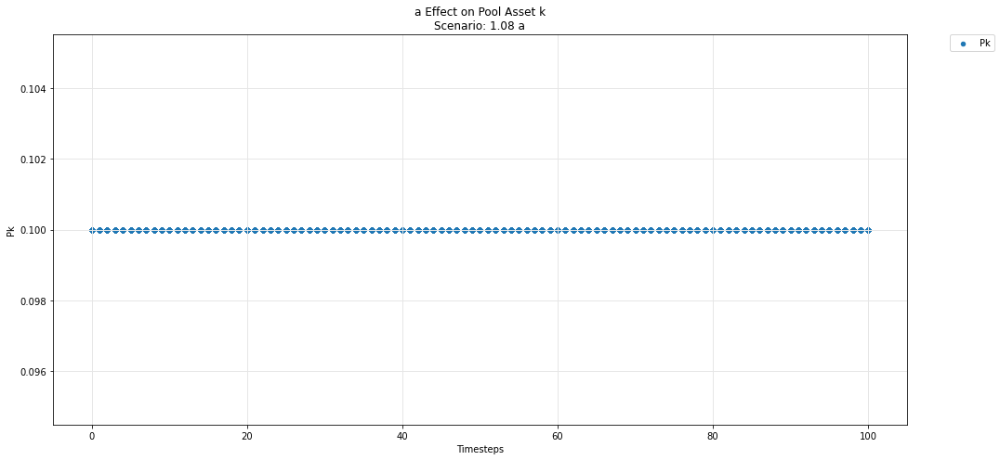

In [75]:
param_pool_plot(experiments, config_ids, 'a','k','P')